#### Importing libraries

In [212]:
import pandas as pd # for data manipulation
import glob # for reading files in a random order
import matplotlib.pyplot as plt #for plotting
import matplotlib.dates as mdates
import talipp as ta
from talipp.indicators import ADX
import talib as tb
import math as mth
import numpy as np
# importing the random module
import random
import lightgbm as lgb
import sklearn.metrics
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
import optuna
import pickle



##### Accessing the databases

In [213]:
#Getting a CSV files list from a folder
file_path1 = './TrainingDatasets/AAPL.csv'

#Reading all CSV files in a list
appleDb = pd.read_csv(file_path1)
#print(appleDb.to_string()) - to view the original dataframe

# Convert Date column to datetime object
appleDb['Date'] = pd.to_datetime(appleDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2008
appleDb = appleDb[pd.to_datetime(appleDb['Date']).dt.year >= 2008]

print(appleDb.to_string())



                           Date        Open        High         Low       Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00    6.057227    6.087320    5.852958    5.922567  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00    5.939894    6.000080    5.857214    5.925303   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00    5.819521    5.866637    5.437734    5.472994  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00    5.509470    5.580904    5.174495    5.399737  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00    5.475730    5.546252    5.191822    5.205501  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00    5.207020    5.456276    5.115829    5.453237  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00    5.397914    5.501872    5.331953    5.411289  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00    5.349886    5.406121    5.167

In [214]:
#Getting a CSV files list from a folder
file_path2 = './TrainingDatasets/AAL.csv'

#Reading all CSV files in a list
americanAirlineDb = pd.read_csv(file_path2)
#print(americanAirlineDb.to_string())

# Convert Date column to datetime object
americanAirlineDb['Date'] = pd.to_datetime(americanAirlineDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2010
americanAirlineDb = americanAirlineDb[pd.to_datetime(americanAirlineDb['Date']).dt.year >= 2010]

print(americanAirlineDb.to_string())

                          Date       Open       High        Low      Close     Volume  Dividends  Stock Splits
1074 2010-01-04 05:00:00+00:00   4.562868   4.657142   4.393175   4.496876    9837300        0.0           0.0
1075 2010-01-05 05:00:00+00:00   4.515733   5.062523   4.440314   5.005959   25212000        0.0           0.0
1076 2010-01-06 05:00:00+00:00   4.892829   5.071950   4.713708   4.798555   16597900        0.0           0.0
1077 2010-01-07 05:00:00+00:00   4.770271   5.119086   4.760844   4.939965   14033400        0.0           0.0
1078 2010-01-08 05:00:00+00:00   4.968248   5.119086   4.770272   4.845691   12760000        0.0           0.0
1079 2010-01-11 05:00:00+00:00   4.836264   4.930538   4.657143   4.751417   10952900        0.0           0.0
1080 2010-01-12 05:00:00+00:00   4.770273   4.855119   4.675998   4.789127    7870300        0.0           0.0
1081 2010-01-13 05:00:00+00:00   4.826836   5.185077   4.732562   5.166223   16400500        0.0           0.0
1

In [215]:
#Getting a CSV files list from a folder
file_path3 = './TrainingDatasets/APA.csv'

#Reading all CSV files in a list
apacheCorpDb = pd.read_csv(file_path3)
#print(apacheCorpDb.to_string())

# Convert Date column to datetime object
apacheCorpDb['Date'] = pd.to_datetime(apacheCorpDb['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

# Filter rows based on condition - starting from the year 2010
apacheCorpDb = apacheCorpDb[pd.to_datetime(apacheCorpDb['Date']).dt.year >= 2010]

print(apacheCorpDb.to_string())

                           Date        Open        High         Low       Close    Volume  Dividends  Stock Splits
7731  2010-01-04 05:00:00+00:00   85.830924   87.074136   85.495580   86.591576   2364900      0.000           0.0
7732  2010-01-05 05:00:00+00:00   86.681527   87.646654   86.076273   87.613937   2464500      0.000           0.0
7733  2010-01-06 05:00:00+00:00   87.335874   89.086189   86.836951   88.988045   2894500      0.000           0.0
7734  2010-01-07 05:00:00+00:00   88.595451   88.595451   86.845135   87.638504   2412200      0.000           0.0
7735  2010-01-08 05:00:00+00:00   86.787898   87.352254   85.790053   87.180489   4106000      0.000           0.0
7736  2010-01-11 05:00:00+00:00   87.883855   88.521826   86.591570   87.442192   2352600      0.000           0.0
7737  2010-01-12 05:00:00+00:00   86.199000   87.041441   85.683722   86.117210   3003100      0.000           0.0
7738  2010-01-13 05:00:00+00:00   85.487415   87.597611   85.192975   87.368599 

The dataset contains the following stock prices for 
- AAPL which stands for the Apple Inc. company. 
- AAL which stands for the American Airlines Group Inc. for Major Airlines
- APA which stands for the Apache Corporation for independent oil and gas

This dataset contains the following information:

Date: This is the date that the stock market was open (i.e. the day that the stock was traded). It's usually listed in a format like "MM/DD/YYYY" (month/day/year).

Open: This is the price at which the stock opened for trading on that particular day. It's the price that the first trade was made at.

High: This is the highest price that the stock reached during trading on that day.

Low: This is the lowest price that the stock reached during trading on that day.

Close: This is the price at which the stock closed for trading on that particular day. It's the price that the last trade was made at.

Volume: This is the total number of shares that were traded on that particular day. It's a measure of how active the market was for that stock on that day.

Dividends: These are payments that companies sometimes make to their shareholders as a way of distributing profits. They're usually paid out on a regular basis (e.g. quarterly) and are typically a percentage of the company's earnings.

Stock Splits: This is when a company decides to divide its existing shares into multiple shares. For example, if a company had 1 million shares outstanding and decided to do a 2-for-1 stock split, there would then be 2 million shares outstanding, but each share would be worth half as much as before. Companies often do stock splits to make their shares more affordable to individual investors.

#### Converting the prices into logs representation

In [216]:
#checking how all the columns are listed in the dataframe
appleDb.columns
americanAirlineDb.columns
apacheCorpDb.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits'],
      dtype='object')

In [217]:
#checking how all the rows are listed in the dataframe
appleDb.index
americanAirlineDb.index
apacheCorpDb.index


Int64Index([ 7731,  7732,  7733,  7734,  7735,  7736,  7737,  7738,  7739,
             7740,
            ...
            11064, 11065, 11066, 11067, 11068, 11069, 11070, 11071, 11072,
            11073],
           dtype='int64', length=3343)

In [218]:
print(appleDb.to_string())


def changeValuesIntoLogs(df):
    df['Open'] = df['Open'].apply(lambda x: mth.log(x))
    df['High'] = df['High'].apply(lambda x: mth.log(x))
    df['Low'] = df['Low'].apply(lambda x: mth.log(x))
    df['Close'] = df['Close'].apply(lambda x: mth.log(x))
    return df

appleDb = changeValuesIntoLogs(appleDb)

                           Date        Open        High         Low       Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00    6.057227    6.087320    5.852958    5.922567  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00    5.939894    6.000080    5.857214    5.925303   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00    5.819521    5.866637    5.437734    5.472994  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00    5.509470    5.580904    5.174495    5.399737  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00    5.475730    5.546252    5.191822    5.205501  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00    5.207020    5.456276    5.115829    5.453237  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00    5.397914    5.501872    5.331953    5.411289  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00    5.349886    5.406121    5.167

In [219]:
print("After converting with logs")


After converting with logs


In [220]:
print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits
6826  2008-01-02 05:00:00+00:00  1.801252  1.806208  1.766947  1.778770  1079178800   0.000000           0.0
6827  2008-01-03 05:00:00+00:00  1.781691  1.791773  1.767674  1.779232   842066400   0.000000           0.0
6828  2008-01-04 05:00:00+00:00  1.761218  1.769281  1.693362  1.699826  1455832000   0.000000           0.0
6829  2008-01-07 05:00:00+00:00  1.706469  1.719351  1.643742  1.686350  2072193200   0.000000           0.0
6830  2008-01-08 05:00:00+00:00  1.700326  1.713122  1.647085  1.649716  1523816000   0.000000           0.0
6831  2008-01-09 05:00:00+00:00  1.650008  1.696767  1.632339  1.696209  1813882000   0.000000           0.0
6832  2008-01-10 05:00:00+00:00  1.686013  1.705088  1.673718  1.688487  1482975200   0.000000           0.0
6833  2008-01-11 05:00:00+00:00  1.677075  1.687532  1.642390  1.658089  1232285600   0.000000           0.0
6834  2008-01-14 05

#### Graphs Representations

Open Graphs - The opening price of the stock on that day. This helps to identify trends in the stock's price and evaluate whether the stock is undervalued or overvalued.

In [221]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the open prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Open'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Open'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Open'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Open', va='center', rotation='vertical')

# # display the plot
# plt.show()

High Graphs - The highest price the stock reached during the day. This helps to identify how volatile the stock is and how much potential upside there is.

In [222]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the high prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['High'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['High'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['High'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'High', va='center', rotation='vertical')

# # display the plot
# plt.show()

Low Graphs -  The lowest price the stock reached during the day. This helps you evaluate how risky the stock is and how much potential downside there is.

In [223]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the low prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Low'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Low'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Low'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Low', va='center', rotation='vertical')

# # display the plot
# plt.show()

Closing Graphs - The closing price of the stock on that day. This can helps to evaluate how the stock performed over the course of the day and whether it ended up in positive or negative territory.

In [224]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the close prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Close'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Close'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Close'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Closing', va='center', rotation='vertical')

# # display the plot
# plt.show()

Volume Graphs - The total number of shares of the stock that were traded on that day. This helps to evaluate how active the market is for the stock and how much interest there is from other investors.

In [225]:
# #plotting the closing price of the stocks

# # create a figure and axis objects with 3 rows and 1 column
# fig, axs = plt.subplots(3, 1, figsize=(8, 10))

# # plot the close prices for each company on each axis object
# axs[0].plot(appleDb['Date'], appleDb['Volume'])
# axs[0].set_title('Apple Db')
# axs[1].plot(americanAirlineDb['Date'], americanAirlineDb['Volume'])
# axs[1].set_title('American Airline Db')
# axs[2].plot(apacheCorpDb['Date'], apacheCorpDb['Volume'])
# axs[2].set_title('Apache Corp Db')

# # adjust the space between subplots
# plt.subplots_adjust(hspace=0.5)

# # add a common x-label and y-label to the collage
# fig.text(0.5, 0.04, 'Date', ha='center')
# fig.text(0.04, 0.5, 'Volume', va='center', rotation='vertical')

# # display the plot
# plt.show()

#### Adding extra features into the dataframe to help the AI stock advisor to make better predictions. 

In [226]:
def priceChange(df):
    df['Price Change'] = df['Close'] - df['Close'].shift(1) #taking the closing price of the current day and subtracting it from the closing price of the previous day
    return df


By adding the Price Change in the data frame it will illustrate the percentage change between the previous closing price (of the previous day) and closing price of that day for each day. This can provide insight into the daily market sentiment of the stock. The reason for this is that the difference between the previous closing price and the closing price for a given day provides a good indication of the direction and magnitude of price movements for that day.

In [227]:
def priceVolatility(df):
    df['Price Volatility'] = df['High'] - df['Low'] #taking the high price of the day and subtracting it from the low price of the day
    return df



By adding the Price Volatility to the dataframe it refers to how much the price of a stock moves up and down over a certain period. The more a stock's price fluctuates (changes frequently), the higher its volatility. 

Note that the Volatility means the amount of uncertainty or risk related to the size of changes in a security's value

Volatility can be caused by various factors, such as changes in market conditions, news events, or investor sentiment. High volatility can indicate that the stock is more risky or uncertain, while low volatility can suggest that the stock is more stable and predictable. 

To work out the volatility of a stock taking the difference between the high and low prices of a stock. As stated before, the higher the difference, the more volatility. 

In [228]:
#calculating the SMA for the closing price of the stocks

def SMA(df,windowValue):
    df['SMA'] = tb.SMA(df['Close'], windowValue)
    return df



In [229]:
def TEMA(df,windowValue):
    df['EMA'] = tb.EMA(df['Close'], windowValue)
    return df






In [230]:
# # Plot SMA vs Closing Price
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,8))
# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['SMA'], label='SMA')
# ax1.set_title('SMA vs Closing Price')
# ax1.legend()

# # Plot TEMA vs Closing Price
# ax2.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax2.plot(appleDb['Date'],appleDb['TEMA'], label='TEMA')
# ax2.set_title('TEMA vs Closing Price')
# ax2.legend()

# plt.tight_layout()
# plt.show()

Moving Averages: 


Moving averages are a trend-following indicator that smooths out price fluctuations over a given period of time. They can be used to identify trends and potential reversal points in the stock's price.

The Simple Moving Average (SMA) is useful as it is a way to calculate the average price of a stock over a specific period of time. For example, if you want to calculate the SMA over the last 10 days, you would add up the prices of the stock from each of the last 10 days and divide that sum by 10.

The SMA is called "moving" because as each new day's price is added to the calculation, the oldest price is dropped, and the SMA "moves" to reflect the new set of prices.

The SMA can help to smooth out the daily fluctuations in the stock price and give you a better idea of the overall trend. If the SMA is moving up, it means that the stock price is generally increasing, and if the SMA is moving down, it means that the stock price is generally decreasing.

the simple moving average (SMA) is a calculation that helps to identify trends in the price of a stock over a specific time period. It is calculated by adding up the prices over a certain number of days, and then dividing by the number of days.

For example, if you want to calculate the 20-day SMA, you would add up the closing prices for the past 20 days and then divide by 20.

 The closing price is used because it is the final price of a trading day and is considered to be the most important price point for that day. Using closing prices over a period of time helps to reduce the impact of short-term price fluctuations and provides a more accurate picture of the trend over that time period.

The TEMA moving average is a technical analysis indicator that uses a triple exponential moving average to reduce the lag of the standard exponential moving average (EMA).

To calculate the TEMA, you first calculate a single EMA for a given period, then you calculate a second EMA of that first EMA, and then a third EMA of that second EMA. The formula for the TEMA is:

TEMA = 3 * (EMA1 - EMA2) + EMA3

where EMA1 is the first EMA, EMA2 is the second EMA of the first EMA, and EMA3 is the third EMA of the second EMA.

In [231]:
def ADX(df):
    df['ADX5'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=5)
    df['ADX10'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=10)
    df['ADX20'] = tb.ADX(df['High'],df['Low'], df['Close'], timeperiod=20)
    return df


# Plot Various ADX values
# fig, (ax1, ax2,ax3) = plt.subplots(3, 1, figsize=(10,8))
# ax1.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax1.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['ADX20'], label='ADX20')
# ax1.set_title('ADX20')
# ax1.legend()

# ax2.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax2.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax2.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax2.plot(appleDb['Date'],appleDb['ADX10'], label='ADX10')
# ax2.set_title('ADX10')
# ax2.legend()

# ax3.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax3.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax3.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax3.plot(appleDb['Date'],appleDb['ADX5'], label='ADX5')
# ax3.set_title('ADX5')
# ax3.legend()

# plt.tight_layout()
# plt.show()

Average Directional Movement Index(Momentum Indicator)

ADX can be used to help measure the overall strength of a trend. The ADX indicator is an average of expanding price range values. The Average Directional Movement Index (ADX) is a technical indicator that is based on the high, low, and close prices of a stock. The ADX helps to measure the strength of a trend, whether it's up or down, and its overall momentum.

The ADX is calculated using a formula that takes into account the price movements over a specific period of time. The indicator is based on the difference between the high and low prices and the current closing price. The ADX is usually plotted on a chart as a line that ranges between 0 and 100, with a higher value indicating a stronger trend.

To calculate the ADX for a stock, you would first need to determine the time period for which you want to calculate the indicator. This can vary depending on your strategy and the volatility of the stock you are analyzing. Once you have determined the time period, you can then use the high, low, and close prices for that period to calculate the ADX.

In [232]:
def ATR(df):
    df['ATR5'] = tb.ATR(df['High'], df['Low'], df['Close'], timeperiod=5)
    df['ATR10'] = tb.ATR(df['High'], df['Low'], df['Close'], timeperiod=10)
    return df

# ax1.plot(appleDb['Date'],appleDb['Close'], label='Closing Price')
# ax1.plot(appleDb['Date'],appleDb['High'], label='High Price')
# ax1.plot(appleDb['Date'],appleDb['Low'], label='Low Price')
# ax1.plot(appleDb['Date'],appleDb['ATR'], label='ATR',color='red')
# ax1.set_title('ATR vs Closing Price vs High Price vs Low Price')
# ax1.legend()


Average True Range (ATR): ATR is a measure of volatility that takes into account the daily price range of the stock. It can help predict potential price movement and can be useful for setting stop-loss orders.

The Average True Range (ATR) is another technical indicator that is commonly used by traders and investors to measure the volatility of a stock. While the ADX measures the strength of a trend, the ATR measures the volatility of the stock price.

The ATR is calculated using the difference between the high and low prices of a stock over a specific period of time. It takes into account any gaps or limit moves that may have occurred during that time period. The ATR is usually expressed in points or as a percentage of the stock price.

One key difference between the ADX and ATR is that the ADX is used to measure the strength of a trend, while the ATR is used to measure the volatility of the stock price. Another difference is that the ADX is calculated using the high, low, and close prices, while the ATR is calculated using only the high and low prices.

Both the ADX and ATR are useful indicators that can help traders and investors make informed decisions about buying and selling stocks. The ADX can help to identify strong trends, while the ATR can help to identify potential changes in volatility.

In [233]:
def RSI(df):
    df['RSI'] = tb.RSI(df['Close'], timeperiod=10)
    return df


# appleDb[['RSI']].plot(figsize=(12,10),marker='o')
# plt.axhline(y=30, color='green', linestyle='-')
# plt.axhline(y=70, color='red', linestyle='-')
# x = np.arange(0, len(appleDb['RSI']),0.1)
# appleDb['RSI'].tail(10)
# plt.title("Apple RSI")

Relative Strength Index (RSI): an indicator used in finance to help investors and traders understand whether a stock is overbought or oversold. It is a measure of the stock's recent price changes, and is expressed as a number between 0 and 100.

The RSI works by comparing the average price gains of a stock to its average price losses over a specific time period (usually 14 days). If the average gains are higher than the average losses, the RSI will be higher, indicating that the stock is in an uptrend. If the average losses are higher than the average gains, the RSI will be lower, indicating that the stock is in a downtrend.

Traders use the RSI to identify potential buy and sell signals. When the RSI is above 70, it is considered overbought, which means that the stock may be due for a price correction. When the RSI is below 30, it is considered oversold, which means that the stock may be undervalued and due for a price increase.

In [234]:
# appleDb['Upper_BBand'], appleDb['Mid_BBand'], appleDb['Lower_BBand'] = tb.BBANDS(appleDb['Close'], timeperiod =20)
# appleDb[['Close','Mid_BBand','Upper_BBand','Lower_BBand']].plot(figsize= (12,10))
# plt.title("Apple Bollinger Bands")
# plt.show()

def bbands(df):
    df['Upper_BBand5'], df['Mid_BBand5'], df['Lower_BBand5'] = tb.BBANDS(df['Close'], timeperiod =5)
    df['Upper_BBand10'], df['Mid_BBand10'], df['Lower_BBand10'] = tb.BBANDS(df['Close'], timeperiod =10)
    return df

Bollinger Bands is a tool that helps traders understand how much a stock's price tends to change over time. It consists of three lines on a chart: a middle line that represents the average price of the stock over a certain period (usually 20 days), and two additional lines that are drawn above and below the middle line.

These upper and lower lines are drawn at a distance that represents how much the stock's price has varied in the past. The distance is based on the stock's standard deviation, which is a measure of how much its price has fluctuated in the past.

When the stock's price is moving within the Bollinger Bands, it is considered to be trading within a normal range. However, when the stock's price moves above the upper line, it is considered to be overbought, meaning it may be due for a price correction. Conversely, when the stock's price moves below the lower line, it is considered to be oversold, meaning it may be due for a price increase.

Bollinger Bands can be a useful tool for traders to help identify potential buy and sell signals. 

In [235]:
# Calculate the MACD and Signal Line indicators
# appleDb["MACD"], appleDb["macd_signal"], appleDb["macd_hist"] = tb.MACD(appleDb["Close"], fastperiod=12, slowperiod=26, signalperiod=9)
# appleDb[['MACD','macd_signal','macd_hist']].plot(figsize= (12,10))
# plt.title("Apple MACD")
# plt.show()

def MACD(df):
    df["MACD"], df["macd_signal"], df["macd_hist"] = tb.MACD(df["Close"], fastperiod=5, slowperiod=20, signalperiod=9)
    return df

Moving Average Convergence Divergence (MACD): The MACD is a trend-following indicator that calculates the difference between two moving averages of the stock's price. It can help identify changes in the stock's trend and can be used to generate buy or sell signals.

The MACD is a trend-following indicator that measures the difference between a short-term moving average and a long-term moving average. It is typically used with a 12-day and 26-day moving average, and a 9-day signal line.


In [236]:
# # Calculate the On Balance Volume indicator
# appleDb['OBV'] = tb.OBV(appleDb['Close'], appleDb['Volume'])
# appleDb[['OBV','Close']].plot(figsize= (12,10))
# plt.title("Apple OBV")
# plt.show()
# print(appleDb.to_string())

def OBV(df):
    df['OBV'] = tb.OBV(df['Close'], df['Volume'])
    return df


On Balance Volume (OBV)

In [237]:
# # Calculate the Chaikin Money Flow indicator
# appleDb['MFI'] = tb.MFI(appleDb['High'], appleDb['Low'], appleDb['Close'], appleDb['Volume'])
# appleDb[['MFI','Close']].plot(figsize= (12,10))
# plt.title("Apple MFI")
# plt.show()
# print(appleDb.to_string())

def MFI(df):
    df['MFI'] = tb.MFI(df['High'], df['Low'], df['Close'], df['Volume'])
    return df


Money Flow Index (MFI)

#### Prediction of Close Price after a certain amount of days



In [238]:
def closePriceAfter(df):
    df['ClosePriceAfter10Days'] = df['Close'].shift(-10)
    df['ClosePriceAfter30Days'] = df['Close'].shift(-30)
    df['ClosePriceAfter60Days'] =df['Close'].shift(-60)
    df['ClosePriceAfter120Days'] = df['Close'].shift(-120)
    df['ClosePriceAfter365Days'] =df['Close'].shift(-365)
    return df

def differencePriceAfter(df):
    df['DifferenceAfter10Days'] = df['ClosePriceAfter10Days']-  df['Close']
    df['DifferenceAfter30Days'] = df['ClosePriceAfter30Days']-  df['Close']
    df['DifferenceAfter60Days'] = df['ClosePriceAfter60Days'] -  df['Close']
    df['DifferenceAfter120Days'] = df['ClosePriceAfter120Days']- df['Close']
    df['DifferenceAfter365Days'] = df['ClosePriceAfter365Days'] -  df['Close']
    return df



def obtainingExtraFeatures(df,windowValue):
    df = priceChange(df) 
    df = priceVolatility(df)
    df = SMA(df,windowValue)
    df = TEMA(df,windowValue)
    df = ADX(df)
    df = ATR(df)
    df = RSI(df)
    df = bbands(df)
    df = MACD(df)
    df = OBV(df)
    df = MFI(df)
    df = closePriceAfter(df)
    df = differencePriceAfter(df)
    return df


appleDb = obtainingExtraFeatures(appleDb,10)

print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits  Price Change  Price Volatility       SMA       EMA       ADX5      ADX10      ADX20      ATR5     ATR10        RSI  Upper_BBand5  Mid_BBand5  Lower_BBand5  Upper_BBand10  Mid_BBand10  Lower_BBand10      MACD  macd_signal  macd_hist           OBV           MFI  ClosePriceAfter10Days  ClosePriceAfter30Days  ClosePriceAfter60Days  ClosePriceAfter120Days  ClosePriceAfter365Days  DifferenceAfter10Days  DifferenceAfter30Days  DifferenceAfter60Days  DifferenceAfter120Days  DifferenceAfter365Days
6826  2008-01-02 05:00:00+00:00  1.801252  1.806208  1.766947  1.778770  1079178800   0.000000           0.0           NaN          0.039261       NaN       NaN        NaN        NaN        NaN       NaN       NaN        NaN           NaN         NaN           NaN            NaN          NaN            NaN       NaN          NaN        NaN  1.079179e+09           NaN               1.579513    

#### Splitting the dataset into training and testing datasets

In [239]:
def splittingTheDataset(database,nameOfPredictedColumn,predictionDays,testSize,randomState):
    database = database.iloc[:-predictionDays]
    print(database)
    inputFeatureDatabase = database[['Open','High','Low','Close','Volume','Dividends','Stock Splits','Price Change','Price Volatility','SMA','EMA','ADX5','ADX10','ADX20',
                                     'ATR5','ATR10','RSI', 'Upper_BBand5','Mid_BBand5','Lower_BBand5','Upper_BBand10','Mid_BBand10','Lower_BBand10','MACD','macd_signal','macd_hist',
                                     'OBV','MFI', 'DifferenceAfter10Days','DifferenceAfter30Days','DifferenceAfter60Days','DifferenceAfter120Days','DifferenceAfter365Days']]

    targetOutputVariable = database[[nameOfPredictedColumn]]
    
    #splitting the dataset into train and test using the train_test_split function -This splits the data into 80% training data and 20% testing data
    inputFeatureDatabase_Train, inputFeatureDatabase_Test, targetOutputVariable_Train, targetOutputVariable_Test = train_test_split(inputFeatureDatabase, targetOutputVariable, test_size=testSize, random_state=randomState)
    
    return inputFeatureDatabase_Train, inputFeatureDatabase_Test, targetOutputVariable_Train, targetOutputVariable_Test 

def obtainRecentRecords(database):
    # Convert Date column to datetime object
    database['Date'] = pd.to_datetime(database['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

    # Filter rows based on condition - starting from the year 2010
    database = database[pd.to_datetime(database['Date']).dt.year >= 2010]
    

    return database

appleDb = obtainRecentRecords(appleDb)
print(appleDb.to_string())

                           Date      Open      High       Low     Close      Volume  Dividends  Stock Splits  Price Change  Price Volatility       SMA       EMA       ADX5      ADX10      ADX20      ATR5     ATR10        RSI  Upper_BBand5  Mid_BBand5  Lower_BBand5  Upper_BBand10  Mid_BBand10  Lower_BBand10      MACD  macd_signal  macd_hist           OBV        MFI  ClosePriceAfter10Days  ClosePriceAfter30Days  ClosePriceAfter60Days  ClosePriceAfter120Days  ClosePriceAfter365Days  DifferenceAfter10Days  DifferenceAfter30Days  DifferenceAfter60Days  DifferenceAfter120Days  DifferenceAfter365Days
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   493729600   0.000000           0.0      0.015445          0.009933  1.835099  1.839979  57.211129  29.599548  15.609753  0.018729  0.020197  70.891291      1.875435    1.860400      1.845365       1.895909     1.835099       1.774290  0.035407     0.022751   0.012656  3.060851e+09  80.650093               1.877415          

The train_test_split function splits the input data into two subsets: one for training the model and the other for testing the model. The function returns four outputs, which are:

inputFeatureDatabase_Train: the feature data for training the model.
inputFeatureDatabase_Test: the feature data for testing the model.
targetOutputVariable_Train: the target data (labels) for training the model.
targetOutputVariable_Test: the target data (labels) for testing the model.
So, inputFeatureDatabase_Train and targetOutputVariable_Train are used to train the model, while inputFeatureDatabase_Test and targetOutputVariable_Test are used to evaluate the performance of the model on unseen data.

The random_state=42 parameter in the train_test_split() function sets the random seed for the data splitting process. This ensures that the data is split in the same way every time the code is run, which is useful for reproducibility and debugging purposes. The value 42 is an arbitrary number and can be any non-negative integer.

#### Defining the parameters for the AI Model 

The parameters provided above are used to configure a machine learning model that uses the LightGBM library for gradient boosting. Here's an explanation of each parameter:

task: The task parameter specifies whether the model should be used for training ('train'), prediction ('predict'), or other tasks.

boosting: The boosting parameter specifies the type of boosting algorithm to use. In this case, 'gbdt' stands for Gradient Boosting Decision Tree, which is a popular algorithm for supervised learning tasks like regression and classification.

objective: The objective parameter specifies the loss function to be optimized during training. In this case, 'regression' indicates that the model is being trained to perform a regression task, where the goal is to predict a continuous numerical value.

num_leaves: The num_leaves parameter controls the number of leaves (or nodes) in each decision tree of the gradient boosting algorithm. Increasing this value can lead to more complex models with better performance, but also increases the risk of overfitting.

learning_rate: The learning_rate parameter controls the step size at each iteration of the gradient boosting algorithm. A smaller learning rate can lead to more accurate models, but also requires more iterations to converge.

metric: The metric parameter specifies the evaluation metric(s) to be used during training. In this case, {'l2', 'l1'} indicates that the mean squared error (l2) and mean absolute error (l1) will be used to evaluate the model's performance during training.

verbose: The verbose parameter controls the amount of output printed during training. A value of -1 means that no output will be printed.

Overall, these parameters are used to configure a gradient boosting model that is optimized for a regression task, using a decision tree as the base estimator. The specific values for each parameter may need to be tuned for optimal performance on a given dataset.

In [275]:
# laoding data into lightgbm -  taking the training and testing data and converting them into formats that can be used by the LightGBM model for training and evaluation.
def changingIntoLightGBMformat(inputFeatureDatasetTrain, targetOutputVariable_Train, inputFeatureDatasetTest, targetOutputVariable_Test):
    lgb_ToTrainModel = lgb.Dataset(inputFeatureDatasetTrain, label = targetOutputVariable_Train)
    lgb_evalualtePerformanceDuringTraining = lgb.Dataset(inputFeatureDatasetTest, label = targetOutputVariable_Test, reference=lgb_ToTrainModel)
    return lgb_ToTrainModel, lgb_evalualtePerformanceDuringTraining

# fitting the model

def buildModel(params, lgb_ToTrainModel, lgb_evalualtePerformanceDuringTraining,num_boost_round):
    evals_result = {}  # to record loss for each iteration
    model = lgb.train(
        params,
        train_set=lgb_ToTrainModel,
        num_boost_round=num_boost_round,
        valid_sets=[lgb_ToTrainModel,lgb_evalualtePerformanceDuringTraining],
        valid_names=['Train', 'Test'],
        # early_stopping_rounds=early_stopping_rounds,
        evals_result=evals_result,  # pass this to collect loss info
        verbose_eval=False,
    )
    return model, evals_result

#predicting the output values
def prediction(model, inputFeatureDatabase_Test):
    predictedOutputValues = model.predict(inputFeatureDatabase_Test)
    return predictedOutputValues

#accuracy check - using the mean squared error and root mean squared error
def calculateMSERmse(targetOutputVariable_Test, predictedOutputValues):
    mse = mean_squared_error(targetOutputVariable_Test, predictedOutputValues)
    rmse = mse**(0.5)
    return mse, rmse


lgb.Dataset(inputFeatureDatabase_Train, targetOutputVariable_Train) is creating a LightGBM dataset object called lgb_ToTrainModel using the training data, inputFeatureDatabase_Train and targetOutputVariable_Train. This dataset will be used to train the LightGBM model.
lgb.Dataset(inputFeatureDatabase_Test, targetOutputVariable_Test, reference=lgb_ToTrainModel) is creating another LightGBM dataset object called lgb_evalualtePerformanceDuringTraining using the testing data, inputFeatureDatabase_Test and targetOutputVariable_Test. This dataset will be used to evaluate the performance of the LightGBM model during training.

Why minimising the loss was chosen rather than maximising the prediction:

Maximizing the prediction means trying to make the model's predictions as accurate as possible, regardless of the cost of making a mistake. In other words, the focus is on optimizing the model's ability to make correct predictions, without considering the cost of getting things wrong. This approach is often used when the consequences of making a mistake are not severe, or when the cost of getting things right is much higher than the cost of getting things wrong.

On the other hand, minimizing the loss means trying to make the model's predictions as accurate as possible, while also minimizing the cost of making a mistake. In this approach, the focus is on optimizing the model's ability to balance the trade-off between making correct predictions and avoiding mistakes that have high costs. This approach is often used when the cost of making a mistake is high, such as in medical diagnosis or financial forecasting.

#### Training the model 

#### Building the Model for 30 Day Prediction

[I 2023-05-20 02:31:17,462] A new study created in memory with name: no-name-16221e55-21fa-4290-9e18-28c96610cf73


                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10639 2023-02-24 05:00:00+00:00  4.991181  4.991724  4.981687  4.988458   
10640 2023-02-27 05:00:00+00:00  4.995251  5.005087  4.993489  4.996672   
10641 2023-02-28 05:00:00+00:00  4.990773  5.004483  4.989275  4.993218   
10642 2023-03-01 05:00:00+00:00  4.989275  4.991996  4.976803  4.978869   
10643 2023-03-02 05:00:00+00:00  4.972449  4.988458  4.969119  4.982990   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


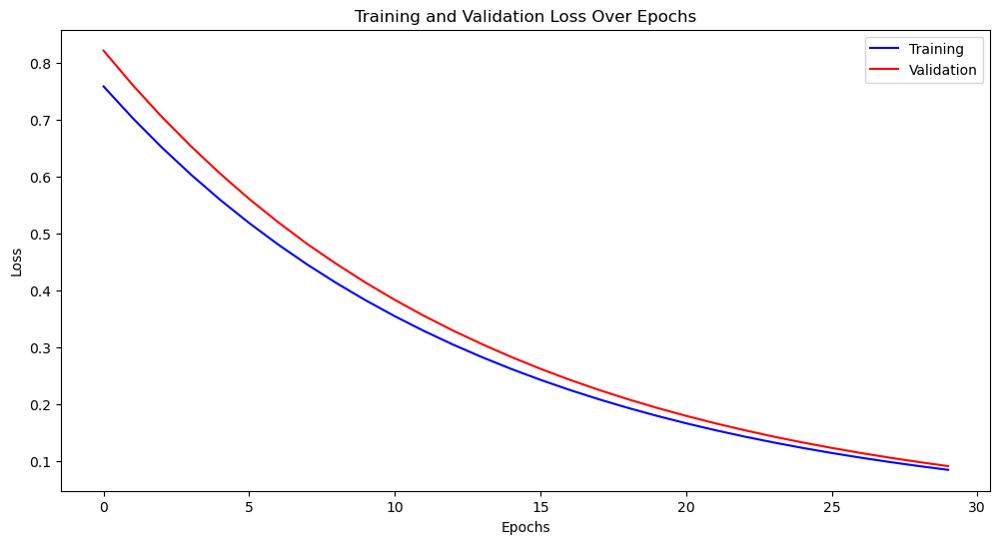

[I 2023-05-20 02:31:17,678] Trial 0 finished with value: 0.09162447386169636 and parameters: {'num_leaves': 18, 'learning_rate': 0.03770306898437257}. Best is trial 0 with value: 0.09162447386169636.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


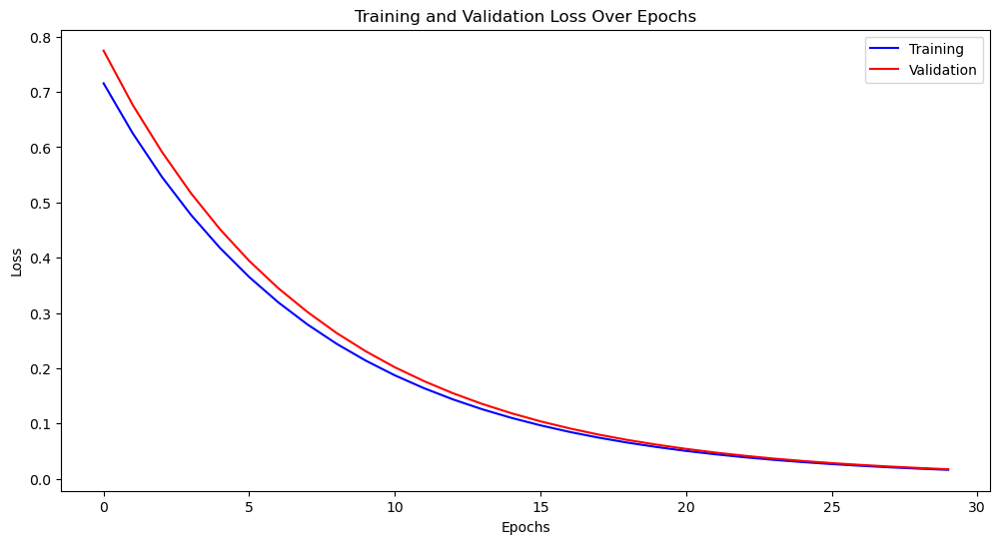

[I 2023-05-20 02:31:17,874] Trial 1 finished with value: 0.01727246450889318 and parameters: {'num_leaves': 14, 'learning_rate': 0.06607479327703772}. Best is trial 1 with value: 0.01727246450889318.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


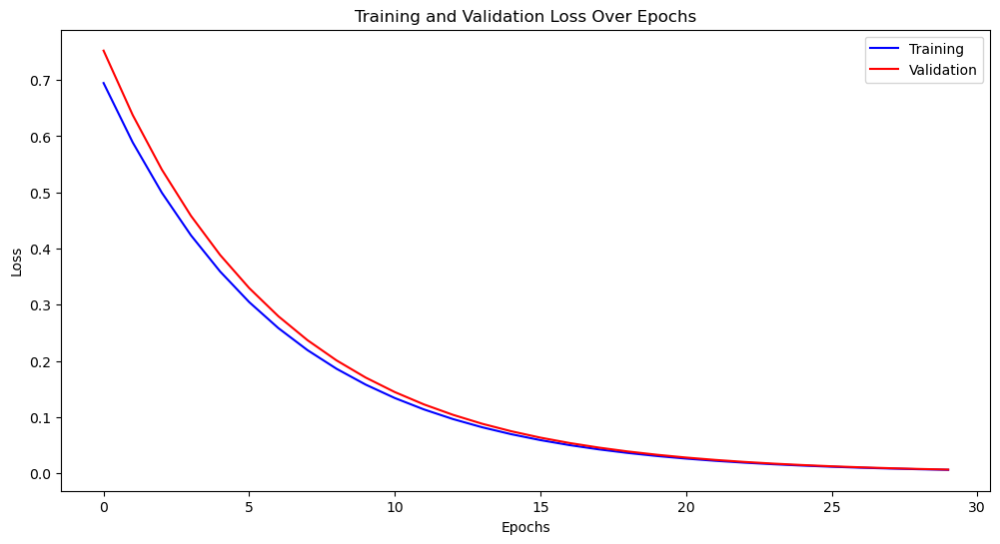

[I 2023-05-20 02:31:18,093] Trial 2 finished with value: 0.006720668623966135 and parameters: {'num_leaves': 34, 'learning_rate': 0.07955029110454843}. Best is trial 2 with value: 0.006720668623966135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


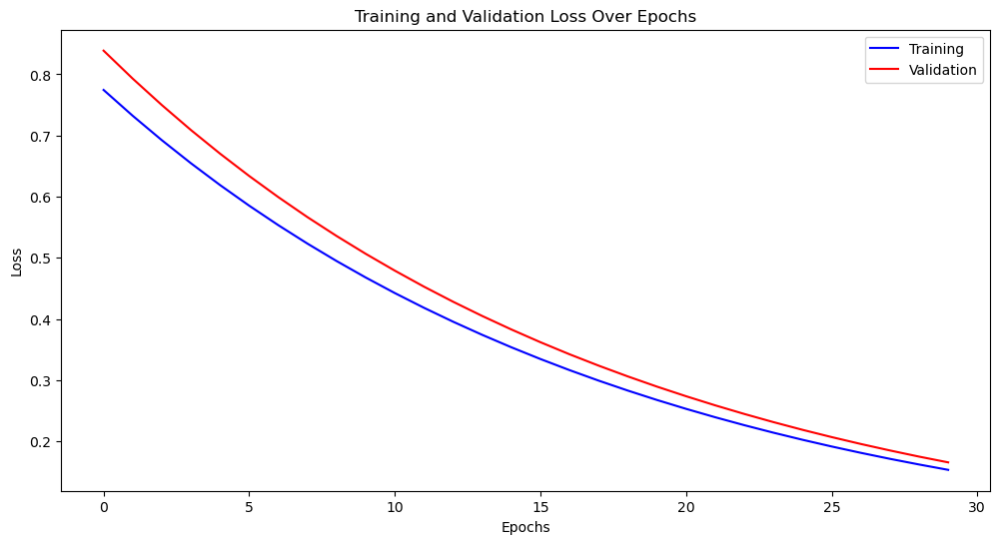

[I 2023-05-20 02:31:18,306] Trial 3 finished with value: 0.1656698374427117 and parameters: {'num_leaves': 24, 'learning_rate': 0.027824822263495114}. Best is trial 2 with value: 0.006720668623966135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


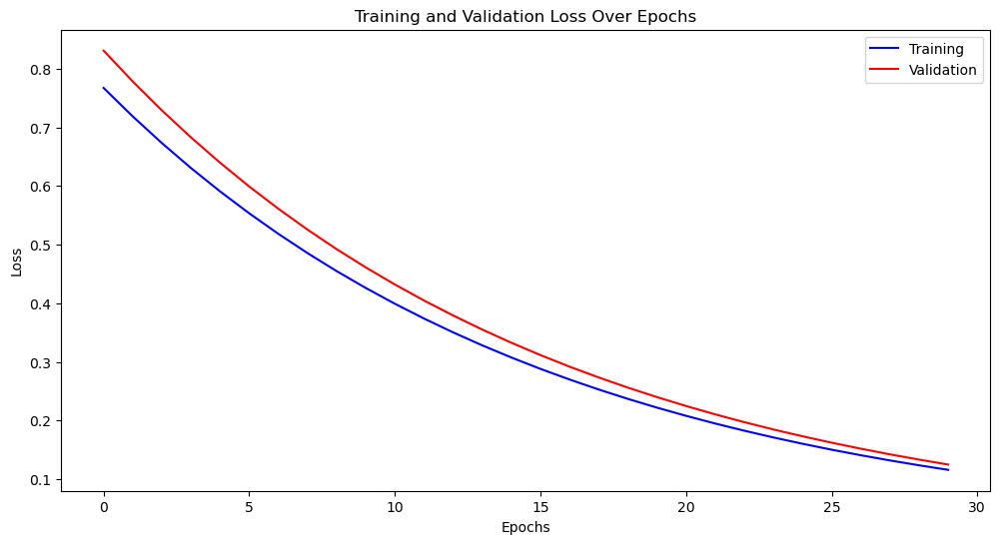

[I 2023-05-20 02:31:18,560] Trial 4 finished with value: 0.12482950484234329 and parameters: {'num_leaves': 32, 'learning_rate': 0.032331554261475354}. Best is trial 2 with value: 0.006720668623966135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


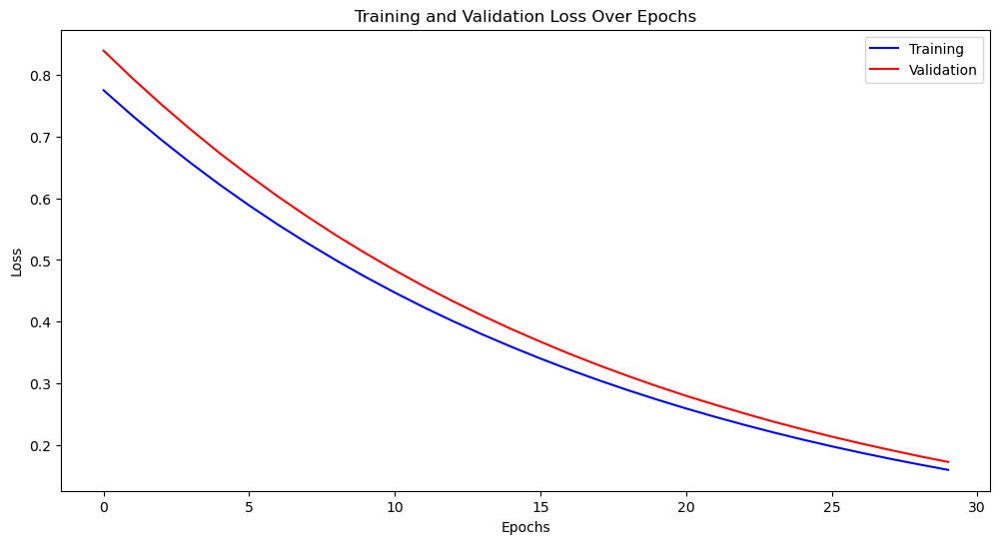

[I 2023-05-20 02:31:18,778] Trial 5 finished with value: 0.17254627006560094 and parameters: {'num_leaves': 9, 'learning_rate': 0.027723548000590896}. Best is trial 2 with value: 0.006720668623966135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


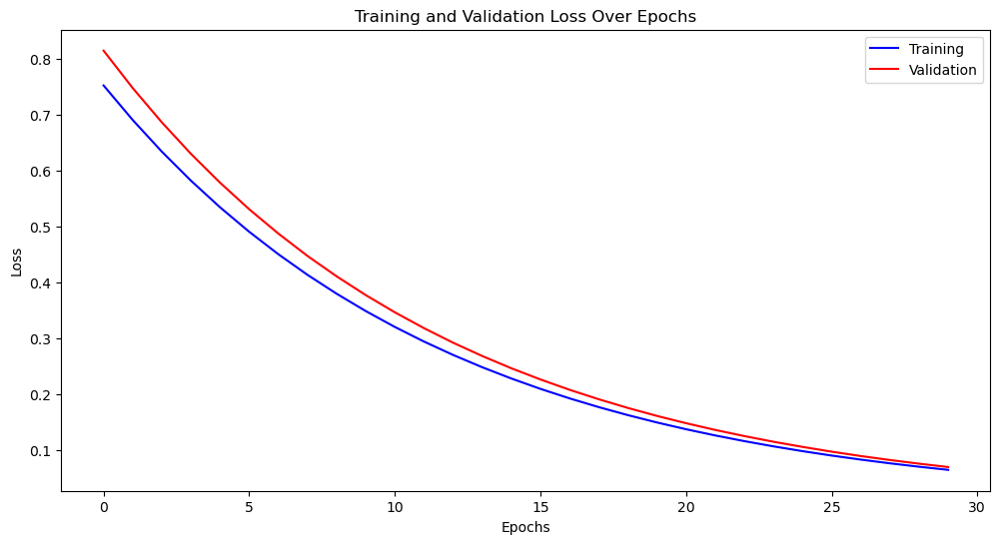

[I 2023-05-20 02:31:18,997] Trial 6 finished with value: 0.06902210029437444 and parameters: {'num_leaves': 21, 'learning_rate': 0.0422816666807847}. Best is trial 2 with value: 0.006720668623966135.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


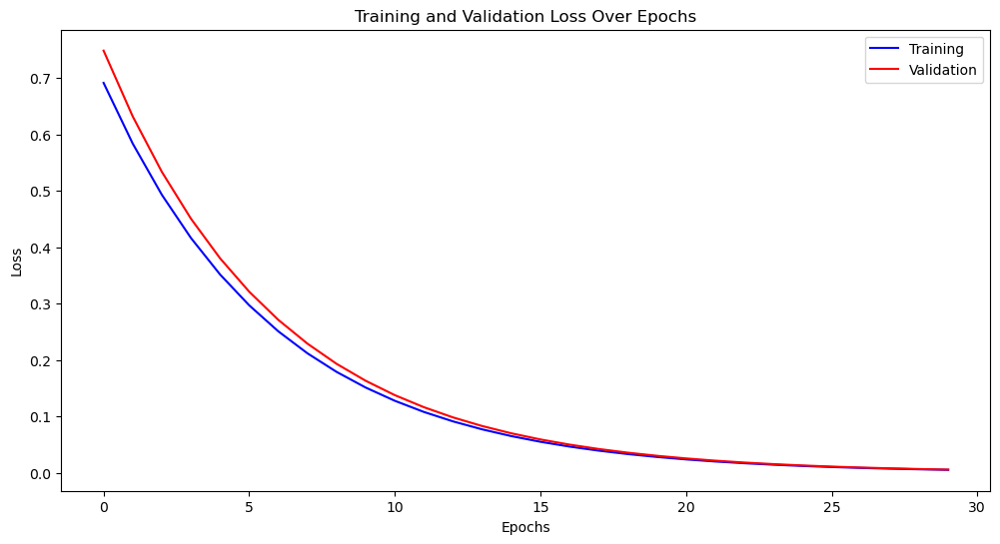

[I 2023-05-20 02:31:19,248] Trial 7 finished with value: 0.005892483236934647 and parameters: {'num_leaves': 46, 'learning_rate': 0.0813320613146023}. Best is trial 7 with value: 0.005892483236934647.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


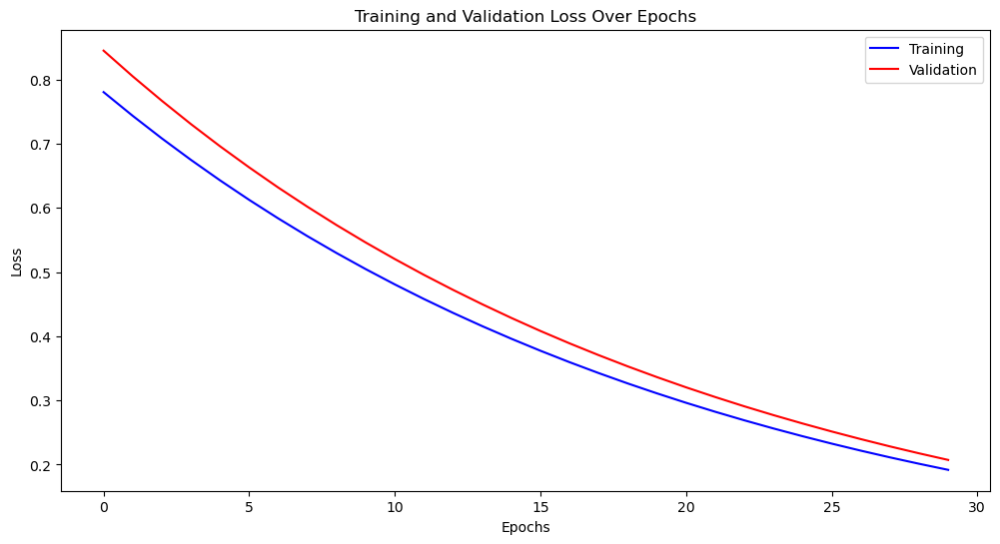

[I 2023-05-20 02:31:19,463] Trial 8 finished with value: 0.20724624588390958 and parameters: {'num_leaves': 38, 'learning_rate': 0.024041863426995682}. Best is trial 7 with value: 0.005892483236934647.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


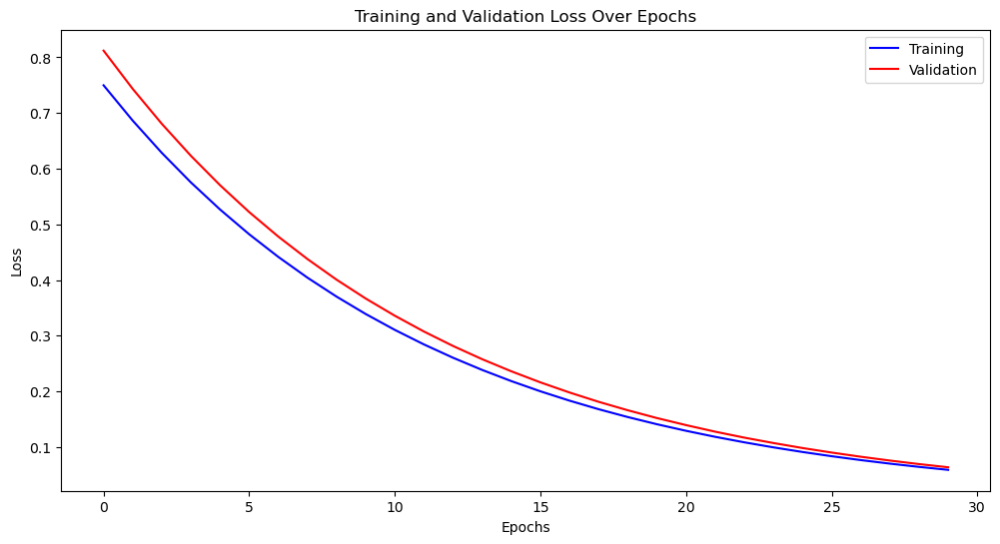

[I 2023-05-20 02:31:19,674] Trial 9 finished with value: 0.0635287802897866 and parameters: {'num_leaves': 24, 'learning_rate': 0.04352918403113974}. Best is trial 7 with value: 0.005892483236934647.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


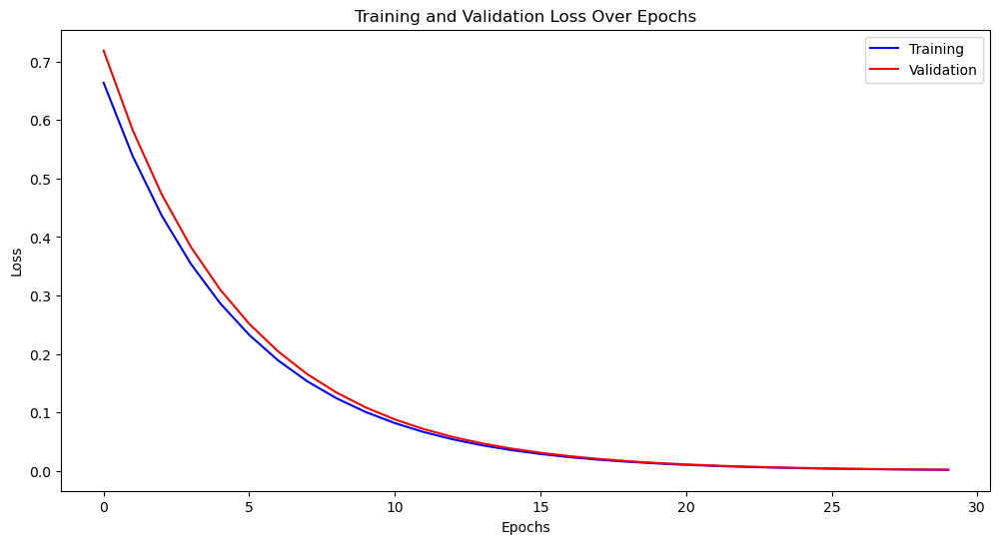

[I 2023-05-20 02:31:20,109] Trial 10 finished with value: 0.0019609762635842023 and parameters: {'num_leaves': 50, 'learning_rate': 0.09999310609647763}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


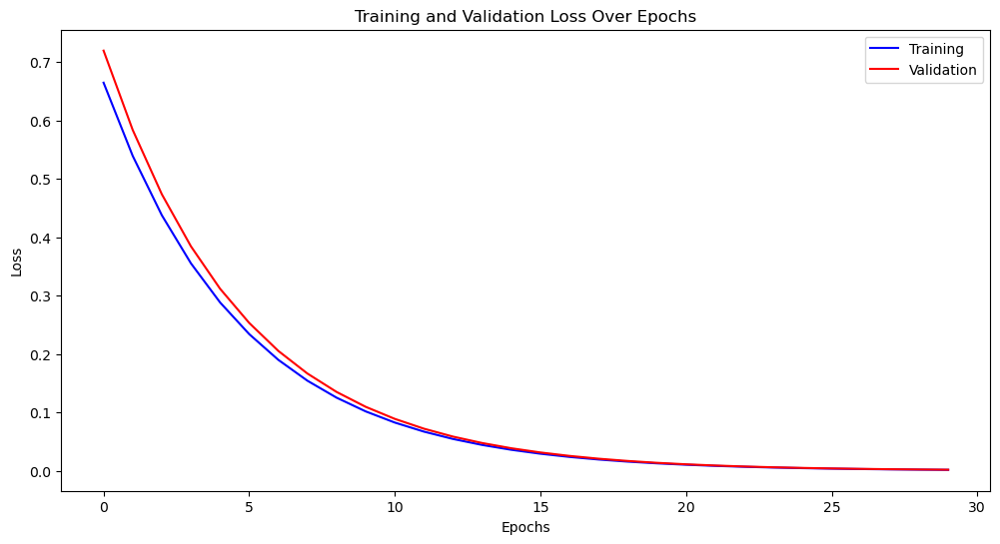

[I 2023-05-20 02:31:20,350] Trial 11 finished with value: 0.002002655649629773 and parameters: {'num_leaves': 49, 'learning_rate': 0.09946763252845255}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


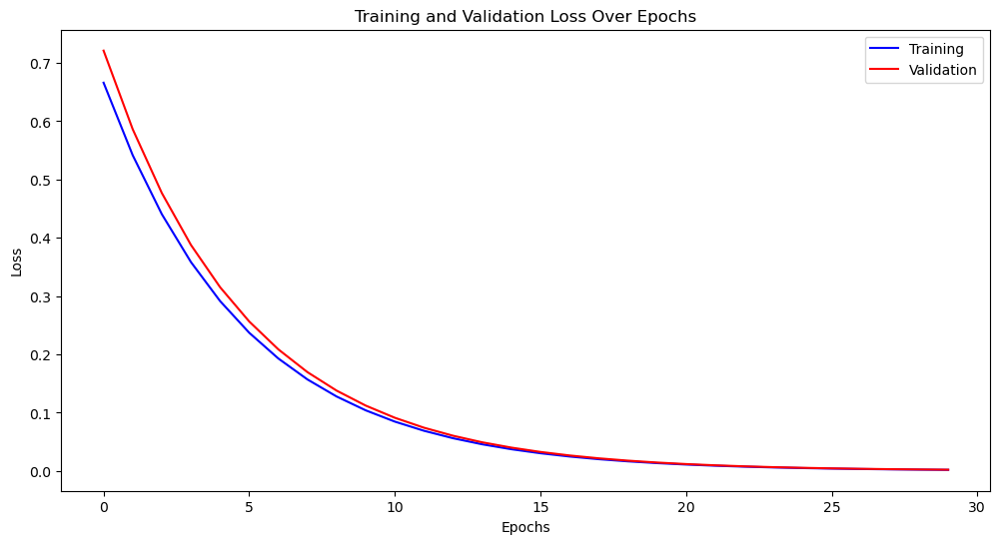

[I 2023-05-20 02:31:20,594] Trial 12 finished with value: 0.0021295956780173152 and parameters: {'num_leaves': 50, 'learning_rate': 0.0985125481186582}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


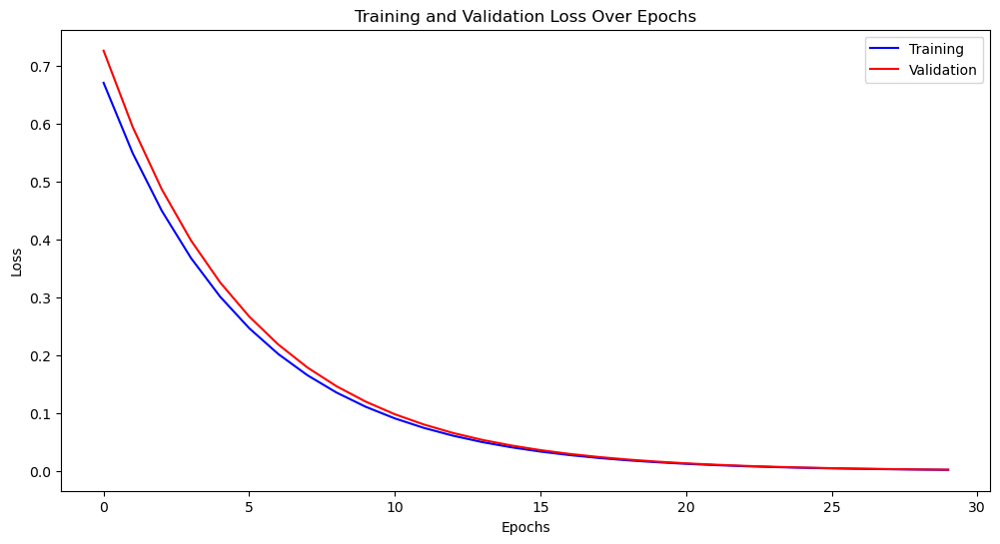

[I 2023-05-20 02:31:20,827] Trial 13 finished with value: 0.0025395565011608738 and parameters: {'num_leaves': 42, 'learning_rate': 0.09556540066509085}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


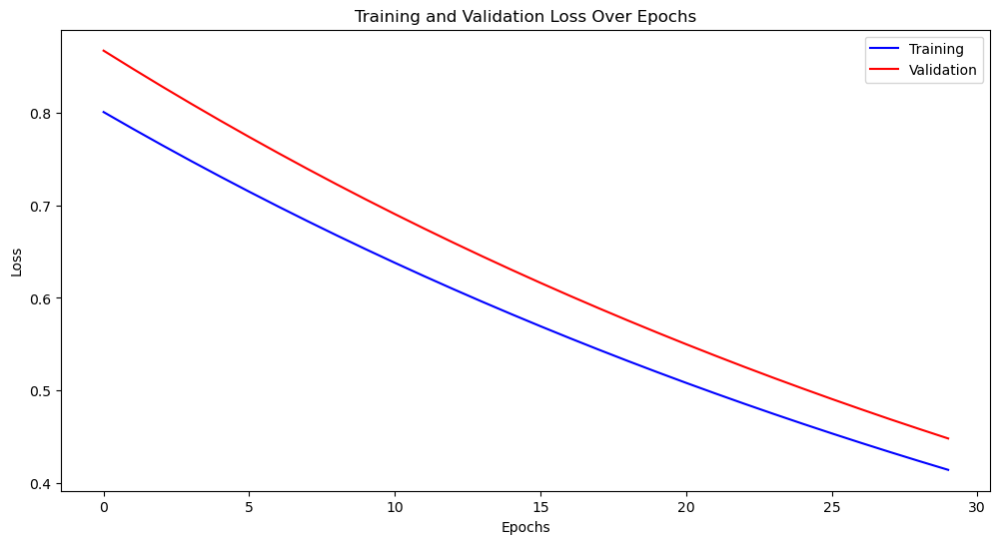

[I 2023-05-20 02:31:21,059] Trial 14 finished with value: 0.44825969785172043 and parameters: {'num_leaves': 50, 'learning_rate': 0.011331750407030189}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


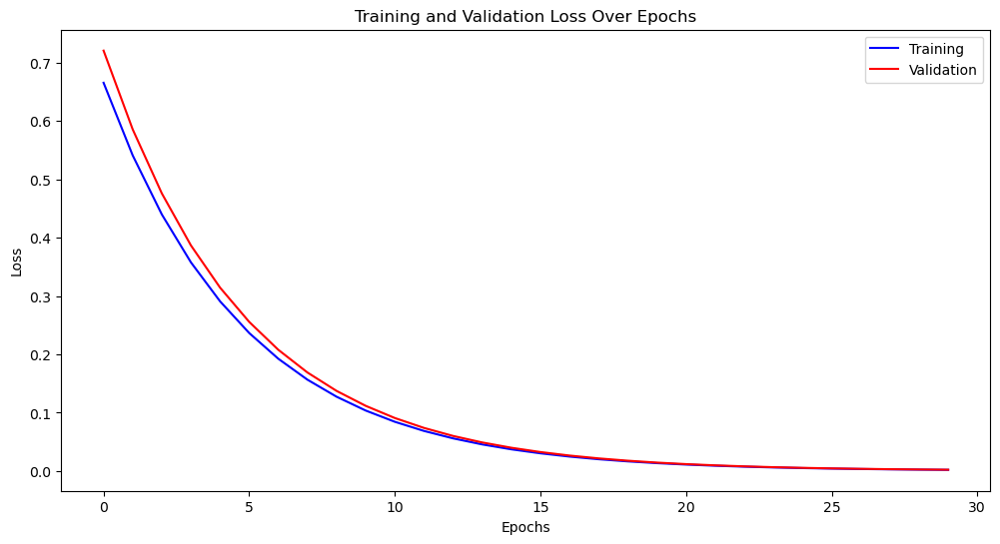

[I 2023-05-20 02:31:21,294] Trial 15 finished with value: 0.002120480569077004 and parameters: {'num_leaves': 42, 'learning_rate': 0.09877444942614749}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


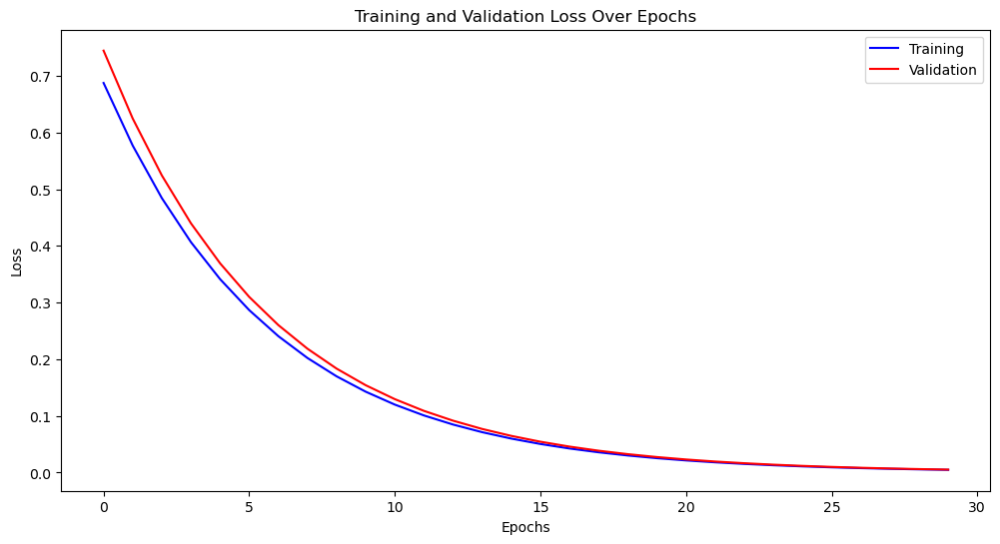

[I 2023-05-20 02:31:21,517] Trial 16 finished with value: 0.0051822503058473485 and parameters: {'num_leaves': 30, 'learning_rate': 0.08435592353644808}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


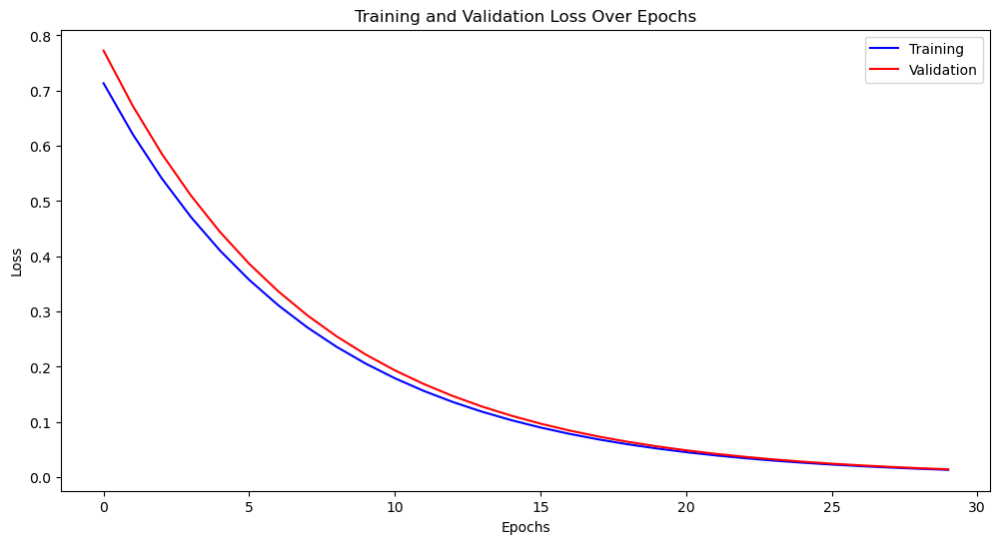

[I 2023-05-20 02:31:21,752] Trial 17 finished with value: 0.014306016904527052 and parameters: {'num_leaves': 43, 'learning_rate': 0.06707750033842982}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


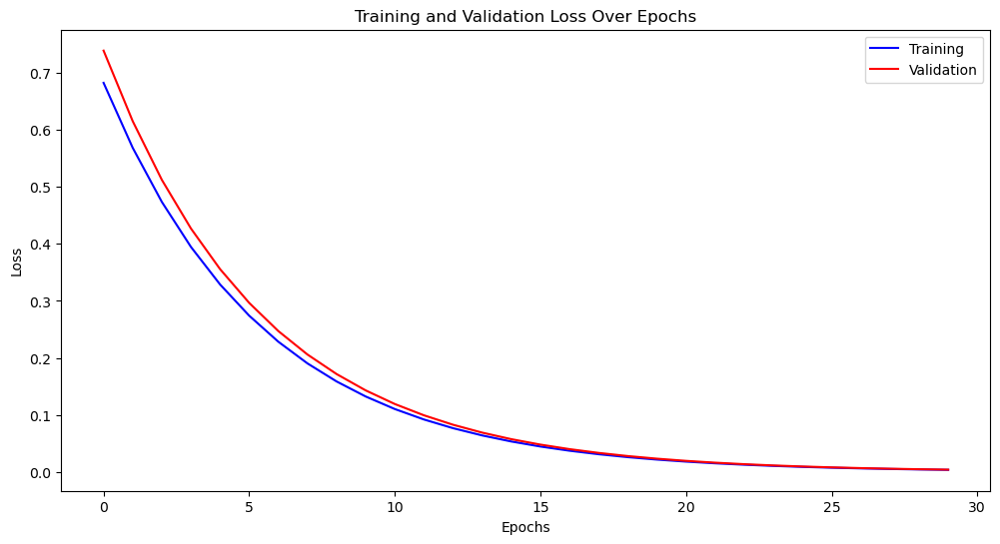

[I 2023-05-20 02:31:21,983] Trial 18 finished with value: 0.00412384599075575 and parameters: {'num_leaves': 36, 'learning_rate': 0.08766465934728417}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


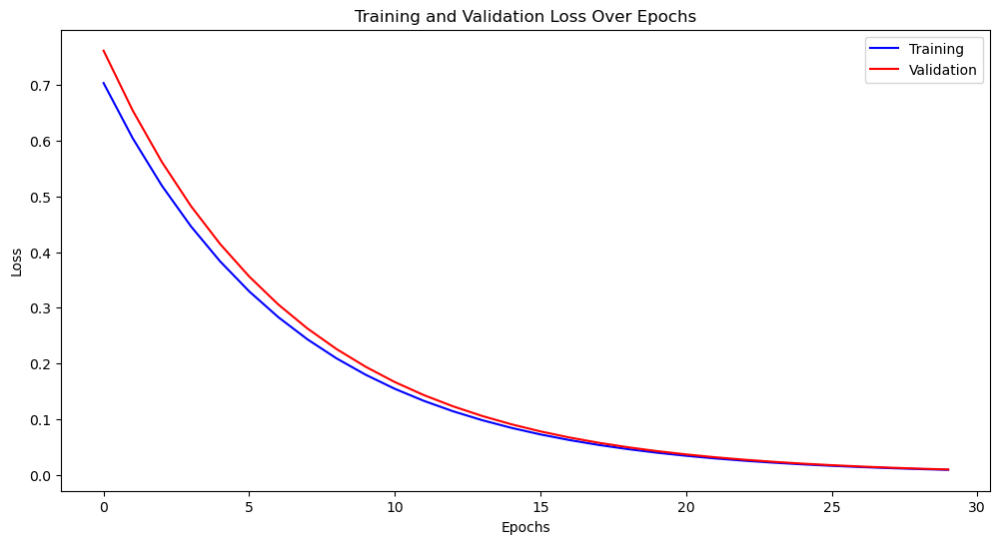

[I 2023-05-20 02:31:22,233] Trial 19 finished with value: 0.009600338350760976 and parameters: {'num_leaves': 47, 'learning_rate': 0.07336123903573771}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


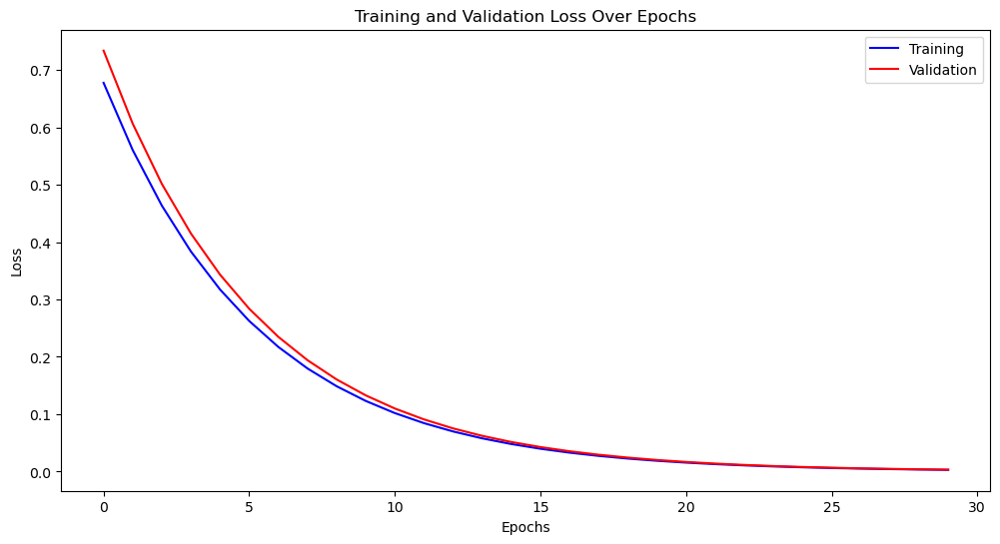

[I 2023-05-20 02:31:22,489] Trial 20 finished with value: 0.0033737372165928044 and parameters: {'num_leaves': 39, 'learning_rate': 0.09091553574045681}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


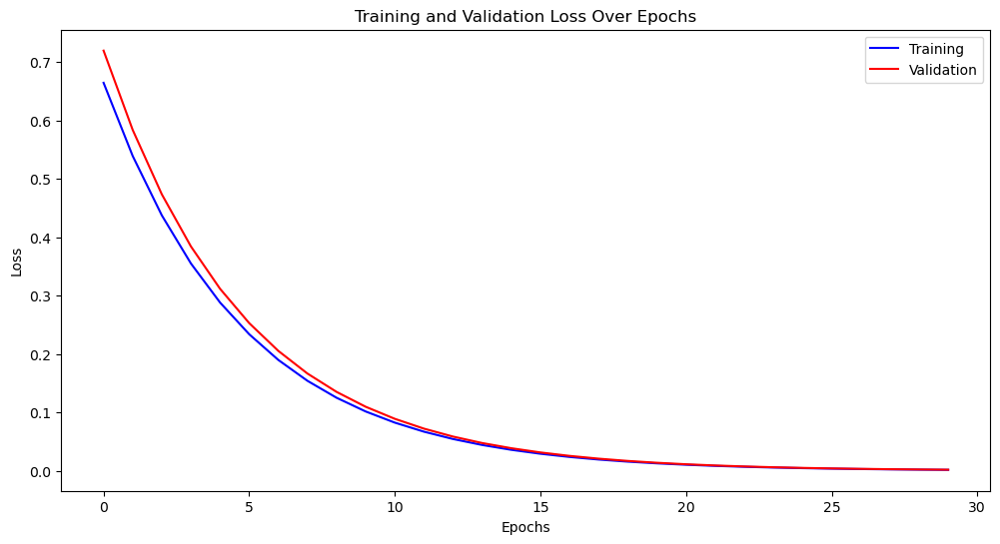

[I 2023-05-20 02:31:22,738] Trial 21 finished with value: 0.002036533668211883 and parameters: {'num_leaves': 44, 'learning_rate': 0.09957366825069736}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


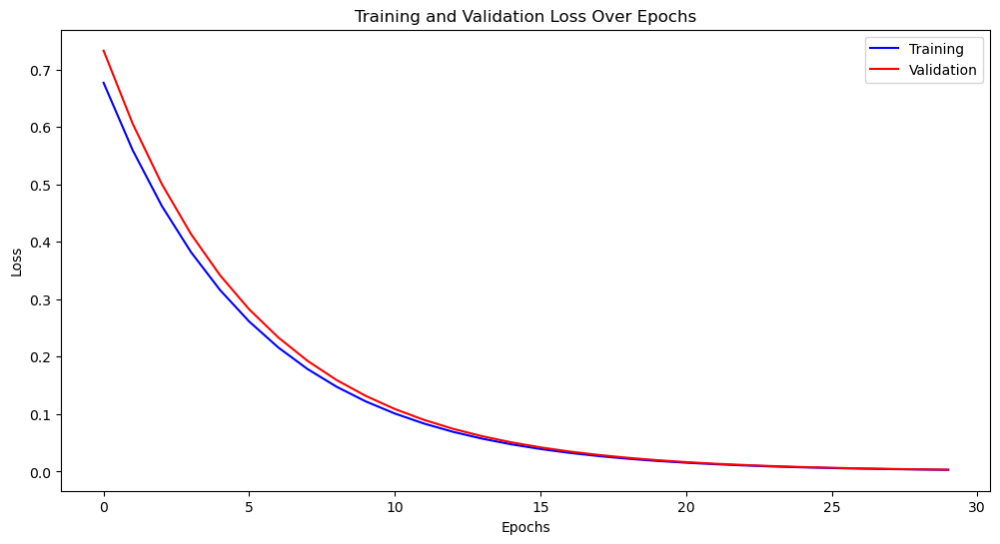

[I 2023-05-20 02:31:22,980] Trial 22 finished with value: 0.0032523703811957513 and parameters: {'num_leaves': 46, 'learning_rate': 0.09122420242568482}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


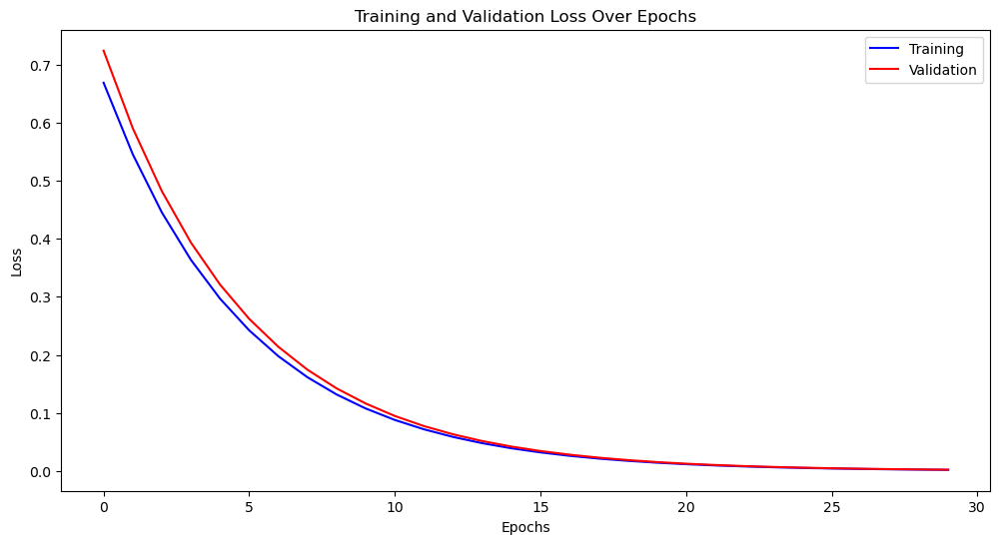

[I 2023-05-20 02:31:23,220] Trial 23 finished with value: 0.0023245131254006597 and parameters: {'num_leaves': 50, 'learning_rate': 0.09692045009766329}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


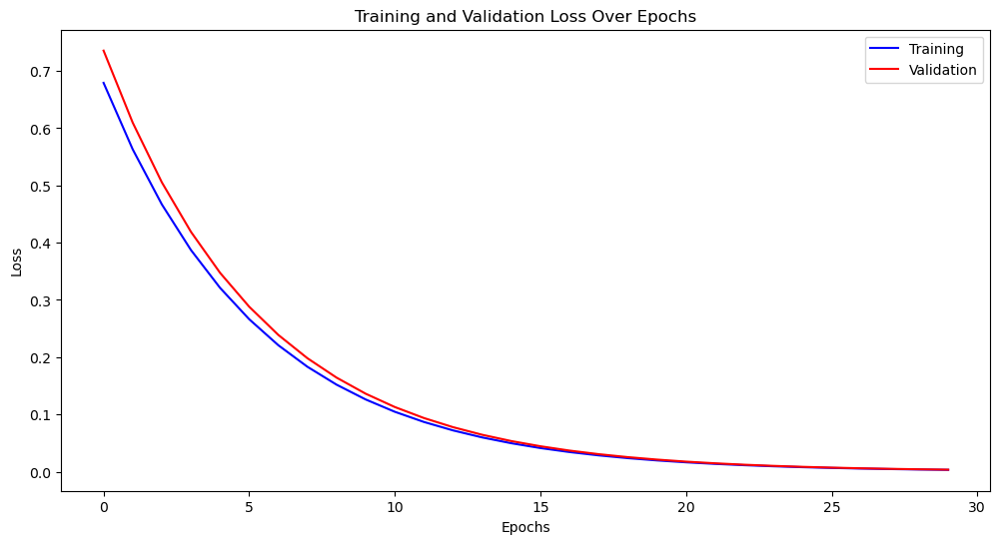

[I 2023-05-20 02:31:23,452] Trial 24 finished with value: 0.0035532007877625347 and parameters: {'num_leaves': 44, 'learning_rate': 0.08976834613758074}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


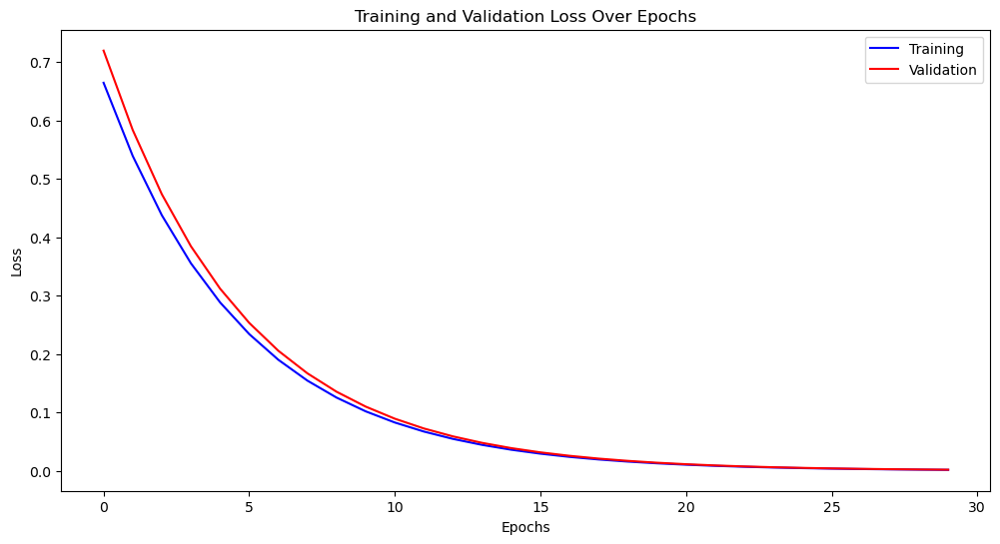

[I 2023-05-20 02:31:23,720] Trial 25 finished with value: 0.002084122894670831 and parameters: {'num_leaves': 40, 'learning_rate': 0.09951794894105258}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


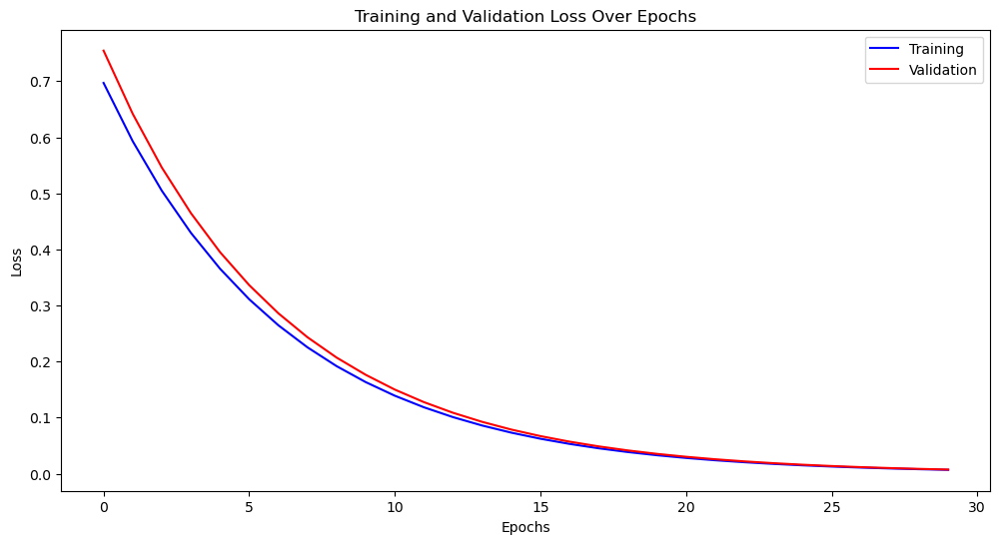

[I 2023-05-20 02:31:23,962] Trial 26 finished with value: 0.007297840437776725 and parameters: {'num_leaves': 47, 'learning_rate': 0.07782367159898755}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


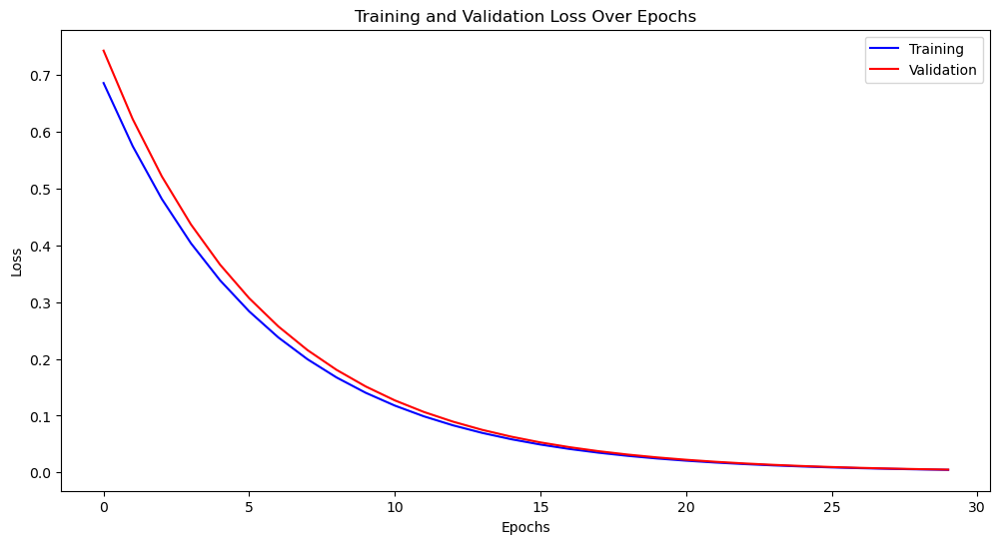

[I 2023-05-20 02:31:24,185] Trial 27 finished with value: 0.004993690121106629 and parameters: {'num_leaves': 28, 'learning_rate': 0.08516152746978613}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


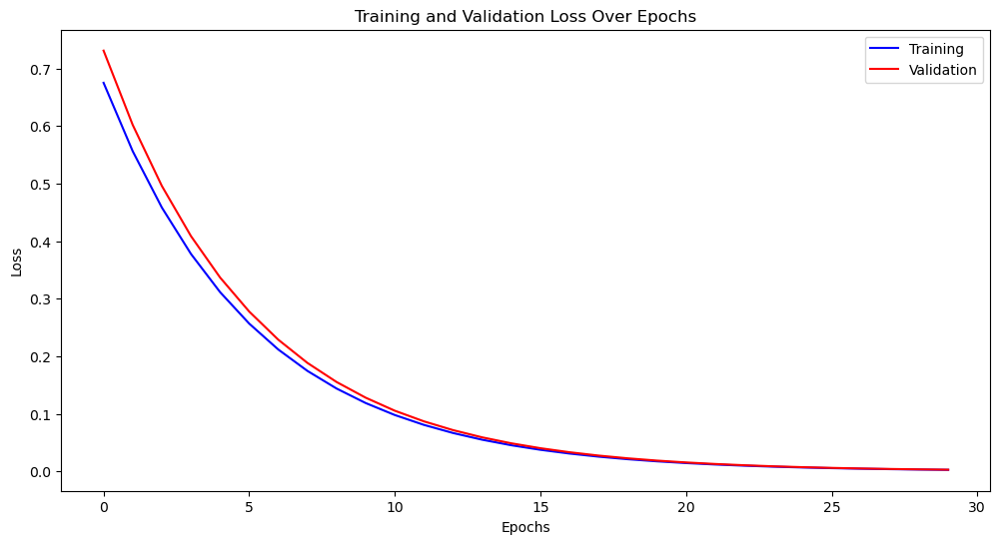

[I 2023-05-20 02:31:24,420] Trial 28 finished with value: 0.003058920139996107 and parameters: {'num_leaves': 36, 'learning_rate': 0.0926468679213685}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


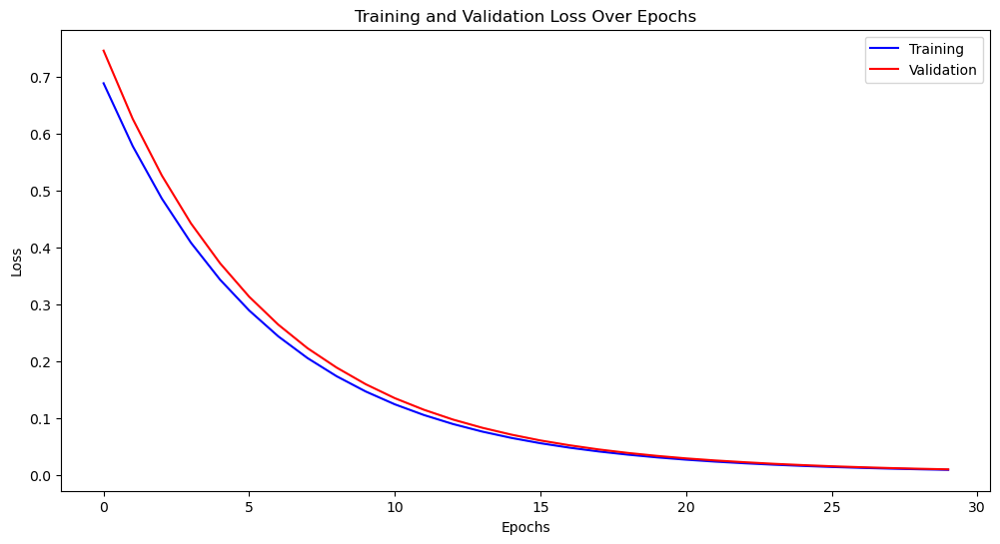

[I 2023-05-20 02:31:24,622] Trial 29 finished with value: 0.009440937195616474 and parameters: {'num_leaves': 6, 'learning_rate': 0.08680331201000337}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


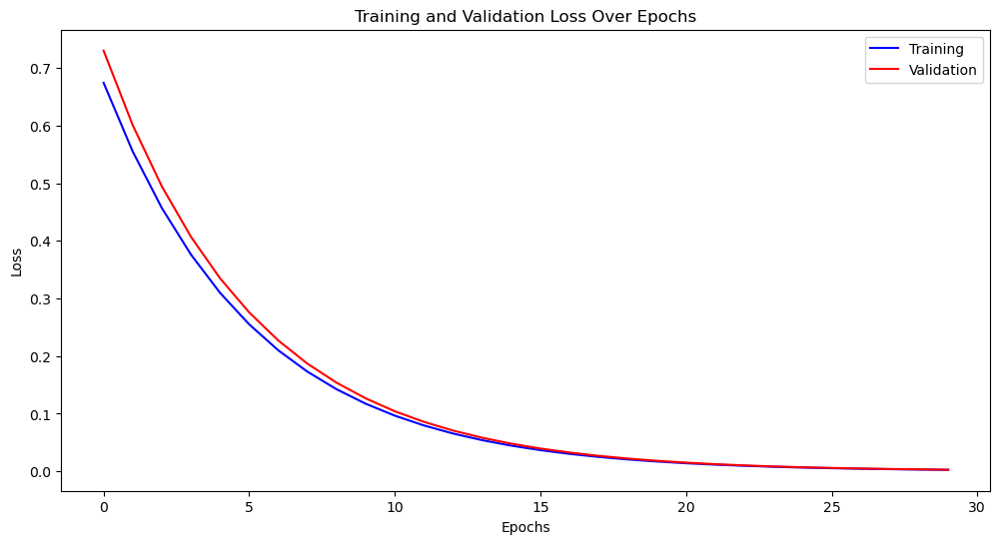

[I 2023-05-20 02:31:24,891] Trial 30 finished with value: 0.0029152704444638396 and parameters: {'num_leaves': 47, 'learning_rate': 0.09303880496200866}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


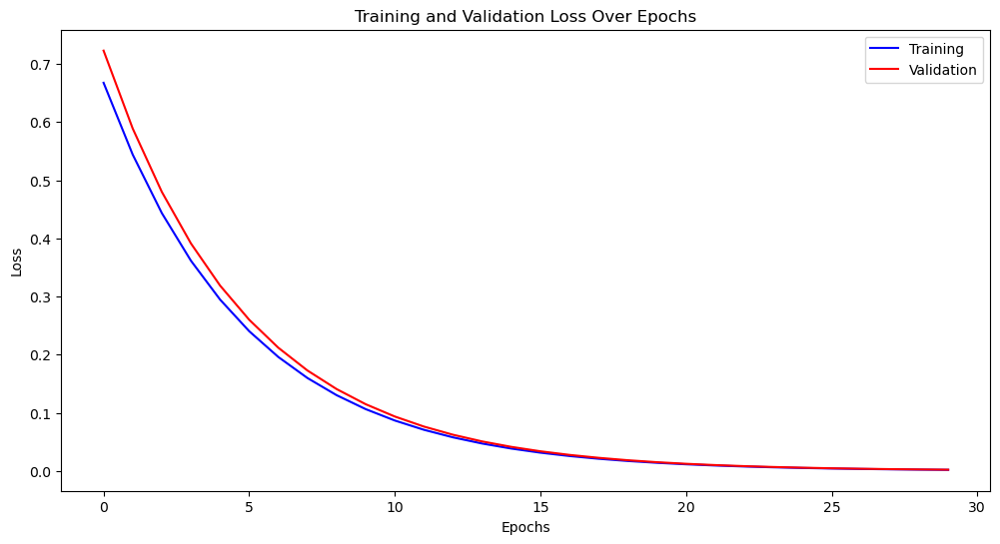

[I 2023-05-20 02:31:25,130] Trial 31 finished with value: 0.002312149089910274 and parameters: {'num_leaves': 40, 'learning_rate': 0.09758387567166481}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


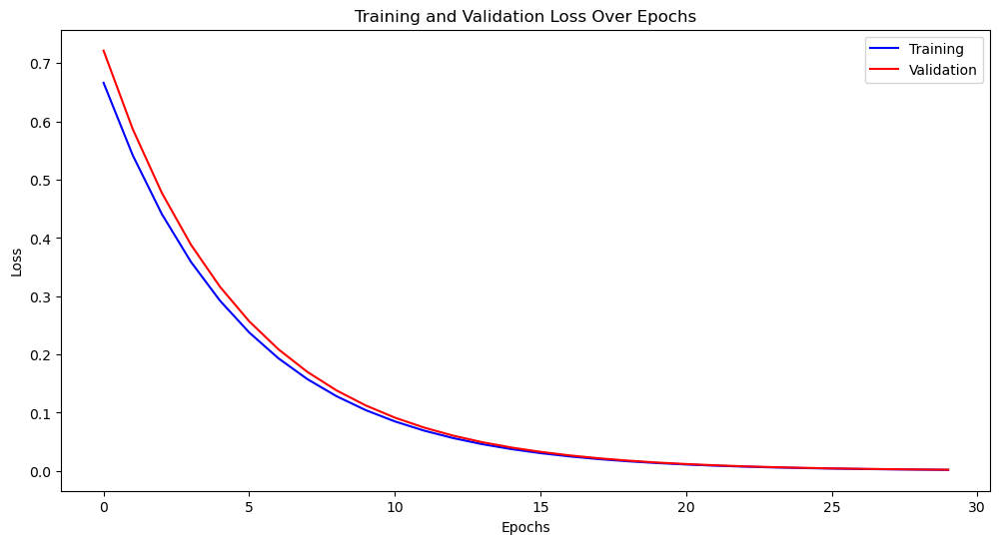

[I 2023-05-20 02:31:25,372] Trial 32 finished with value: 0.0021469648021518965 and parameters: {'num_leaves': 44, 'learning_rate': 0.09836999557097317}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


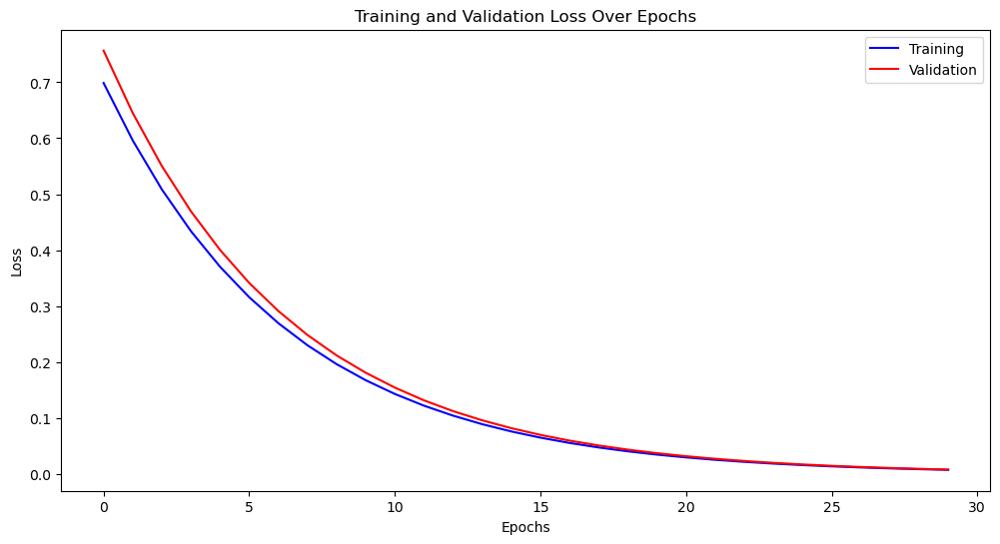

[I 2023-05-20 02:31:25,608] Trial 33 finished with value: 0.00778010139728741 and parameters: {'num_leaves': 50, 'learning_rate': 0.07663138243148229}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


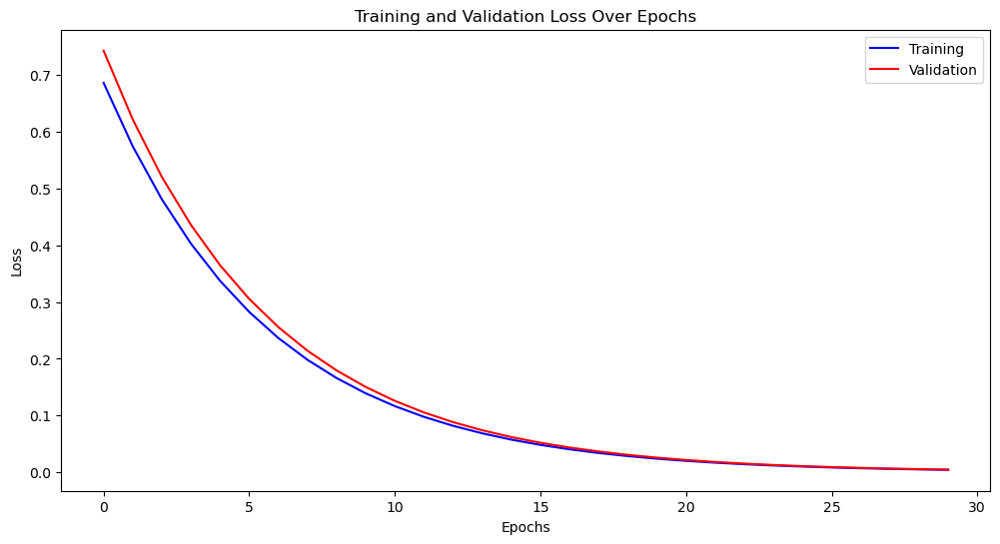

[I 2023-05-20 02:31:25,846] Trial 34 finished with value: 0.004697676772586082 and parameters: {'num_leaves': 40, 'learning_rate': 0.0853278688295242}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


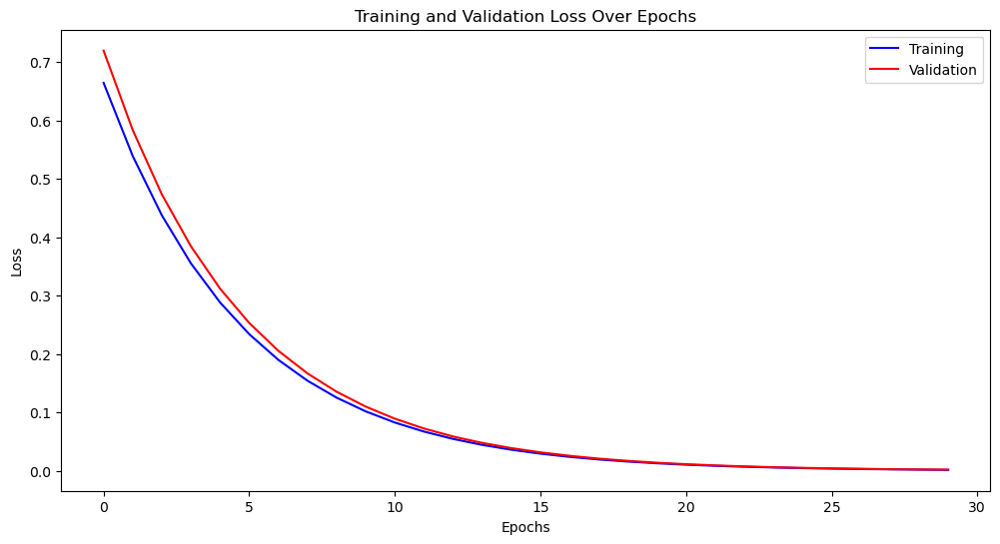

[I 2023-05-20 02:31:26,122] Trial 35 finished with value: 0.002127188421515374 and parameters: {'num_leaves': 35, 'learning_rate': 0.09962516369169992}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


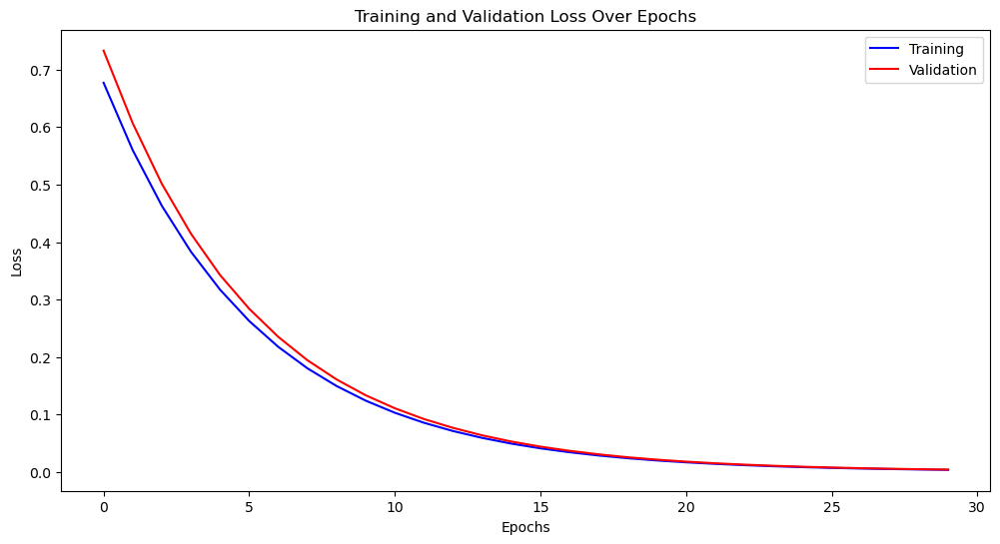

[I 2023-05-20 02:31:26,329] Trial 36 finished with value: 0.004299253686704875 and parameters: {'num_leaves': 14, 'learning_rate': 0.09187661464760086}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


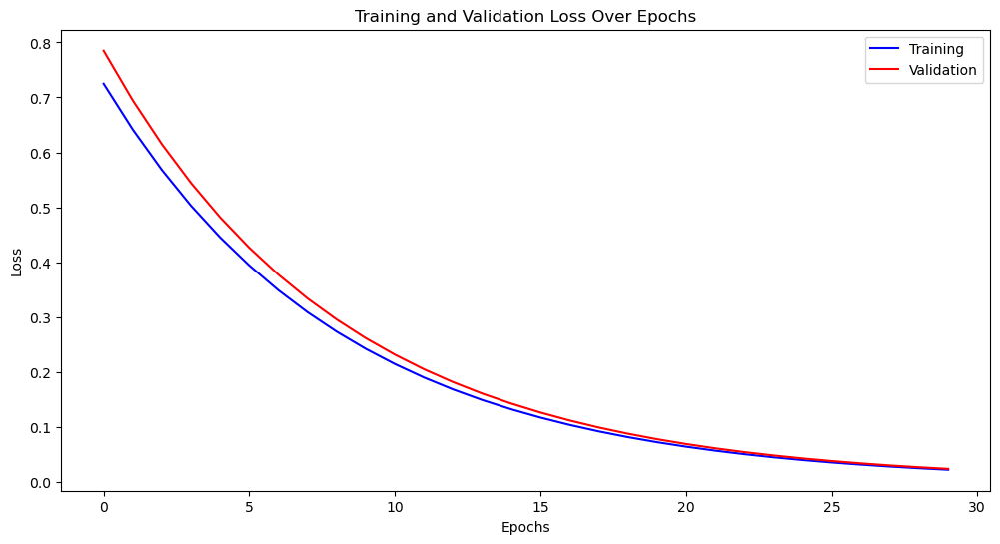

[I 2023-05-20 02:31:26,562] Trial 37 finished with value: 0.023227069039944023 and parameters: {'num_leaves': 32, 'learning_rate': 0.059546456322266246}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


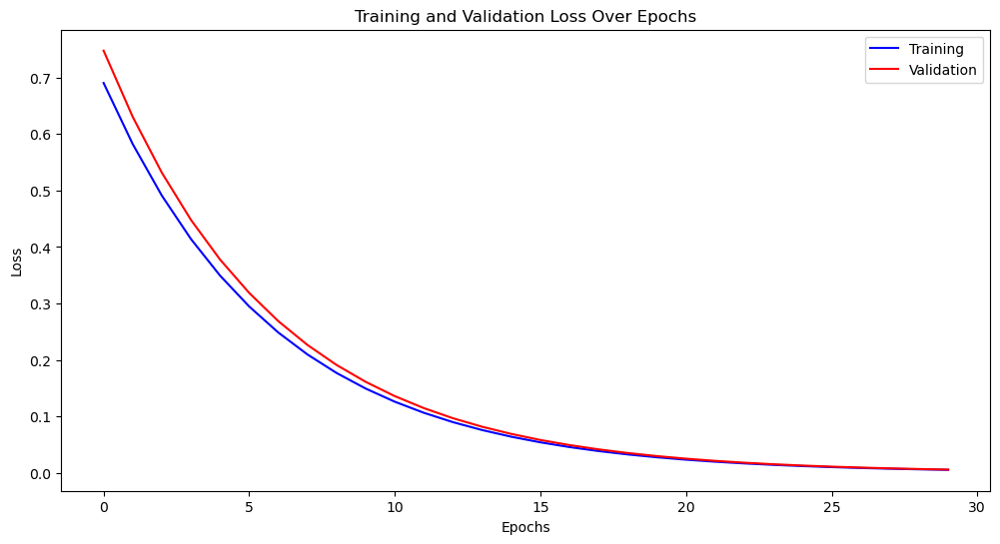

[I 2023-05-20 02:31:26,797] Trial 38 finished with value: 0.005701776134413746 and parameters: {'num_leaves': 44, 'learning_rate': 0.0820268105455011}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


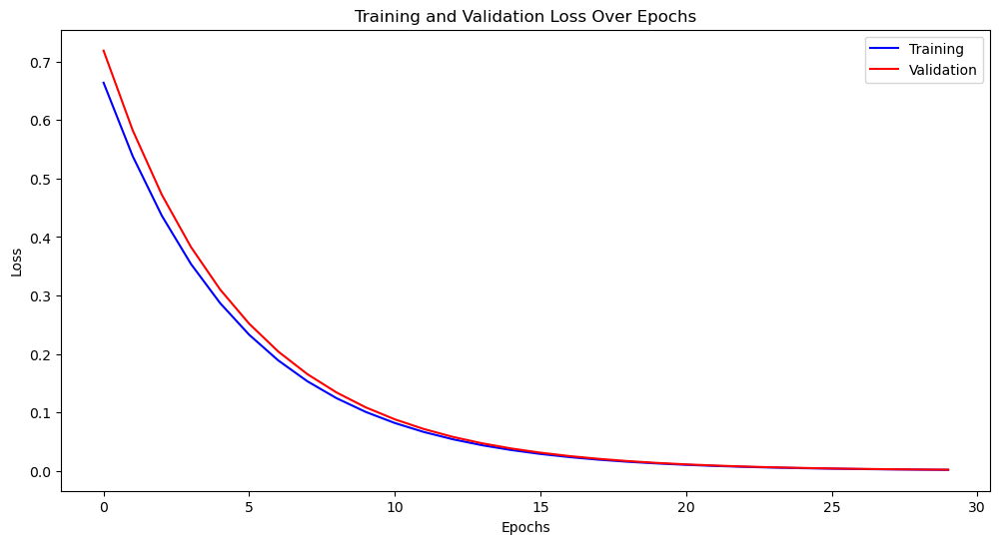

[I 2023-05-20 02:31:27,078] Trial 39 finished with value: 0.001975086071401081 and parameters: {'num_leaves': 48, 'learning_rate': 0.09991862207527154}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


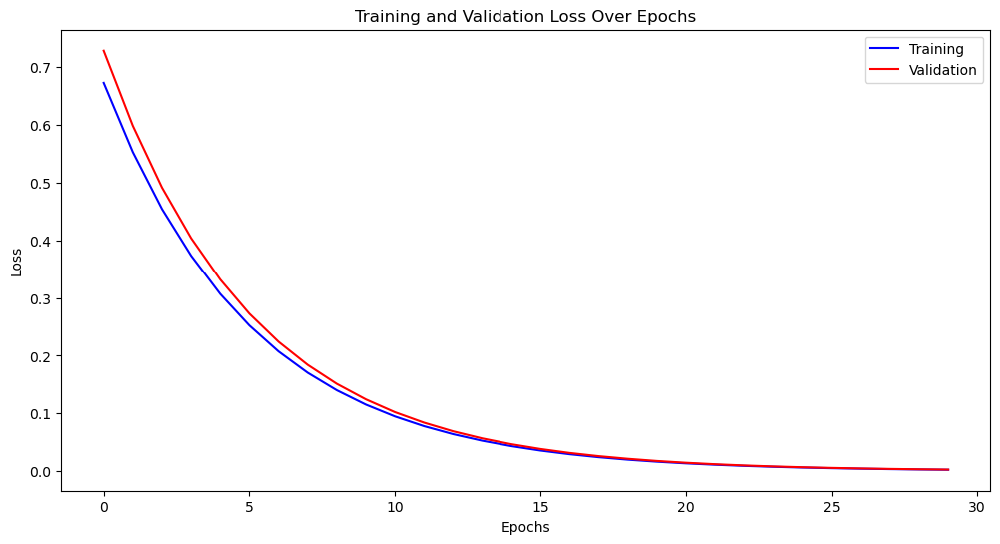

[I 2023-05-20 02:31:27,312] Trial 40 finished with value: 0.0027913928433982945 and parameters: {'num_leaves': 47, 'learning_rate': 0.09382852532975541}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


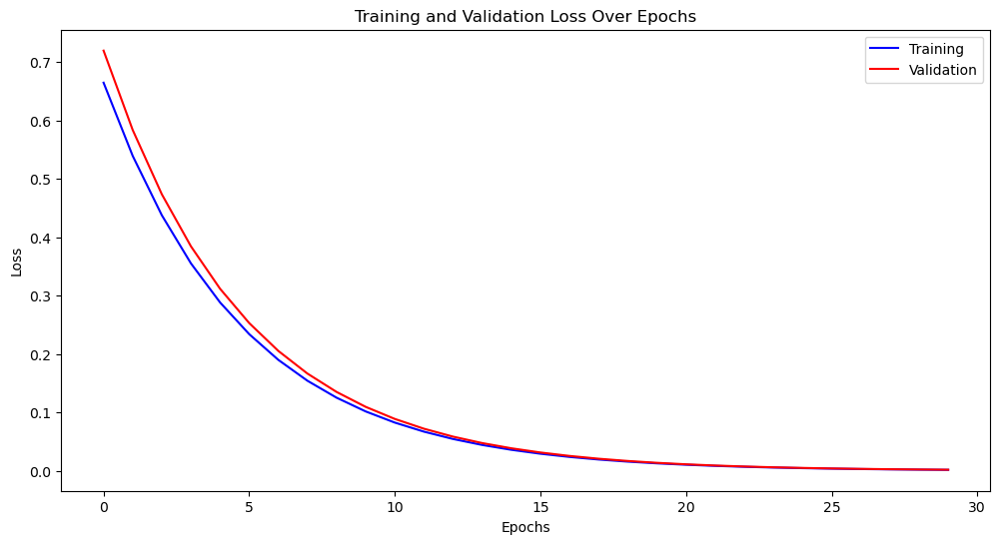

[I 2023-05-20 02:31:27,557] Trial 41 finished with value: 0.0020029691814846735 and parameters: {'num_leaves': 48, 'learning_rate': 0.09948947070129115}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


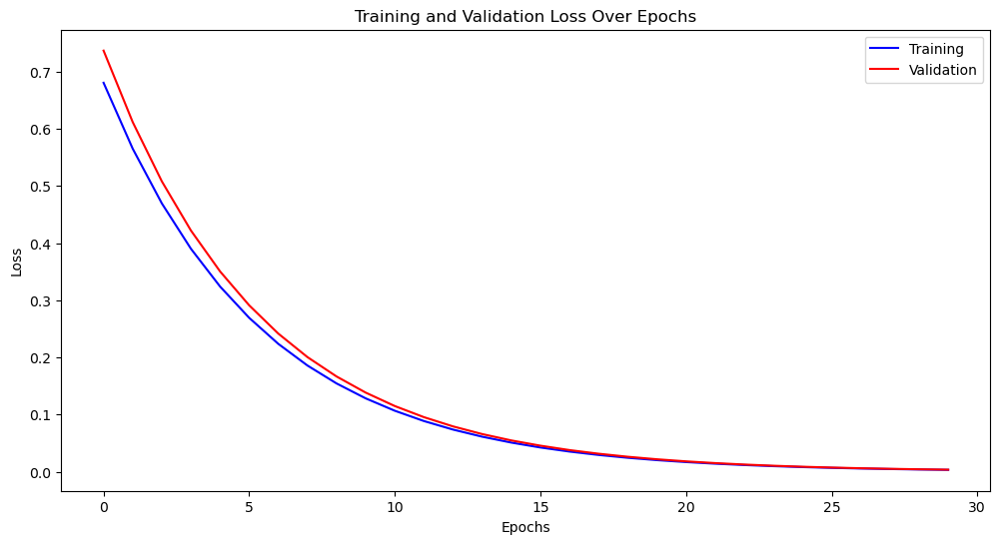

[I 2023-05-20 02:31:27,816] Trial 42 finished with value: 0.0036972522214208095 and parameters: {'num_leaves': 48, 'learning_rate': 0.0888931739173075}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


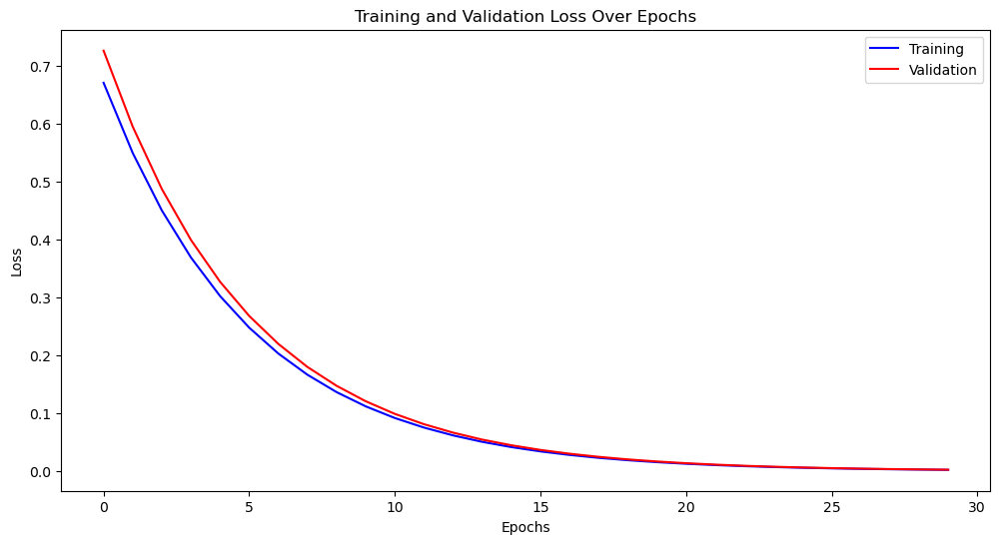

[I 2023-05-20 02:31:28,064] Trial 43 finished with value: 0.002582821887823553 and parameters: {'num_leaves': 45, 'learning_rate': 0.0951764666451757}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


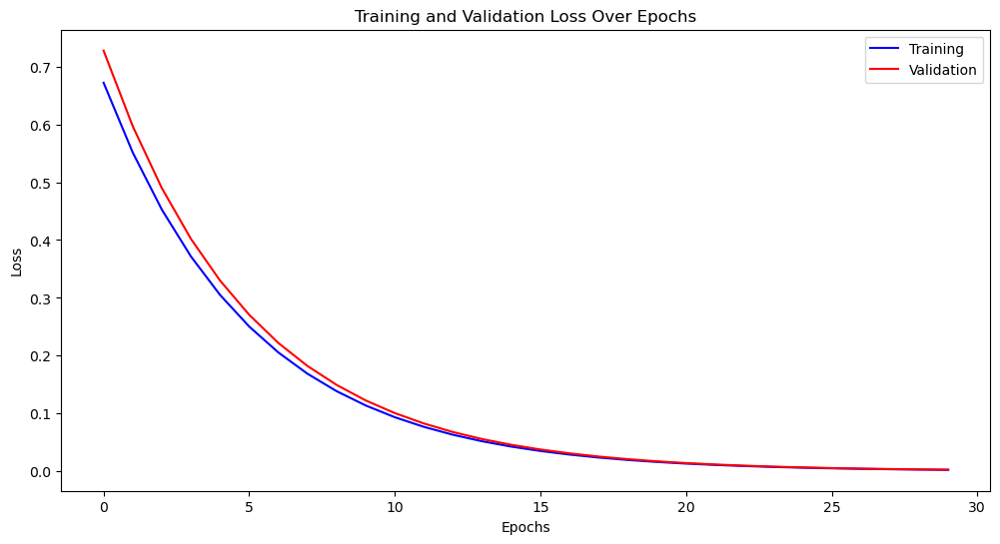

[I 2023-05-20 02:31:28,311] Trial 44 finished with value: 0.002645908297614085 and parameters: {'num_leaves': 49, 'learning_rate': 0.09441755710370762}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


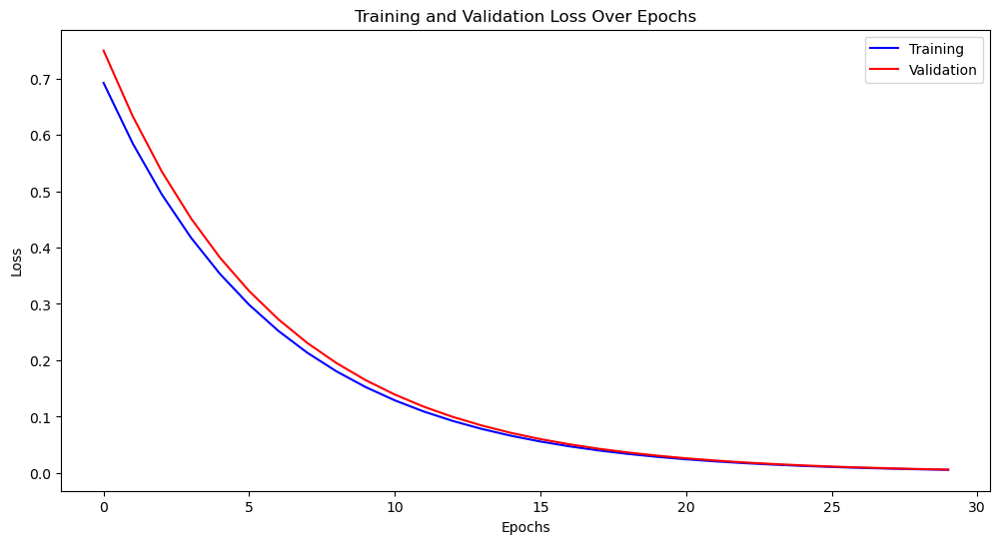

[I 2023-05-20 02:31:28,552] Trial 45 finished with value: 0.006041325106029375 and parameters: {'num_leaves': 42, 'learning_rate': 0.08106956385612923}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


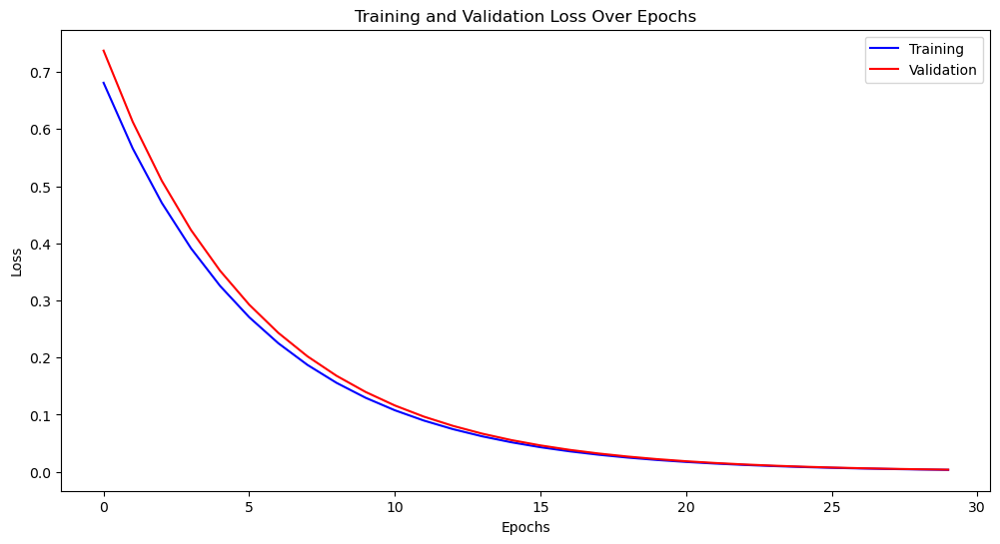

[I 2023-05-20 02:31:28,799] Trial 46 finished with value: 0.0037830857456117896 and parameters: {'num_leaves': 48, 'learning_rate': 0.08849140307031055}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


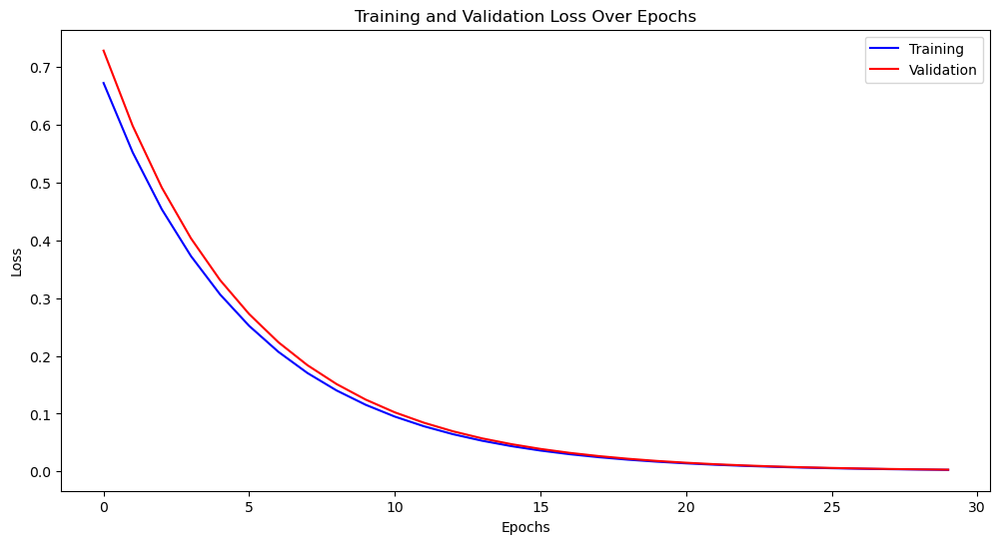

[I 2023-05-20 02:31:29,059] Trial 47 finished with value: 0.0030874973296411198 and parameters: {'num_leaves': 24, 'learning_rate': 0.0944131246303286}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


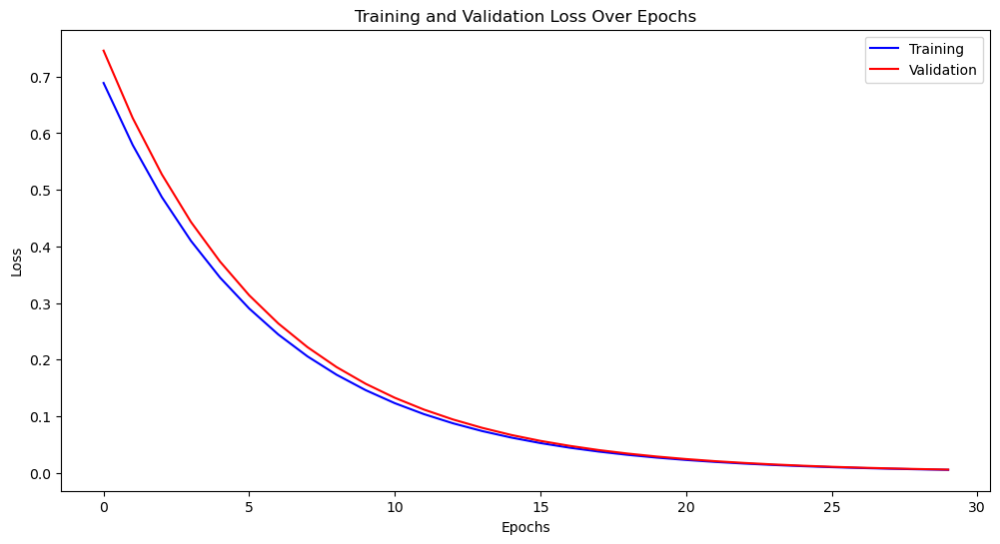

[I 2023-05-20 02:31:29,279] Trial 48 finished with value: 0.005869579407436608 and parameters: {'num_leaves': 19, 'learning_rate': 0.08376152038171115}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


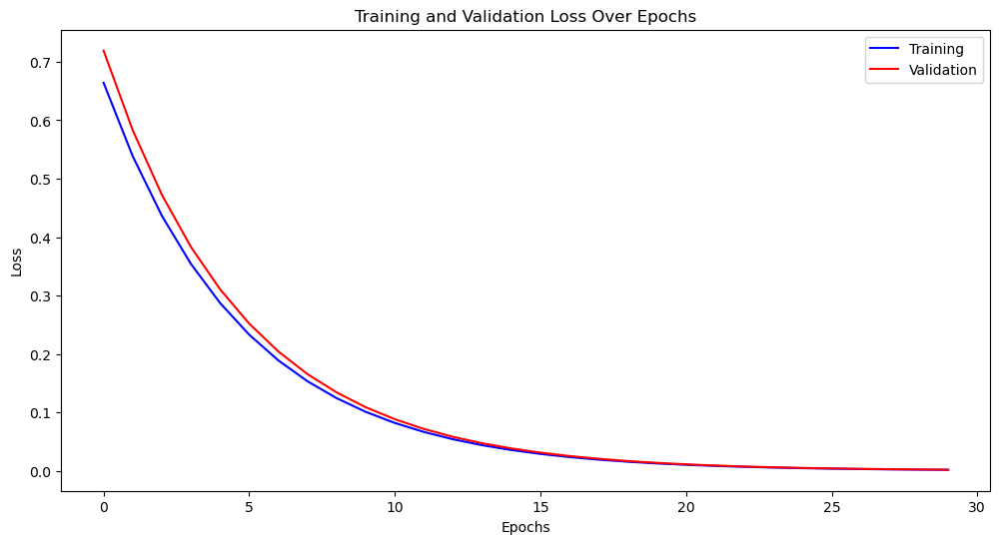

[I 2023-05-20 02:31:29,520] Trial 49 finished with value: 0.0019983171725937955 and parameters: {'num_leaves': 45, 'learning_rate': 0.09989350280058656}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


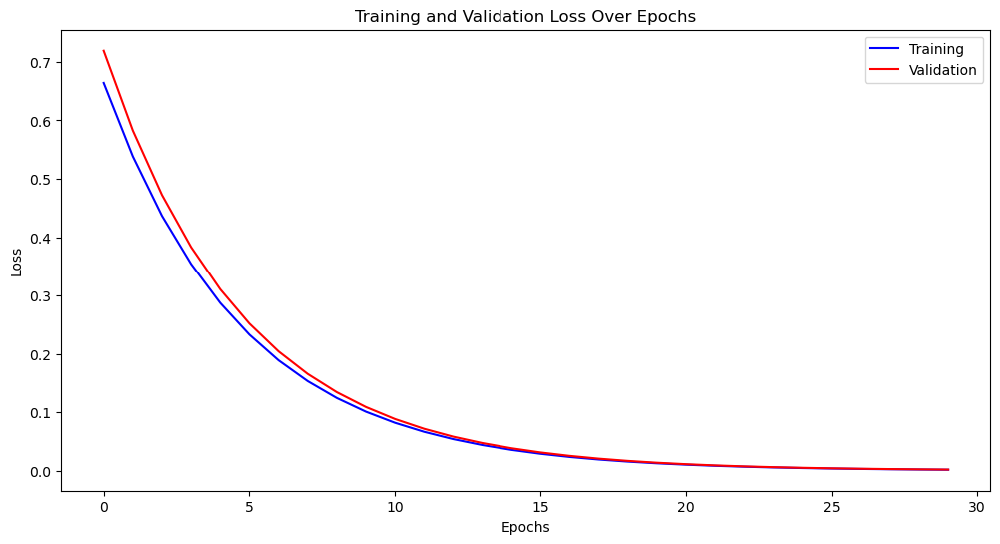

[I 2023-05-20 02:31:29,765] Trial 50 finished with value: 0.0020367455787813995 and parameters: {'num_leaves': 38, 'learning_rate': 0.09999055483507033}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


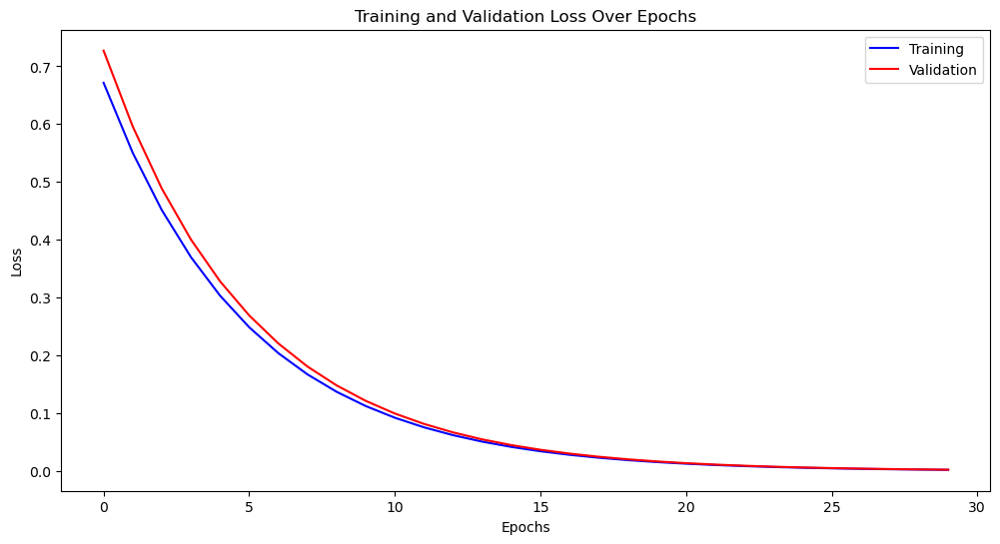

[I 2023-05-20 02:31:30,063] Trial 51 finished with value: 0.0026254507581229716 and parameters: {'num_leaves': 45, 'learning_rate': 0.09491735358491224}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


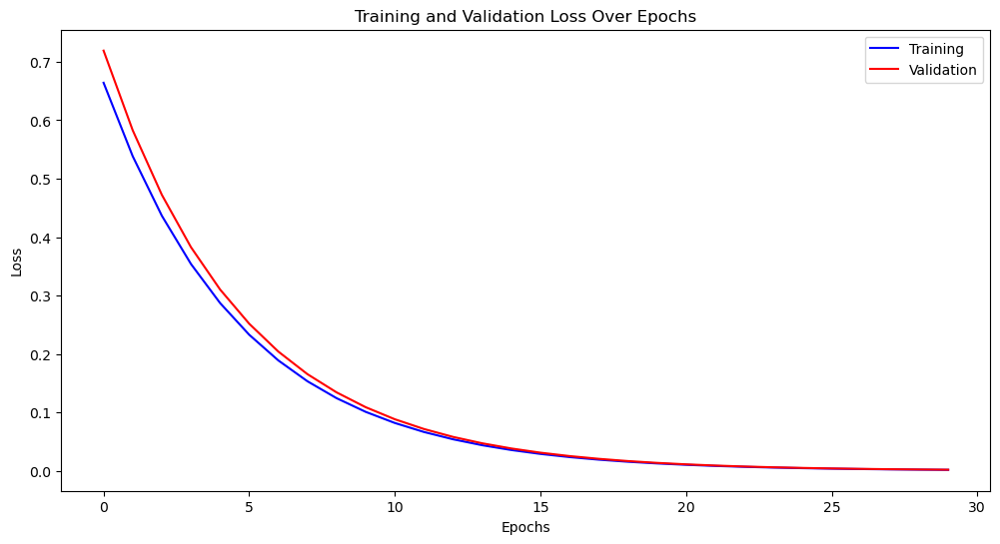

[I 2023-05-20 02:31:30,297] Trial 52 finished with value: 0.002003522944627539 and parameters: {'num_leaves': 42, 'learning_rate': 0.09994385620725556}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


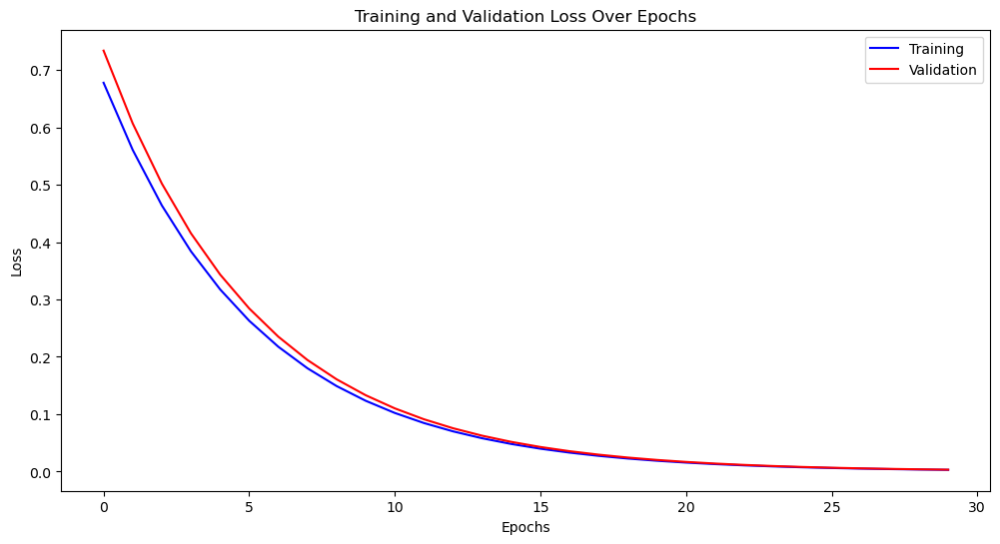

[I 2023-05-20 02:31:30,557] Trial 53 finished with value: 0.003322526201393334 and parameters: {'num_leaves': 49, 'learning_rate': 0.09070624006429243}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


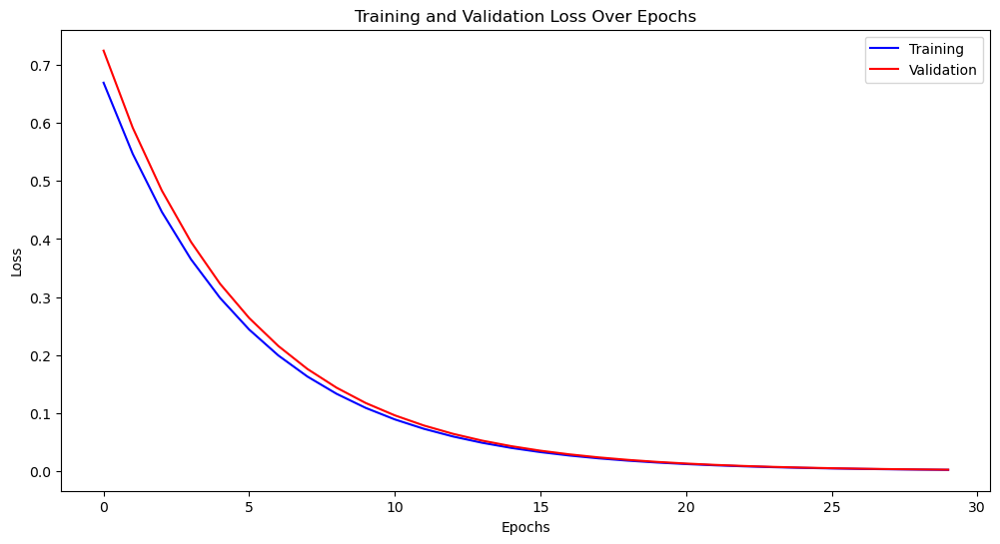

[I 2023-05-20 02:31:30,818] Trial 54 finished with value: 0.0024091487906489216 and parameters: {'num_leaves': 46, 'learning_rate': 0.09645796606095583}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


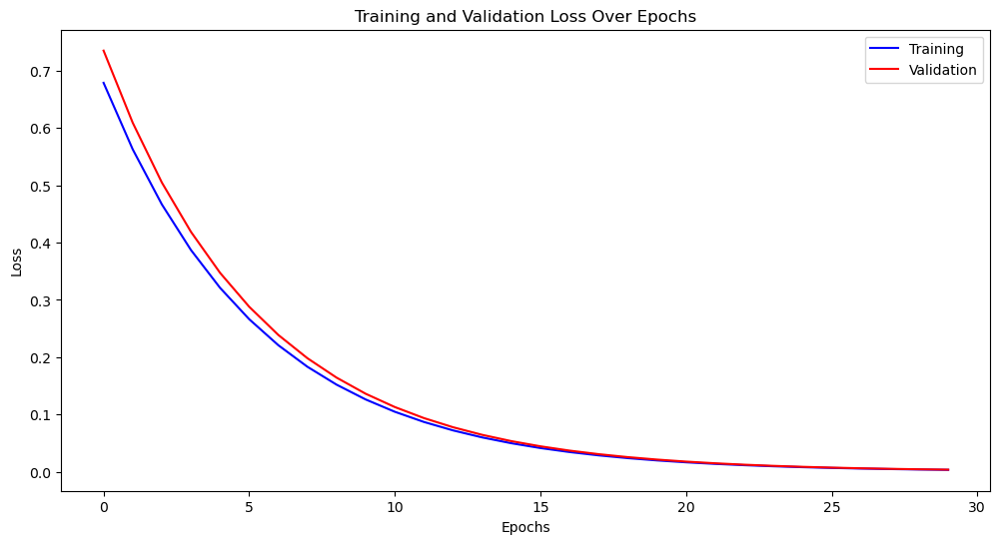

[I 2023-05-20 02:31:31,062] Trial 55 finished with value: 0.0035933404876202987 and parameters: {'num_leaves': 42, 'learning_rate': 0.08978814698683918}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


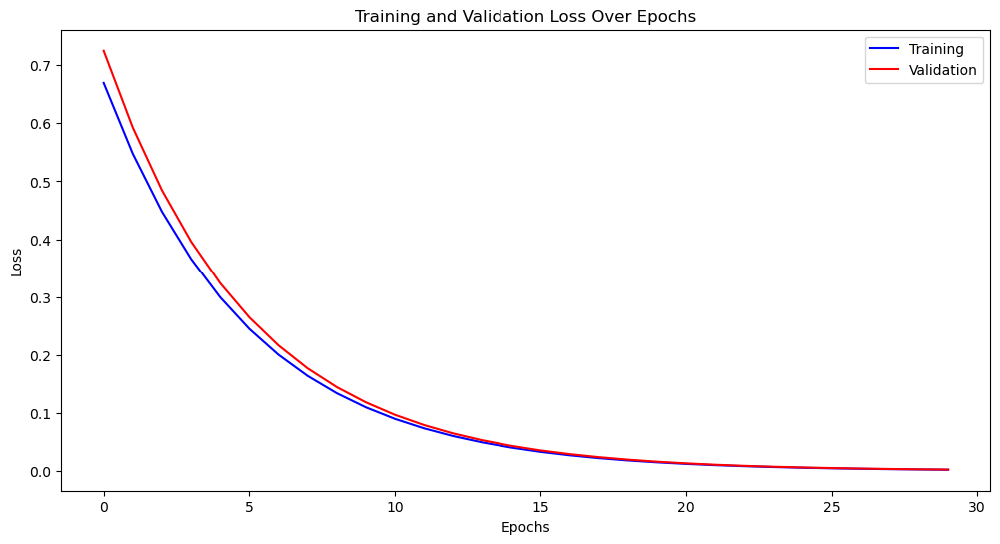

[I 2023-05-20 02:31:31,310] Trial 56 finished with value: 0.0024209634957374202 and parameters: {'num_leaves': 50, 'learning_rate': 0.09610195806846544}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


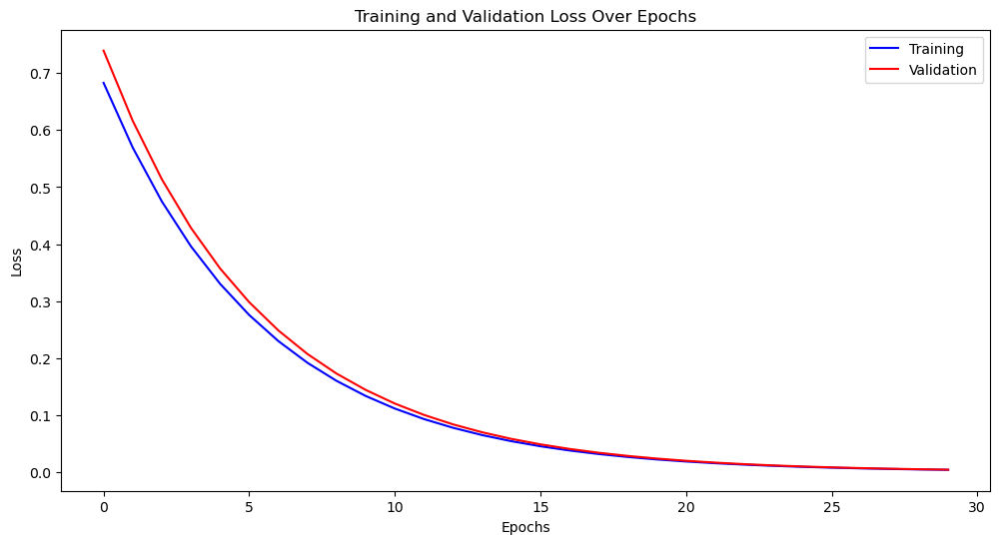

[I 2023-05-20 02:31:31,550] Trial 57 finished with value: 0.004128317091371542 and parameters: {'num_leaves': 42, 'learning_rate': 0.0871834635651979}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


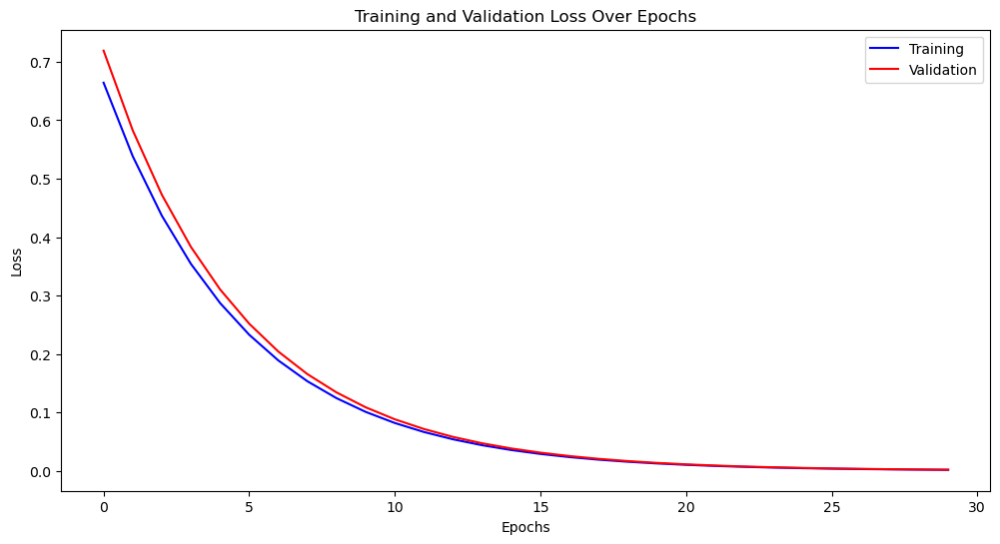

[I 2023-05-20 02:31:31,842] Trial 58 finished with value: 0.0019776874337338233 and parameters: {'num_leaves': 48, 'learning_rate': 0.09989373422874943}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


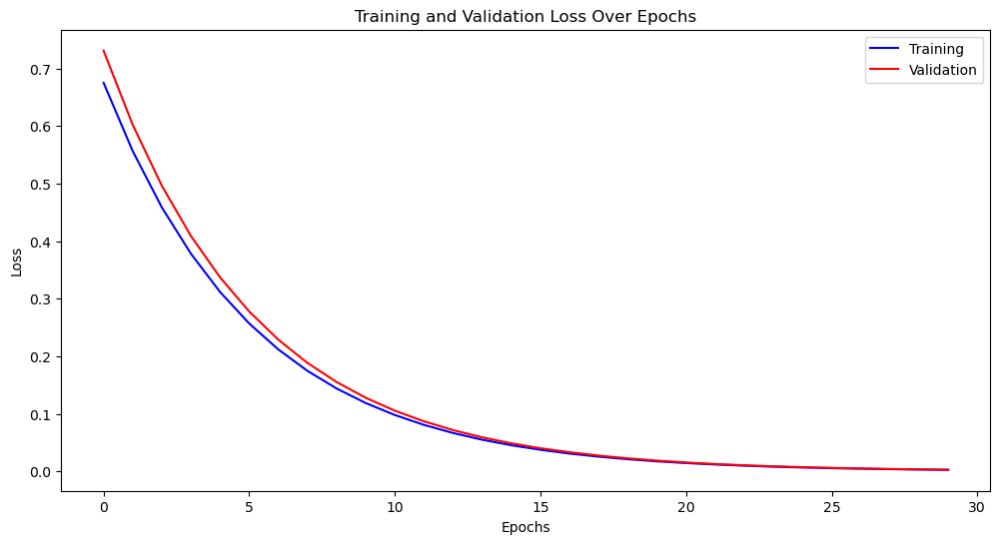

[I 2023-05-20 02:31:32,305] Trial 59 finished with value: 0.0029882591319698396 and parameters: {'num_leaves': 48, 'learning_rate': 0.09245510520578068}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


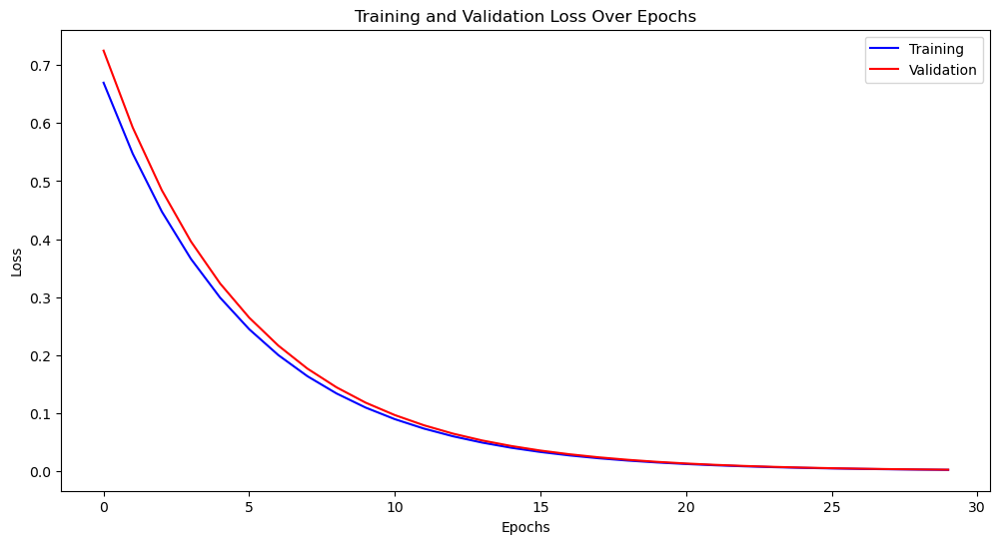

[I 2023-05-20 02:31:32,546] Trial 60 finished with value: 0.0024304843324846263 and parameters: {'num_leaves': 46, 'learning_rate': 0.09621431337752556}. Best is trial 10 with value: 0.0019609762635842023.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


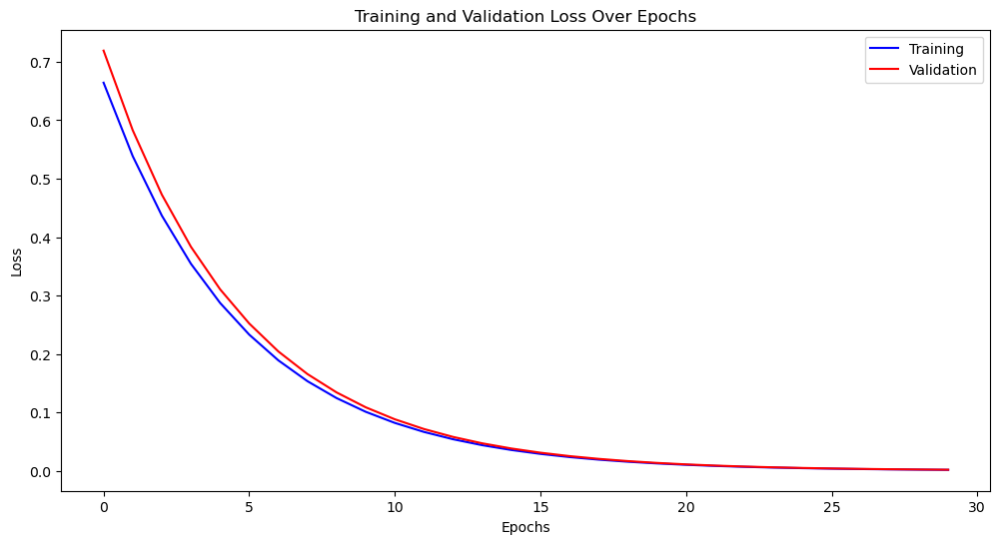

[I 2023-05-20 02:31:32,841] Trial 61 finished with value: 0.001956476833991155 and parameters: {'num_leaves': 49, 'learning_rate': 0.09980993933815839}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


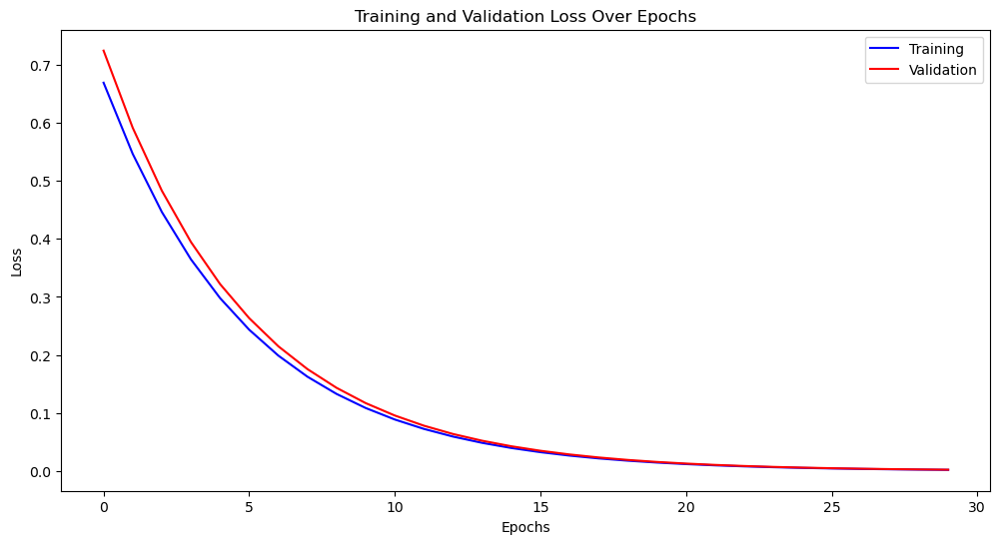

[I 2023-05-20 02:31:33,087] Trial 62 finished with value: 0.0023834739529679386 and parameters: {'num_leaves': 49, 'learning_rate': 0.0965220899616848}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


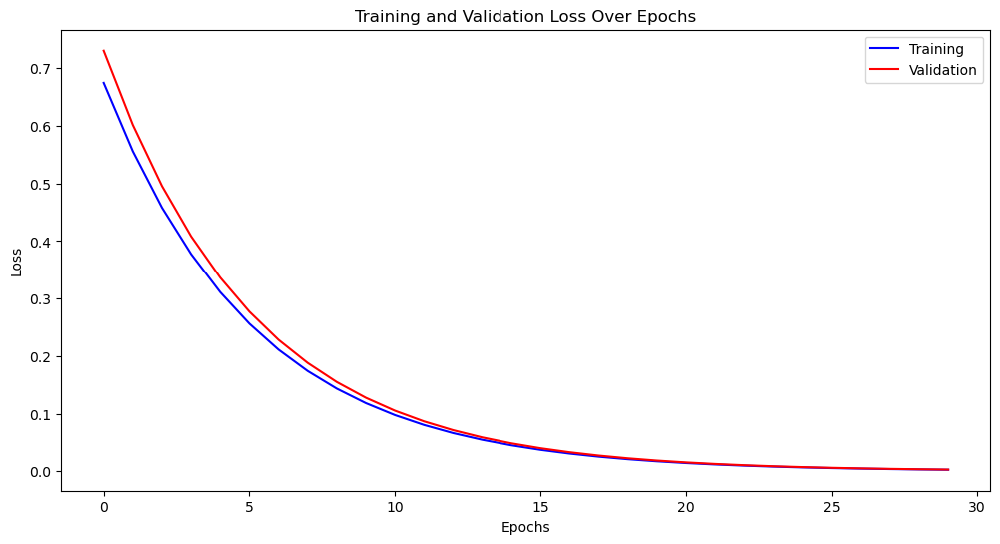

[I 2023-05-20 02:31:33,331] Trial 63 finished with value: 0.0029649097253032237 and parameters: {'num_leaves': 48, 'learning_rate': 0.09264119486300006}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


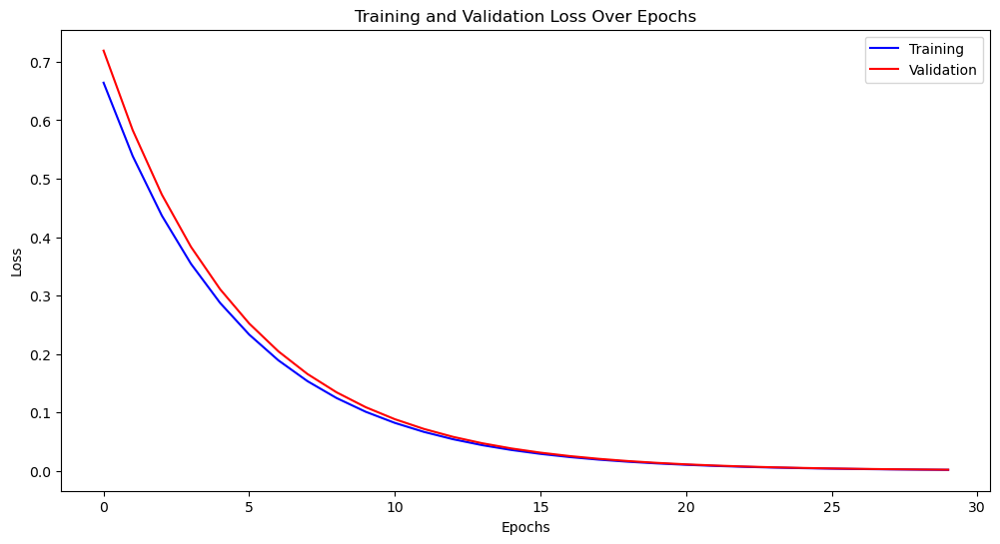

[I 2023-05-20 02:31:33,611] Trial 64 finished with value: 0.001968653352171878 and parameters: {'num_leaves': 50, 'learning_rate': 0.09977400052845267}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


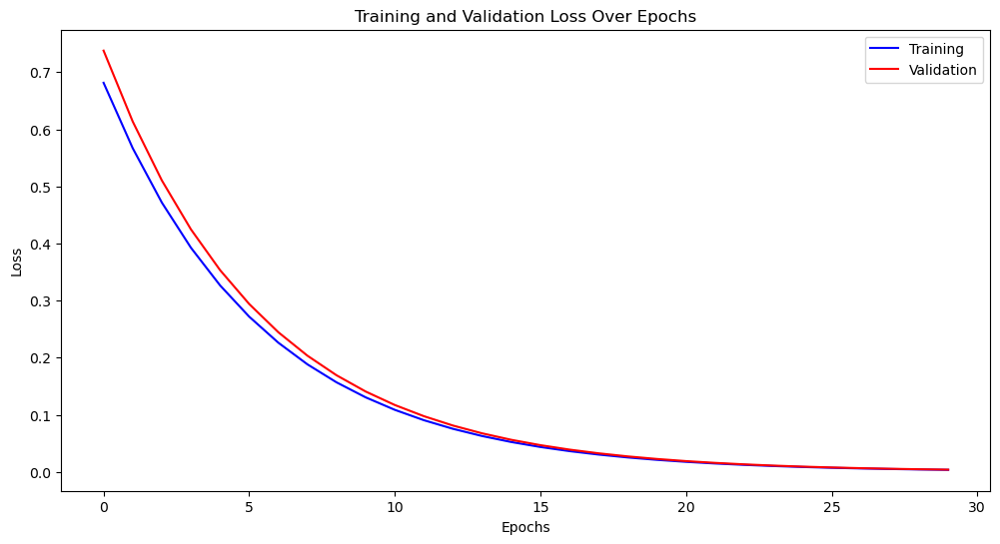

[I 2023-05-20 02:31:33,857] Trial 65 finished with value: 0.0038762015489679446 and parameters: {'num_leaves': 50, 'learning_rate': 0.08813572058036442}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


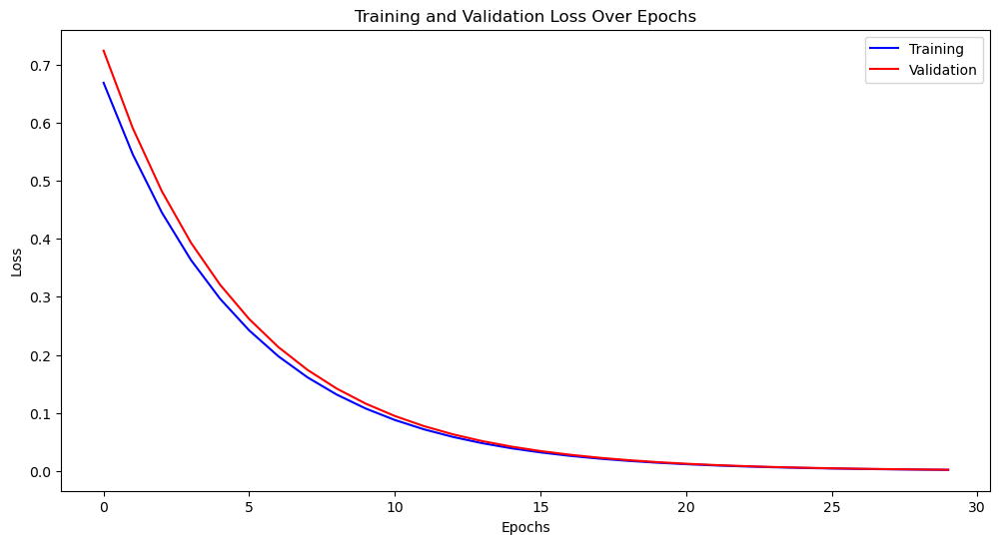

[I 2023-05-20 02:31:34,094] Trial 66 finished with value: 0.0023057547228020315 and parameters: {'num_leaves': 45, 'learning_rate': 0.09700487404814925}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


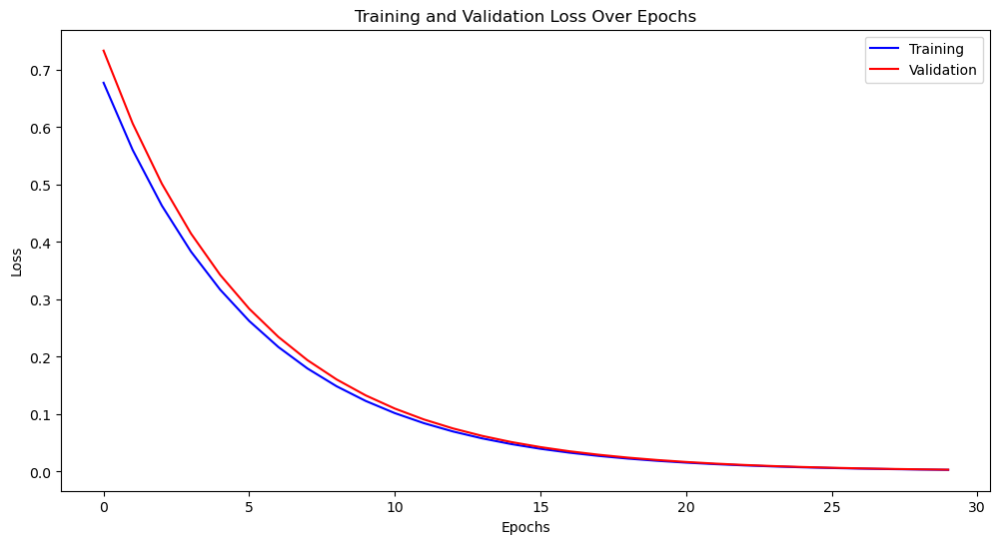

[I 2023-05-20 02:31:34,388] Trial 67 finished with value: 0.003301596744610827 and parameters: {'num_leaves': 46, 'learning_rate': 0.09087892472178696}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


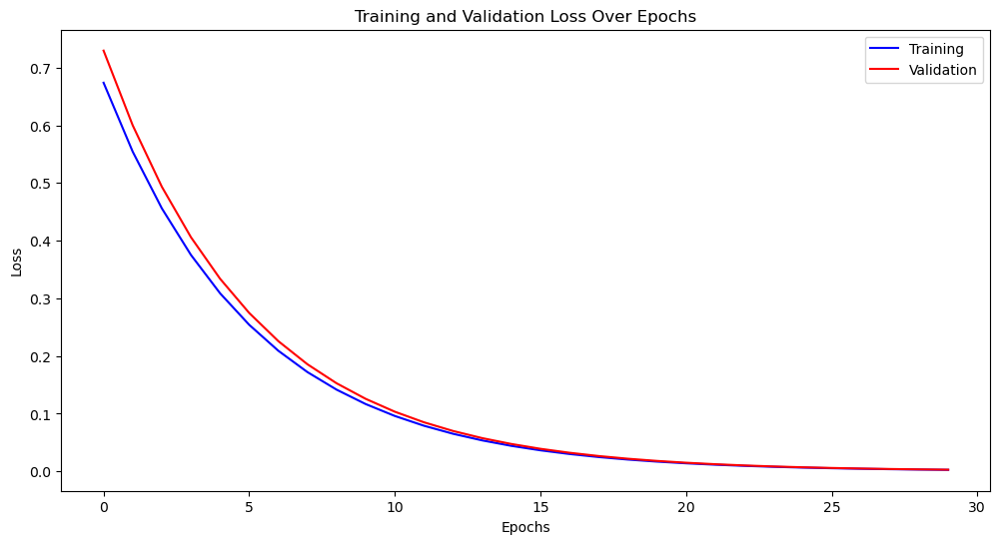

[I 2023-05-20 02:31:34,664] Trial 68 finished with value: 0.002845833230046067 and parameters: {'num_leaves': 50, 'learning_rate': 0.09328764147488933}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


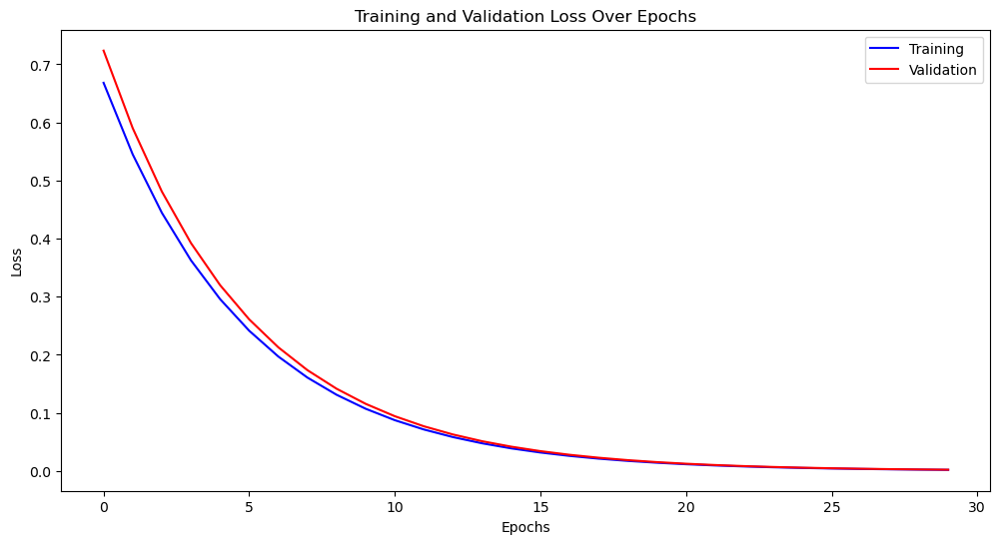

[I 2023-05-20 02:31:34,907] Trial 69 finished with value: 0.0023158602829321433 and parameters: {'num_leaves': 43, 'learning_rate': 0.09721993190366629}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


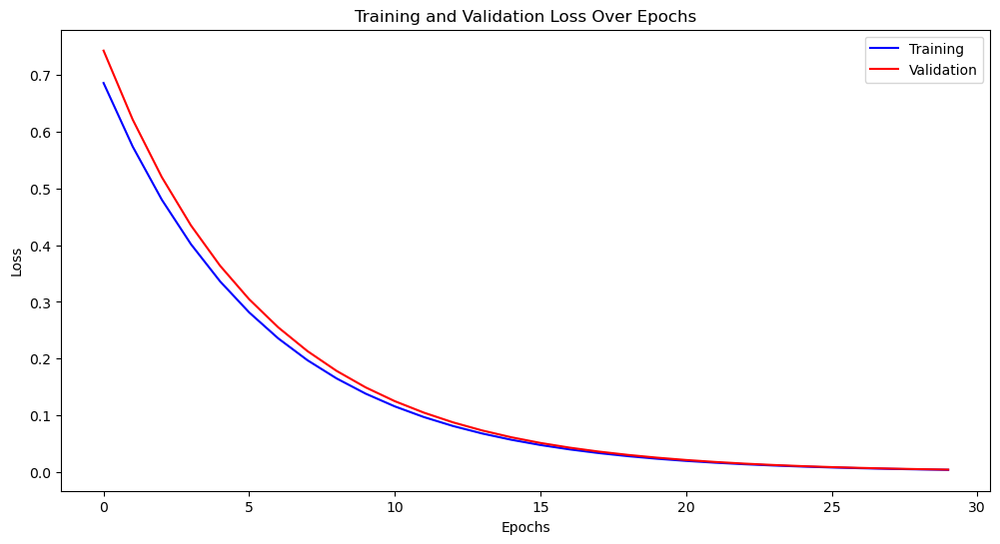

[I 2023-05-20 02:31:35,172] Trial 70 finished with value: 0.004835113559609769 and parameters: {'num_leaves': 27, 'learning_rate': 0.08583368388365112}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


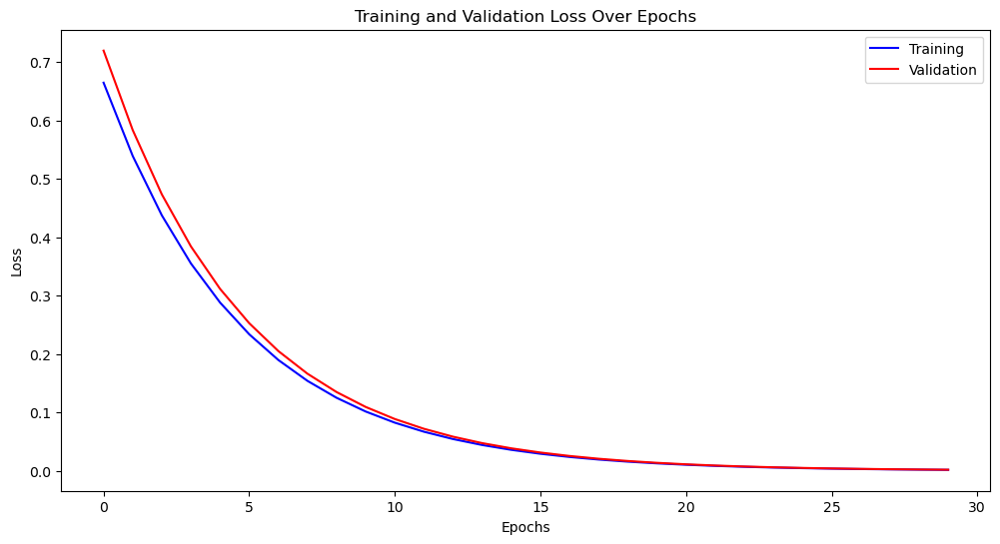

[I 2023-05-20 02:31:35,422] Trial 71 finished with value: 0.00198884840911505 and parameters: {'num_leaves': 48, 'learning_rate': 0.09957266130098553}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


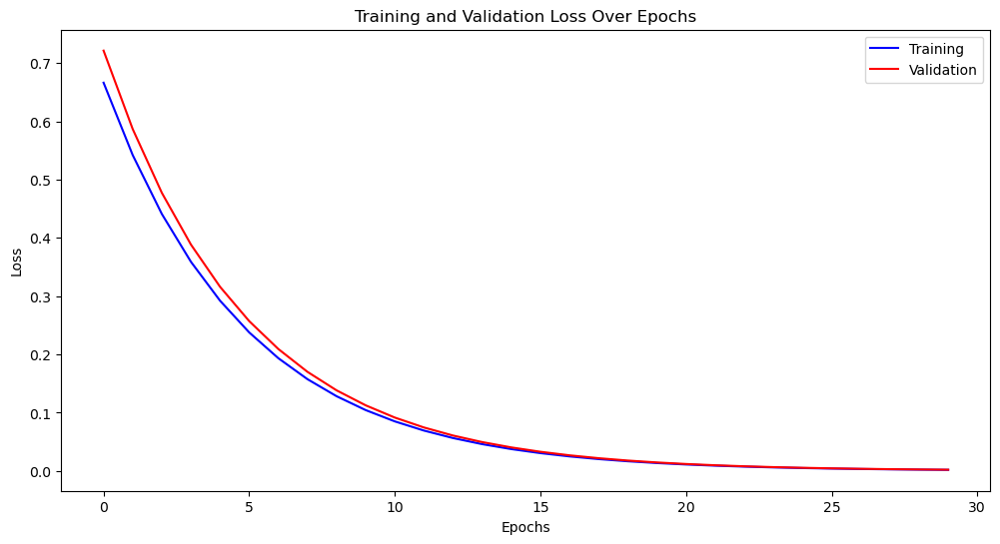

[I 2023-05-20 02:31:35,673] Trial 72 finished with value: 0.0021571785270558677 and parameters: {'num_leaves': 46, 'learning_rate': 0.09833845004770055}. Best is trial 61 with value: 0.001956476833991155.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


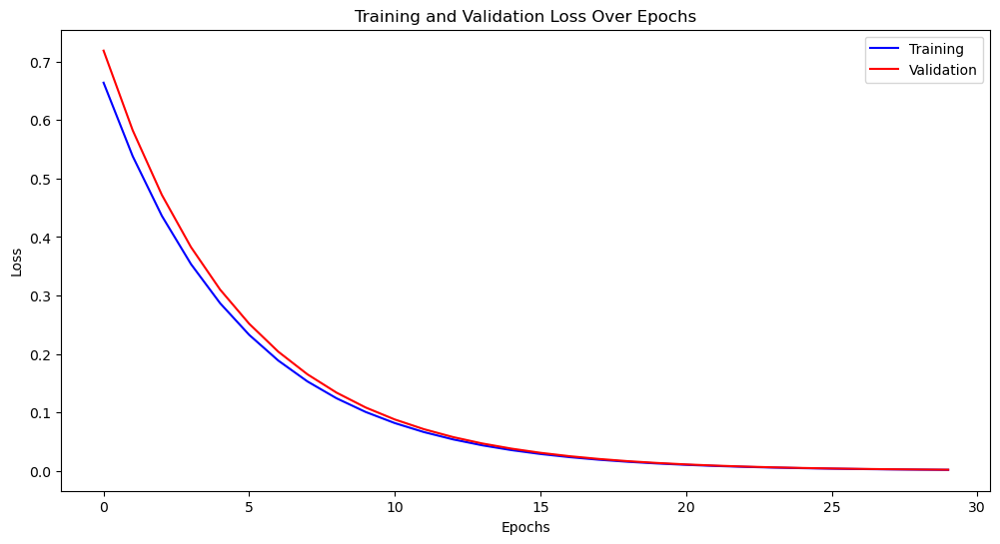

[I 2023-05-20 02:31:35,937] Trial 73 finished with value: 0.0019327856619773467 and parameters: {'num_leaves': 49, 'learning_rate': 0.09999475524771219}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


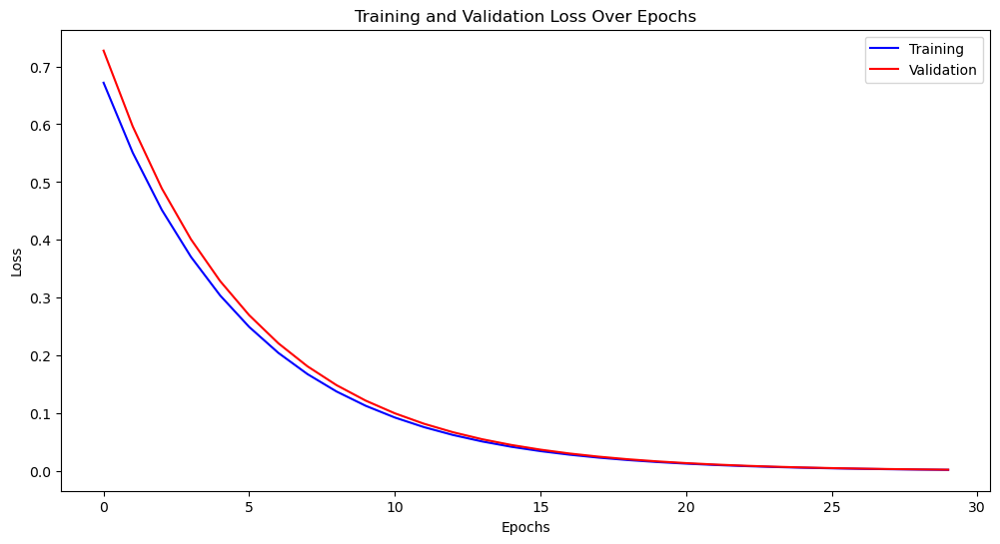

[I 2023-05-20 02:31:36,184] Trial 74 finished with value: 0.0026508007813515148 and parameters: {'num_leaves': 47, 'learning_rate': 0.09470006653516212}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


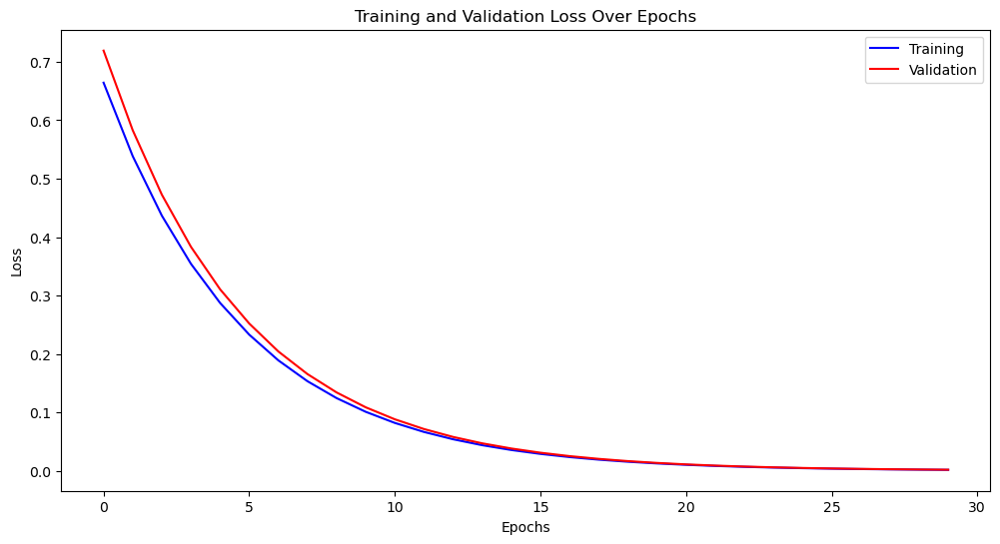

[I 2023-05-20 02:31:36,435] Trial 75 finished with value: 0.0019553967447683905 and parameters: {'num_leaves': 49, 'learning_rate': 0.0998202795959298}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


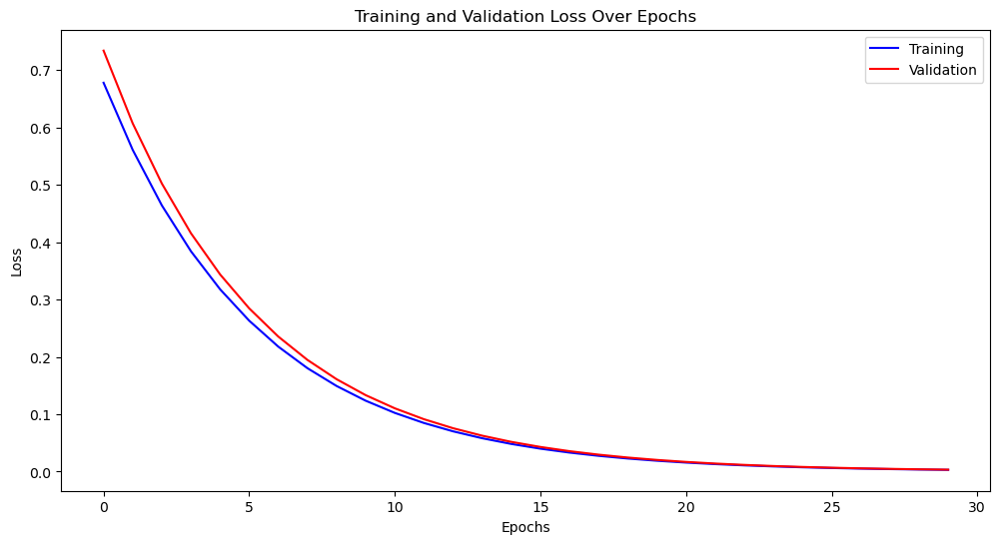

[I 2023-05-20 02:31:36,722] Trial 76 finished with value: 0.0033607826585344415 and parameters: {'num_leaves': 49, 'learning_rate': 0.09065960970235924}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


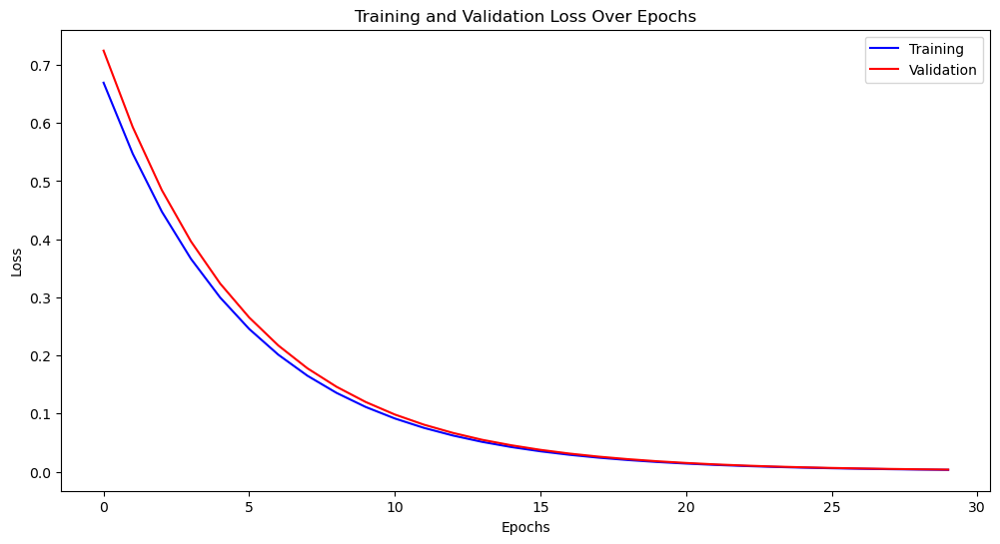

[I 2023-05-20 02:31:36,932] Trial 77 finished with value: 0.0034880529257666783 and parameters: {'num_leaves': 13, 'learning_rate': 0.0972067918314399}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


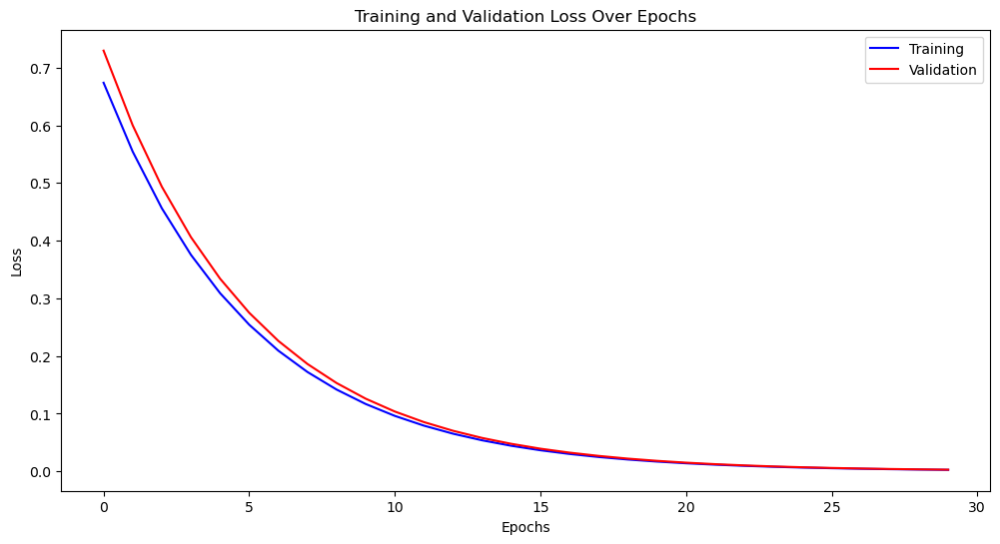

[I 2023-05-20 02:31:37,185] Trial 78 finished with value: 0.002881893905780645 and parameters: {'num_leaves': 48, 'learning_rate': 0.09323474237385557}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


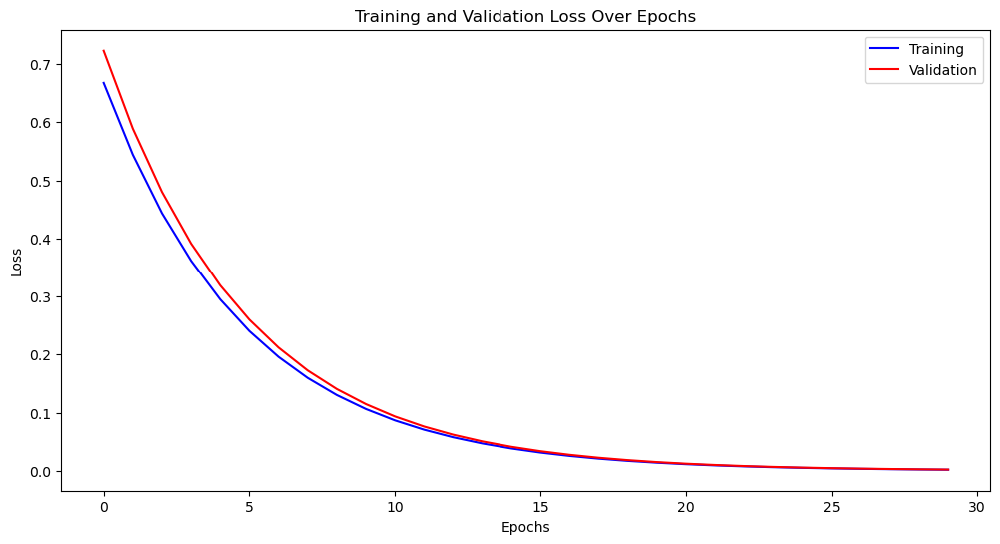

[I 2023-05-20 02:31:37,451] Trial 79 finished with value: 0.002241100599817491 and parameters: {'num_leaves': 50, 'learning_rate': 0.09748905924279513}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


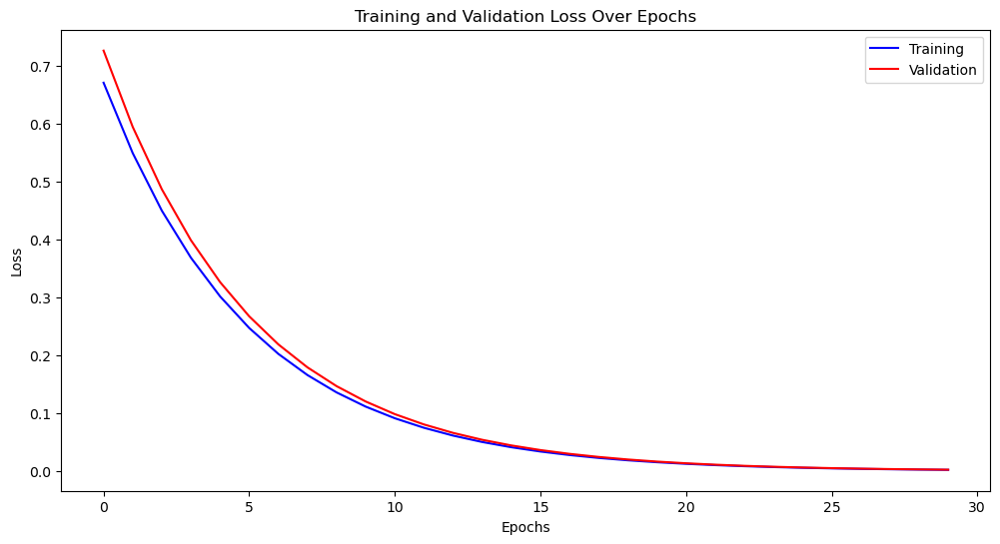

[I 2023-05-20 02:31:37,696] Trial 80 finished with value: 0.002551131325948356 and parameters: {'num_leaves': 47, 'learning_rate': 0.09537617286069419}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


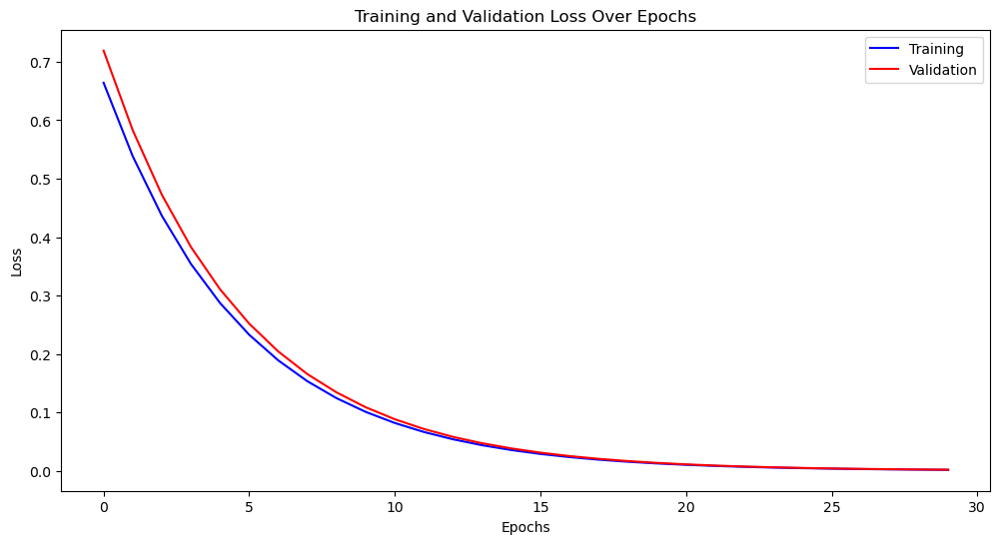

[I 2023-05-20 02:31:37,949] Trial 81 finished with value: 0.001995941111774712 and parameters: {'num_leaves': 45, 'learning_rate': 0.09993232322698467}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


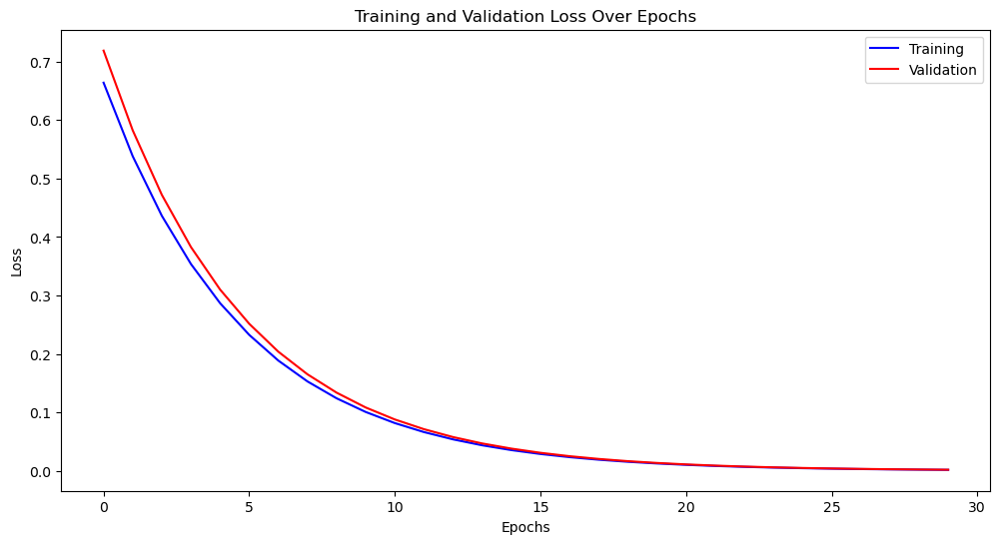

[I 2023-05-20 02:31:38,234] Trial 82 finished with value: 0.0019332002885685449 and parameters: {'num_leaves': 49, 'learning_rate': 0.09997588861652675}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


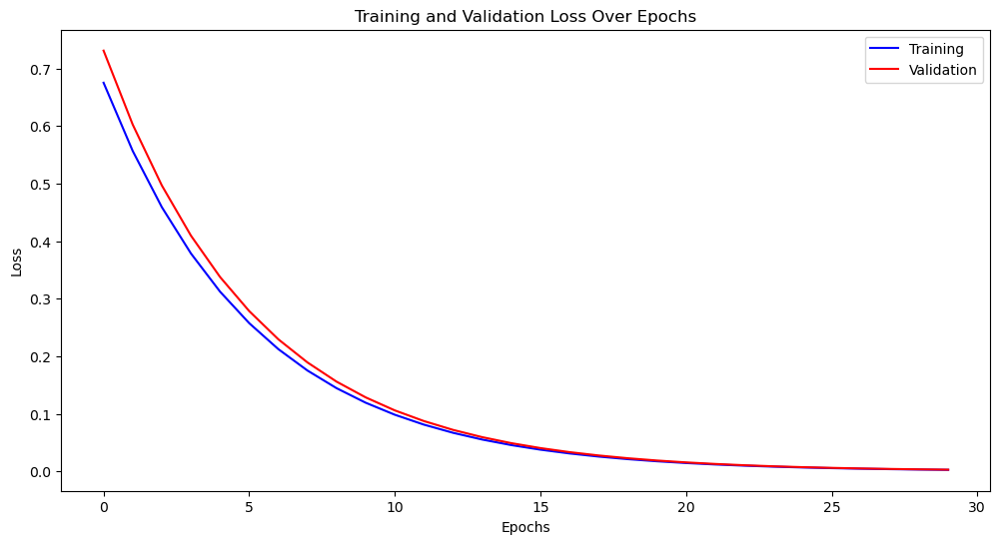

[I 2023-05-20 02:31:38,493] Trial 83 finished with value: 0.0030652930487295254 and parameters: {'num_leaves': 49, 'learning_rate': 0.09223280038472864}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


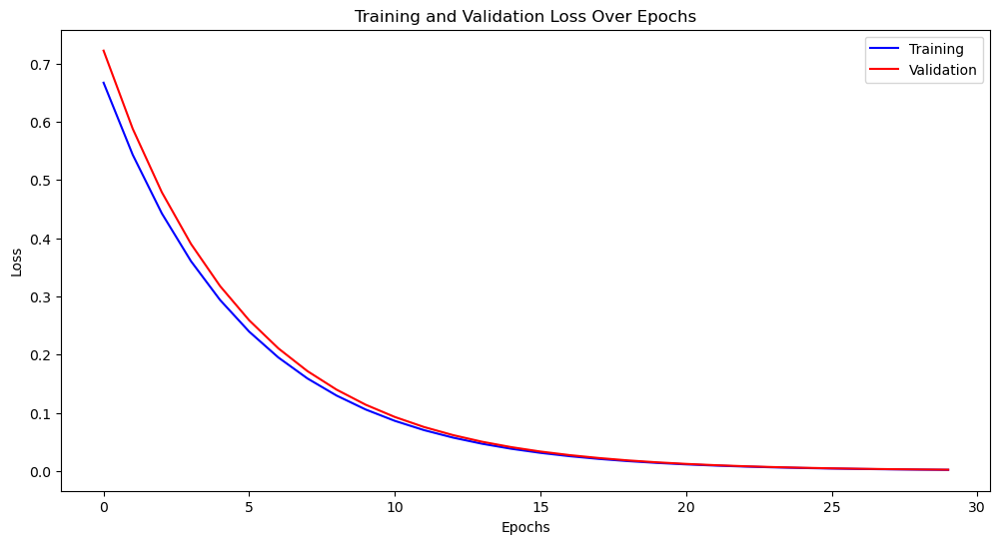

[I 2023-05-20 02:31:38,744] Trial 84 finished with value: 0.0022267206554169383 and parameters: {'num_leaves': 48, 'learning_rate': 0.09780690685496982}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


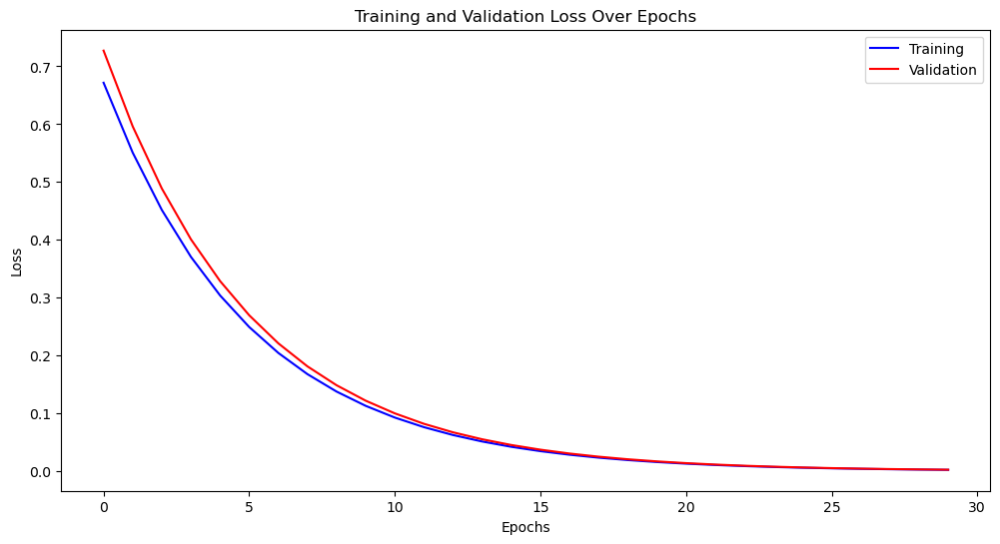

[I 2023-05-20 02:31:39,003] Trial 85 finished with value: 0.0026250244245967515 and parameters: {'num_leaves': 47, 'learning_rate': 0.09474109539154353}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


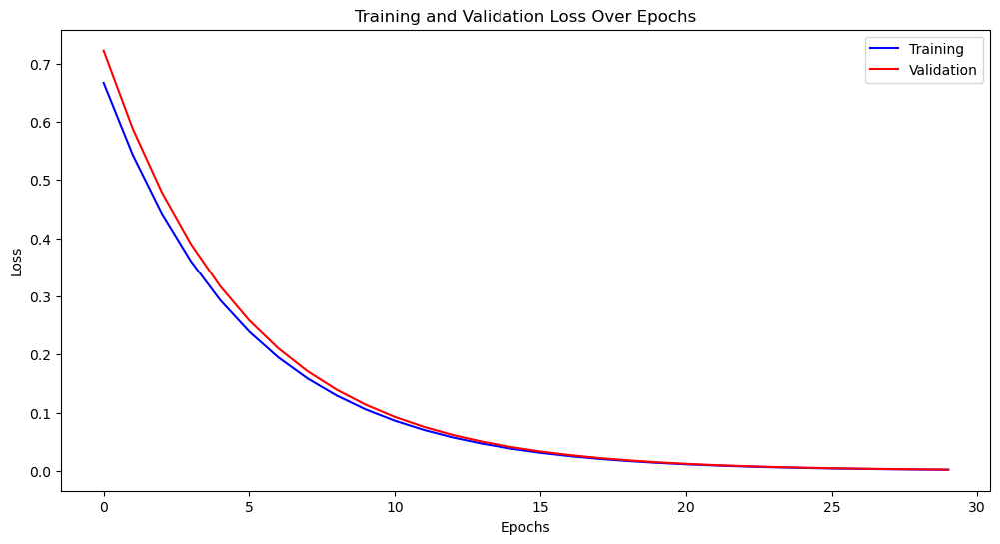

[I 2023-05-20 02:31:39,262] Trial 86 finished with value: 0.002201029360369412 and parameters: {'num_leaves': 44, 'learning_rate': 0.09793702068032106}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


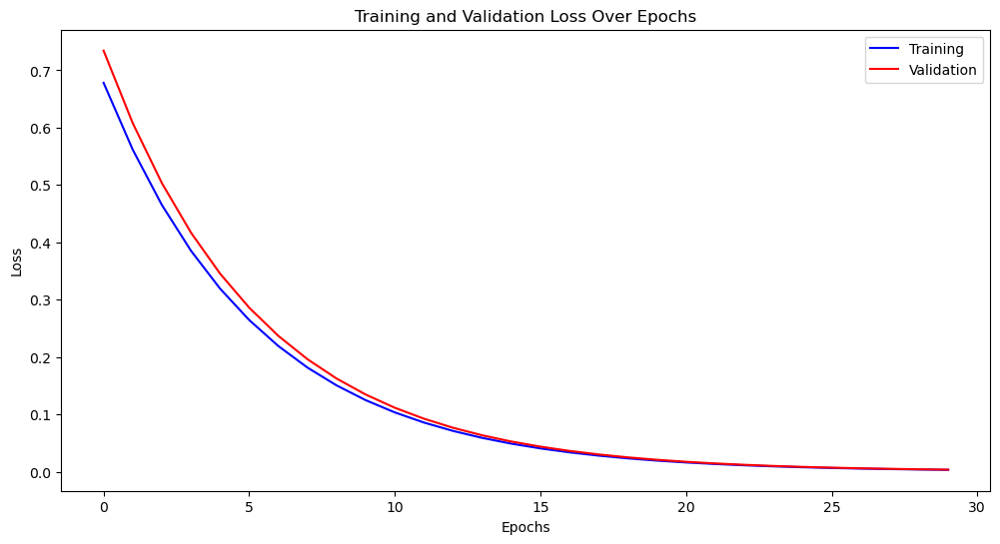

[I 2023-05-20 02:31:39,512] Trial 87 finished with value: 0.003445924233295386 and parameters: {'num_leaves': 50, 'learning_rate': 0.09023626552110042}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


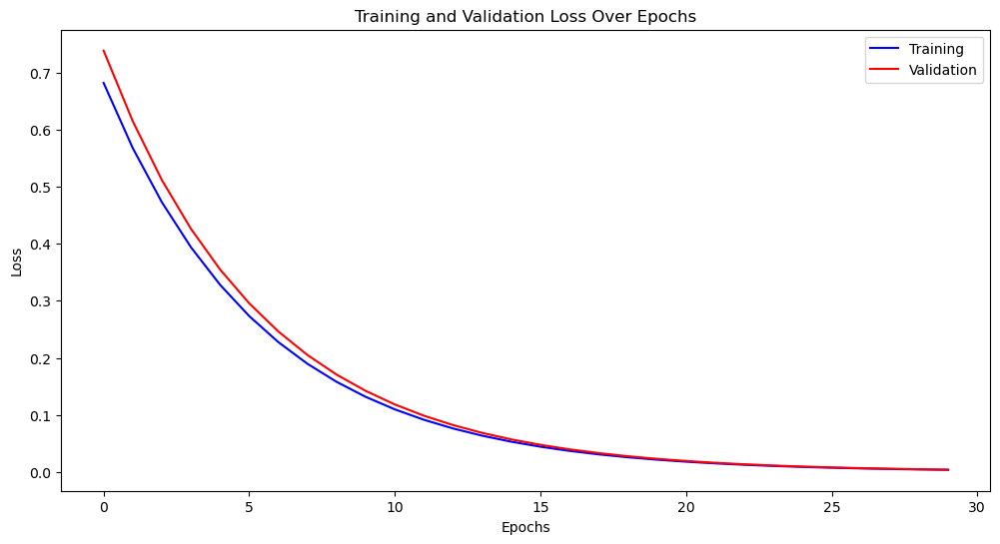

[I 2023-05-20 02:31:39,796] Trial 88 finished with value: 0.003985663166308672 and parameters: {'num_leaves': 43, 'learning_rate': 0.08781700950383134}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


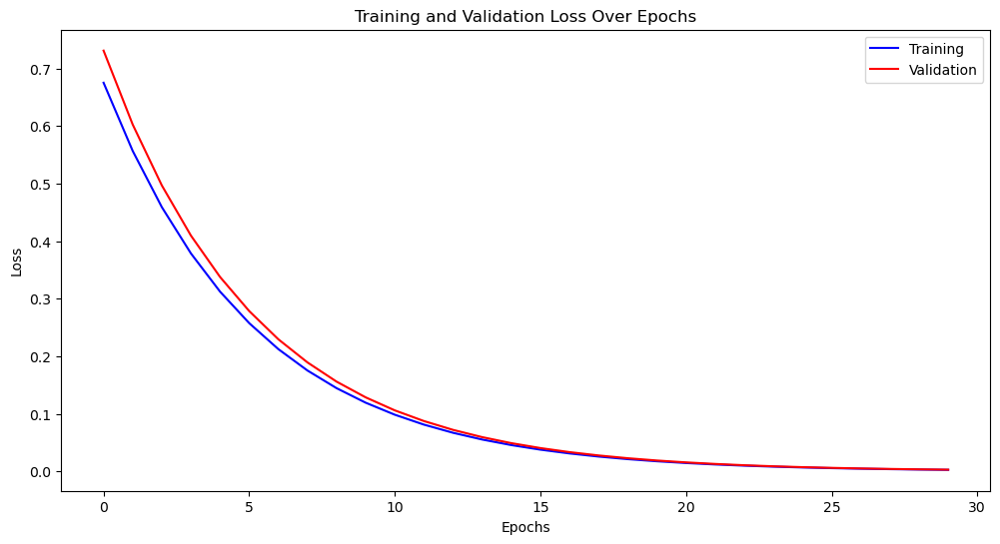

[I 2023-05-20 02:31:40,042] Trial 89 finished with value: 0.0030677704091094916 and parameters: {'num_leaves': 49, 'learning_rate': 0.09221865561776453}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


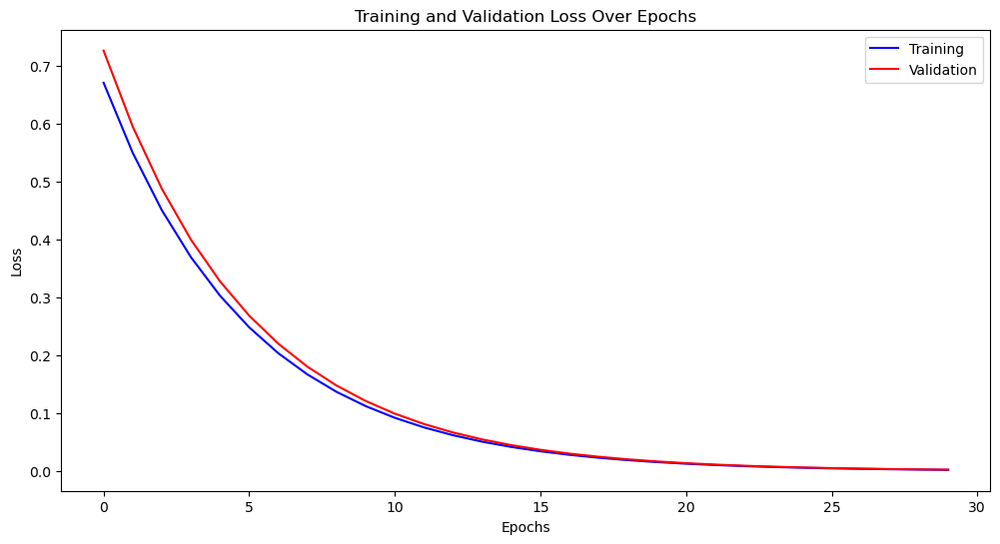

[I 2023-05-20 02:31:40,296] Trial 90 finished with value: 0.0026188738028934335 and parameters: {'num_leaves': 47, 'learning_rate': 0.09495790364243448}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


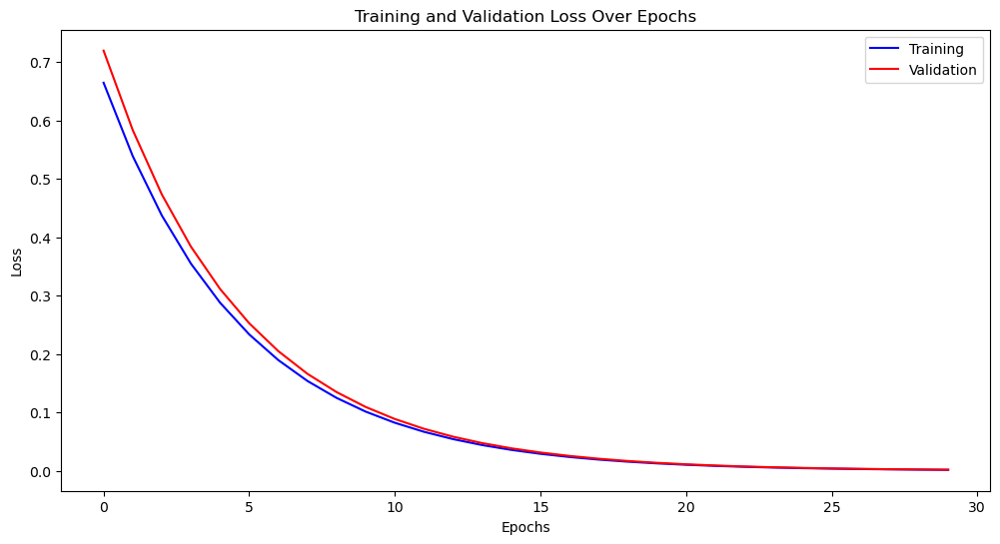

[I 2023-05-20 02:31:40,579] Trial 91 finished with value: 0.002009629117715343 and parameters: {'num_leaves': 45, 'learning_rate': 0.09969914553306579}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


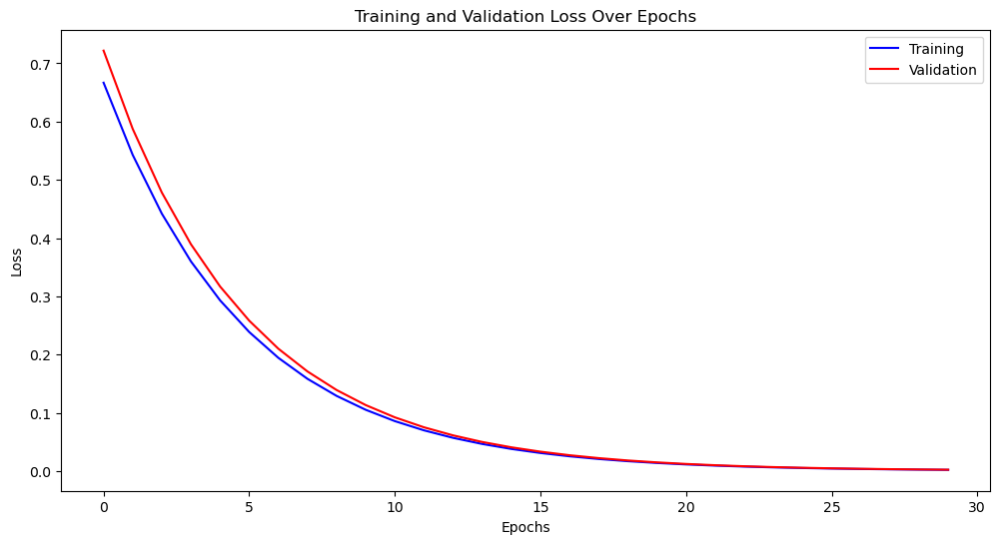

[I 2023-05-20 02:31:40,840] Trial 92 finished with value: 0.002181410295698061 and parameters: {'num_leaves': 49, 'learning_rate': 0.09804864099138955}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


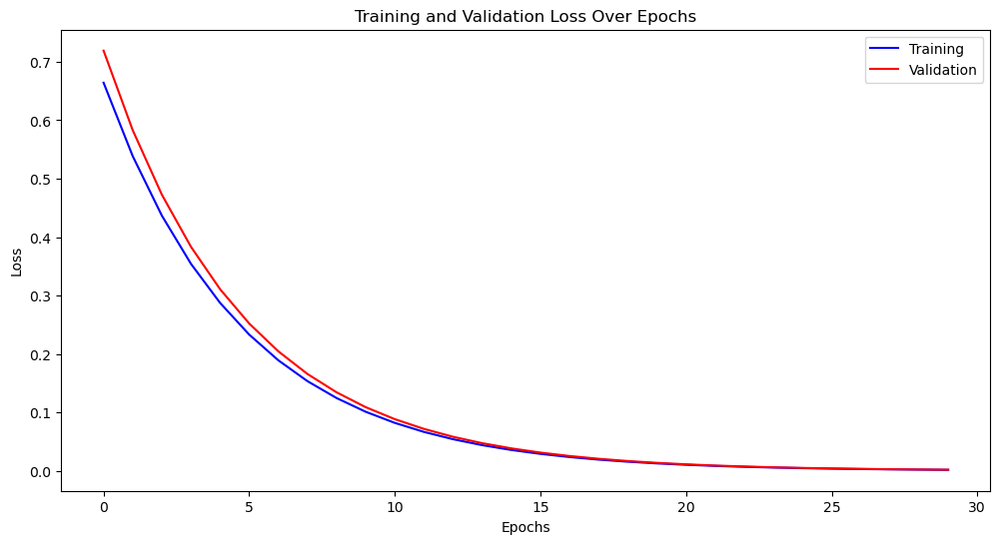

[I 2023-05-20 02:31:41,091] Trial 93 finished with value: 0.0019876807803642584 and parameters: {'num_leaves': 46, 'learning_rate': 0.09980566851796185}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


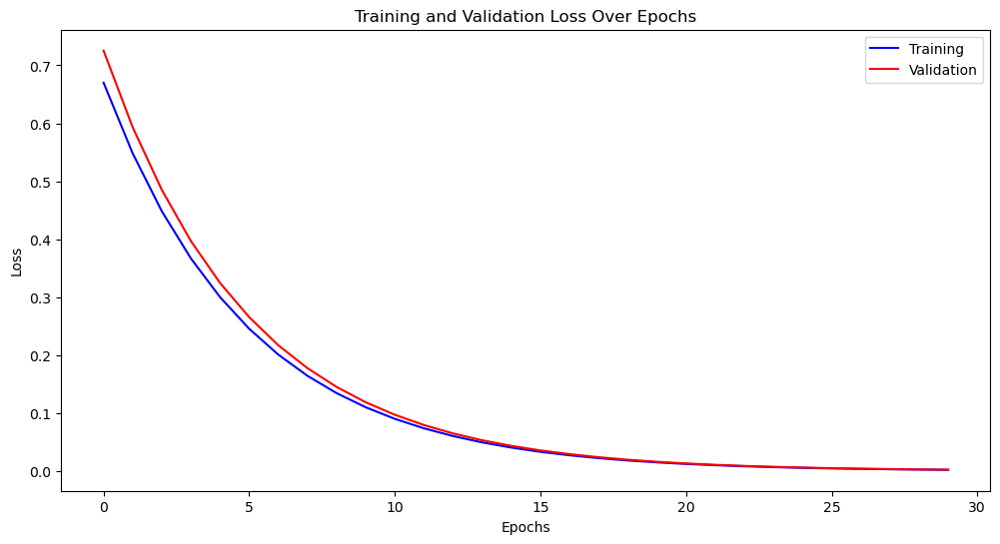

[I 2023-05-20 02:31:41,387] Trial 94 finished with value: 0.0024613755439271915 and parameters: {'num_leaves': 48, 'learning_rate': 0.09589436597236273}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


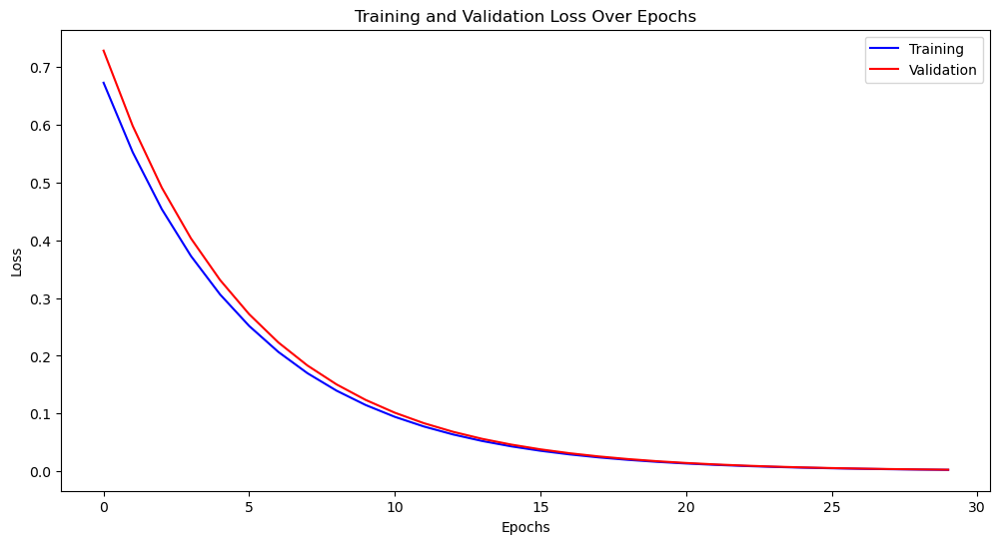

[I 2023-05-20 02:31:41,642] Trial 95 finished with value: 0.0027051256251177658 and parameters: {'num_leaves': 50, 'learning_rate': 0.09405338160069952}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


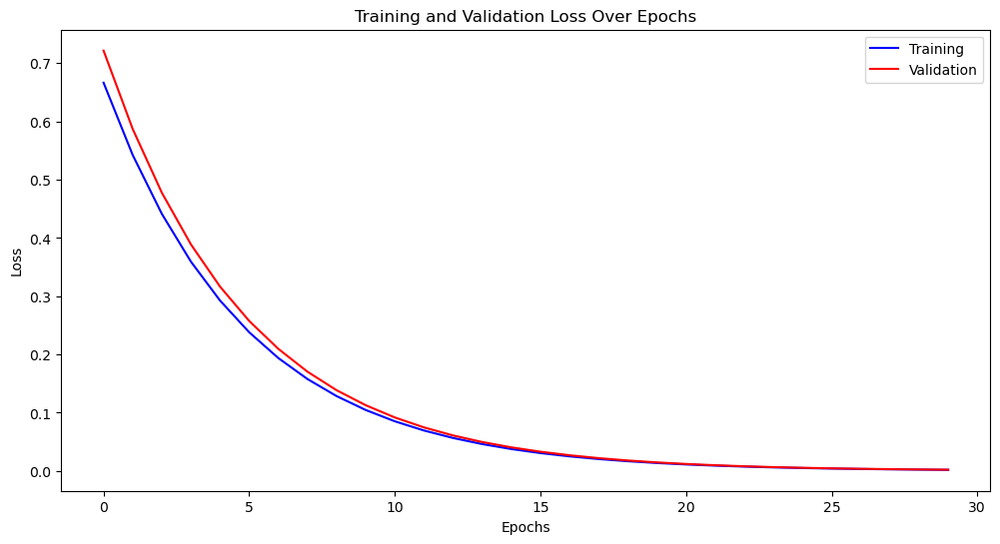

[I 2023-05-20 02:31:41,898] Trial 96 finished with value: 0.002171736177785216 and parameters: {'num_leaves': 46, 'learning_rate': 0.09823908252894452}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


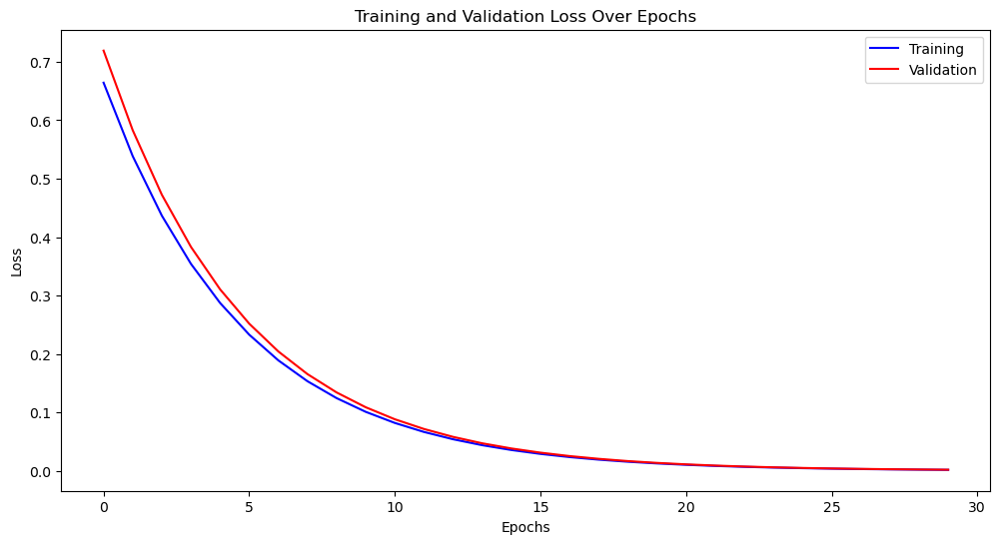

[I 2023-05-20 02:31:42,152] Trial 97 finished with value: 0.00197449013433735 and parameters: {'num_leaves': 47, 'learning_rate': 0.09984587239608933}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


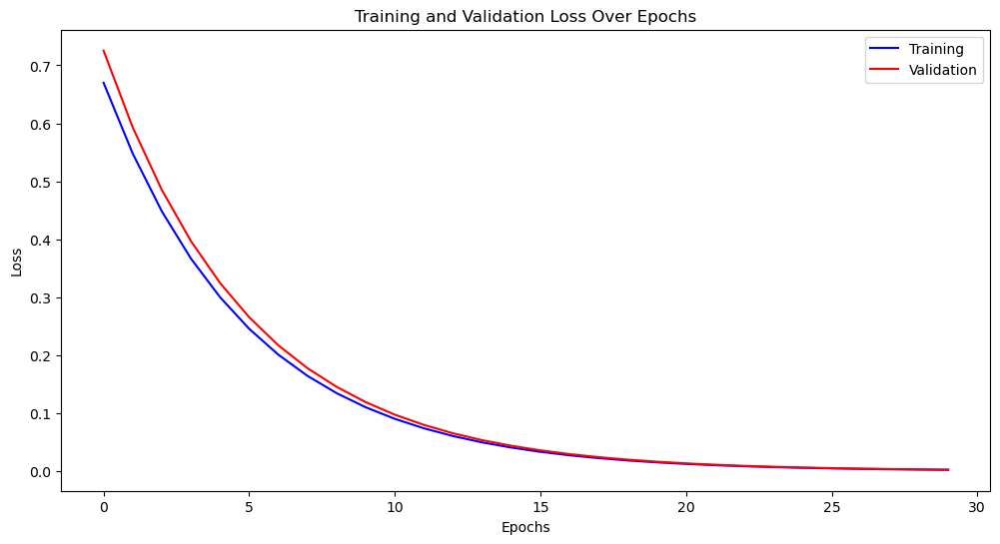

[I 2023-05-20 02:31:42,409] Trial 98 finished with value: 0.002500271659092686 and parameters: {'num_leaves': 41, 'learning_rate': 0.0959893427857774}. Best is trial 73 with value: 0.0019327856619773467.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


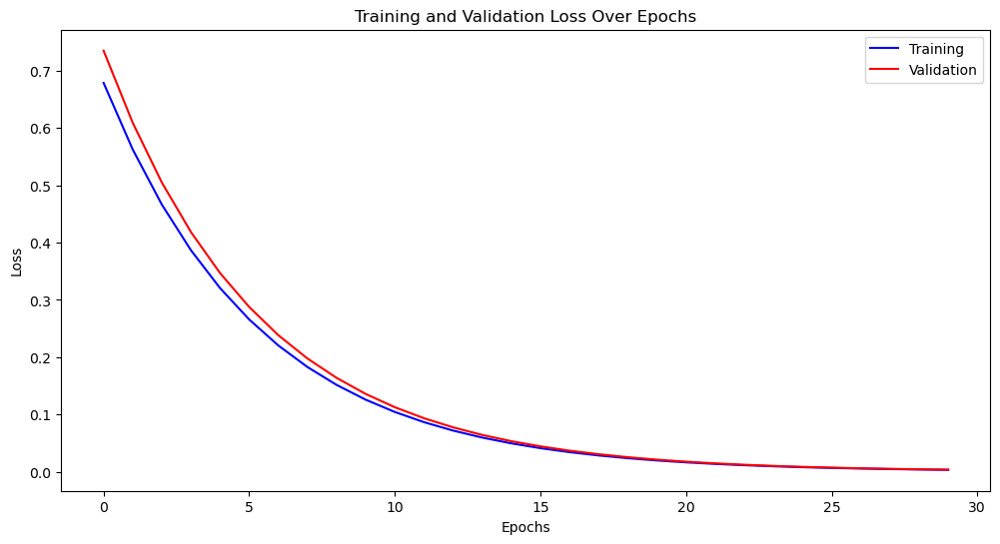

[I 2023-05-20 02:31:42,657] Trial 99 finished with value: 0.0035133766253379974 and parameters: {'num_leaves': 44, 'learning_rate': 0.08992943847984071}. Best is trial 73 with value: 0.0019327856619773467.


Best Parameters: {'num_leaves': 49, 'learning_rate': 0.09999475524771219}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7915
[LightGBM] [Info] Number of data points in the train set: 2650, number of used features: 32
[LightGBM] [Info] Start training from score 3.544292
Best MSE: 0.0019327856619773467
Best RMSE: 0.04396345825770928


c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


In [277]:


# model10Days = buildModel(params, lgb_ToTrainModel10Days, lgb_evalualtePerformanceDuringTraining10Days, 30)
# model30Days = buildModel(params, lgb_ToTrainModel30Days, lgb_evalualtePerformanceDuringTraining30Days, 30)
# model60Days = buildModel(params, lgb_ToTrainModel60Days, lgb_evalualtePerformanceDuringTraining60Days, 30)
# model120Days = buildModel(params, lgb_ToTrainModel120Days, lgb_evalualtePerformanceDuringTraining120Days, 30)


#Model for 30 Day Prediction
def objective(trial, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model1_30Days, loss_result = buildModel(params, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, 30)
    # Then you can plot the learning curves as follows:
    train_errors = loss_result['Train']['l2']
    valid_errors = loss_result['Test']['l2']

    plt.figure(figsize=(12, 6))
    plt.plot(range(len(train_errors)), train_errors, label='Training', color='blue')
    plt.plot(range(len(valid_errors)), valid_errors, label='Validation', color='red')
    plt.title('Training and Validation Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    predictedOutputValuesModel1_30Days = prediction(model1_30Days, inputFeatureDatabase_TestModel1_30Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel1_30Days, predictedOutputValuesModel1_30Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 1 - 30 days
inputFeatureDatabase_TrainModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TrainModel1_30Days, targetOutputVariable_TestModel1_30Days  = splittingTheDataset(appleDb, 'ClosePriceAfter30Days', 30, 0.2, 42)

lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel1_30Days, targetOutputVariable_TrainModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, inputFeatureDatabase_TestModel1_30Days, targetOutputVariable_TestModel1_30Days), n_trials=100)

best_paramsForModel1 = study.best_params
print("Best Parameters:", best_paramsForModel1)

# Re-run the model with the best parameters
#Number of training epochs: In machine learning, an epoch is one complete pass through the entire training dataset. If 30 represents the number of epochs, then each model will be trained for 30 iterations over the training data. The number of epochs can affect the accuracy of the model. Too few epochs can result in underfitting of the model, whereas too many epochs can lead to overfitting.
best_modelForModel1,lossResult = buildModel(best_paramsForModel1, lgb_ToTrainModel1_30Days, lgb_evalualtePerformanceDuringTrainingModel1_30Days, 30) 
predicted_outputForModel1 = prediction(best_modelForModel1, inputFeatureDatabase_TestModel1_30Days)

# Calculate the error with the best model
best_mseForModel1, best_rmseForModel1 = calculateMSERmse(targetOutputVariable_TestModel1_30Days, predicted_outputForModel1)

# Print intermediate results
print("Best MSE:", best_mseForModel1)
print("Best RMSE:", best_rmseForModel1)

#save the model 
filename = "model1.pkl"
pickle.dump(best_modelForModel1, open(filename, 'wb'))


    

In [256]:
def objective(trial, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model2_60Days = buildModel(params, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, 30)
    predictedOutputValuesModel2_60Days = prediction(model2_60Days, inputFeatureDatabase_TestModel2_60Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel2_60Days, predictedOutputValuesModel2_60Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 1 - 30 days
inputFeatureDatabase_TrainModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TrainModel2_60Days, targetOutputVariable_TestModel2_60Days  = splittingTheDataset(appleDb, 'ClosePriceAfter60Days', 60, 0.2, 42)

lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel2_60Days, targetOutputVariable_TrainModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, inputFeatureDatabase_TestModel2_60Days, targetOutputVariable_TestModel2_60Days), n_trials=100)

best_paramsForModel2 = study.best_params
print("Best Parameters:", best_paramsForModel2)

# Re-run the model with the best parameters
best_modelForModel2 = buildModel(best_paramsForModel2, lgb_ToTrainModel2_60Days, lgb_evalualtePerformanceDuringTrainingModel2_60Days, 30)
predicted_outputForModel2 = prediction(best_modelForModel2, inputFeatureDatabase_TestModel2_60Days)

# Calculate the error with the best model
best_mseForModel2, best_rmseForModel2 = calculateMSERmse(targetOutputVariable_TestModel2_60Days, predicted_outputForModel2)

# Print intermediate results
print("Best MSE:", best_mseForModel2)
print("Best RMSE:", best_rmseForModel2)

#save the model 
filename = "model2.pkl"
pickle.dump(best_modelForModel2, open(filename, 'wb'))

[I 2023-05-20 01:36:04,548] A new study created in memory with name: no-name-7b516b8d-a14d-4234-a46f-24c9936f01f7
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:04,589] Trial 0 finished with value: 0.0020154083440023633 and parameters: {'num_leaves': 6, 'learning_rate': 0.05274678523782546}. Best is trial 0 with value: 0.0020154083440023633.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is

                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10609 2023-01-11 05:00:00+00:00  4.875578  4.892651  4.869541  4.892501   
10610 2023-01-12 05:00:00+00:00  4.895418  4.898253  4.877025  4.891901   
10611 2023-01-13 05:00:00+00:00  4.881503  4.903156  4.878697  4.901970   
10612 2023-01-17 05:00:00+00:00  4.902489  4.920570  4.897284  4.910688   
10613 2023-01-18 05:00:00+00:00  4.917141  4.930139  4.903971  4.905303   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:04,776] Trial 2 finished with value: 0.00046318460907278776 and parameters: {'num_leaves': 43, 'learning_rate': 0.09062890690395947}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:04,885] Trial 3 finished

[78]	valid_0's l2: 0.000499618	valid_0's l1: 0.0151709
[79]	valid_0's l2: 0.00049796	valid_0's l1: 0.0151261
[80]	valid_0's l2: 0.000494427	valid_0's l1: 0.0150779
[81]	valid_0's l2: 0.000492586	valid_0's l1: 0.0150173
[82]	valid_0's l2: 0.000490086	valid_0's l1: 0.0149601
[83]	valid_0's l2: 0.000487606	valid_0's l1: 0.0149208
[84]	valid_0's l2: 0.000485393	valid_0's l1: 0.0148871
[85]	valid_0's l2: 0.000483459	valid_0's l1: 0.0148414
[86]	valid_0's l2: 0.000482726	valid_0's l1: 0.0148278
[87]	valid_0's l2: 0.000481298	valid_0's l1: 0.0148022
[88]	valid_0's l2: 0.000479768	valid_0's l1: 0.0147753
[89]	valid_0's l2: 0.000478075	valid_0's l1: 0.0147426
[90]	valid_0's l2: 0.000476114	valid_0's l1: 0.0147103
[91]	valid_0's l2: 0.000473935	valid_0's l1: 0.0146816
[92]	valid_0's l2: 0.000473081	valid_0's l1: 0.0146611
[93]	valid_0's l2: 0.000471745	valid_0's l1: 0.0146227
[94]	valid_0's l2: 0.000470716	valid_0's l1: 0.0145909
[95]	valid_0's l2: 0.000470049	valid_0's l1: 0.0145732
[96]	valid_

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,084] Trial 5 finished with value: 0.000778680549947404 and parameters: {'num_leaves': 48, 'learning_rate': 0.04302879616991986}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,145] Trial 6 finished w

[1]	valid_0's l2: 0.783291	valid_0's l1: 0.756288
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.717394	valid_0's l1: 0.723633
[3]	valid_0's l2: 0.657347	valid_0's l1: 0.692624
[4]	valid_0's l2: 0.60208	valid_0's l1: 0.662752
[5]	valid_0's l2: 0.551643	valid_0's l1: 0.634271
[6]	valid_0's l2: 0.505247	valid_0's l1: 0.606939
[7]	valid_0's l2: 0.462838	valid_0's l1: 0.580814
[8]	valid_0's l2: 0.424158	valid_0's l1: 0.555872
[9]	valid_0's l2: 0.388495	valid_0's l1: 0.531874
[10]	valid_0's l2: 0.356083	valid_0's l1: 0.509092
[11]	valid_0's l2: 0.326309	valid_0's l1: 0.487248
[12]	valid_0's l2: 0.299012	valid_0's l1: 0.466338
[13]	valid_0's l2: 0.274101	valid_0's l1: 0.446346
[14]	valid_0's l2: 0.251191	valid_0's l1: 0.427131
[15]	valid_0's l2: 0.230353	valid_0's l1: 0.408863
[16]	valid_0's l2: 0.211069	valid_0's l1: 0.391263
[17]	valid_0's l2: 0.193518	valid_0's l1: 0.374487
[18]	valid_0's l2: 0.177375	valid_0's l1: 0.358378
[19]	valid_0's l2: 0.162603	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,287] Trial 7 finished with value: 0.058783858987946136 and parameters: {'num_leaves': 42, 'learning_rate': 0.013447478578635663}. Best is trial 2 with value: 0.00046318460907278776.


[1]	valid_0's l2: 0.832291	valid_0's l1: 0.779714
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.810104	valid_0's l1: 0.769199
[3]	valid_0's l2: 0.788485	valid_0's l1: 0.758814
[4]	valid_0's l2: 0.767466	valid_0's l1: 0.748594
[5]	valid_0's l2: 0.746989	valid_0's l1: 0.738501
[6]	valid_0's l2: 0.72707	valid_0's l1: 0.728548
[7]	valid_0's l2: 0.707745	valid_0's l1: 0.718777
[8]	valid_0's l2: 0.688911	valid_0's l1: 0.709113
[9]	valid_0's l2: 0.670533	valid_0's l1: 0.69957
[10]	valid_0's l2: 0.652696	valid_0's l1: 0.690182
[11]	valid_0's l2: 0.635304	valid_0's l1: 0.680897
[12]	valid_0's l2: 0.618401	valid_0's l1: 0.671751
[13]	valid_0's l2: 0.601946	valid_0's l1: 0.662725
[14]	valid_0's l2: 0.585886	valid_0's l1: 0.653798
[15]	valid_0's l2: 0.570282	valid_0's l1: 0.645019
[16]	valid_0's l2: 0.555129	valid_0's l1: 0.636359
[17]	valid_0's l2: 0.540311	valid_0's l1: 0.627777
[18]	valid_0's l2: 0.525941	valid_0's l1: 0.619355
[19]	valid_0's l2: 0.511967	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,368] Trial 8 finished with value: 0.0005567965998911531 and parameters: {'num_leaves': 25, 'learning_rate': 0.09504082997098326}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,455] Trial 9 finished 

[87]	valid_0's l2: 0.000587664	valid_0's l1: 0.0168144
[88]	valid_0's l2: 0.000586528	valid_0's l1: 0.0167947
[89]	valid_0's l2: 0.000582515	valid_0's l1: 0.0167262
[90]	valid_0's l2: 0.000578914	valid_0's l1: 0.0166675
[91]	valid_0's l2: 0.000576083	valid_0's l1: 0.0166128
[92]	valid_0's l2: 0.000572471	valid_0's l1: 0.0165543
[93]	valid_0's l2: 0.000568812	valid_0's l1: 0.016487
[94]	valid_0's l2: 0.000566847	valid_0's l1: 0.016452
[95]	valid_0's l2: 0.000564708	valid_0's l1: 0.0164111
[96]	valid_0's l2: 0.000565084	valid_0's l1: 0.0164144
[97]	valid_0's l2: 0.000562899	valid_0's l1: 0.0163702
[98]	valid_0's l2: 0.000561211	valid_0's l1: 0.0163454
[99]	valid_0's l2: 0.000557763	valid_0's l1: 0.0162839
[100]	valid_0's l2: 0.000556797	valid_0's l1: 0.0162643
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000556797	valid_0's l1: 0.0162643
[1]	valid_0's l2: 0.79319	valid_0's l1: 0.761061
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2:

[I 2023-05-20 01:36:05,568] Trial 10 finished with value: 0.000515834191917799 and parameters: {'num_leaves': 33, 'learning_rate': 0.09011419866657189}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,705] Trial 11 finished with value: 0.00048732370838176623 and parameters: {'num_leaves': 35, 'learning_rate': 0.09334496018280229}. Best is trial 2 with value: 0.00046318460907278776.


[96]	valid_0's l2: 0.000522878	valid_0's l1: 0.0155593
[97]	valid_0's l2: 0.000520449	valid_0's l1: 0.0155128
[98]	valid_0's l2: 0.000517942	valid_0's l1: 0.0154886
[99]	valid_0's l2: 0.000515834	valid_0's l1: 0.0154469
[100]	valid_0's l2: 0.00051584	valid_0's l1: 0.015443
Did not meet early stopping. Best iteration is:
[99]	valid_0's l2: 0.000515834	valid_0's l1: 0.0154469
[1]	valid_0's l2: 0.703195	valid_0's l1: 0.716415
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.578852	valid_0's l1: 0.64983
[3]	valid_0's l2: 0.47659	valid_0's l1: 0.589381
[4]	valid_0's l2: 0.392159	valid_0's l1: 0.534395
[5]	valid_0's l2: 0.322973	valid_0's l1: 0.484749
[6]	valid_0's l2: 0.266093	valid_0's l1: 0.439591
[7]	valid_0's l2: 0.219442	valid_0's l1: 0.398881
[8]	valid_0's l2: 0.180829	valid_0's l1: 0.361749
[9]	valid_0's l2: 0.14917	valid_0's l1: 0.328362
[10]	valid_0's l2: 0.122965	valid_0's l1: 0.29782
[11]	valid_0's l2: 0.101498	valid_0's l1: 0.27045
[12]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:05,853] Trial 12 finished with value: 0.0004886692465756441 and parameters: {'num_leaves': 49, 'learning_rate': 0.0791173550258743}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[32]	valid_0's l2: 0.00537348	valid_0's l1: 0.0603892
[33]	valid_0's l2: 0.0046805	valid_0's l1: 0.0561301
[34]	valid_0's l2: 0.00408886	valid_0's l1: 0.052225
[35]	valid_0's l2: 0.00358125	valid_0's l1: 0.0486374
[36]	valid_0's l2: 0.00315165	valid_0's l1: 0.0453664
[37]	valid_0's l2: 0.00278741	valid_0's l1: 0.0424323
[38]	valid_0's l2: 0.00247392	valid_0's l1: 0.0397395
[39]	valid_0's l2: 0.00220778	valid_0's l1: 0.0373249
[40]	valid_0's l2: 0.00198459	valid_0's l1: 0.0351676
[41]	valid_0's l2: 0.00178884	valid_0's l1: 0.0331604
[42]	valid_0's l2: 0.00162284	valid_0's l1: 0.0313787
[43]	valid_0's l2: 0.00148332	valid_0's l1: 0.0297913
[44]	valid_0's l2: 0.0013556	valid_0's l1: 0.0282454
[45]	valid_0's l2: 0.00124954	valid_0's l1: 0.0269085
[46]	valid_0's l2: 0.00115889	valid_0's l1: 0.0256855
[47]	valid_0's l2: 0.00108158	valid_0's l1: 0.0245832
[48]	valid_0's l2: 0.00101685	valid_0's l1: 0.0236243
[49]	valid_0's l2: 0.000958767	valid_0's l1: 0.0227601
[50]	valid_0's l2: 0.00090797	

[I 2023-05-20 01:36:05,969] Trial 13 finished with value: 0.0005347023406908779 and parameters: {'num_leaves': 33, 'learning_rate': 0.07578208851899022}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:06,112] Trial 14 finished with value: 0.0004842232654599392 and parameters: {'num_leaves': 42, 'learning_rate': 0.09818419166077935}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.695661	valid_0's l1: 0.712615
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.566618	valid_0's l1: 0.642911
[3]	valid_0's l2: 0.461135	valid_0's l1: 0.579742
[4]	valid_0's l2: 0.37544	valid_0's l1: 0.522902
[5]	valid_0's l2: 0.305999	valid_0's l1: 0.471799
[6]	valid_0's l2: 0.249199	valid_0's l1: 0.425496
[7]	valid_0's l2: 0.203258	valid_0's l1: 0.383938
[8]	valid_0's l2: 0.165678	valid_0's l1: 0.346354
[9]	valid_0's l2: 0.135177	valid_0's l1: 0.312638
[10]	valid_0's l2: 0.110425	valid_0's l1: 0.282339
[11]	valid_0's l2: 0.0901881	valid_0's l1: 0.254926
[12]	valid_0's l2: 0.0736391	valid_0's l1: 0.230051
[13]	valid_0's l2: 0.0601603	valid_0's l1: 0.207651
[14]	valid_0's l2: 0.0491901	valid_0's l1: 0.187503
[15]	valid_0's l2: 0.0402432	valid_0's l1: 0.169309
[16]	valid_0's l2: 0.0329243	valid_0's l1: 0.152898
[17]	valid_0's l2: 0.0269819	valid_0's l1: 0.138147
[18]	valid_0's l2: 0.0221424	valid_0's l1: 0.124973
[19]	valid_0's l2: 0.01

[I 2023-05-20 01:36:06,271] Trial 15 finished with value: 0.0005001356033716662 and parameters: {'num_leaves': 42, 'learning_rate': 0.09950558490926141}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[47]	valid_0's l2: 0.000731645	valid_0's l1: 0.0186503
[48]	valid_0's l2: 0.000711757	valid_0's l1: 0.0183175
[49]	valid_0's l2: 0.000693423	valid_0's l1: 0.0180114
[50]	valid_0's l2: 0.000680568	valid_0's l1: 0.0178004
[51]	valid_0's l2: 0.000665817	valid_0's l1: 0.017561
[52]	valid_0's l2: 0.00065511	valid_0's l1: 0.0173617
[53]	valid_0's l2: 0.000642456	valid_0's l1: 0.0171692
[54]	valid_0's l2: 0.000631818	valid_0's l1: 0.0169931
[55]	valid_0's l2: 0.00062587	valid_0's l1: 0.0168836
[56]	valid_0's l2: 0.000617145	valid_0's l1: 0.0167594
[57]	valid_0's l2: 0.000609815	valid_0's l1: 0.0166195
[58]	valid_0's l2: 0.000604241	valid_0's l1: 0.0165206
[59]	valid_0's l2: 0.000598922	valid_0's l1: 0.0164156
[60]	valid_0's l2: 0.000595847	valid_0's l1: 0.016303
[61]	valid_0's l2: 0.000591344	valid_0's l1: 0.0162251
[62]	valid_0's l2: 0.000587665	valid_0's l1: 0.0161558
[63]	valid_0's l2: 0.000583066	valid_0's l1: 0.0160783
[64]	valid_0's l2: 0.00057808	valid_0's l1: 0.016007
[65]	valid_0's l

[I 2023-05-20 01:36:06,398] Trial 16 finished with value: 0.0004995019875986279 and parameters: {'num_leaves': 41, 'learning_rate': 0.07233608421680052}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:06,506] Trial 17 finished with value: 0.000534618545215328 and parameters: {'num_leaves': 29, 'learning_rate': 0.08545712371281684}. Best is trial 2 with value: 0.00046318460907278776.


[89]	valid_0's l2: 0.000525268	valid_0's l1: 0.0154292
[90]	valid_0's l2: 0.000523039	valid_0's l1: 0.0153998
[91]	valid_0's l2: 0.000520463	valid_0's l1: 0.0153611
[92]	valid_0's l2: 0.000518234	valid_0's l1: 0.0153204
[93]	valid_0's l2: 0.000515268	valid_0's l1: 0.0152611
[94]	valid_0's l2: 0.000512936	valid_0's l1: 0.0152344
[95]	valid_0's l2: 0.000510426	valid_0's l1: 0.0151912
[96]	valid_0's l2: 0.000507852	valid_0's l1: 0.0151479
[97]	valid_0's l2: 0.000506165	valid_0's l1: 0.015103
[98]	valid_0's l2: 0.000504155	valid_0's l1: 0.0150603
[99]	valid_0's l2: 0.000502009	valid_0's l1: 0.0150299
[100]	valid_0's l2: 0.000499502	valid_0's l1: 0.0149902
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000499502	valid_0's l1: 0.0149902
[1]	valid_0's l2: 0.715668	valid_0's l1: 0.722776
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.599662	valid_0's l1: 0.661419
[3]	valid_0's l2: 0.501979	valid_0's l1: 0.604867
[4]	valid_0's l2: 0.42056

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:06,654] Trial 18 finished with value: 0.0005095654470210352 and parameters: {'num_leaves': 46, 'learning_rate': 0.06901784851893589}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:06,774] Trial 19 finishe

[51]	valid_0's l2: 0.00132505	valid_0's l1: 0.0279133
[52]	valid_0's l2: 0.00123936	valid_0's l1: 0.0268425
[53]	valid_0's l2: 0.00116213	valid_0's l1: 0.0258235
[54]	valid_0's l2: 0.00109682	valid_0's l1: 0.0249142
[55]	valid_0's l2: 0.0010336	valid_0's l1: 0.024025
[56]	valid_0's l2: 0.00097816	valid_0's l1: 0.0232141
[57]	valid_0's l2: 0.0009303	valid_0's l1: 0.0224839
[58]	valid_0's l2: 0.000888236	valid_0's l1: 0.0218281
[59]	valid_0's l2: 0.000853584	valid_0's l1: 0.0212521
[60]	valid_0's l2: 0.000821074	valid_0's l1: 0.0206712
[61]	valid_0's l2: 0.000791971	valid_0's l1: 0.0201721
[62]	valid_0's l2: 0.000768298	valid_0's l1: 0.0197046
[63]	valid_0's l2: 0.000743581	valid_0's l1: 0.0192666
[64]	valid_0's l2: 0.000722285	valid_0's l1: 0.0188722
[65]	valid_0's l2: 0.000705067	valid_0's l1: 0.0185641
[66]	valid_0's l2: 0.000688343	valid_0's l1: 0.018284
[67]	valid_0's l2: 0.000672659	valid_0's l1: 0.0180037
[68]	valid_0's l2: 0.000658147	valid_0's l1: 0.0177406
[69]	valid_0's l2: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:06,882] Trial 20 finished with value: 0.0005247036145593749 and parameters: {'num_leaves': 30, 'learning_rate': 0.08731886628224286}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.712747	valid_0's l1: 0.721284
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.594824	valid_0's l1: 0.658744
[3]	valid_0's l2: 0.495936	valid_0's l1: 0.60114
[4]	valid_0's l2: 0.413805	valid_0's l1: 0.548839
[5]	valid_0's l2: 0.345041	valid_0's l1: 0.500767
[6]	valid_0's l2: 0.288116	valid_0's l1: 0.457312
[7]	valid_0's l2: 0.24065	valid_0's l1: 0.417466
[8]	valid_0's l2: 0.200824	valid_0's l1: 0.381087
[9]	valid_0's l2: 0.167821	valid_0's l1: 0.348039
[10]	valid_0's l2: 0.140292	valid_0's l1: 0.317898
[11]	valid_0's l2: 0.117406	valid_0's l1: 0.290576
[12]	valid_0's l2: 0.0981377	valid_0's l1: 0.265409
[13]	valid_0's l2: 0.0820581	valid_0's l1: 0.242268
[14]	valid_0's l2: 0.068651	valid_0's l1: 0.221332
[15]	valid_0's l2: 0.0575942	valid_0's l1: 0.202455
[16]	valid_0's l2: 0.0483212	valid_0's l1: 0.185157
[17]	valid_0's l2: 0.0405603	valid_0's l1: 0.169277
[18]	valid_0's l2: 0.0340751	valid_0's l1: 0.154827
[19]	valid_0's l2: 0.02861

[I 2023-05-20 01:36:07,005] Trial 21 finished with value: 0.00047891570143949276 and parameters: {'num_leaves': 39, 'learning_rate': 0.09630484336458978}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:07,134] Trial 22 finished with value: 0.0004657373569188564 and parameters: {'num_leaves': 40, 'learning_rate': 0.09951312654152024}. Best is trial 2 with value: 0.00046318460907278776.


[77]	valid_0's l2: 0.000510563	valid_0's l1: 0.0154184
[78]	valid_0's l2: 0.000507653	valid_0's l1: 0.0153676
[79]	valid_0's l2: 0.000505867	valid_0's l1: 0.0153173
[80]	valid_0's l2: 0.000504557	valid_0's l1: 0.015263
[81]	valid_0's l2: 0.000503815	valid_0's l1: 0.015241
[82]	valid_0's l2: 0.000500616	valid_0's l1: 0.0151925
[83]	valid_0's l2: 0.00049824	valid_0's l1: 0.0151405
[84]	valid_0's l2: 0.000496105	valid_0's l1: 0.0151027
[85]	valid_0's l2: 0.000494563	valid_0's l1: 0.0150769
[86]	valid_0's l2: 0.000492709	valid_0's l1: 0.0150486
[87]	valid_0's l2: 0.000491726	valid_0's l1: 0.015039
[88]	valid_0's l2: 0.000490193	valid_0's l1: 0.0150191
[89]	valid_0's l2: 0.000488863	valid_0's l1: 0.0149981
[90]	valid_0's l2: 0.000486775	valid_0's l1: 0.0149705
[91]	valid_0's l2: 0.000485709	valid_0's l1: 0.0149506
[92]	valid_0's l2: 0.000484996	valid_0's l1: 0.0149316
[93]	valid_0's l2: 0.000483882	valid_0's l1: 0.0149056
[94]	valid_0's l2: 0.000483283	valid_0's l1: 0.0149066
[95]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:07,287] Trial 23 finished with value: 0.0005235883357214199 and parameters: {'num_leaves': 45, 'learning_rate': 0.08339520177323327}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[25]	valid_0's l2: 0.0123254	valid_0's l1: 0.0925503
[26]	valid_0's l2: 0.0105238	valid_0's l1: 0.0852961
[27]	valid_0's l2: 0.00899631	valid_0's l1: 0.0786444
[28]	valid_0's l2: 0.00771075	valid_0's l1: 0.0725861
[29]	valid_0's l2: 0.00663393	valid_0's l1: 0.0671462
[30]	valid_0's l2: 0.0057215	valid_0's l1: 0.0621373
[31]	valid_0's l2: 0.00495435	valid_0's l1: 0.0575377
[32]	valid_0's l2: 0.00430842	valid_0's l1: 0.0533713
[33]	valid_0's l2: 0.00375838	valid_0's l1: 0.0495821
[34]	valid_0's l2: 0.00329489	valid_0's l1: 0.0461571
[35]	valid_0's l2: 0.00290169	valid_0's l1: 0.0430939
[36]	valid_0's l2: 0.00257242	valid_0's l1: 0.0403389
[37]	valid_0's l2: 0.00229332	valid_0's l1: 0.037882
[38]	valid_0's l2: 0.00204941	valid_0's l1: 0.0355879
[39]	valid_0's l2: 0.00184145	valid_0's l1: 0.0335309
[40]	valid_0's l2: 0.00166447	valid_0's l1: 0.0316417
[41]	valid_0's l2: 0.00151643	valid_0's l1: 0.0299644
[42]	valid_0's l2: 0.00139327	valid_0's l1: 0.0284508
[43]	valid_0's l2: 0.00128425	va

[I 2023-05-20 01:36:07,420] Trial 24 finished with value: 0.0004656936992468082 and parameters: {'num_leaves': 37, 'learning_rate': 0.087961877518588}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:07,561] Trial 25 finished with value: 0.0005233491398405974 and parameters: {'num_leaves': 45, 'learning_rate': 0.06696509622736765}. Best is trial 2 with value: 0.00046318460907278776.


[74]	valid_0's l2: 0.000529566	valid_0's l1: 0.0155988
[75]	valid_0's l2: 0.000528184	valid_0's l1: 0.0155643
[76]	valid_0's l2: 0.000522926	valid_0's l1: 0.0154767
[77]	valid_0's l2: 0.000520224	valid_0's l1: 0.0154159
[78]	valid_0's l2: 0.00051593	valid_0's l1: 0.0153526
[79]	valid_0's l2: 0.000511508	valid_0's l1: 0.0152726
[80]	valid_0's l2: 0.000508049	valid_0's l1: 0.0152003
[81]	valid_0's l2: 0.000505116	valid_0's l1: 0.015142
[82]	valid_0's l2: 0.000501402	valid_0's l1: 0.0150782
[83]	valid_0's l2: 0.000497688	valid_0's l1: 0.0150292
[84]	valid_0's l2: 0.000494978	valid_0's l1: 0.0149902
[85]	valid_0's l2: 0.000493576	valid_0's l1: 0.0149656
[86]	valid_0's l2: 0.000490967	valid_0's l1: 0.0149104
[87]	valid_0's l2: 0.00048927	valid_0's l1: 0.0148608
[88]	valid_0's l2: 0.000487685	valid_0's l1: 0.0148191
[89]	valid_0's l2: 0.000484965	valid_0's l1: 0.0147596
[90]	valid_0's l2: 0.000483246	valid_0's l1: 0.014721
[91]	valid_0's l2: 0.000480001	valid_0's l1: 0.0146552
[92]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:07,693] Trial 26 finished with value: 0.000494280449719529 and parameters: {'num_leaves': 36, 'learning_rate': 0.08972009884420447}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.708967	valid_0's l1: 0.719364
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.588315	valid_0's l1: 0.655141
[3]	valid_0's l2: 0.487967	valid_0's l1: 0.596397
[4]	valid_0's l2: 0.404637	valid_0's l1: 0.542968
[5]	valid_0's l2: 0.335802	valid_0's l1: 0.49446
[6]	valid_0's l2: 0.279005	valid_0's l1: 0.450352
[7]	valid_0's l2: 0.231842	valid_0's l1: 0.410249
[8]	valid_0's l2: 0.192438	valid_0's l1: 0.373412
[9]	valid_0's l2: 0.159936	valid_0's l1: 0.340208
[10]	valid_0's l2: 0.132889	valid_0's l1: 0.309789
[11]	valid_0's l2: 0.110524	valid_0's l1: 0.282226
[12]	valid_0's l2: 0.0919514	valid_0's l1: 0.257288
[13]	valid_0's l2: 0.0765078	valid_0's l1: 0.234408
[14]	valid_0's l2: 0.0636586	valid_0's l1: 0.213484
[15]	valid_0's l2: 0.0530161	valid_0's l1: 0.194539
[16]	valid_0's l2: 0.0442018	valid_0's l1: 0.177426
[17]	valid_0's l2: 0.0368768	valid_0's l1: 0.161871
[18]	valid_0's l2: 0.0308208	valid_0's l1: 0.147717
[19]	valid_0's l2: 0.025

[I 2023-05-20 01:36:07,813] Trial 27 finished with value: 0.0005251718552627865 and parameters: {'num_leaves': 32, 'learning_rate': 0.08120646284064742}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[68]	valid_0's l2: 0.000642615	valid_0's l1: 0.0177626
[69]	valid_0's l2: 0.000633762	valid_0's l1: 0.0176316
[70]	valid_0's l2: 0.00062561	valid_0's l1: 0.0174856
[71]	valid_0's l2: 0.000619745	valid_0's l1: 0.0173872
[72]	valid_0's l2: 0.000613693	valid_0's l1: 0.0172786
[73]	valid_0's l2: 0.000609564	valid_0's l1: 0.017198
[74]	valid_0's l2: 0.000604816	valid_0's l1: 0.0171185
[75]	valid_0's l2: 0.000601864	valid_0's l1: 0.0170387
[76]	valid_0's l2: 0.000599339	valid_0's l1: 0.0169825
[77]	valid_0's l2: 0.000595984	valid_0's l1: 0.0169097
[78]	valid_0's l2: 0.000591771	valid_0's l1: 0.0168313
[79]	valid_0's l2: 0.000588303	valid_0's l1: 0.0167797
[80]	valid_0's l2: 0.000584439	valid_0's l1: 0.0167152
[81]	valid_0's l2: 0.000579955	valid_0's l1: 0.0166401
[82]	valid_0's l2: 0.000576469	valid_0's l1: 0.0165772
[83]	valid_0's l2: 0.000571306	valid_0's l1: 0.0164976
[84]	valid_0's l2: 0.00056707	valid_0's l1: 0.0164121
[85]	valid_0's l2: 0.000564226	valid_0's l1: 0.0163644
[86]	valid_0'

[I 2023-05-20 01:36:07,981] Trial 28 finished with value: 0.0004966232542439668 and parameters: {'num_leaves': 50, 'learning_rate': 0.08694392257431506}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:08,091] Trial 29 finished with value: 0.0006566331744656827 and parameters: {'num_leaves': 26, 'learning_rate': 0.06168844986373159}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.753113	valid_0's l1: 0.741491
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.663804	valid_0's l1: 0.696004
[3]	valid_0's l2: 0.584947	valid_0's l1: 0.653141
[4]	valid_0's l2: 0.515527	valid_0's l1: 0.612878
[5]	valid_0's l2: 0.454239	valid_0's l1: 0.575099
[6]	valid_0's l2: 0.400482	valid_0's l1: 0.539785
[7]	valid_0's l2: 0.35297	valid_0's l1: 0.506429
[8]	valid_0's l2: 0.311328	valid_0's l1: 0.475336
[9]	valid_0's l2: 0.274642	valid_0's l1: 0.446278
[10]	valid_0's l2: 0.242216	valid_0's l1: 0.418859
[11]	valid_0's l2: 0.213863	valid_0's l1: 0.393403
[12]	valid_0's l2: 0.188764	valid_0's l1: 0.369503
[13]	valid_0's l2: 0.166503	valid_0's l1: 0.346809
[14]	valid_0's l2: 0.147001	valid_0's l1: 0.325537
[15]	valid_0's l2: 0.129837	valid_0's l1: 0.305761
[16]	valid_0's l2: 0.114579	valid_0's l1: 0.286988
[17]	valid_0's l2: 0.101221	valid_0's l1: 0.26954
[18]	valid_0's l2: 0.0893774	valid_0's l1: 0.253076
[19]	valid_0's l2: 0.0790345	va

[I 2023-05-20 01:36:08,207] Trial 30 finished with value: 0.0004885000341683052 and parameters: {'num_leaves': 38, 'learning_rate': 0.07841578249041531}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:08,352] Trial 31 finished with value: 0.00046383949352233754 and parameters: {'num_leaves': 40, 'learning_rate': 0.09207887578208142}. Best is trial 2 with value: 0.00046318460907278776.


[83]	valid_0's l2: 0.000527242	valid_0's l1: 0.0157922
[84]	valid_0's l2: 0.000524766	valid_0's l1: 0.015744
[85]	valid_0's l2: 0.000522527	valid_0's l1: 0.0157176
[86]	valid_0's l2: 0.000518671	valid_0's l1: 0.0156558
[87]	valid_0's l2: 0.000515549	valid_0's l1: 0.0156004
[88]	valid_0's l2: 0.000513023	valid_0's l1: 0.0155636
[89]	valid_0's l2: 0.000510999	valid_0's l1: 0.0155299
[90]	valid_0's l2: 0.000509065	valid_0's l1: 0.0154911
[91]	valid_0's l2: 0.000507047	valid_0's l1: 0.0154516
[92]	valid_0's l2: 0.000504596	valid_0's l1: 0.0154077
[93]	valid_0's l2: 0.000501696	valid_0's l1: 0.0153585
[94]	valid_0's l2: 0.000498924	valid_0's l1: 0.0153135
[95]	valid_0's l2: 0.000496902	valid_0's l1: 0.0152685
[96]	valid_0's l2: 0.000495866	valid_0's l1: 0.0152373
[97]	valid_0's l2: 0.000493158	valid_0's l1: 0.0151972
[98]	valid_0's l2: 0.000490864	valid_0's l1: 0.015147
[99]	valid_0's l2: 0.000489146	valid_0's l1: 0.0151151
[100]	valid_0's l2: 0.0004885	valid_0's l1: 0.0151122
Did not meet 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:08,423] Trial 32 finished with value: 0.0009718368162408306 and parameters: {'num_leaves': 8, 'learning_rate': 0.09114067679876373}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.710547	valid_0's l1: 0.719276
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.591304	valid_0's l1: 0.654971
[3]	valid_0's l2: 0.492491	valid_0's l1: 0.596609
[4]	valid_0's l2: 0.41012	valid_0's l1: 0.54399
[5]	valid_0's l2: 0.342002	valid_0's l1: 0.49674
[6]	valid_0's l2: 0.285264	valid_0's l1: 0.453148
[7]	valid_0's l2: 0.238783	valid_0's l1: 0.413867
[8]	valid_0's l2: 0.19967	valid_0's l1: 0.377871
[9]	valid_0's l2: 0.167113	valid_0's l1: 0.345026
[10]	valid_0's l2: 0.14034	valid_0's l1: 0.315264
[11]	valid_0's l2: 0.118136	valid_0's l1: 0.288716
[12]	valid_0's l2: 0.0993095	valid_0's l1: 0.264465
[13]	valid_0's l2: 0.0835336	valid_0's l1: 0.241805
[14]	valid_0's l2: 0.0705687	valid_0's l1: 0.221008
[15]	valid_0's l2: 0.0596654	valid_0's l1: 0.203054
[16]	valid_0's l2: 0.0506248	valid_0's l1: 0.186568
[17]	valid_0's l2: 0.0429313	valid_0's l1: 0.171704
[18]	valid_0's l2: 0.0365917	valid_0's l1: 0.158187
[19]	valid_0's l2: 0.0312903

[I 2023-05-20 01:36:08,572] Trial 33 finished with value: 0.00047991075660170545 and parameters: {'num_leaves': 46, 'learning_rate': 0.0931250130164616}. Best is trial 2 with value: 0.00046318460907278776.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:08,710] Trial 34 finished with value: 0.0004976559797161558 and parameters: {'num_leaves': 36, 'learning_rate': 0.08313414791177808}. Best is trial 2 with value: 0.00046318460907278776.


[98]	valid_0's l2: 0.000481076	valid_0's l1: 0.014475
[99]	valid_0's l2: 0.000480695	valid_0's l1: 0.0144657
[100]	valid_0's l2: 0.000479911	valid_0's l1: 0.0144563
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000479911	valid_0's l1: 0.0144563
[1]	valid_0's l2: 0.719226	valid_0's l1: 0.724568
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.605398	valid_0's l1: 0.664622
[3]	valid_0's l2: 0.509384	valid_0's l1: 0.609442
[4]	valid_0's l2: 0.428366	valid_0's l1: 0.558685
[5]	valid_0's l2: 0.360479	valid_0's l1: 0.512334
[6]	valid_0's l2: 0.303539	valid_0's l1: 0.469843
[7]	valid_0's l2: 0.255656	valid_0's l1: 0.430839
[8]	valid_0's l2: 0.215376	valid_0's l1: 0.395153
[9]	valid_0's l2: 0.181389	valid_0's l1: 0.362336
[10]	valid_0's l2: 0.153051	valid_0's l1: 0.332611
[11]	valid_0's l2: 0.129048	valid_0's l1: 0.305049
[12]	valid_0's l2: 0.108811	valid_0's l1: 0.279883
[13]	valid_0's l2: 0.0918166	valid_0's l1: 0.256865
[14]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:08,845] Trial 35 finished with value: 0.00046228773537686815 and parameters: {'num_leaves': 40, 'learning_rate': 0.09035098849999133}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[25]	valid_0's l2: 0.00871574	valid_0's l1: 0.0775205
[26]	valid_0's l2: 0.00738104	valid_0's l1: 0.0711188
[27]	valid_0's l2: 0.0062618	valid_0's l1: 0.0653179
[28]	valid_0's l2: 0.00533102	valid_0's l1: 0.0599586
[29]	valid_0's l2: 0.00457273	valid_0's l1: 0.0552557
[30]	valid_0's l2: 0.00392383	valid_0's l1: 0.0509544
[31]	valid_0's l2: 0.0033983	valid_0's l1: 0.0472129
[32]	valid_0's l2: 0.00294916	valid_0's l1: 0.0437457
[33]	valid_0's l2: 0.00258025	valid_0's l1: 0.040736
[34]	valid_0's l2: 0.00226829	valid_0's l1: 0.0380384
[35]	valid_0's l2: 0.00201496	valid_0's l1: 0.0356795
[36]	valid_0's l2: 0.00180033	valid_0's l1: 0.0335187
[37]	valid_0's l2: 0.00162029	valid_0's l1: 0.0315851
[38]	valid_0's l2: 0.00146247	valid_0's l1: 0.029838
[39]	valid_0's l2: 0.00133154	valid_0's l1: 0.0282665
[40]	valid_0's l2: 0.00122283	valid_0's l1: 0.0268577
[41]	valid_0's l2: 0.00112792	valid_0's l1: 0.0255633
[42]	valid_0's l2: 0.00104814	valid_0's l1: 0.0244236
[43]	valid_0's l2: 0.000984061	v

[I 2023-05-20 01:36:08,979] Trial 36 finished with value: 0.0005055790001156291 and parameters: {'num_leaves': 43, 'learning_rate': 0.07586515762378104}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:09,113] Trial 37 finished with value: 0.0005052126529676002 and parameters: {'num_leaves': 35, 'learning_rate': 0.08619650261061737}. Best is trial 35 with value: 0.00046228773537686815.


[92]	valid_0's l2: 0.000519175	valid_0's l1: 0.0153871
[93]	valid_0's l2: 0.000517245	valid_0's l1: 0.0153521
[94]	valid_0's l2: 0.000515449	valid_0's l1: 0.0153218
[95]	valid_0's l2: 0.000513772	valid_0's l1: 0.0152986
[96]	valid_0's l2: 0.000512272	valid_0's l1: 0.015267
[97]	valid_0's l2: 0.000510935	valid_0's l1: 0.0152488
[98]	valid_0's l2: 0.000509054	valid_0's l1: 0.0152126
[99]	valid_0's l2: 0.000506924	valid_0's l1: 0.015175
[100]	valid_0's l2: 0.000505579	valid_0's l1: 0.0151436
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000505579	valid_0's l1: 0.0151436
[1]	valid_0's l2: 0.714299	valid_0's l1: 0.722071
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.597317	valid_0's l1: 0.660182
[3]	valid_0's l2: 0.499211	valid_0's l1: 0.60328
[4]	valid_0's l2: 0.417151	valid_0's l1: 0.551254
[5]	valid_0's l2: 0.348876	valid_0's l1: 0.503822
[6]	valid_0's l2: 0.291917	valid_0's l1: 0.460577
[7]	valid_0's l2: 0.2444	valid_0's l1: 0.4

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:09,258] Trial 38 finished with value: 0.0004850484402342684 and parameters: {'num_leaves': 44, 'learning_rate': 0.09136287621176324}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[42]	valid_0's l2: 0.00101319	valid_0's l1: 0.0235425
[43]	valid_0's l2: 0.000956437	valid_0's l1: 0.0226401
[44]	valid_0's l2: 0.000904487	valid_0's l1: 0.0218327
[45]	valid_0's l2: 0.00085854	valid_0's l1: 0.0211193
[46]	valid_0's l2: 0.000820483	valid_0's l1: 0.0205362
[47]	valid_0's l2: 0.000790521	valid_0's l1: 0.0200237
[48]	valid_0's l2: 0.000760766	valid_0's l1: 0.0195239
[49]	valid_0's l2: 0.000735411	valid_0's l1: 0.0190831
[50]	valid_0's l2: 0.000713609	valid_0's l1: 0.0186967
[51]	valid_0's l2: 0.000694428	valid_0's l1: 0.0183646
[52]	valid_0's l2: 0.000677035	valid_0's l1: 0.018058
[53]	valid_0's l2: 0.000664567	valid_0's l1: 0.0177982
[54]	valid_0's l2: 0.000650054	valid_0's l1: 0.0175532
[55]	valid_0's l2: 0.00063738	valid_0's l1: 0.0173465
[56]	valid_0's l2: 0.000627106	valid_0's l1: 0.0171572
[57]	valid_0's l2: 0.000617543	valid_0's l1: 0.0169568
[58]	valid_0's l2: 0.000609428	valid_0's l1: 0.016805
[59]	valid_0's l2: 0.000602231	valid_0's l1: 0.0166622
[60]	valid_0's 

[I 2023-05-20 01:36:09,557] Trial 39 finished with value: 0.0004919246388955428 and parameters: {'num_leaves': 38, 'learning_rate': 0.08086374281713447}. Best is trial 35 with value: 0.00046228773537686815.


[28]	valid_0's l2: 0.00889591	valid_0's l1: 0.0782219
[29]	valid_0's l2: 0.00766268	valid_0's l1: 0.0724302
[30]	valid_0's l2: 0.00662792	valid_0's l1: 0.0671668
[31]	valid_0's l2: 0.00575109	valid_0's l1: 0.0623494
[32]	valid_0's l2: 0.00500124	valid_0's l1: 0.0579348
[33]	valid_0's l2: 0.0043553	valid_0's l1: 0.0538039
[34]	valid_0's l2: 0.00381098	valid_0's l1: 0.0501219
[35]	valid_0's l2: 0.00335622	valid_0's l1: 0.0467809
[36]	valid_0's l2: 0.00296723	valid_0's l1: 0.0437812
[37]	valid_0's l2: 0.00263614	valid_0's l1: 0.0410732
[38]	valid_0's l2: 0.00235047	valid_0's l1: 0.0386525
[39]	valid_0's l2: 0.00210219	valid_0's l1: 0.036402
[40]	valid_0's l2: 0.00190045	valid_0's l1: 0.03444
[41]	valid_0's l2: 0.00172453	valid_0's l1: 0.0326587
[42]	valid_0's l2: 0.00157502	valid_0's l1: 0.030992
[43]	valid_0's l2: 0.00144015	valid_0's l1: 0.0294559
[44]	valid_0's l2: 0.0013302	valid_0's l1: 0.0280936
[45]	valid_0's l2: 0.0012322	valid_0's l1: 0.0268066
[46]	valid_0's l2: 0.00114868	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:09,657] Trial 40 finished with value: 0.000577004505042726 and parameters: {'num_leaves': 21, 'learning_rate': 0.09389769850701601}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.702828	valid_0's l1: 0.716159
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.578212	valid_0's l1: 0.649271
[3]	valid_0's l2: 0.475613	valid_0's l1: 0.588415
[4]	valid_0's l2: 0.39142	valid_0's l1: 0.533543
[5]	valid_0's l2: 0.322047	valid_0's l1: 0.483425
[6]	valid_0's l2: 0.265415	valid_0's l1: 0.43861
[7]	valid_0's l2: 0.218411	valid_0's l1: 0.397448
[8]	valid_0's l2: 0.179838	valid_0's l1: 0.360013
[9]	valid_0's l2: 0.148237	valid_0's l1: 0.326366
[10]	valid_0's l2: 0.122176	valid_0's l1: 0.29599
[11]	valid_0's l2: 0.101047	valid_0's l1: 0.268818
[12]	valid_0's l2: 0.0835231	valid_0's l1: 0.244033
[13]	valid_0's l2: 0.0691517	valid_0's l1: 0.221714
[14]	valid_0's l2: 0.0572552	valid_0's l1: 0.201305
[15]	valid_0's l2: 0.0474015	valid_0's l1: 0.182884
[16]	valid_0's l2: 0.0393311	valid_0's l1: 0.16634
[17]	valid_0's l2: 0.0326387	valid_0's l1: 0.15115
[18]	valid_0's l2: 0.0271464	valid_0's l1: 0.137571
[19]	valid_0's l2: 0.0226011

[I 2023-05-20 01:36:09,790] Trial 41 finished with value: 0.0004786037279887056 and parameters: {'num_leaves': 41, 'learning_rate': 0.09953517054136041}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:09,952] Trial 42 finished with value: 0.00048015099449999916 and parameters: {'num_leaves': 47, 'learning_rate': 0.08868674352953165}. Best is trial 35 with value: 0.00046228773537686815.


[89]	valid_0's l2: 0.000488467	valid_0's l1: 0.0146651
[90]	valid_0's l2: 0.000487182	valid_0's l1: 0.0146446
[91]	valid_0's l2: 0.000486612	valid_0's l1: 0.0146361
[92]	valid_0's l2: 0.000485371	valid_0's l1: 0.0146055
[93]	valid_0's l2: 0.000484886	valid_0's l1: 0.0145957
[94]	valid_0's l2: 0.000484106	valid_0's l1: 0.0145681
[95]	valid_0's l2: 0.000482562	valid_0's l1: 0.014525
[96]	valid_0's l2: 0.000480943	valid_0's l1: 0.014503
[97]	valid_0's l2: 0.000480131	valid_0's l1: 0.0144865
[98]	valid_0's l2: 0.000479497	valid_0's l1: 0.0144691
[99]	valid_0's l2: 0.000478884	valid_0's l1: 0.0144573
[100]	valid_0's l2: 0.000478604	valid_0's l1: 0.0144494
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000478604	valid_0's l1: 0.0144494
[1]	valid_0's l2: 0.710558	valid_0's l1: 0.720243
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.590714	valid_0's l1: 0.656522
[3]	valid_0's l2: 0.490863	valid_0's l1: 0.598312
[4]	valid_0's l2: 0.40821	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:10,089] Trial 43 finished with value: 0.0004684677458391485 and parameters: {'num_leaves': 40, 'learning_rate': 0.0945558518274019}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.701319	valid_0's l1: 0.715507
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.575605	valid_0's l1: 0.647998
[3]	valid_0's l2: 0.472275	valid_0's l1: 0.586689
[4]	valid_0's l2: 0.387557	valid_0's l1: 0.531298
[5]	valid_0's l2: 0.318198	valid_0's l1: 0.481091
[6]	valid_0's l2: 0.261378	valid_0's l1: 0.435751
[7]	valid_0's l2: 0.21488	valid_0's l1: 0.394791
[8]	valid_0's l2: 0.176703	valid_0's l1: 0.35771
[9]	valid_0's l2: 0.145354	valid_0's l1: 0.324224
[10]	valid_0's l2: 0.119419	valid_0's l1: 0.293609
[11]	valid_0's l2: 0.0981629	valid_0's l1: 0.265933
[12]	valid_0's l2: 0.080833	valid_0's l1: 0.241152
[13]	valid_0's l2: 0.0665782	valid_0's l1: 0.218573
[14]	valid_0's l2: 0.0547491	valid_0's l1: 0.197897
[15]	valid_0's l2: 0.0451197	valid_0's l1: 0.179353
[16]	valid_0's l2: 0.0372347	valid_0's l1: 0.162659
[17]	valid_0's l2: 0.030761	valid_0's l1: 0.14755
[18]	valid_0's l2: 0.0254566	valid_0's l1: 0.133928
[19]	valid_0's l2: 0.021065

[I 2023-05-20 01:36:10,208] Trial 44 finished with value: 0.0005035350364558711 and parameters: {'num_leaves': 32, 'learning_rate': 0.0958150676560911}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:10,372] Trial 45 finished with value: 0.000510367314617431 and parameters: {'num_leaves': 48, 'learning_rate': 0.08436119446032721}. Best is trial 35 with value: 0.00046228773537686815.


[80]	valid_0's l2: 0.000544742	valid_0's l1: 0.0161176
[81]	valid_0's l2: 0.000541113	valid_0's l1: 0.0160628
[82]	valid_0's l2: 0.000539142	valid_0's l1: 0.0160267
[83]	valid_0's l2: 0.00053822	valid_0's l1: 0.0160056
[84]	valid_0's l2: 0.000536706	valid_0's l1: 0.0159605
[85]	valid_0's l2: 0.000534773	valid_0's l1: 0.0159185
[86]	valid_0's l2: 0.00053139	valid_0's l1: 0.0158715
[87]	valid_0's l2: 0.000527037	valid_0's l1: 0.0157877
[88]	valid_0's l2: 0.000525648	valid_0's l1: 0.0157706
[89]	valid_0's l2: 0.0005246	valid_0's l1: 0.0157429
[90]	valid_0's l2: 0.000524123	valid_0's l1: 0.0157345
[91]	valid_0's l2: 0.000520214	valid_0's l1: 0.0156733
[92]	valid_0's l2: 0.000517451	valid_0's l1: 0.0156237
[93]	valid_0's l2: 0.000515593	valid_0's l1: 0.0155829
[94]	valid_0's l2: 0.000513202	valid_0's l1: 0.0155152
[95]	valid_0's l2: 0.00051156	valid_0's l1: 0.0154827
[96]	valid_0's l2: 0.000510103	valid_0's l1: 0.0154634
[97]	valid_0's l2: 0.00050835	valid_0's l1: 0.0154357
[98]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:10,455] Trial 46 finished with value: 0.0006565728176239179 and parameters: {'num_leaves': 15, 'learning_rate': 0.08971636664106585}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.709818	valid_0's l1: 0.719654
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.589895	valid_0's l1: 0.655557
[3]	valid_0's l2: 0.490033	valid_0's l1: 0.596982
[4]	valid_0's l2: 0.40731	valid_0's l1: 0.543672
[5]	valid_0's l2: 0.338418	valid_0's l1: 0.494854
[6]	valid_0's l2: 0.281262	valid_0's l1: 0.450877
[7]	valid_0's l2: 0.234264	valid_0's l1: 0.410928
[8]	valid_0's l2: 0.194879	valid_0's l1: 0.374607
[9]	valid_0's l2: 0.162509	valid_0's l1: 0.341684
[10]	valid_0's l2: 0.135495	valid_0's l1: 0.311511
[11]	valid_0's l2: 0.113131	valid_0's l1: 0.28415
[12]	valid_0's l2: 0.0945938	valid_0's l1: 0.259489
[13]	valid_0's l2: 0.0790607	valid_0's l1: 0.236786
[14]	valid_0's l2: 0.0662748	valid_0's l1: 0.216458
[15]	valid_0's l2: 0.0554163	valid_0's l1: 0.19762
[16]	valid_0's l2: 0.0465242	valid_0's l1: 0.180755
[17]	valid_0's l2: 0.0390072	valid_0's l1: 0.165146
[18]	valid_0's l2: 0.0328601	valid_0's l1: 0.151151
[19]	valid_0's l2: 0.02769

[I 2023-05-20 01:36:10,586] Trial 47 finished with value: 0.0004764158690022413 and parameters: {'num_leaves': 44, 'learning_rate': 0.09456212438924658}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:10,743] Trial 48 finished with value: 0.0005074871791562944 and parameters: {'num_leaves': 35, 'learning_rate': 0.07962179355978716}. Best is trial 35 with value: 0.00046228773537686815.


[100]	valid_0's l2: 0.000476416	valid_0's l1: 0.0143663
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000476416	valid_0's l1: 0.0143663
[1]	valid_0's l2: 0.72459	valid_0's l1: 0.727273
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.614479	valid_0's l1: 0.669565
[3]	valid_0's l2: 0.521135	valid_0's l1: 0.616474
[4]	valid_0's l2: 0.441742	valid_0's l1: 0.567422
[5]	valid_0's l2: 0.374702	valid_0's l1: 0.522429
[6]	valid_0's l2: 0.317812	valid_0's l1: 0.480862
[7]	valid_0's l2: 0.269689	valid_0's l1: 0.442788
[8]	valid_0's l2: 0.228864	valid_0's l1: 0.40757
[9]	valid_0's l2: 0.194444	valid_0's l1: 0.375325
[10]	valid_0's l2: 0.164965	valid_0's l1: 0.345484
[11]	valid_0's l2: 0.139974	valid_0's l1: 0.317961
[12]	valid_0's l2: 0.118917	valid_0's l1: 0.292915
[13]	valid_0's l2: 0.101143	valid_0's l1: 0.269874
[14]	valid_0's l2: 0.0860094	valid_0's l1: 0.248611
[15]	valid_0's l2: 0.0731716	valid_0's l1: 0.229137
[16]	valid_0's l2: 0.06

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:10,882] Trial 49 finished with value: 0.00048249522884812485 and parameters: {'num_leaves': 37, 'learning_rate': 0.09952512933194409}. Best is trial 35 with value: 0.00046228773537686815.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.693799	valid_0's l1: 0.711602
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.563402	valid_0's l1: 0.641017
[3]	valid_0's l2: 0.457493	valid_0's l1: 0.5774
[4]	valid_0's l2: 0.371602	valid_0's l1: 0.520053
[5]	valid_0's l2: 0.301836	valid_0's l1: 0.468384
[6]	valid_0's l2: 0.245333	valid_0's l1: 0.422002
[7]	valid_0's l2: 0.199376	valid_0's l1: 0.380149
[8]	valid_0's l2: 0.162304	valid_0's l1: 0.342601
[9]	valid_0's l2: 0.131967	valid_0's l1: 0.308631
[10]	valid_0's l2: 0.107416	valid_0's l1: 0.278377
[11]	valid_0's l2: 0.087497	valid_0's l1: 0.250972
[12]	valid_0's l2: 0.0712409	valid_0's l1: 0.226202
[13]	valid_0's l2: 0.0580327	valid_0's l1: 0.203813
[14]	valid_0's l2: 0.0473217	valid_0's l1: 0.183737
[15]	valid_0's l2: 0.0386132	valid_0's l1: 0.165657
[16]	valid_0's l2: 0.0315494	valid_0's l1: 0.149529
[17]	valid_0's l2: 0.0258627	valid_0's l1: 0.135171
[18]	valid_0's l2: 0.0212131	valid_0's l1: 0.122223
[19]	valid_0's l2: 0.0174

[I 2023-05-20 01:36:11,034] Trial 50 finished with value: 0.00045591285512335125 and parameters: {'num_leaves': 40, 'learning_rate': 0.09110339040173633}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[59]	valid_0's l2: 0.000575037	valid_0's l1: 0.0165726
[60]	valid_0's l2: 0.000566477	valid_0's l1: 0.0164289
[61]	valid_0's l2: 0.000560695	valid_0's l1: 0.0163291
[62]	valid_0's l2: 0.000553477	valid_0's l1: 0.0161775
[63]	valid_0's l2: 0.00054757	valid_0's l1: 0.0160769
[64]	valid_0's l2: 0.000542652	valid_0's l1: 0.015985
[65]	valid_0's l2: 0.000539071	valid_0's l1: 0.0159292
[66]	valid_0's l2: 0.000534882	valid_0's l1: 0.0158444
[67]	valid_0's l2: 0.000531614	valid_0's l1: 0.0157794
[68]	valid_0's l2: 0.000527073	valid_0's l1: 0.0156966
[69]	valid_0's l2: 0.000521789	valid_0's l1: 0.0156081
[70]	valid_0's l2: 0.000517551	valid_0's l1: 0.0155408
[71]	valid_0's l2: 0.000513474	valid_0's l1: 0.0154713
[72]	valid_0's l2: 0.000510382	valid_0's l1: 0.0154304
[73]	valid_0's l2: 0.000505287	valid_0's l1: 0.0153516
[74]	valid_0's l2: 0.000502024	valid_0's l1: 0.0152909
[75]	valid_0's l2: 0.000498468	valid_0's l1: 0.0152209
[76]	valid_0's l2: 0.000495275	valid_0's l1: 0.0151643
[77]	valid_0

[I 2023-05-20 01:36:11,178] Trial 51 finished with value: 0.00046203213102840056 and parameters: {'num_leaves': 40, 'learning_rate': 0.09151604594866795}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:11,322] Trial 52 finished with value: 0.00048417875072682623 and parameters: {'num_leaves': 42, 'learning_rate': 0.08511991740979312}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.715923	valid_0's l1: 0.722947
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.59994	valid_0's l1: 0.661615
[3]	valid_0's l2: 0.502496	valid_0's l1: 0.605321
[4]	valid_0's l2: 0.42097	valid_0's l1: 0.553847
[5]	valid_0's l2: 0.352877	valid_0's l1: 0.506843
[6]	valid_0's l2: 0.295569	valid_0's l1: 0.463706
[7]	valid_0's l2: 0.247981	valid_0's l1: 0.424455
[8]	valid_0's l2: 0.208087	valid_0's l1: 0.388514
[9]	valid_0's l2: 0.17446	valid_0's l1: 0.355575
[10]	valid_0's l2: 0.146439	valid_0's l1: 0.325611
[11]	valid_0's l2: 0.122856	valid_0's l1: 0.297983
[12]	valid_0's l2: 0.103205	valid_0's l1: 0.272951
[13]	valid_0's l2: 0.0866815	valid_0's l1: 0.249946
[14]	valid_0's l2: 0.0728206	valid_0's l1: 0.228837
[15]	valid_0's l2: 0.0612011	valid_0's l1: 0.209512
[16]	valid_0's l2: 0.0515075	valid_0's l1: 0.191941
[17]	valid_0's l2: 0.0434045	valid_0's l1: 0.17592
[18]	valid_0's l2: 0.036512	valid_0's l1: 0.161103
[19]	valid_0's l2: 0.0307543	

[I 2023-05-20 01:36:11,476] Trial 53 finished with value: 0.0005013264673083827 and parameters: {'num_leaves': 34, 'learning_rate': 0.09102110430820896}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[48]	valid_0's l2: 0.000833563	valid_0's l1: 0.0210251
[49]	valid_0's l2: 0.000805749	valid_0's l1: 0.020571
[50]	valid_0's l2: 0.000783261	valid_0's l1: 0.0202181
[51]	valid_0's l2: 0.000763476	valid_0's l1: 0.0198343
[52]	valid_0's l2: 0.000739999	valid_0's l1: 0.0194362
[53]	valid_0's l2: 0.000724149	valid_0's l1: 0.019154
[54]	valid_0's l2: 0.000706782	valid_0's l1: 0.0188483
[55]	valid_0's l2: 0.000693803	valid_0's l1: 0.0186479
[56]	valid_0's l2: 0.000682361	valid_0's l1: 0.0184467
[57]	valid_0's l2: 0.000672447	valid_0's l1: 0.0182605
[58]	valid_0's l2: 0.000661644	valid_0's l1: 0.0180635
[59]	valid_0's l2: 0.000651962	valid_0's l1: 0.0178872
[60]	valid_0's l2: 0.000640628	valid_0's l1: 0.0177029
[61]	valid_0's l2: 0.000633629	valid_0's l1: 0.0175561
[62]	valid_0's l2: 0.000626116	valid_0's l1: 0.0174182
[63]	valid_0's l2: 0.000615896	valid_0's l1: 0.0172422
[64]	valid_0's l2: 0.000611752	valid_0's l1: 0.0171429
[65]	valid_0's l2: 0.000605509	valid_0's l1: 0.0170466
[66]	valid_0

[I 2023-05-20 01:36:11,619] Trial 54 finished with value: 0.00047879353963530637 and parameters: {'num_leaves': 40, 'learning_rate': 0.0883773123034941}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:11,768] Trial 55 finished with value: 0.0004737841270776107 and parameters: {'num_leaves': 43, 'learning_rate': 0.09581081359504075}. Best is trial 50 with value: 0.00045591285512335125.


[85]	valid_0's l2: 0.000504639	valid_0's l1: 0.0151
[86]	valid_0's l2: 0.000501983	valid_0's l1: 0.0150572
[87]	valid_0's l2: 0.000500225	valid_0's l1: 0.0150117
[88]	valid_0's l2: 0.000499403	valid_0's l1: 0.0149825
[89]	valid_0's l2: 0.000497671	valid_0's l1: 0.0149527
[90]	valid_0's l2: 0.000494897	valid_0's l1: 0.0148855
[91]	valid_0's l2: 0.000492484	valid_0's l1: 0.014838
[92]	valid_0's l2: 0.000490956	valid_0's l1: 0.0148211
[93]	valid_0's l2: 0.000489423	valid_0's l1: 0.0147987
[94]	valid_0's l2: 0.000487322	valid_0's l1: 0.014753
[95]	valid_0's l2: 0.000486039	valid_0's l1: 0.0147233
[96]	valid_0's l2: 0.000483843	valid_0's l1: 0.0146917
[97]	valid_0's l2: 0.000482264	valid_0's l1: 0.0146501
[98]	valid_0's l2: 0.00048149	valid_0's l1: 0.014629
[99]	valid_0's l2: 0.00048009	valid_0's l1: 0.014589
[100]	valid_0's l2: 0.000478794	valid_0's l1: 0.0145672
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000478794	valid_0's l1: 0.0145672
[1]	valid_0's l2: 0.6994

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:11,912] Trial 56 finished with value: 0.0005046452971399127 and parameters: {'num_leaves': 38, 'learning_rate': 0.08303218492147194}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[24]	valid_0's l2: 0.0147105	valid_0's l1: 0.101267
[25]	valid_0's l2: 0.0125275	valid_0's l1: 0.0933203
[26]	valid_0's l2: 0.0106957	valid_0's l1: 0.0861009
[27]	valid_0's l2: 0.00916447	valid_0's l1: 0.0795065
[28]	valid_0's l2: 0.00785004	valid_0's l1: 0.0733386
[29]	valid_0's l2: 0.00676211	valid_0's l1: 0.0678391
[30]	valid_0's l2: 0.00582435	valid_0's l1: 0.0626788
[31]	valid_0's l2: 0.00504632	valid_0's l1: 0.0580604
[32]	valid_0's l2: 0.00439494	valid_0's l1: 0.0538921
[33]	valid_0's l2: 0.00383209	valid_0's l1: 0.0500358
[34]	valid_0's l2: 0.00335658	valid_0's l1: 0.0465457
[35]	valid_0's l2: 0.0029558	valid_0's l1: 0.0434273
[36]	valid_0's l2: 0.00261335	valid_0's l1: 0.0406742
[37]	valid_0's l2: 0.00232293	valid_0's l1: 0.0381833
[38]	valid_0's l2: 0.00207904	valid_0's l1: 0.0359438
[39]	valid_0's l2: 0.00187105	valid_0's l1: 0.0339425
[40]	valid_0's l2: 0.00169502	valid_0's l1: 0.0320773
[41]	valid_0's l2: 0.00154219	valid_0's l1: 0.0304052
[42]	valid_0's l2: 0.0014146	vali

[I 2023-05-20 01:36:12,056] Trial 57 finished with value: 0.0005171888908850209 and parameters: {'num_leaves': 30, 'learning_rate': 0.09219444203071277}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[80]	valid_0's l2: 0.00056866	valid_0's l1: 0.0164021
[81]	valid_0's l2: 0.00056442	valid_0's l1: 0.0163048
[82]	valid_0's l2: 0.000560766	valid_0's l1: 0.0162482
[83]	valid_0's l2: 0.000557466	valid_0's l1: 0.016185
[84]	valid_0's l2: 0.000555009	valid_0's l1: 0.0161466
[85]	valid_0's l2: 0.000552903	valid_0's l1: 0.0161055
[86]	valid_0's l2: 0.000549634	valid_0's l1: 0.0160434
[87]	valid_0's l2: 0.000547074	valid_0's l1: 0.0159992
[88]	valid_0's l2: 0.000544942	valid_0's l1: 0.0159678
[89]	valid_0's l2: 0.000542883	valid_0's l1: 0.0159357
[90]	valid_0's l2: 0.000539567	valid_0's l1: 0.0158742
[91]	valid_0's l2: 0.000535925	valid_0's l1: 0.0158071
[92]	valid_0's l2: 0.000535888	valid_0's l1: 0.0158127
[93]	valid_0's l2: 0.000534743	valid_0's l1: 0.0157858
[94]	valid_0's l2: 0.000531313	valid_0's l1: 0.0157363
[95]	valid_0's l2: 0.000528296	valid_0's l1: 0.0156848
[96]	valid_0's l2: 0.000526046	valid_0's l1: 0.0156357
[97]	valid_0's l2: 0.000523364	valid_0's l1: 0.0155997
[98]	valid_0'

[I 2023-05-20 01:36:12,237] Trial 58 finished with value: 0.0005037928458828286 and parameters: {'num_leaves': 41, 'learning_rate': 0.0754338070837363}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:12,396] Trial 59 finished with value: 0.0004959689376221394 and parameters: {'num_leaves': 48, 'learning_rate': 0.08726285752977475}. Best is trial 50 with value: 0.00045591285512335125.


[87]	valid_0's l2: 0.000533067	valid_0's l1: 0.0156162
[88]	valid_0's l2: 0.000529769	valid_0's l1: 0.0155679
[89]	valid_0's l2: 0.000526397	valid_0's l1: 0.0155169
[90]	valid_0's l2: 0.000523299	valid_0's l1: 0.0154819
[91]	valid_0's l2: 0.000520478	valid_0's l1: 0.0154271
[92]	valid_0's l2: 0.000518691	valid_0's l1: 0.0153864
[93]	valid_0's l2: 0.000517283	valid_0's l1: 0.0153706
[94]	valid_0's l2: 0.000516003	valid_0's l1: 0.0153274
[95]	valid_0's l2: 0.00051478	valid_0's l1: 0.0153119
[96]	valid_0's l2: 0.000512669	valid_0's l1: 0.0152701
[97]	valid_0's l2: 0.000510401	valid_0's l1: 0.015223
[98]	valid_0's l2: 0.000508074	valid_0's l1: 0.0151927
[99]	valid_0's l2: 0.000506056	valid_0's l1: 0.0151478
[100]	valid_0's l2: 0.000503793	valid_0's l1: 0.015113
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000503793	valid_0's l1: 0.015113
[1]	valid_0's l2: 0.712766	valid_0's l1: 0.72131
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:12,535] Trial 60 finished with value: 0.00047849482345968064 and parameters: {'num_leaves': 37, 'learning_rate': 0.09735446758002203}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.697137	valid_0's l1: 0.713317
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.56882	valid_0's l1: 0.644106
[3]	valid_0's l2: 0.4641	valid_0's l1: 0.581576
[4]	valid_0's l2: 0.378763	valid_0's l1: 0.525074
[5]	valid_0's l2: 0.309114	valid_0's l1: 0.474042
[6]	valid_0's l2: 0.252444	valid_0's l1: 0.428132
[7]	valid_0's l2: 0.206209	valid_0's l1: 0.386631
[8]	valid_0's l2: 0.168685	valid_0's l1: 0.34935
[9]	valid_0's l2: 0.137752	valid_0's l1: 0.315443
[10]	valid_0's l2: 0.11258	valid_0's l1: 0.28495
[11]	valid_0's l2: 0.0920673	valid_0's l1: 0.257399
[12]	valid_0's l2: 0.0753558	valid_0's l1: 0.232622
[13]	valid_0's l2: 0.0617782	valid_0's l1: 0.210286
[14]	valid_0's l2: 0.0506228	valid_0's l1: 0.190149
[15]	valid_0's l2: 0.0414894	valid_0's l1: 0.171907
[16]	valid_0's l2: 0.0340703	valid_0's l1: 0.155502
[17]	valid_0's l2: 0.0280053	valid_0's l1: 0.14071
[18]	valid_0's l2: 0.0230794	valid_0's l1: 0.12746
[19]	valid_0's l2: 0.0190507	v

[I 2023-05-20 01:36:12,676] Trial 61 finished with value: 0.00046931558259357526 and parameters: {'num_leaves': 40, 'learning_rate': 0.09743088248462381}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[61]	valid_0's l2: 0.000561693	valid_0's l1: 0.0160413
[62]	valid_0's l2: 0.000556288	valid_0's l1: 0.0159459
[63]	valid_0's l2: 0.000551594	valid_0's l1: 0.0158646
[64]	valid_0's l2: 0.000546966	valid_0's l1: 0.0157865
[65]	valid_0's l2: 0.000542593	valid_0's l1: 0.0157259
[66]	valid_0's l2: 0.000537992	valid_0's l1: 0.0156542
[67]	valid_0's l2: 0.000535195	valid_0's l1: 0.0156046
[68]	valid_0's l2: 0.000532404	valid_0's l1: 0.0155549
[69]	valid_0's l2: 0.000528561	valid_0's l1: 0.0154869
[70]	valid_0's l2: 0.000526243	valid_0's l1: 0.015418
[71]	valid_0's l2: 0.000523632	valid_0's l1: 0.0153693
[72]	valid_0's l2: 0.000520786	valid_0's l1: 0.0153166
[73]	valid_0's l2: 0.000516453	valid_0's l1: 0.0152383
[74]	valid_0's l2: 0.000513813	valid_0's l1: 0.0151985
[75]	valid_0's l2: 0.000509272	valid_0's l1: 0.0151258
[76]	valid_0's l2: 0.000506541	valid_0's l1: 0.0150821
[77]	valid_0's l2: 0.000503522	valid_0's l1: 0.0150348
[78]	valid_0's l2: 0.00050073	valid_0's l1: 0.0149828
[79]	valid_0

[I 2023-05-20 01:36:12,850] Trial 62 finished with value: 0.0004977711298090762 and parameters: {'num_leaves': 43, 'learning_rate': 0.09095559502584877}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:12,987] Trial 63 finished with value: 0.0004798997027966297 and parameters: {'num_leaves': 39, 'learning_rate': 0.09358439570661828}. Best is trial 50 with value: 0.00045591285512335125.


[92]	valid_0's l2: 0.000504998	valid_0's l1: 0.0148291
[93]	valid_0's l2: 0.000503797	valid_0's l1: 0.0148103
[94]	valid_0's l2: 0.000503335	valid_0's l1: 0.0147988
[95]	valid_0's l2: 0.000502313	valid_0's l1: 0.0147732
[96]	valid_0's l2: 0.000501427	valid_0's l1: 0.0147415
[97]	valid_0's l2: 0.00050074	valid_0's l1: 0.0147235
[98]	valid_0's l2: 0.000499084	valid_0's l1: 0.0146946
[99]	valid_0's l2: 0.000498841	valid_0's l1: 0.0146802
[100]	valid_0's l2: 0.000497771	valid_0's l1: 0.0146666
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000497771	valid_0's l1: 0.0146666
[1]	valid_0's l2: 0.702805	valid_0's l1: 0.716208
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.578091	valid_0's l1: 0.649368
[3]	valid_0's l2: 0.475378	valid_0's l1: 0.588631
[4]	valid_0's l2: 0.390742	valid_0's l1: 0.533459
[5]	valid_0's l2: 0.321625	valid_0's l1: 0.483745
[6]	valid_0's l2: 0.264689	valid_0's l1: 0.438571
[7]	valid_0's l2: 0.217976	valid_0's l1:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:13,145] Trial 64 finished with value: 0.0005143649052187629 and parameters: {'num_leaves': 46, 'learning_rate': 0.08785020314033186}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[26]	valid_0's l2: 0.0083413	valid_0's l1: 0.0756462
[27]	valid_0's l2: 0.00710046	valid_0's l1: 0.069551
[28]	valid_0's l2: 0.00605441	valid_0's l1: 0.0639616
[29]	valid_0's l2: 0.00518557	valid_0's l1: 0.058931
[30]	valid_0's l2: 0.00446491	valid_0's l1: 0.0544498
[31]	valid_0's l2: 0.00385888	valid_0's l1: 0.0503523
[32]	valid_0's l2: 0.00335553	valid_0's l1: 0.046687
[33]	valid_0's l2: 0.0029375	valid_0's l1: 0.0434455
[34]	valid_0's l2: 0.00257978	valid_0's l1: 0.0404679
[35]	valid_0's l2: 0.00228437	valid_0's l1: 0.0378562
[36]	valid_0's l2: 0.00202521	valid_0's l1: 0.0353896
[37]	valid_0's l2: 0.00181161	valid_0's l1: 0.0332118
[38]	valid_0's l2: 0.00163274	valid_0's l1: 0.0312796
[39]	valid_0's l2: 0.0014819	valid_0's l1: 0.0295169
[40]	valid_0's l2: 0.00135478	valid_0's l1: 0.0279807
[41]	valid_0's l2: 0.00124533	valid_0's l1: 0.0265843
[42]	valid_0's l2: 0.00115282	valid_0's l1: 0.0253198
[43]	valid_0's l2: 0.00107635	valid_0's l1: 0.0242115
[44]	valid_0's l2: 0.00100862	vali

[I 2023-05-20 01:36:13,271] Trial 65 finished with value: 0.0004922641246608437 and parameters: {'num_leaves': 33, 'learning_rate': 0.09677759637344266}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[80]	valid_0's l2: 0.00052576	valid_0's l1: 0.0157111
[81]	valid_0's l2: 0.000523156	valid_0's l1: 0.015657
[82]	valid_0's l2: 0.000522524	valid_0's l1: 0.0156403
[83]	valid_0's l2: 0.000520723	valid_0's l1: 0.0155933
[84]	valid_0's l2: 0.000517549	valid_0's l1: 0.0155383
[85]	valid_0's l2: 0.000514928	valid_0's l1: 0.0154888
[86]	valid_0's l2: 0.000513176	valid_0's l1: 0.0154664
[87]	valid_0's l2: 0.000510092	valid_0's l1: 0.015414
[88]	valid_0's l2: 0.000507427	valid_0's l1: 0.0153686
[89]	valid_0's l2: 0.000505823	valid_0's l1: 0.0153194
[90]	valid_0's l2: 0.00050257	valid_0's l1: 0.0152636
[91]	valid_0's l2: 0.000501894	valid_0's l1: 0.0152434
[92]	valid_0's l2: 0.000501429	valid_0's l1: 0.0152295
[93]	valid_0's l2: 0.000499879	valid_0's l1: 0.0152198
[94]	valid_0's l2: 0.000498062	valid_0's l1: 0.0151843
[95]	valid_0's l2: 0.000497554	valid_0's l1: 0.0151732
[96]	valid_0's l2: 0.000496248	valid_0's l1: 0.0151371
[97]	valid_0's l2: 0.000495308	valid_0's l1: 0.015104
[98]	valid_0's 

[I 2023-05-20 01:36:13,459] Trial 66 finished with value: 0.0005025644102125856 and parameters: {'num_leaves': 44, 'learning_rate': 0.08530011485943212}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:13,622] Trial 67 finished with value: 0.0004864257508757143 and parameters: {'num_leaves': 50, 'learning_rate': 0.09992803255734775}. Best is trial 50 with value: 0.00045591285512335125.


[98]	valid_0's l2: 0.00050544	valid_0's l1: 0.0145754
[99]	valid_0's l2: 0.000504337	valid_0's l1: 0.0145523
[100]	valid_0's l2: 0.000502565	valid_0's l1: 0.0145263
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000502565	valid_0's l1: 0.0145263
[1]	valid_0's l2: 0.693143	valid_0's l1: 0.711295
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.562231	valid_0's l1: 0.640418
[3]	valid_0's l2: 0.45583	valid_0's l1: 0.576415
[4]	valid_0's l2: 0.369952	valid_0's l1: 0.519035
[5]	valid_0's l2: 0.300068	valid_0's l1: 0.467198
[6]	valid_0's l2: 0.243584	valid_0's l1: 0.420705
[7]	valid_0's l2: 0.19768	valid_0's l1: 0.378703
[8]	valid_0's l2: 0.160619	valid_0's l1: 0.341065
[9]	valid_0's l2: 0.130525	valid_0's l1: 0.307198
[10]	valid_0's l2: 0.10604	valid_0's l1: 0.276641
[11]	valid_0's l2: 0.086281	valid_0's l1: 0.249321
[12]	valid_0's l2: 0.0701229	valid_0's l1: 0.2245
[13]	valid_0's l2: 0.057063	valid_0's l1: 0.202303
[14]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:13,763] Trial 68 finished with value: 0.0005025312264744986 and parameters: {'num_leaves': 36, 'learning_rate': 0.08194293139739732}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.72109	valid_0's l1: 0.72551
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.608531	valid_0's l1: 0.666346
[3]	valid_0's l2: 0.513341	valid_0's l1: 0.611816
[4]	valid_0's l2: 0.4328	valid_0's l1: 0.56159
[5]	valid_0's l2: 0.365265	valid_0's l1: 0.515725
[6]	valid_0's l2: 0.308244	valid_0's l1: 0.473443
[7]	valid_0's l2: 0.260381	valid_0's l1: 0.434762
[8]	valid_0's l2: 0.219801	valid_0's l1: 0.399201
[9]	valid_0's l2: 0.185569	valid_0's l1: 0.366553
[10]	valid_0's l2: 0.15669	valid_0's l1: 0.336561
[11]	valid_0's l2: 0.132446	valid_0's l1: 0.309175
[12]	valid_0's l2: 0.111843	valid_0's l1: 0.283771
[13]	valid_0's l2: 0.094562	valid_0's l1: 0.260675
[14]	valid_0's l2: 0.0800063	valid_0's l1: 0.239564
[15]	valid_0's l2: 0.0677259	valid_0's l1: 0.220159
[16]	valid_0's l2: 0.0573784	valid_0's l1: 0.202387
[17]	valid_0's l2: 0.0486188	valid_0's l1: 0.186007
[18]	valid_0's l2: 0.0411754	valid_0's l1: 0.170926
[19]	valid_0's l2: 0.0348717	va

[I 2023-05-20 01:36:13,914] Trial 69 finished with value: 0.0004759398103222362 and parameters: {'num_leaves': 41, 'learning_rate': 0.0933631622023981}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[43]	valid_0's l2: 0.000903951	valid_0's l1: 0.0221656
[44]	valid_0's l2: 0.000855506	valid_0's l1: 0.0214077
[45]	valid_0's l2: 0.000818819	valid_0's l1: 0.0207956
[46]	valid_0's l2: 0.000781437	valid_0's l1: 0.0201807
[47]	valid_0's l2: 0.000756436	valid_0's l1: 0.0197686
[48]	valid_0's l2: 0.000728346	valid_0's l1: 0.0192673
[49]	valid_0's l2: 0.000706386	valid_0's l1: 0.0188526
[50]	valid_0's l2: 0.000686699	valid_0's l1: 0.0185075
[51]	valid_0's l2: 0.000669756	valid_0's l1: 0.0182175
[52]	valid_0's l2: 0.000651793	valid_0's l1: 0.0179195
[53]	valid_0's l2: 0.000640666	valid_0's l1: 0.0176946
[54]	valid_0's l2: 0.000628908	valid_0's l1: 0.0174933
[55]	valid_0's l2: 0.000617324	valid_0's l1: 0.0172825
[56]	valid_0's l2: 0.000608234	valid_0's l1: 0.0171227
[57]	valid_0's l2: 0.000601529	valid_0's l1: 0.0169989
[58]	valid_0's l2: 0.00059316	valid_0's l1: 0.0168419
[59]	valid_0's l2: 0.000584425	valid_0's l1: 0.0167034
[60]	valid_0's l2: 0.000577104	valid_0's l1: 0.0165698
[61]	valid_

[I 2023-05-20 01:36:14,060] Trial 70 finished with value: 0.00047566045575386903 and parameters: {'num_leaves': 39, 'learning_rate': 0.08919291434372491}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:14,239] Trial 71 finished with value: 0.00046376842332355474 and parameters: {'num_leaves': 41, 'learning_rate': 0.09491891321718778}. Best is trial 50 with value: 0.00045591285512335125.


[91]	valid_0's l2: 0.0004904	valid_0's l1: 0.0148407
[92]	valid_0's l2: 0.000488696	valid_0's l1: 0.0148131
[93]	valid_0's l2: 0.000487163	valid_0's l1: 0.0147915
[94]	valid_0's l2: 0.000485249	valid_0's l1: 0.014743
[95]	valid_0's l2: 0.000483395	valid_0's l1: 0.014702
[96]	valid_0's l2: 0.000481775	valid_0's l1: 0.0146732
[97]	valid_0's l2: 0.000480142	valid_0's l1: 0.0146545
[98]	valid_0's l2: 0.000479104	valid_0's l1: 0.0146369
[99]	valid_0's l2: 0.000478317	valid_0's l1: 0.0146307
[100]	valid_0's l2: 0.000475661	valid_0's l1: 0.0145771
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000475661	valid_0's l1: 0.0145771
[1]	valid_0's l2: 0.700806	valid_0's l1: 0.715244
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574725	valid_0's l1: 0.647515
[3]	valid_0's l2: 0.471226	valid_0's l1: 0.586088
[4]	valid_0's l2: 0.386386	valid_0's l1: 0.5305
[5]	valid_0's l2: 0.317262	valid_0's l1: 0.480432
[6]	valid_0's l2: 0.26033	valid_0's l1: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:14,426] Trial 72 finished with value: 0.0004881772778712728 and parameters: {'num_leaves': 42, 'learning_rate': 0.09651426458136253}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.698235	valid_0's l1: 0.713935
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.570803	valid_0's l1: 0.64529
[3]	valid_0's l2: 0.466348	valid_0's l1: 0.583002
[4]	valid_0's l2: 0.380971	valid_0's l1: 0.526755
[5]	valid_0's l2: 0.311596	valid_0's l1: 0.47612
[6]	valid_0's l2: 0.254855	valid_0's l1: 0.430331
[7]	valid_0's l2: 0.208916	valid_0's l1: 0.389293
[8]	valid_0's l2: 0.170844	valid_0's l1: 0.351731
[9]	valid_0's l2: 0.139867	valid_0's l1: 0.317988
[10]	valid_0's l2: 0.114435	valid_0's l1: 0.287345
[11]	valid_0's l2: 0.0937562	valid_0's l1: 0.259757
[12]	valid_0's l2: 0.0769213	valid_0's l1: 0.235016
[13]	valid_0's l2: 0.0631357	valid_0's l1: 0.212632
[14]	valid_0's l2: 0.0518103	valid_0's l1: 0.192387
[15]	valid_0's l2: 0.0425605	valid_0's l1: 0.174022
[16]	valid_0's l2: 0.0349719	valid_0's l1: 0.15747
[17]	valid_0's l2: 0.0287753	valid_0's l1: 0.142596
[18]	valid_0's l2: 0.023702	valid_0's l1: 0.129113
[19]	valid_0's l2: 0.01953

[I 2023-05-20 01:36:14,588] Trial 73 finished with value: 0.0004930836566850129 and parameters: {'num_leaves': 45, 'learning_rate': 0.09148549859594982}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.706145	valid_0's l1: 0.717979
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.583626	valid_0's l1: 0.652509
[3]	valid_0's l2: 0.48213	valid_0's l1: 0.592832
[4]	valid_0's l2: 0.39829	valid_0's l1: 0.538613
[5]	valid_0's l2: 0.329142	valid_0's l1: 0.489407
[6]	valid_0's l2: 0.271964	valid_0's l1: 0.444647
[7]	valid_0's l2: 0.225007	valid_0's l1: 0.404137
[8]	valid_0's l2: 0.186216	valid_0's l1: 0.367352
[9]	valid_0's l2: 0.154143	valid_0's l1: 0.333949
[10]	valid_0's l2: 0.127512	valid_0's l1: 0.303468
[11]	valid_0's l2: 0.105592	valid_0's l1: 0.275952
[12]	valid_0's l2: 0.0874966	valid_0's l1: 0.251044
[13]	valid_0's l2: 0.0725587	valid_0's l1: 0.228372
[14]	valid_0's l2: 0.0601919	valid_0's l1: 0.207819
[15]	valid_0's l2: 0.0498983	valid_0's l1: 0.188947
[16]	valid_0's l2: 0.041391	valid_0's l1: 0.171704
[17]	valid_0's l2: 0.0344111	valid_0's l1: 0.156342
[18]	valid_0's l2: 0.0286214	valid_0's l1: 0.14242
[19]	valid_0's l2: 0.023804

[I 2023-05-20 01:36:14,738] Trial 74 finished with value: 0.0004734403640669869 and parameters: {'num_leaves': 37, 'learning_rate': 0.08552989992128453}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[21]	valid_0's l2: 0.0215987	valid_0's l1: 0.123145
[22]	valid_0's l2: 0.0182657	valid_0's l1: 0.113026
[23]	valid_0's l2: 0.0154446	valid_0's l1: 0.103794
[24]	valid_0's l2: 0.0131078	valid_0's l1: 0.0954077
[25]	valid_0's l2: 0.0111501	valid_0's l1: 0.087802
[26]	valid_0's l2: 0.00948695	valid_0's l1: 0.0807827
[27]	valid_0's l2: 0.00809599	valid_0's l1: 0.0743967
[28]	valid_0's l2: 0.00693556	valid_0's l1: 0.0685545
[29]	valid_0's l2: 0.00594605	valid_0's l1: 0.0632019
[30]	valid_0's l2: 0.00511615	valid_0's l1: 0.0583257
[31]	valid_0's l2: 0.00442142	valid_0's l1: 0.053918
[32]	valid_0's l2: 0.00383872	valid_0's l1: 0.0499691
[33]	valid_0's l2: 0.00334589	valid_0's l1: 0.0463554
[34]	valid_0's l2: 0.00293784	valid_0's l1: 0.0431863
[35]	valid_0's l2: 0.00258688	valid_0's l1: 0.0403738
[36]	valid_0's l2: 0.00229674	valid_0's l1: 0.0378655
[37]	valid_0's l2: 0.00204944	valid_0's l1: 0.0355689
[38]	valid_0's l2: 0.00183818	valid_0's l1: 0.0334975
[39]	valid_0's l2: 0.001657	valid_0's 

[I 2023-05-20 01:36:14,922] Trial 75 finished with value: 0.00048024115263121394 and parameters: {'num_leaves': 39, 'learning_rate': 0.09368069406600867}. Best is trial 50 with value: 0.00045591285512335125.


[44]	valid_0's l2: 0.00085399	valid_0's l1: 0.0214256
[45]	valid_0's l2: 0.000813863	valid_0's l1: 0.020832
[46]	valid_0's l2: 0.000777236	valid_0's l1: 0.0202279
[47]	valid_0's l2: 0.000748852	valid_0's l1: 0.0197471
[48]	valid_0's l2: 0.000722422	valid_0's l1: 0.0193073
[49]	valid_0's l2: 0.000700928	valid_0's l1: 0.0189456
[50]	valid_0's l2: 0.00068616	valid_0's l1: 0.0186951
[51]	valid_0's l2: 0.000668012	valid_0's l1: 0.0184212
[52]	valid_0's l2: 0.000651475	valid_0's l1: 0.018133
[53]	valid_0's l2: 0.000638623	valid_0's l1: 0.0179187
[54]	valid_0's l2: 0.000626308	valid_0's l1: 0.0177214
[55]	valid_0's l2: 0.000616633	valid_0's l1: 0.0175301
[56]	valid_0's l2: 0.000609964	valid_0's l1: 0.0173848
[57]	valid_0's l2: 0.000601611	valid_0's l1: 0.0172315
[58]	valid_0's l2: 0.000594053	valid_0's l1: 0.0170821
[59]	valid_0's l2: 0.000585717	valid_0's l1: 0.0169442
[60]	valid_0's l2: 0.000581106	valid_0's l1: 0.0168402
[61]	valid_0's l2: 0.00057379	valid_0's l1: 0.016721
[62]	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:15,058] Trial 76 finished with value: 0.000489567782232211 and parameters: {'num_leaves': 42, 'learning_rate': 0.09761598105935217}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:15,109] Trial 77 finishe

[95]	valid_0's l2: 0.000493611	valid_0's l1: 0.0146005
[96]	valid_0's l2: 0.000492315	valid_0's l1: 0.0145633
[97]	valid_0's l2: 0.000492089	valid_0's l1: 0.0145565
[98]	valid_0's l2: 0.000491033	valid_0's l1: 0.0145441
[99]	valid_0's l2: 0.00049028	valid_0's l1: 0.0145097
[100]	valid_0's l2: 0.000489568	valid_0's l1: 0.0144925
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000489568	valid_0's l1: 0.0144925
[1]	valid_0's l2: 0.717149	valid_0's l1: 0.722758
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.601185	valid_0's l1: 0.660384
[3]	valid_0's l2: 0.504472	valid_0's l1: 0.606729
[4]	valid_0's l2: 0.423148	valid_0's l1: 0.553486
[5]	valid_0's l2: 0.356209	valid_0's l1: 0.506045
[6]	valid_0's l2: 0.299504	valid_0's l1: 0.463063
[7]	valid_0's l2: 0.252725	valid_0's l1: 0.426348
[8]	valid_0's l2: 0.212964	valid_0's l1: 0.389966
[9]	valid_0's l2: 0.180377	valid_0's l1: 0.35729
[10]	valid_0's l2: 0.152624	valid_0's l1: 0.327116
[11]	

[I 2023-05-20 01:36:15,253] Trial 78 finished with value: 0.0004725601306276763 and parameters: {'num_leaves': 40, 'learning_rate': 0.08675709570755567}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:15,393] Trial 79 finished with value: 0.0005190089194199747 and parameters: {'num_leaves': 34, 'learning_rate': 0.09531001284911227}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.700037	valid_0's l1: 0.714806
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.574079	valid_0's l1: 0.647158
[3]	valid_0's l2: 0.470645	valid_0's l1: 0.585686
[4]	valid_0's l2: 0.385636	valid_0's l1: 0.529884
[5]	valid_0's l2: 0.315958	valid_0's l1: 0.479349
[6]	valid_0's l2: 0.259229	valid_0's l1: 0.433832
[7]	valid_0's l2: 0.212863	valid_0's l1: 0.392844
[8]	valid_0's l2: 0.17471	valid_0's l1: 0.355683
[9]	valid_0's l2: 0.143312	valid_0's l1: 0.321831
[10]	valid_0's l2: 0.117796	valid_0's l1: 0.291371
[11]	valid_0's l2: 0.0969304	valid_0's l1: 0.264084
[12]	valid_0's l2: 0.0797264	valid_0's l1: 0.239141
[13]	valid_0's l2: 0.0656047	valid_0's l1: 0.216635
[14]	valid_0's l2: 0.0540611	valid_0's l1: 0.196363
[15]	valid_0's l2: 0.0446095	valid_0's l1: 0.178126
[16]	valid_0's l2: 0.0368633	valid_0's l1: 0.16163
[17]	valid_0's l2: 0.0304393	valid_0's l1: 0.146631
[18]	valid_0's l2: 0.0252041	valid_0's l1: 0.133225
[19]	valid_0's l2: 0.020

[I 2023-05-20 01:36:15,569] Trial 80 finished with value: 0.0005056347843957478 and parameters: {'num_leaves': 38, 'learning_rate': 0.08301686836222669}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[52]	valid_0's l2: 0.000796783	valid_0's l1: 0.0201418
[53]	valid_0's l2: 0.000767611	valid_0's l1: 0.0196711
[54]	valid_0's l2: 0.000744646	valid_0's l1: 0.0192852
[55]	valid_0's l2: 0.000729554	valid_0's l1: 0.018998
[56]	valid_0's l2: 0.000712951	valid_0's l1: 0.0187413
[57]	valid_0's l2: 0.000698061	valid_0's l1: 0.0184767
[58]	valid_0's l2: 0.000684999	valid_0's l1: 0.0182434
[59]	valid_0's l2: 0.000672669	valid_0's l1: 0.0180415
[60]	valid_0's l2: 0.000662129	valid_0's l1: 0.0178467
[61]	valid_0's l2: 0.00065194	valid_0's l1: 0.0176551
[62]	valid_0's l2: 0.00064331	valid_0's l1: 0.017515
[63]	valid_0's l2: 0.000633315	valid_0's l1: 0.0173425
[64]	valid_0's l2: 0.000626517	valid_0's l1: 0.017222
[65]	valid_0's l2: 0.000618474	valid_0's l1: 0.0170786
[66]	valid_0's l2: 0.000610943	valid_0's l1: 0.0169361
[67]	valid_0's l2: 0.000603972	valid_0's l1: 0.0168019
[68]	valid_0's l2: 0.000599996	valid_0's l1: 0.0167081
[69]	valid_0's l2: 0.000593293	valid_0's l1: 0.0166009
[70]	valid_0's 

[I 2023-05-20 01:36:15,716] Trial 81 finished with value: 0.0004622327353790849 and parameters: {'num_leaves': 40, 'learning_rate': 0.09253634166316027}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[68]	valid_0's l2: 0.000519773	valid_0's l1: 0.0156034
[69]	valid_0's l2: 0.000515832	valid_0's l1: 0.0155179
[70]	valid_0's l2: 0.000512238	valid_0's l1: 0.0154558
[71]	valid_0's l2: 0.000508398	valid_0's l1: 0.0153985
[72]	valid_0's l2: 0.000507239	valid_0's l1: 0.0153519
[73]	valid_0's l2: 0.000503978	valid_0's l1: 0.0153139
[74]	valid_0's l2: 0.000502326	valid_0's l1: 0.0152871
[75]	valid_0's l2: 0.000499532	valid_0's l1: 0.0152327
[76]	valid_0's l2: 0.000496355	valid_0's l1: 0.0151622
[77]	valid_0's l2: 0.000492526	valid_0's l1: 0.0150858
[78]	valid_0's l2: 0.000491445	valid_0's l1: 0.0150502
[79]	valid_0's l2: 0.000489576	valid_0's l1: 0.0150149
[80]	valid_0's l2: 0.000486094	valid_0's l1: 0.014952
[81]	valid_0's l2: 0.00048535	valid_0's l1: 0.014935
[82]	valid_0's l2: 0.000482664	valid_0's l1: 0.0148874
[83]	valid_0's l2: 0.000481228	valid_0's l1: 0.0148641
[84]	valid_0's l2: 0.000479595	valid_0's l1: 0.0148255
[85]	valid_0's l2: 0.000478797	valid_0's l1: 0.0148189
[86]	valid_0'

[I 2023-05-20 01:36:15,887] Trial 82 finished with value: 0.00047860335488804606 and parameters: {'num_leaves': 43, 'learning_rate': 0.09165604589085563}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:16,037] Trial 83 finished with value: 0.000493991173756472 and parameters: {'num_leaves': 41, 'learning_rate': 0.09287708398243286}. Best is trial 50 with value: 0.00045591285512335125.


[99]	valid_0's l2: 0.000479905	valid_0's l1: 0.0146204
[100]	valid_0's l2: 0.000478603	valid_0's l1: 0.0145951
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000478603	valid_0's l1: 0.0145951
[1]	valid_0's l2: 0.703963	valid_0's l1: 0.716858
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.579903	valid_0's l1: 0.650436
[3]	valid_0's l2: 0.477604	valid_0's l1: 0.590059
[4]	valid_0's l2: 0.393368	valid_0's l1: 0.535299
[5]	valid_0's l2: 0.324426	valid_0's l1: 0.485863
[6]	valid_0's l2: 0.267347	valid_0's l1: 0.440731
[7]	valid_0's l2: 0.2205	valid_0's l1: 0.399971
[8]	valid_0's l2: 0.181855	valid_0's l1: 0.36299
[9]	valid_0's l2: 0.150065	valid_0's l1: 0.329603
[10]	valid_0's l2: 0.123701	valid_0's l1: 0.298983
[11]	valid_0's l2: 0.102093	valid_0's l1: 0.271379
[12]	valid_0's l2: 0.0844966	valid_0's l1: 0.246682
[13]	valid_0's l2: 0.0698101	valid_0's l1: 0.223996
[14]	valid_0's l2: 0.0576707	valid_0's l1: 0.203309
[15]	valid_0's l2: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:16,200] Trial 84 finished with value: 0.0005023208436110422 and parameters: {'num_leaves': 44, 'learning_rate': 0.08800732079842824}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.711524	valid_0's l1: 0.720716
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.592549	valid_0's l1: 0.657506
[3]	valid_0's l2: 0.493197	valid_0's l1: 0.599642
[4]	valid_0's l2: 0.41058	valid_0's l1: 0.546957
[5]	valid_0's l2: 0.342214	valid_0's l1: 0.499074
[6]	valid_0's l2: 0.284974	valid_0's l1: 0.455197
[7]	valid_0's l2: 0.237441	valid_0's l1: 0.415303
[8]	valid_0's l2: 0.198122	valid_0's l1: 0.379049
[9]	valid_0's l2: 0.165201	valid_0's l1: 0.345835
[10]	valid_0's l2: 0.137672	valid_0's l1: 0.31547
[11]	valid_0's l2: 0.114839	valid_0's l1: 0.287836
[12]	valid_0's l2: 0.0958466	valid_0's l1: 0.262716
[13]	valid_0's l2: 0.0800069	valid_0's l1: 0.239815
[14]	valid_0's l2: 0.0668077	valid_0's l1: 0.218955
[15]	valid_0's l2: 0.0559309	valid_0's l1: 0.200071
[16]	valid_0's l2: 0.0467813	valid_0's l1: 0.182728
[17]	valid_0's l2: 0.0391421	valid_0's l1: 0.166866
[18]	valid_0's l2: 0.0327564	valid_0's l1: 0.152389
[19]	valid_0's l2: 0.0274

[I 2023-05-20 01:36:16,367] Trial 85 finished with value: 0.0004948828970705641 and parameters: {'num_leaves': 46, 'learning_rate': 0.0997977713241671}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[31]	valid_0's l2: 0.00213085	valid_0's l1: 0.0363773
[32]	valid_0's l2: 0.0018683	valid_0's l1: 0.0338053
[33]	valid_0's l2: 0.00165095	valid_0's l1: 0.0314548
[34]	valid_0's l2: 0.00147207	valid_0's l1: 0.0293908
[35]	valid_0's l2: 0.00132976	valid_0's l1: 0.0276113
[36]	valid_0's l2: 0.00121333	valid_0's l1: 0.0260901
[37]	valid_0's l2: 0.00111392	valid_0's l1: 0.0247697
[38]	valid_0's l2: 0.001026	valid_0's l1: 0.0235588
[39]	valid_0's l2: 0.000959305	valid_0's l1: 0.0225633
[40]	valid_0's l2: 0.000898822	valid_0's l1: 0.0216625
[41]	valid_0's l2: 0.00085134	valid_0's l1: 0.0208562
[42]	valid_0's l2: 0.000811623	valid_0's l1: 0.0201758
[43]	valid_0's l2: 0.000777602	valid_0's l1: 0.0195892
[44]	valid_0's l2: 0.00075225	valid_0's l1: 0.0191212
[45]	valid_0's l2: 0.000725157	valid_0's l1: 0.0186443
[46]	valid_0's l2: 0.000704666	valid_0's l1: 0.018256
[47]	valid_0's l2: 0.000685674	valid_0's l1: 0.0179429
[48]	valid_0's l2: 0.000667696	valid_0's l1: 0.0176302
[49]	valid_0's l2: 0.000

[I 2023-05-20 01:36:16,523] Trial 86 finished with value: 0.0005041576592650529 and parameters: {'num_leaves': 36, 'learning_rate': 0.09523528655214611}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[62]	valid_0's l2: 0.000596413	valid_0's l1: 0.0170551
[63]	valid_0's l2: 0.000592196	valid_0's l1: 0.016983
[64]	valid_0's l2: 0.000587838	valid_0's l1: 0.0169085
[65]	valid_0's l2: 0.000584355	valid_0's l1: 0.0168317
[66]	valid_0's l2: 0.000579017	valid_0's l1: 0.0167344
[67]	valid_0's l2: 0.00057639	valid_0's l1: 0.016666
[68]	valid_0's l2: 0.000571039	valid_0's l1: 0.0165416
[69]	valid_0's l2: 0.000567637	valid_0's l1: 0.0164787
[70]	valid_0's l2: 0.000564555	valid_0's l1: 0.0164106
[71]	valid_0's l2: 0.000560415	valid_0's l1: 0.0163383
[72]	valid_0's l2: 0.000556265	valid_0's l1: 0.0162719
[73]	valid_0's l2: 0.000553781	valid_0's l1: 0.0161969
[74]	valid_0's l2: 0.000550449	valid_0's l1: 0.016131
[75]	valid_0's l2: 0.000548202	valid_0's l1: 0.0160918
[76]	valid_0's l2: 0.000546263	valid_0's l1: 0.0160479
[77]	valid_0's l2: 0.000543554	valid_0's l1: 0.0159967
[78]	valid_0's l2: 0.000541658	valid_0's l1: 0.0159647
[79]	valid_0's l2: 0.00053867	valid_0's l1: 0.015895
[80]	valid_0's l

[I 2023-05-20 01:36:16,669] Trial 87 finished with value: 0.00048374884810351216 and parameters: {'num_leaves': 40, 'learning_rate': 0.08956924253773471}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:16,795] Trial 88 finished with value: 0.0005573165149606808 and parameters: {'num_leaves': 28, 'learning_rate': 0.09790906255042924}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[1]	valid_0's l2: 0.69632	valid_0's l1: 0.712873
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.567712	valid_0's l1: 0.643429
[3]	valid_0's l2: 0.462476	valid_0's l1: 0.580384
[4]	valid_0's l2: 0.377225	valid_0's l1: 0.523932
[5]	valid_0's l2: 0.3077	valid_0's l1: 0.472785
[6]	valid_0's l2: 0.250951	valid_0's l1: 0.426555
[7]	valid_0's l2: 0.204881	valid_0's l1: 0.385186
[8]	valid_0's l2: 0.167338	valid_0's l1: 0.347761
[9]	valid_0's l2: 0.136775	valid_0's l1: 0.314026
[10]	valid_0's l2: 0.111901	valid_0's l1: 0.283617
[11]	valid_0's l2: 0.0914531	valid_0's l1: 0.256132
[12]	valid_0's l2: 0.0747606	valid_0's l1: 0.231148
[13]	valid_0's l2: 0.061238	valid_0's l1: 0.208827
[14]	valid_0's l2: 0.0501696	valid_0's l1: 0.188707
[15]	valid_0's l2: 0.0411851	valid_0's l1: 0.170648
[16]	valid_0's l2: 0.0338583	valid_0's l1: 0.154502
[17]	valid_0's l2: 0.027858	valid_0's l1: 0.139935
[18]	valid_0's l2: 0.0229469	valid_0's l1: 0.126674
[19]	valid_0's l2: 0.018974

[I 2023-05-20 01:36:16,938] Trial 89 finished with value: 0.0005047351044485782 and parameters: {'num_leaves': 38, 'learning_rate': 0.08404506449003864}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:17,005] Trial 90 finished with value: 0.000941517945808317 and parameters: {'num_leaves': 9, 'learning_rate': 0.08064685939106783}. Best is trial 50 with value: 0.00045591285512335125.


[65]	valid_0's l2: 0.000614543	valid_0's l1: 0.0171809
[66]	valid_0's l2: 0.000608756	valid_0's l1: 0.0170845
[67]	valid_0's l2: 0.000602245	valid_0's l1: 0.0169567
[68]	valid_0's l2: 0.000595624	valid_0's l1: 0.0168453
[69]	valid_0's l2: 0.000589966	valid_0's l1: 0.0167525
[70]	valid_0's l2: 0.000585201	valid_0's l1: 0.0166716
[71]	valid_0's l2: 0.000580245	valid_0's l1: 0.0165852
[72]	valid_0's l2: 0.000575803	valid_0's l1: 0.0165036
[73]	valid_0's l2: 0.000570994	valid_0's l1: 0.016434
[74]	valid_0's l2: 0.000567223	valid_0's l1: 0.0163687
[75]	valid_0's l2: 0.000562837	valid_0's l1: 0.0162911
[76]	valid_0's l2: 0.0005607	valid_0's l1: 0.0162427
[77]	valid_0's l2: 0.00055724	valid_0's l1: 0.0161866
[78]	valid_0's l2: 0.000553124	valid_0's l1: 0.0161255
[79]	valid_0's l2: 0.000549332	valid_0's l1: 0.0160577
[80]	valid_0's l2: 0.000544694	valid_0's l1: 0.0159738
[81]	valid_0's l2: 0.000540139	valid_0's l1: 0.0159079
[82]	valid_0's l2: 0.00053772	valid_0's l1: 0.0158404
[83]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:17,152] Trial 91 finished with value: 0.0004707726608546347 and parameters: {'num_leaves': 40, 'learning_rate': 0.09433460995398309}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[56]	valid_0's l2: 0.000598784	valid_0's l1: 0.017148
[57]	valid_0's l2: 0.000591387	valid_0's l1: 0.0170038
[58]	valid_0's l2: 0.000584854	valid_0's l1: 0.0168694
[59]	valid_0's l2: 0.000577348	valid_0's l1: 0.0167588
[60]	valid_0's l2: 0.000569154	valid_0's l1: 0.0166127
[61]	valid_0's l2: 0.000562735	valid_0's l1: 0.016498
[62]	valid_0's l2: 0.000556471	valid_0's l1: 0.0163879
[63]	valid_0's l2: 0.000552517	valid_0's l1: 0.0163256
[64]	valid_0's l2: 0.000548104	valid_0's l1: 0.0162242
[65]	valid_0's l2: 0.000544029	valid_0's l1: 0.0161338
[66]	valid_0's l2: 0.000541001	valid_0's l1: 0.0160816
[67]	valid_0's l2: 0.00053868	valid_0's l1: 0.0160341
[68]	valid_0's l2: 0.00053343	valid_0's l1: 0.0159463
[69]	valid_0's l2: 0.00052972	valid_0's l1: 0.0158643
[70]	valid_0's l2: 0.000526126	valid_0's l1: 0.015799
[71]	valid_0's l2: 0.000521624	valid_0's l1: 0.0157351
[72]	valid_0's l2: 0.000516374	valid_0's l1: 0.0156494
[73]	valid_0's l2: 0.000513068	valid_0's l1: 0.015585
[74]	valid_0's l2

[I 2023-05-20 01:36:17,309] Trial 92 finished with value: 0.0004841248983304442 and parameters: {'num_leaves': 41, 'learning_rate': 0.09218527969345325}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:17,465] Trial 93 finished with value: 0.0004776319982684684 and parameters: {'num_leaves': 43, 'learning_rate': 0.0958027433101426}. Best is trial 50 with value: 0.00045591285512335125.


[88]	valid_0's l2: 0.000500223	valid_0's l1: 0.0151175
[89]	valid_0's l2: 0.000498209	valid_0's l1: 0.0150812
[90]	valid_0's l2: 0.000496702	valid_0's l1: 0.0150442
[91]	valid_0's l2: 0.000495037	valid_0's l1: 0.0150268
[92]	valid_0's l2: 0.000493661	valid_0's l1: 0.0149973
[93]	valid_0's l2: 0.000492125	valid_0's l1: 0.0149624
[94]	valid_0's l2: 0.000491067	valid_0's l1: 0.0149274
[95]	valid_0's l2: 0.00048954	valid_0's l1: 0.0149089
[96]	valid_0's l2: 0.000487826	valid_0's l1: 0.0148755
[97]	valid_0's l2: 0.000486015	valid_0's l1: 0.0148512
[98]	valid_0's l2: 0.000484874	valid_0's l1: 0.0148303
[99]	valid_0's l2: 0.000485071	valid_0's l1: 0.0148226
[100]	valid_0's l2: 0.000484125	valid_0's l1: 0.0147986
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000484125	valid_0's l1: 0.0147986
[1]	valid_0's l2: 0.699498	valid_0's l1: 0.714569
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.572572	valid_0's l1: 0.646305
[3]	valid_0's l2: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:17,660] Trial 94 finished with value: 0.0004904141320247272 and parameters: {'num_leaves': 39, 'learning_rate': 0.09061797621460563}. Best is trial 50 with value: 0.00045591285512335125.


[1]	valid_0's l2: 0.707402	valid_0's l1: 0.718555
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.585658	valid_0's l1: 0.653622
[3]	valid_0's l2: 0.484794	valid_0's l1: 0.594482
[4]	valid_0's l2: 0.401122	valid_0's l1: 0.540521
[5]	valid_0's l2: 0.332308	valid_0's l1: 0.491752
[6]	valid_0's l2: 0.275349	valid_0's l1: 0.447434
[7]	valid_0's l2: 0.228223	valid_0's l1: 0.407044
[8]	valid_0's l2: 0.189189	valid_0's l1: 0.370203
[9]	valid_0's l2: 0.156989	valid_0's l1: 0.336989
[10]	valid_0's l2: 0.130117	valid_0's l1: 0.306473
[11]	valid_0's l2: 0.107908	valid_0's l1: 0.278897
[12]	valid_0's l2: 0.0895586	valid_0's l1: 0.253764
[13]	valid_0's l2: 0.074345	valid_0's l1: 0.231072
[14]	valid_0's l2: 0.0618538	valid_0's l1: 0.210413
[15]	valid_0's l2: 0.0513807	valid_0's l1: 0.191515
[16]	valid_0's l2: 0.0427141	valid_0's l1: 0.174269
[17]	valid_0's l2: 0.0355442	valid_0's l1: 0.158649
[18]	valid_0's l2: 0.029604	valid_0's l1: 0.144552
[19]	valid_0's l2: 0.0246

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:17,797] Trial 95 finished with value: 0.00046302312155225797 and parameters: {'num_leaves': 37, 'learning_rate': 0.08722564407176663}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.712815	valid_0's l1: 0.721323
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.594588	valid_0's l1: 0.658639
[3]	valid_0's l2: 0.495821	valid_0's l1: 0.601204
[4]	valid_0's l2: 0.413228	valid_0's l1: 0.548696
[5]	valid_0's l2: 0.344812	valid_0's l1: 0.501084
[6]	valid_0's l2: 0.287957	valid_0's l1: 0.457567
[7]	valid_0's l2: 0.240375	valid_0's l1: 0.417792
[8]	valid_0's l2: 0.200883	valid_0's l1: 0.38171
[9]	valid_0's l2: 0.167784	valid_0's l1: 0.348664
[10]	valid_0's l2: 0.140027	valid_0's l1: 0.318195
[11]	valid_0's l2: 0.117109	valid_0's l1: 0.290768
[12]	valid_0's l2: 0.0978167	valid_0's l1: 0.265429
[13]	valid_0's l2: 0.0818316	valid_0's l1: 0.242505
[14]	valid_0's l2: 0.0684619	valid_0's l1: 0.221586
[15]	valid_0's l2: 0.0573122	valid_0's l1: 0.20245
[16]	valid_0's l2: 0.0480045	valid_0's l1: 0.184991
[17]	valid_0's l2: 0.0402165	valid_0's l1: 0.169127
[18]	valid_0's l2: 0.0337578	valid_0's l1: 0.154687
[19]	valid_0's l2: 0.0283

[I 2023-05-20 01:36:17,931] Trial 96 finished with value: 0.0004956032451151746 and parameters: {'num_leaves': 35, 'learning_rate': 0.08768004114575909}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[58]	valid_0's l2: 0.000658468	valid_0's l1: 0.0180972
[59]	valid_0's l2: 0.000649502	valid_0's l1: 0.0179514
[60]	valid_0's l2: 0.000637783	valid_0's l1: 0.0177598
[61]	valid_0's l2: 0.000630717	valid_0's l1: 0.0176195
[62]	valid_0's l2: 0.000621236	valid_0's l1: 0.0174484
[63]	valid_0's l2: 0.00061224	valid_0's l1: 0.0172806
[64]	valid_0's l2: 0.000604062	valid_0's l1: 0.0171255
[65]	valid_0's l2: 0.000598277	valid_0's l1: 0.0170109
[66]	valid_0's l2: 0.000590829	valid_0's l1: 0.0168843
[67]	valid_0's l2: 0.000584747	valid_0's l1: 0.0167572
[68]	valid_0's l2: 0.000581184	valid_0's l1: 0.0166936
[69]	valid_0's l2: 0.000574845	valid_0's l1: 0.0166097
[70]	valid_0's l2: 0.000571164	valid_0's l1: 0.0165332
[71]	valid_0's l2: 0.000566001	valid_0's l1: 0.0164561
[72]	valid_0's l2: 0.000562368	valid_0's l1: 0.0164108
[73]	valid_0's l2: 0.000556704	valid_0's l1: 0.016311
[74]	valid_0's l2: 0.000554516	valid_0's l1: 0.0162565
[75]	valid_0's l2: 0.000550767	valid_0's l1: 0.0161948
[76]	valid_0

[I 2023-05-20 01:36:18,081] Trial 97 finished with value: 0.0004612743273611969 and parameters: {'num_leaves': 37, 'learning_rate': 0.08588725701579655}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:36:18,223] Trial 98 finished with value: 0.0004893100317152854 and parameters: {'num_leaves': 34, 'learning_rate': 0.08546163950350386}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.715337	valid_0's l1: 0.722603
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.599294	valid_0's l1: 0.661267
[3]	valid_0's l2: 0.501883	valid_0's l1: 0.604904
[4]	valid_0's l2: 0.419969	valid_0's l1: 0.553104
[5]	valid_0's l2: 0.351625	valid_0's l1: 0.505798
[6]	valid_0's l2: 0.294655	valid_0's l1: 0.462699
[7]	valid_0's l2: 0.247195	valid_0's l1: 0.423505
[8]	valid_0's l2: 0.207091	valid_0's l1: 0.387277
[9]	valid_0's l2: 0.173582	valid_0's l1: 0.354382
[10]	valid_0's l2: 0.145571	valid_0's l1: 0.324328
[11]	valid_0's l2: 0.122053	valid_0's l1: 0.296699
[12]	valid_0's l2: 0.102409	valid_0's l1: 0.271569
[13]	valid_0's l2: 0.0859576	valid_0's l1: 0.248556
[14]	valid_0's l2: 0.0722138	valid_0's l1: 0.227469
[15]	valid_0's l2: 0.0606349	valid_0's l1: 0.208169
[16]	valid_0's l2: 0.0510283	valid_0's l1: 0.190742
[17]	valid_0's l2: 0.0429288	valid_0's l1: 0.174677
[18]	valid_0's l2: 0.036148	valid_0's l1: 0.159988
[19]	valid_0's l2: 0.0304

[I 2023-05-20 01:36:18,364] Trial 99 finished with value: 0.0005223813082440015 and parameters: {'num_leaves': 32, 'learning_rate': 0.08909288077416411}. Best is trial 50 with value: 0.00045591285512335125.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[43]	valid_0's l2: 0.00115126	valid_0's l1: 0.0254644
[44]	valid_0's l2: 0.00108712	valid_0's l1: 0.0246157
[45]	valid_0's l2: 0.00102589	valid_0's l1: 0.0237967
[46]	valid_0's l2: 0.000974667	valid_0's l1: 0.0230707
[47]	valid_0's l2: 0.000933085	valid_0's l1: 0.0224961
[48]	valid_0's l2: 0.000895075	valid_0's l1: 0.0219474
[49]	valid_0's l2: 0.000861958	valid_0's l1: 0.0214423
[50]	valid_0's l2: 0.000834735	valid_0's l1: 0.0209932
[51]	valid_0's l2: 0.000810924	valid_0's l1: 0.0206107
[52]	valid_0's l2: 0.000789477	valid_0's l1: 0.0202757
[53]	valid_0's l2: 0.000773302	valid_0's l1: 0.0199932
[54]	valid_0's l2: 0.000755662	valid_0's l1: 0.0196995
[55]	valid_0's l2: 0.000739331	valid_0's l1: 0.0194193
[56]	valid_0's l2: 0.000726039	valid_0's l1: 0.0191644
[57]	valid_0's l2: 0.000712904	valid_0's l1: 0.0189155
[58]	valid_0's l2: 0.000700622	valid_0's l1: 0.0187037
[59]	valid_0's l2: 0.000691772	valid_0's l1: 0.0185533
[60]	valid_0's l2: 0.000681254	valid_0's l1: 0.0183601
[61]	valid_0'

#### Model for 120 days prediction

In [261]:
def objective(trial, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model3_120Days = buildModel(params, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, 30)
    predictedOutputValuesModel3_120Days = prediction(model3_120Days, inputFeatureDatabase_TestModel3_120Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel3_120Days, predictedOutputValuesModel3_120Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 3 - 120 days
inputFeatureDatabase_TrainModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TrainModel3_120Days, targetOutputVariable_TestModel3_120Days  = splittingTheDataset(appleDb, 'ClosePriceAfter120Days', 120, 0.2, 42)

lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel3_120Days, targetOutputVariable_TrainModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, inputFeatureDatabase_TestModel3_120Days, targetOutputVariable_TestModel3_120Days), n_trials=100)

best_paramsForModel3 = study.best_params
print("Best Parameters:", best_paramsForModel3)

# Re-run the model with the best parameters
best_modelForModel3 = buildModel(best_paramsForModel3, lgb_ToTrainModel3_120Days, lgb_evalualtePerformanceDuringTrainingModel3_120Days, 30)
predicted_outputForModel3 = prediction(best_modelForModel3, inputFeatureDatabase_TestModel3_120Days)

# Calculate the error with the best model
best_mseForModel3, best_rmseForModel3 = calculateMSERmse(targetOutputVariable_TestModel3_120Days, predicted_outputForModel3)

# Print intermediate results
print("Best MSE:", best_mseForModel3)
print("Best RMSE:", best_rmseForModel3)

#save the model 
filename = "model3.pkl"
pickle.dump(best_modelForModel3, open(filename, 'wb'))

[I 2023-05-20 01:43:36,330] A new study created in memory with name: no-name-9f50c1e8-bed8-4602-b8b2-a7065c6c5df7
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:36,390] Trial 0 finished with value: 0.036088668878540196 and parameters: {'num_leaves': 9, 'learning_rate': 0.016640590463008344}. Best is trial 0 with value: 0.036088668878540196.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is 

                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10549 2022-10-14 04:00:00+00:00  4.968781  4.970235  4.925446  4.926820   
10550 2022-10-17 04:00:00+00:00  4.946073  4.958962  4.940386  4.955527   
10551 2022-10-18 04:00:00+00:00  4.976924  4.985207  4.942807  4.964893   
10552 2022-10-19 04:00:00+00:00  4.950458  4.973206  4.949117  4.965657   
10553 2022-10-20 04:00:00+00:00  4.959801  4.979670  4.957211  4.962385   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:36,613] Trial 3 finished with value: 0.0004626848300809457 and parameters: {'num_leaves': 29, 'learning_rate': 0.07574121889948045}. Best is trial 3 with value: 0.0004626848300809457.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:36,701] Trial 4 finished w

[1]	valid_0's l2: 0.699192	valid_0's l1: 0.7099
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.597949	valid_0's l1: 0.656721
[3]	valid_0's l2: 0.511468	valid_0's l1: 0.607536
[4]	valid_0's l2: 0.437269	valid_0's l1: 0.561811
[5]	valid_0's l2: 0.37407	valid_0's l1: 0.519577
[6]	valid_0's l2: 0.320022	valid_0's l1: 0.480565
[7]	valid_0's l2: 0.273795	valid_0's l1: 0.444401
[8]	valid_0's l2: 0.234092	valid_0's l1: 0.410763
[9]	valid_0's l2: 0.200344	valid_0's l1: 0.380031
[10]	valid_0's l2: 0.171605	valid_0's l1: 0.351686
[11]	valid_0's l2: 0.146898	valid_0's l1: 0.325335
[12]	valid_0's l2: 0.125711	valid_0's l1: 0.300869
[13]	valid_0's l2: 0.107547	valid_0's l1: 0.278152
[14]	valid_0's l2: 0.0920748	valid_0's l1: 0.257217
[15]	valid_0's l2: 0.0788348	valid_0's l1: 0.237773
[16]	valid_0's l2: 0.0676166	valid_0's l1: 0.220086
[17]	valid_0's l2: 0.057918	valid_0's l1: 0.203458
[18]	valid_0's l2: 0.0496605	valid_0's l1: 0.188067
[19]	valid_0's l2: 0.0426553	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:36,761] Trial 5 finished with value: 0.0014300913030862437 and parameters: {'num_leaves': 12, 'learning_rate': 0.04422411139503221}. Best is trial 3 with value: 0.0004626848300809457.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:36,915] Trial 6 finished w

[88]	valid_0's l2: 0.00186882	valid_0's l1: 0.0330599
[89]	valid_0's l2: 0.00182015	valid_0's l1: 0.032571
[90]	valid_0's l2: 0.0017764	valid_0's l1: 0.032132
[91]	valid_0's l2: 0.00172988	valid_0's l1: 0.0316797
[92]	valid_0's l2: 0.00168476	valid_0's l1: 0.0312633
[93]	valid_0's l2: 0.00164737	valid_0's l1: 0.030868
[94]	valid_0's l2: 0.00161276	valid_0's l1: 0.0305136
[95]	valid_0's l2: 0.00158223	valid_0's l1: 0.0302069
[96]	valid_0's l2: 0.00154728	valid_0's l1: 0.0298524
[97]	valid_0's l2: 0.0015159	valid_0's l1: 0.0294998
[98]	valid_0's l2: 0.00148638	valid_0's l1: 0.0291796
[99]	valid_0's l2: 0.00145738	valid_0's l1: 0.0288639
[100]	valid_0's l2: 0.00143009	valid_0's l1: 0.0285556
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00143009	valid_0's l1: 0.0285556
[1]	valid_0's l2: 0.762622	valid_0's l1: 0.741328
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.711163	valid_0's l1: 0.715899
[3]	valid_0's l2: 0.663175	valid_0's l

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,033] Trial 7 finished with value: 0.006949096330736604 and parameters: {'num_leaves': 30, 'learning_rate': 0.024371229732059338}. Best is trial 3 with value: 0.0004626848300809457.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,104] Trial 8 finished w

[30]	valid_0's l2: 0.188144	valid_0's l1: 0.368132
[31]	valid_0's l2: 0.179209	valid_0's l1: 0.359287
[32]	valid_0's l2: 0.170633	valid_0's l1: 0.350545
[33]	valid_0's l2: 0.162519	valid_0's l1: 0.342127
[34]	valid_0's l2: 0.154772	valid_0's l1: 0.333879
[35]	valid_0's l2: 0.147382	valid_0's l1: 0.325739
[36]	valid_0's l2: 0.140366	valid_0's l1: 0.317884
[37]	valid_0's l2: 0.13372	valid_0's l1: 0.310253
[38]	valid_0's l2: 0.127369	valid_0's l1: 0.302791
[39]	valid_0's l2: 0.121319	valid_0's l1: 0.295497
[40]	valid_0's l2: 0.115558	valid_0's l1: 0.288392
[41]	valid_0's l2: 0.110086	valid_0's l1: 0.281424
[42]	valid_0's l2: 0.104856	valid_0's l1: 0.274622
[43]	valid_0's l2: 0.0998766	valid_0's l1: 0.267987
[44]	valid_0's l2: 0.0951217	valid_0's l1: 0.261488
[45]	valid_0's l2: 0.0906003	valid_0's l1: 0.255143
[46]	valid_0's l2: 0.0862969	valid_0's l1: 0.248968
[47]	valid_0's l2: 0.0822163	valid_0's l1: 0.242943
[48]	valid_0's l2: 0.078323	valid_0's l1: 0.237052
[49]	valid_0's l2: 0.074605

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,171] Trial 9 finished with value: 0.0006532251379310395 and parameters: {'num_leaves': 17, 'learning_rate': 0.06937829256867045}. Best is trial 3 with value: 0.0004626848300809457.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,306] Trial 10 finished 

[100]	valid_0's l2: 0.000653225	valid_0's l1: 0.0194926
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000653225	valid_0's l1: 0.0194926
[1]	valid_0's l2: 0.671009	valid_0's l1: 0.69548
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.550605	valid_0's l1: 0.630028
[3]	valid_0's l2: 0.451876	valid_0's l1: 0.57082
[4]	valid_0's l2: 0.37076	valid_0's l1: 0.516956
[5]	valid_0's l2: 0.304159	valid_0's l1: 0.468237
[6]	valid_0's l2: 0.249654	valid_0's l1: 0.424199
[7]	valid_0's l2: 0.204848	valid_0's l1: 0.384256
[8]	valid_0's l2: 0.168134	valid_0's l1: 0.347985
[9]	valid_0's l2: 0.138024	valid_0's l1: 0.315132
[10]	valid_0's l2: 0.113456	valid_0's l1: 0.285657
[11]	valid_0's l2: 0.0931849	valid_0's l1: 0.258701
[12]	valid_0's l2: 0.0765777	valid_0's l1: 0.234413
[13]	valid_0's l2: 0.0629227	valid_0's l1: 0.212257
[14]	valid_0's l2: 0.0517377	valid_0's l1: 0.192359
[15]	valid_0's l2: 0.0425305	valid_0's l1: 0.174176
[16]	valid_0's l2: 0.

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,466] Trial 11 finished with value: 0.00039151976569921476 and parameters: {'num_leaves': 40, 'learning_rate': 0.09622176460355605}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[29]	valid_0's l2: 0.00302422	valid_0's l1: 0.0448097
[30]	valid_0's l2: 0.00258019	valid_0's l1: 0.0411241
[31]	valid_0's l2: 0.00221961	valid_0's l1: 0.0379136
[32]	valid_0's l2: 0.00191897	valid_0's l1: 0.0349841
[33]	valid_0's l2: 0.00166872	valid_0's l1: 0.0324589
[34]	valid_0's l2: 0.0014707	valid_0's l1: 0.0302045
[35]	valid_0's l2: 0.00130159	valid_0's l1: 0.0282247
[36]	valid_0's l2: 0.00116179	valid_0's l1: 0.0264754
[37]	valid_0's l2: 0.00104611	valid_0's l1: 0.0249821
[38]	valid_0's l2: 0.000955453	valid_0's l1: 0.0237671
[39]	valid_0's l2: 0.000879278	valid_0's l1: 0.0226759
[40]	valid_0's l2: 0.000818075	valid_0's l1: 0.0218161
[41]	valid_0's l2: 0.000765394	valid_0's l1: 0.0209904
[42]	valid_0's l2: 0.000722706	valid_0's l1: 0.0203004
[43]	valid_0's l2: 0.000687005	valid_0's l1: 0.0196896
[44]	valid_0's l2: 0.000652005	valid_0's l1: 0.0190701
[45]	valid_0's l2: 0.000627886	valid_0's l1: 0.0186524
[46]	valid_0's l2: 0.000601987	valid_0's l1: 0.0181992
[47]	valid_0's l2: 0

[I 2023-05-20 01:43:37,620] Trial 12 finished with value: 0.00038202782124325895 and parameters: {'num_leaves': 43, 'learning_rate': 0.09939433380668301}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,756] Trial 13 finished with value: 0.0003842049350012068 and parameters: {'num_leaves': 41, 'learning_rate': 0.09987774782956864}. Best is trial 10 with value: 0.0003678603987207601.


[71]	valid_0's l2: 0.000413023	valid_0's l1: 0.0145691
[72]	valid_0's l2: 0.000410501	valid_0's l1: 0.0145303
[73]	valid_0's l2: 0.00040907	valid_0's l1: 0.0144929
[74]	valid_0's l2: 0.000407992	valid_0's l1: 0.0144765
[75]	valid_0's l2: 0.000406092	valid_0's l1: 0.0144339
[76]	valid_0's l2: 0.000405247	valid_0's l1: 0.0143979
[77]	valid_0's l2: 0.000403956	valid_0's l1: 0.0143687
[78]	valid_0's l2: 0.000402684	valid_0's l1: 0.0143342
[79]	valid_0's l2: 0.000400984	valid_0's l1: 0.0142972
[80]	valid_0's l2: 0.00039919	valid_0's l1: 0.0142549
[81]	valid_0's l2: 0.000398217	valid_0's l1: 0.0142439
[82]	valid_0's l2: 0.000396785	valid_0's l1: 0.0142201
[83]	valid_0's l2: 0.000396352	valid_0's l1: 0.0142245
[84]	valid_0's l2: 0.000395498	valid_0's l1: 0.0142036
[85]	valid_0's l2: 0.00039366	valid_0's l1: 0.0141851
[86]	valid_0's l2: 0.000392665	valid_0's l1: 0.0141498
[87]	valid_0's l2: 0.000391545	valid_0's l1: 0.0141275
[88]	valid_0's l2: 0.00039002	valid_0's l1: 0.0140844
[89]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:37,951] Trial 14 finished with value: 0.00039223666848010625 and parameters: {'num_leaves': 49, 'learning_rate': 0.08380705558154941}. Best is trial 10 with value: 0.0003678603987207601.


[1]	valid_0's l2: 0.687077	valid_0's l1: 0.703708
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.577254	valid_0's l1: 0.645015
[3]	valid_0's l2: 0.485027	valid_0's l1: 0.591276
[4]	valid_0's l2: 0.407437	valid_0's l1: 0.541875
[5]	valid_0's l2: 0.342315	valid_0's l1: 0.49666
[6]	valid_0's l2: 0.287494	valid_0's l1: 0.455111
[7]	valid_0's l2: 0.241633	valid_0's l1: 0.417207
[8]	valid_0's l2: 0.203135	valid_0's l1: 0.382513
[9]	valid_0's l2: 0.170766	valid_0's l1: 0.350619
[10]	valid_0's l2: 0.143504	valid_0's l1: 0.321319
[11]	valid_0's l2: 0.120582	valid_0's l1: 0.294372
[12]	valid_0's l2: 0.101346	valid_0's l1: 0.269772
[13]	valid_0's l2: 0.085206	valid_0's l1: 0.247246
[14]	valid_0's l2: 0.0715921	valid_0's l1: 0.226585
[15]	valid_0's l2: 0.0602365	valid_0's l1: 0.20766
[16]	valid_0's l2: 0.0507031	valid_0's l1: 0.190374
[17]	valid_0's l2: 0.0426889	valid_0's l1: 0.174551
[18]	valid_0's l2: 0.0359743	valid_0's l1: 0.160055
[19]	valid_0's l2: 0.030321

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:38,092] Trial 15 finished with value: 0.0003989512118008025 and parameters: {'num_leaves': 37, 'learning_rate': 0.0989551937720317}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.664575	valid_0's l1: 0.69214
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.540199	valid_0's l1: 0.624029
[3]	valid_0's l2: 0.439162	valid_0's l1: 0.562694
[4]	valid_0's l2: 0.357023	valid_0's l1: 0.507285
[5]	valid_0's l2: 0.290364	valid_0's l1: 0.457461
[6]	valid_0's l2: 0.236186	valid_0's l1: 0.412589
[7]	valid_0's l2: 0.192123	valid_0's l1: 0.37203
[8]	valid_0's l2: 0.156234	valid_0's l1: 0.335476
[9]	valid_0's l2: 0.127165	valid_0's l1: 0.302309
[10]	valid_0's l2: 0.103392	valid_0's l1: 0.272404
[11]	valid_0's l2: 0.0840936	valid_0's l1: 0.245476
[12]	valid_0's l2: 0.0684081	valid_0's l1: 0.221304
[13]	valid_0's l2: 0.0557347	valid_0's l1: 0.199706
[14]	valid_0's l2: 0.045426	valid_0's l1: 0.180222
[15]	valid_0's l2: 0.0370758	valid_0's l1: 0.162569
[16]	valid_0's l2: 0.0302751	valid_0's l1: 0.146631
[17]	valid_0's l2: 0.0247242	valid_0's l1: 0.132252
[18]	valid_0's l2: 0.0202396	valid_0's l1: 0.119398
[19]	valid_0's l2: 0.0166

[I 2023-05-20 01:43:38,235] Trial 16 finished with value: 0.00041478463556821185 and parameters: {'num_leaves': 35, 'learning_rate': 0.08827172773793349}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[41]	valid_0's l2: 0.00109603	valid_0's l1: 0.0254462
[42]	valid_0's l2: 0.00101374	valid_0's l1: 0.0243918
[43]	valid_0's l2: 0.000944393	valid_0's l1: 0.0234392
[44]	valid_0's l2: 0.00088644	valid_0's l1: 0.0226795
[45]	valid_0's l2: 0.000834695	valid_0's l1: 0.0219573
[46]	valid_0's l2: 0.000788245	valid_0's l1: 0.0212725
[47]	valid_0's l2: 0.000751421	valid_0's l1: 0.020686
[48]	valid_0's l2: 0.000720109	valid_0's l1: 0.0201295
[49]	valid_0's l2: 0.000689618	valid_0's l1: 0.0196302
[50]	valid_0's l2: 0.00066737	valid_0's l1: 0.0192384
[51]	valid_0's l2: 0.000644218	valid_0's l1: 0.0188307
[52]	valid_0's l2: 0.000624741	valid_0's l1: 0.018506
[53]	valid_0's l2: 0.000609592	valid_0's l1: 0.0182345
[54]	valid_0's l2: 0.000595692	valid_0's l1: 0.0179756
[55]	valid_0's l2: 0.000583578	valid_0's l1: 0.0177406
[56]	valid_0's l2: 0.000572108	valid_0's l1: 0.0175366
[57]	valid_0's l2: 0.000560566	valid_0's l1: 0.0173205
[58]	valid_0's l2: 0.000551435	valid_0's l1: 0.0171292
[59]	valid_0's l

[I 2023-05-20 01:43:38,380] Trial 17 finished with value: 0.0004047449708463269 and parameters: {'num_leaves': 44, 'learning_rate': 0.06756567585693382}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:38,482] Trial 18 finished with value: 0.0004533718755536819 and parameters: {'num_leaves': 23, 'learning_rate': 0.09055342380204998}. Best is trial 10 with value: 0.0003678603987207601.


[96]	valid_0's l2: 0.000410958	valid_0's l1: 0.0144142
[97]	valid_0's l2: 0.000408503	valid_0's l1: 0.0143608
[98]	valid_0's l2: 0.000407001	valid_0's l1: 0.0143172
[99]	valid_0's l2: 0.000406385	valid_0's l1: 0.0143088
[100]	valid_0's l2: 0.000404745	valid_0's l1: 0.0142781
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000404745	valid_0's l1: 0.0142781
[1]	valid_0's l2: 0.677132	valid_0's l1: 0.698664
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.561	valid_0's l1: 0.636159
[3]	valid_0's l2: 0.464794	valid_0's l1: 0.579123
[4]	valid_0's l2: 0.38495	valid_0's l1: 0.526833
[5]	valid_0's l2: 0.318858	valid_0's l1: 0.479425
[6]	valid_0's l2: 0.264173	valid_0's l1: 0.436131
[7]	valid_0's l2: 0.218998	valid_0's l1: 0.396646
[8]	valid_0's l2: 0.18183	valid_0's l1: 0.361384
[9]	valid_0's l2: 0.150764	valid_0's l1: 0.328853
[10]	valid_0's l2: 0.125104	valid_0's l1: 0.299306
[11]	valid_0's l2: 0.10382	valid_0's l1: 0.272333
[12]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:38,595] Trial 19 finished with value: 0.0004190272449497466 and parameters: {'num_leaves': 34, 'learning_rate': 0.07877026777725851}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:38,776] Trial 20 finishe

[96]	valid_0's l2: 0.000422976	valid_0's l1: 0.0148024
[97]	valid_0's l2: 0.000421285	valid_0's l1: 0.0147582
[98]	valid_0's l2: 0.000420694	valid_0's l1: 0.0147488
[99]	valid_0's l2: 0.000419908	valid_0's l1: 0.0147301
[100]	valid_0's l2: 0.000419027	valid_0's l1: 0.0147115
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000419027	valid_0's l1: 0.0147115
[1]	valid_0's l2: 0.674444	valid_0's l1: 0.697218
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.556187	valid_0's l1: 0.633127
[3]	valid_0's l2: 0.458812	valid_0's l1: 0.575153
[4]	valid_0's l2: 0.378254	valid_0's l1: 0.522106
[5]	valid_0's l2: 0.311804	valid_0's l1: 0.47391
[6]	valid_0's l2: 0.257257	valid_0's l1: 0.430517
[7]	valid_0's l2: 0.212194	valid_0's l1: 0.390881
[8]	valid_0's l2: 0.17518	valid_0's l1: 0.355049
[9]	valid_0's l2: 0.144577	valid_0's l1: 0.322435
[10]	valid_0's l2: 0.119259	valid_0's l1: 0.292746
[11]	valid_0's l2: 0.0983881	valid_0's l1: 0.265615
[12]	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:38,905] Trial 21 finished with value: 0.0003739656703953764 and parameters: {'num_leaves': 42, 'learning_rate': 0.09735860178342493}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.667024	valid_0's l1: 0.693423
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.544088	valid_0's l1: 0.626311
[3]	valid_0's l2: 0.443875	valid_0's l1: 0.5657
[4]	valid_0's l2: 0.361997	valid_0's l1: 0.510898
[5]	valid_0's l2: 0.29528	valid_0's l1: 0.461355
[6]	valid_0's l2: 0.240959	valid_0's l1: 0.416723
[7]	valid_0's l2: 0.196668	valid_0's l1: 0.376445
[8]	valid_0's l2: 0.160484	valid_0's l1: 0.339917
[9]	valid_0's l2: 0.13103	valid_0's l1: 0.306994
[10]	valid_0's l2: 0.106949	valid_0's l1: 0.277282
[11]	valid_0's l2: 0.0873091	valid_0's l1: 0.250417
[12]	valid_0's l2: 0.0713531	valid_0's l1: 0.226193
[13]	valid_0's l2: 0.0583139	valid_0's l1: 0.20437
[14]	valid_0's l2: 0.0477088	valid_0's l1: 0.184712
[15]	valid_0's l2: 0.0390103	valid_0's l1: 0.166803
[16]	valid_0's l2: 0.0319639	valid_0's l1: 0.150744
[17]	valid_0's l2: 0.0262077	valid_0's l1: 0.13633
[18]	valid_0's l2: 0.0215026	valid_0's l1: 0.123282
[19]	valid_0's l2: 0.0176598

[I 2023-05-20 01:43:39,056] Trial 22 finished with value: 0.00039669123222398734 and parameters: {'num_leaves': 44, 'learning_rate': 0.09028058033573391}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[56]	valid_0's l2: 0.000493388	valid_0's l1: 0.0161165
[57]	valid_0's l2: 0.000485625	valid_0's l1: 0.0159675
[58]	valid_0's l2: 0.000479266	valid_0's l1: 0.0158421
[59]	valid_0's l2: 0.000473408	valid_0's l1: 0.0157315
[60]	valid_0's l2: 0.000468576	valid_0's l1: 0.0156489
[61]	valid_0's l2: 0.000463622	valid_0's l1: 0.0155454
[62]	valid_0's l2: 0.00045886	valid_0's l1: 0.0154519
[63]	valid_0's l2: 0.000455832	valid_0's l1: 0.0153787
[64]	valid_0's l2: 0.00045104	valid_0's l1: 0.0152824
[65]	valid_0's l2: 0.000448309	valid_0's l1: 0.0152273
[66]	valid_0's l2: 0.000446071	valid_0's l1: 0.015189
[67]	valid_0's l2: 0.000442952	valid_0's l1: 0.015125
[68]	valid_0's l2: 0.000439402	valid_0's l1: 0.0150482
[69]	valid_0's l2: 0.000436409	valid_0's l1: 0.014965
[70]	valid_0's l2: 0.000434361	valid_0's l1: 0.0149075
[71]	valid_0's l2: 0.000434345	valid_0's l1: 0.0149047
[72]	valid_0's l2: 0.000431743	valid_0's l1: 0.0148497
[73]	valid_0's l2: 0.000430127	valid_0's l1: 0.0148172
[74]	valid_0's 

[I 2023-05-20 01:43:39,204] Trial 23 finished with value: 0.00040896183308260665 and parameters: {'num_leaves': 39, 'learning_rate': 0.09967981952293663}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:39,351] Trial 24 finished with value: 0.00037548576882115556 and parameters: {'num_leaves': 45, 'learning_rate': 0.08541908490004113}. Best is trial 10 with value: 0.0003678603987207601.


[97]	valid_0's l2: 0.000409841	valid_0's l1: 0.0142514
[98]	valid_0's l2: 0.000409954	valid_0's l1: 0.0142486
[99]	valid_0's l2: 0.00040903	valid_0's l1: 0.0142197
[100]	valid_0's l2: 0.000408962	valid_0's l1: 0.014216
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000408962	valid_0's l1: 0.014216
[1]	valid_0's l2: 0.684742	valid_0's l1: 0.702551
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.573381	valid_0's l1: 0.642861
[3]	valid_0's l2: 0.480014	valid_0's l1: 0.588253
[4]	valid_0's l2: 0.40181	valid_0's l1: 0.538173
[5]	valid_0's l2: 0.336354	valid_0's l1: 0.492317
[6]	valid_0's l2: 0.281682	valid_0's l1: 0.450591
[7]	valid_0's l2: 0.235853	valid_0's l1: 0.412274
[8]	valid_0's l2: 0.197615	valid_0's l1: 0.377354
[9]	valid_0's l2: 0.165511	valid_0's l1: 0.345272
[10]	valid_0's l2: 0.138532	valid_0's l1: 0.315723
[11]	valid_0's l2: 0.116092	valid_0's l1: 0.288899
[12]	valid_0's l2: 0.0972399	valid_0's l1: 0.264293
[13]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:39,519] Trial 25 finished with value: 0.0003822895399947996 and parameters: {'num_leaves': 46, 'learning_rate': 0.08553676110462125}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[20]	valid_0's l2: 0.0238423	valid_0's l1: 0.129978
[21]	valid_0's l2: 0.0200644	valid_0's l1: 0.119049
[22]	valid_0's l2: 0.0168941	valid_0's l1: 0.109028
[23]	valid_0's l2: 0.0142318	valid_0's l1: 0.0998948
[24]	valid_0's l2: 0.0120167	valid_0's l1: 0.0916507
[25]	valid_0's l2: 0.0101586	valid_0's l1: 0.0841003
[26]	valid_0's l2: 0.0086112	valid_0's l1: 0.077288
[27]	valid_0's l2: 0.00730102	valid_0's l1: 0.0710122
[28]	valid_0's l2: 0.00621771	valid_0's l1: 0.0653857
[29]	valid_0's l2: 0.00529987	valid_0's l1: 0.0602121
[30]	valid_0's l2: 0.00453747	valid_0's l1: 0.055558
[31]	valid_0's l2: 0.00389944	valid_0's l1: 0.0513228
[32]	valid_0's l2: 0.00335573	valid_0's l1: 0.047413
[33]	valid_0's l2: 0.00290576	valid_0's l1: 0.0439432
[34]	valid_0's l2: 0.00252269	valid_0's l1: 0.0407318
[35]	valid_0's l2: 0.0022026	valid_0's l1: 0.0378634
[36]	valid_0's l2: 0.0019271	valid_0's l1: 0.0351808
[37]	valid_0's l2: 0.00169801	valid_0's l1: 0.0328056
[38]	valid_0's l2: 0.00150802	valid_0's l1:

[I 2023-05-20 01:43:39,678] Trial 26 finished with value: 0.00045053381655073006 and parameters: {'num_leaves': 33, 'learning_rate': 0.07731614400431133}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[65]	valid_0's l2: 0.000583734	valid_0's l1: 0.0176393
[66]	valid_0's l2: 0.000573564	valid_0's l1: 0.0174404
[67]	valid_0's l2: 0.000567117	valid_0's l1: 0.0173086
[68]	valid_0's l2: 0.000557841	valid_0's l1: 0.0171532
[69]	valid_0's l2: 0.000550843	valid_0's l1: 0.0170136
[70]	valid_0's l2: 0.000545173	valid_0's l1: 0.0169174
[71]	valid_0's l2: 0.000538508	valid_0's l1: 0.0168018
[72]	valid_0's l2: 0.000532349	valid_0's l1: 0.0166982
[73]	valid_0's l2: 0.000526913	valid_0's l1: 0.0165886
[74]	valid_0's l2: 0.000521769	valid_0's l1: 0.016492
[75]	valid_0's l2: 0.000516461	valid_0's l1: 0.016392
[76]	valid_0's l2: 0.000512942	valid_0's l1: 0.0163224
[77]	valid_0's l2: 0.000508423	valid_0's l1: 0.0162322
[78]	valid_0's l2: 0.000503671	valid_0's l1: 0.0161472
[79]	valid_0's l2: 0.000498581	valid_0's l1: 0.016062
[80]	valid_0's l2: 0.000495317	valid_0's l1: 0.0159988
[81]	valid_0's l2: 0.000492406	valid_0's l1: 0.0159459
[82]	valid_0's l2: 0.000489286	valid_0's l1: 0.0158704
[83]	valid_0'

[I 2023-05-20 01:43:39,811] Trial 27 finished with value: 0.0004075669143587258 and parameters: {'num_leaves': 38, 'learning_rate': 0.0886002335791883}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:39,904] Trial 28 finished with value: 0.0004935088353486581 and parameters: {'num_leaves': 20, 'learning_rate': 0.09277217032485228}. Best is trial 10 with value: 0.0003678603987207601.


[99]	valid_0's l2: 0.000407747	valid_0's l1: 0.0143164
[100]	valid_0's l2: 0.000407567	valid_0's l1: 0.0143225
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000407567	valid_0's l1: 0.0143225
[1]	valid_0's l2: 0.674246	valid_0's l1: 0.69711
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.556049	valid_0's l1: 0.633176
[3]	valid_0's l2: 0.458759	valid_0's l1: 0.575064
[4]	valid_0's l2: 0.378405	valid_0's l1: 0.521915
[5]	valid_0's l2: 0.312075	valid_0's l1: 0.473532
[6]	valid_0's l2: 0.257339	valid_0's l1: 0.429515
[7]	valid_0's l2: 0.212365	valid_0's l1: 0.389714
[8]	valid_0's l2: 0.175345	valid_0's l1: 0.353885
[9]	valid_0's l2: 0.144742	valid_0's l1: 0.321081
[10]	valid_0's l2: 0.119666	valid_0's l1: 0.291437
[11]	valid_0's l2: 0.099052	valid_0's l1: 0.26487
[12]	valid_0's l2: 0.0819587	valid_0's l1: 0.24056
[13]	valid_0's l2: 0.0679928	valid_0's l1: 0.218716
[14]	valid_0's l2: 0.0562836	valid_0's l1: 0.198613
[15]	valid_0's l2: 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:40,063] Trial 29 finished with value: 0.06493549241232328 and parameters: {'num_leaves': 42, 'learning_rate': 0.012677989935249781}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:40,115] Trial 30 finished

[75]	valid_0's l2: 0.122083	valid_0's l1: 0.296298
[76]	valid_0's l2: 0.119039	valid_0's l1: 0.292579
[77]	valid_0's l2: 0.116064	valid_0's l1: 0.288862
[78]	valid_0's l2: 0.113158	valid_0's l1: 0.285209
[79]	valid_0's l2: 0.110342	valid_0's l1: 0.281626
[80]	valid_0's l2: 0.107589	valid_0's l1: 0.278072
[81]	valid_0's l2: 0.10489	valid_0's l1: 0.274547
[82]	valid_0's l2: 0.102279	valid_0's l1: 0.271097
[83]	valid_0's l2: 0.0997232	valid_0's l1: 0.267677
[84]	valid_0's l2: 0.0972293	valid_0's l1: 0.264288
[85]	valid_0's l2: 0.0948079	valid_0's l1: 0.260973
[86]	valid_0's l2: 0.0924349	valid_0's l1: 0.257656
[87]	valid_0's l2: 0.0901368	valid_0's l1: 0.254414
[88]	valid_0's l2: 0.0878958	valid_0's l1: 0.251219
[89]	valid_0's l2: 0.0856992	valid_0's l1: 0.248045
[90]	valid_0's l2: 0.0835614	valid_0's l1: 0.244918
[91]	valid_0's l2: 0.0814865	valid_0's l1: 0.241842
[92]	valid_0's l2: 0.0794656	valid_0's l1: 0.238804
[93]	valid_0's l2: 0.077487	valid_0's l1: 0.235795
[94]	valid_0's l2: 0.0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:40,269] Trial 31 finished with value: 0.000394815077579882 and parameters: {'num_leaves': 44, 'learning_rate': 0.095329201538713}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[79]	valid_0's l2: 0.0004154	valid_0's l1: 0.014353
[80]	valid_0's l2: 0.000415423	valid_0's l1: 0.0143428
[81]	valid_0's l2: 0.000413841	valid_0's l1: 0.0143038
[82]	valid_0's l2: 0.000412656	valid_0's l1: 0.0142681
[83]	valid_0's l2: 0.000411545	valid_0's l1: 0.0142341
[84]	valid_0's l2: 0.000410346	valid_0's l1: 0.0142069
[85]	valid_0's l2: 0.000408887	valid_0's l1: 0.0141734
[86]	valid_0's l2: 0.000408275	valid_0's l1: 0.0141664
[87]	valid_0's l2: 0.00040645	valid_0's l1: 0.014126
[88]	valid_0's l2: 0.000405255	valid_0's l1: 0.0141041
[89]	valid_0's l2: 0.000404293	valid_0's l1: 0.0140776
[90]	valid_0's l2: 0.000403669	valid_0's l1: 0.0140616
[91]	valid_0's l2: 0.000403002	valid_0's l1: 0.0140426
[92]	valid_0's l2: 0.000400842	valid_0's l1: 0.0139961
[93]	valid_0's l2: 0.000400508	valid_0's l1: 0.0139856
[94]	valid_0's l2: 0.000400021	valid_0's l1: 0.0139698
[95]	valid_0's l2: 0.000398302	valid_0's l1: 0.0139323
[96]	valid_0's l2: 0.000397594	valid_0's l1: 0.0139145
[97]	valid_0's 

[I 2023-05-20 01:43:40,453] Trial 32 finished with value: 0.00038833471387692545 and parameters: {'num_leaves': 47, 'learning_rate': 0.09981934565746367}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:40,603] Trial 33 finished with value: 0.00039798996531823194 and parameters: {'num_leaves': 42, 'learning_rate': 0.08321762540043609}. Best is trial 10 with value: 0.0003678603987207601.


[95]	valid_0's l2: 0.000390581	valid_0's l1: 0.0137651
[96]	valid_0's l2: 0.000390056	valid_0's l1: 0.0137484
[97]	valid_0's l2: 0.000388995	valid_0's l1: 0.0137275
[98]	valid_0's l2: 0.000388795	valid_0's l1: 0.0137309
[99]	valid_0's l2: 0.000389018	valid_0's l1: 0.0137444
[100]	valid_0's l2: 0.000388335	valid_0's l1: 0.0137275
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000388335	valid_0's l1: 0.0137275
[1]	valid_0's l2: 0.687963	valid_0's l1: 0.7042
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.578766	valid_0's l1: 0.645939
[3]	valid_0's l2: 0.486995	valid_0's l1: 0.592568
[4]	valid_0's l2: 0.409606	valid_0's l1: 0.543472
[5]	valid_0's l2: 0.344544	valid_0's l1: 0.498383
[6]	valid_0's l2: 0.289951	valid_0's l1: 0.457156
[7]	valid_0's l2: 0.244037	valid_0's l1: 0.419404
[8]	valid_0's l2: 0.205461	valid_0's l1: 0.384805
[9]	valid_0's l2: 0.172951	valid_0's l1: 0.353014
[10]	valid_0's l2: 0.145433	valid_0's l1: 0.323619
[11]	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:40,750] Trial 34 finished with value: 0.0004023371635276504 and parameters: {'num_leaves': 36, 'learning_rate': 0.09323796761904689}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.673033	valid_0's l1: 0.696562
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.554085	valid_0's l1: 0.632022
[3]	valid_0's l2: 0.456487	valid_0's l1: 0.573767
[4]	valid_0's l2: 0.375737	valid_0's l1: 0.520515
[5]	valid_0's l2: 0.309369	valid_0's l1: 0.472389
[6]	valid_0's l2: 0.254721	valid_0's l1: 0.428668
[7]	valid_0's l2: 0.209784	valid_0's l1: 0.389076
[8]	valid_0's l2: 0.172802	valid_0's l1: 0.352947
[9]	valid_0's l2: 0.142399	valid_0's l1: 0.32029
[10]	valid_0's l2: 0.117334	valid_0's l1: 0.290521
[11]	valid_0's l2: 0.0967438	valid_0's l1: 0.263722
[12]	valid_0's l2: 0.0797577	valid_0's l1: 0.23941
[13]	valid_0's l2: 0.0657096	valid_0's l1: 0.21708
[14]	valid_0's l2: 0.054213	valid_0's l1: 0.197067
[15]	valid_0's l2: 0.0447053	valid_0's l1: 0.178746
[16]	valid_0's l2: 0.0369496	valid_0's l1: 0.162286
[17]	valid_0's l2: 0.0305495	valid_0's l1: 0.14729
[18]	valid_0's l2: 0.0252589	valid_0's l1: 0.133652
[19]	valid_0's l2: 0.020916

[I 2023-05-20 01:43:40,888] Trial 35 finished with value: 0.00045794565969501207 and parameters: {'num_leaves': 31, 'learning_rate': 0.0816982626573646}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[45]	valid_0's l2: 0.00112256	valid_0's l1: 0.0257875
[46]	valid_0's l2: 0.00105223	valid_0's l1: 0.0248881
[47]	valid_0's l2: 0.00099352	valid_0's l1: 0.0241044
[48]	valid_0's l2: 0.000939429	valid_0's l1: 0.0233364
[49]	valid_0's l2: 0.000887889	valid_0's l1: 0.0225924
[50]	valid_0's l2: 0.000845814	valid_0's l1: 0.0219534
[51]	valid_0's l2: 0.000809497	valid_0's l1: 0.0214129
[52]	valid_0's l2: 0.000777494	valid_0's l1: 0.0209195
[53]	valid_0's l2: 0.000750105	valid_0's l1: 0.0205039
[54]	valid_0's l2: 0.000727718	valid_0's l1: 0.0201454
[55]	valid_0's l2: 0.000707873	valid_0's l1: 0.0198265
[56]	valid_0's l2: 0.000691066	valid_0's l1: 0.019548
[57]	valid_0's l2: 0.000670177	valid_0's l1: 0.0191904
[58]	valid_0's l2: 0.000654048	valid_0's l1: 0.0189249
[59]	valid_0's l2: 0.000639473	valid_0's l1: 0.0186898
[60]	valid_0's l2: 0.000626175	valid_0's l1: 0.0184404
[61]	valid_0's l2: 0.000611739	valid_0's l1: 0.0181945
[62]	valid_0's l2: 0.000603035	valid_0's l1: 0.0180096
[63]	valid_0's

[I 2023-05-20 01:43:41,074] Trial 36 finished with value: 0.0003836805853316553 and parameters: {'num_leaves': 50, 'learning_rate': 0.08705341304580344}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[63]	valid_0's l2: 0.000447353	valid_0's l1: 0.0150722
[64]	valid_0's l2: 0.000444108	valid_0's l1: 0.0150064
[65]	valid_0's l2: 0.000438813	valid_0's l1: 0.0148934
[66]	valid_0's l2: 0.000434966	valid_0's l1: 0.0148227
[67]	valid_0's l2: 0.000432159	valid_0's l1: 0.0147828
[68]	valid_0's l2: 0.000428958	valid_0's l1: 0.0147237
[69]	valid_0's l2: 0.000426637	valid_0's l1: 0.0146716
[70]	valid_0's l2: 0.000423513	valid_0's l1: 0.0146063
[71]	valid_0's l2: 0.000420611	valid_0's l1: 0.0145437
[72]	valid_0's l2: 0.000418818	valid_0's l1: 0.0145099
[73]	valid_0's l2: 0.000417071	valid_0's l1: 0.0144735
[74]	valid_0's l2: 0.000415639	valid_0's l1: 0.014432
[75]	valid_0's l2: 0.000412519	valid_0's l1: 0.0143701
[76]	valid_0's l2: 0.000411106	valid_0's l1: 0.0143365
[77]	valid_0's l2: 0.000410173	valid_0's l1: 0.0143202
[78]	valid_0's l2: 0.000407526	valid_0's l1: 0.0142556
[79]	valid_0's l2: 0.000405498	valid_0's l1: 0.0142072
[80]	valid_0's l2: 0.000402897	valid_0's l1: 0.01414
[81]	valid_0'

[I 2023-05-20 01:43:41,299] Trial 37 finished with value: 0.0003888473944528563 and parameters: {'num_leaves': 45, 'learning_rate': 0.07302450414574971}. Best is trial 10 with value: 0.0003678603987207601.


[58]	valid_0's l2: 0.000618962	valid_0's l1: 0.0184746
[59]	valid_0's l2: 0.000598044	valid_0's l1: 0.018088
[60]	valid_0's l2: 0.000578076	valid_0's l1: 0.0177107
[61]	valid_0's l2: 0.000562026	valid_0's l1: 0.0173897
[62]	valid_0's l2: 0.000547025	valid_0's l1: 0.0171159
[63]	valid_0's l2: 0.000534862	valid_0's l1: 0.0168872
[64]	valid_0's l2: 0.000523683	valid_0's l1: 0.0166816
[65]	valid_0's l2: 0.000512904	valid_0's l1: 0.0164583
[66]	valid_0's l2: 0.000503185	valid_0's l1: 0.0162478
[67]	valid_0's l2: 0.000493166	valid_0's l1: 0.0160482
[68]	valid_0's l2: 0.000484068	valid_0's l1: 0.0158743
[69]	valid_0's l2: 0.000477951	valid_0's l1: 0.0157676
[70]	valid_0's l2: 0.000472513	valid_0's l1: 0.01566
[71]	valid_0's l2: 0.000465002	valid_0's l1: 0.0155102
[72]	valid_0's l2: 0.000459529	valid_0's l1: 0.0153841
[73]	valid_0's l2: 0.000453458	valid_0's l1: 0.015252
[74]	valid_0's l2: 0.000449141	valid_0's l1: 0.0151712
[75]	valid_0's l2: 0.000444833	valid_0's l1: 0.0150677
[76]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:41,449] Trial 38 finished with value: 0.0003851941165813958 and parameters: {'num_leaves': 42, 'learning_rate': 0.09588887033794447}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:41,559] Trial 39 finishe

[1]	valid_0's l2: 0.692815	valid_0's l1: 0.706742
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.587231	valid_0's l1: 0.650902
[3]	valid_0's l2: 0.497704	valid_0's l1: 0.599349
[4]	valid_0's l2: 0.421825	valid_0's l1: 0.551889
[5]	valid_0's l2: 0.357655	valid_0's l1: 0.508255
[6]	valid_0's l2: 0.303166	valid_0's l1: 0.467805
[7]	valid_0's l2: 0.257122	valid_0's l1: 0.430649
[8]	valid_0's l2: 0.218022	valid_0's l1: 0.39629
[9]	valid_0's l2: 0.184853	valid_0's l1: 0.364671
[10]	valid_0's l2: 0.156836	valid_0's l1: 0.335851
[11]	valid_0's l2: 0.133032	valid_0's l1: 0.309108
[12]	valid_0's l2: 0.112895	valid_0's l1: 0.284581
[13]	valid_0's l2: 0.09582	valid_0's l1: 0.262029
[14]	valid_0's l2: 0.0813743	valid_0's l1: 0.241134
[15]	valid_0's l2: 0.0691132	valid_0's l1: 0.221977
[16]	valid_0's l2: 0.0587107	valid_0's l1: 0.204373
[17]	valid_0's l2: 0.0498981	valid_0's l1: 0.188096
[18]	valid_0's l2: 0.0425122	valid_0's l1: 0.173426
[19]	valid_0's l2: 0.036208

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:41,729] Trial 40 finished with value: 0.00036831669778368304 and parameters: {'num_leaves': 48, 'learning_rate': 0.0860168166625368}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[80]	valid_0's l2: 0.000388406	valid_0's l1: 0.0139988
[81]	valid_0's l2: 0.000386349	valid_0's l1: 0.0139442
[82]	valid_0's l2: 0.00038507	valid_0's l1: 0.013912
[83]	valid_0's l2: 0.000382677	valid_0's l1: 0.013858
[84]	valid_0's l2: 0.000381264	valid_0's l1: 0.0138183
[85]	valid_0's l2: 0.000380901	valid_0's l1: 0.0138021
[86]	valid_0's l2: 0.000380265	valid_0's l1: 0.0138002
[87]	valid_0's l2: 0.000378567	valid_0's l1: 0.013758
[88]	valid_0's l2: 0.000377992	valid_0's l1: 0.0137321
[89]	valid_0's l2: 0.000377532	valid_0's l1: 0.0137145
[90]	valid_0's l2: 0.000376547	valid_0's l1: 0.0136988
[91]	valid_0's l2: 0.000375942	valid_0's l1: 0.0136774
[92]	valid_0's l2: 0.000374781	valid_0's l1: 0.0136459
[93]	valid_0's l2: 0.00037396	valid_0's l1: 0.0136278
[94]	valid_0's l2: 0.00037381	valid_0's l1: 0.0136235
[95]	valid_0's l2: 0.000372607	valid_0's l1: 0.0135997
[96]	valid_0's l2: 0.000372221	valid_0's l1: 0.0135937
[97]	valid_0's l2: 0.000371329	valid_0's l1: 0.0135633
[98]	valid_0's l

[I 2023-05-20 01:43:41,925] Trial 41 finished with value: 0.000383986141484192 and parameters: {'num_leaves': 48, 'learning_rate': 0.08703635442046799}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:42,083] Trial 42 finished with value: 0.0003847277583618828 and parameters: {'num_leaves': 46, 'learning_rate': 0.09009993340509442}. Best is trial 10 with value: 0.0003678603987207601.


[79]	valid_0's l2: 0.000405323	valid_0's l1: 0.0141721
[80]	valid_0's l2: 0.000404068	valid_0's l1: 0.0141368
[81]	valid_0's l2: 0.000401205	valid_0's l1: 0.0140866
[82]	valid_0's l2: 0.000399758	valid_0's l1: 0.014055
[83]	valid_0's l2: 0.000398973	valid_0's l1: 0.0140303
[84]	valid_0's l2: 0.00039757	valid_0's l1: 0.0140076
[85]	valid_0's l2: 0.000396225	valid_0's l1: 0.0139836
[86]	valid_0's l2: 0.000395416	valid_0's l1: 0.0139657
[87]	valid_0's l2: 0.000394846	valid_0's l1: 0.0139482
[88]	valid_0's l2: 0.000394467	valid_0's l1: 0.013949
[89]	valid_0's l2: 0.00039416	valid_0's l1: 0.0139534
[90]	valid_0's l2: 0.000393183	valid_0's l1: 0.0139421
[91]	valid_0's l2: 0.000391401	valid_0's l1: 0.0139049
[92]	valid_0's l2: 0.000391059	valid_0's l1: 0.013899
[93]	valid_0's l2: 0.000389097	valid_0's l1: 0.0138633
[94]	valid_0's l2: 0.000388232	valid_0's l1: 0.0138458
[95]	valid_0's l2: 0.000387327	valid_0's l1: 0.0138352
[96]	valid_0's l2: 0.000385799	valid_0's l1: 0.0138196
[97]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:42,288] Trial 43 finished with value: 0.00039043804966011267 and parameters: {'num_leaves': 39, 'learning_rate': 0.08352874494889304}. Best is trial 10 with value: 0.0003678603987207601.


[1]	valid_0's l2: 0.687538	valid_0's l1: 0.70397
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.578091	valid_0's l1: 0.645531
[3]	valid_0's l2: 0.485952	valid_0's l1: 0.591908
[4]	valid_0's l2: 0.408691	valid_0's l1: 0.542835
[5]	valid_0's l2: 0.343499	valid_0's l1: 0.497685
[6]	valid_0's l2: 0.288906	valid_0's l1: 0.456429
[7]	valid_0's l2: 0.242993	valid_0's l1: 0.418547
[8]	valid_0's l2: 0.204448	valid_0's l1: 0.383912
[9]	valid_0's l2: 0.172006	valid_0's l1: 0.352
[10]	valid_0's l2: 0.144656	valid_0's l1: 0.322797
[11]	valid_0's l2: 0.121736	valid_0's l1: 0.295915
[12]	valid_0's l2: 0.102375	valid_0's l1: 0.271258
[13]	valid_0's l2: 0.0861884	valid_0's l1: 0.248775
[14]	valid_0's l2: 0.0725206	valid_0's l1: 0.228056
[15]	valid_0's l2: 0.0610649	valid_0's l1: 0.209188
[16]	valid_0's l2: 0.0514539	valid_0's l1: 0.191906
[17]	valid_0's l2: 0.0433515	valid_0's l1: 0.176006
[18]	valid_0's l2: 0.0365461	valid_0's l1: 0.161391
[19]	valid_0's l2: 0.0308294

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:42,444] Trial 44 finished with value: 0.0003926257724582554 and parameters: {'num_leaves': 48, 'learning_rate': 0.09652196244114522}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.668287	valid_0's l1: 0.694034
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.54615	valid_0's l1: 0.627397
[3]	valid_0's l2: 0.446303	valid_0's l1: 0.567203
[4]	valid_0's l2: 0.364675	valid_0's l1: 0.512607
[5]	valid_0's l2: 0.297844	valid_0's l1: 0.463155
[6]	valid_0's l2: 0.243609	valid_0's l1: 0.418852
[7]	valid_0's l2: 0.199112	valid_0's l1: 0.378626
[8]	valid_0's l2: 0.162817	valid_0's l1: 0.342276
[9]	valid_0's l2: 0.133133	valid_0's l1: 0.309322
[10]	valid_0's l2: 0.10884	valid_0's l1: 0.27957
[11]	valid_0's l2: 0.0889111	valid_0's l1: 0.252469
[12]	valid_0's l2: 0.0728202	valid_0's l1: 0.228385
[13]	valid_0's l2: 0.0596044	valid_0's l1: 0.206453
[14]	valid_0's l2: 0.0488191	valid_0's l1: 0.186596
[15]	valid_0's l2: 0.0399577	valid_0's l1: 0.168708
[16]	valid_0's l2: 0.0327616	valid_0's l1: 0.15257
[17]	valid_0's l2: 0.0268863	valid_0's l1: 0.138011
[18]	valid_0's l2: 0.0221039	valid_0's l1: 0.124912
[19]	valid_0's l2: 0.01817

[I 2023-05-20 01:43:42,615] Trial 45 finished with value: 0.0003928461362294287 and parameters: {'num_leaves': 43, 'learning_rate': 0.07581899275340698}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[41]	valid_0's l2: 0.00191771	valid_0's l1: 0.0350119
[42]	valid_0's l2: 0.00171997	valid_0's l1: 0.032971
[43]	valid_0's l2: 0.00154644	valid_0's l1: 0.0310812
[44]	valid_0's l2: 0.00139876	valid_0's l1: 0.0294059
[45]	valid_0's l2: 0.00127572	valid_0's l1: 0.0278944
[46]	valid_0's l2: 0.00116889	valid_0's l1: 0.0265282
[47]	valid_0's l2: 0.00107308	valid_0's l1: 0.0253036
[48]	valid_0's l2: 0.000994662	valid_0's l1: 0.0242581
[49]	valid_0's l2: 0.000925515	valid_0's l1: 0.0232975
[50]	valid_0's l2: 0.000865393	valid_0's l1: 0.0224391
[51]	valid_0's l2: 0.000813484	valid_0's l1: 0.0216165
[52]	valid_0's l2: 0.000768474	valid_0's l1: 0.0209304
[53]	valid_0's l2: 0.000729667	valid_0's l1: 0.0203069
[54]	valid_0's l2: 0.000694094	valid_0's l1: 0.0197112
[55]	valid_0's l2: 0.000663871	valid_0's l1: 0.0192043
[56]	valid_0's l2: 0.000637212	valid_0's l1: 0.0187535
[57]	valid_0's l2: 0.000613823	valid_0's l1: 0.0183414
[58]	valid_0's l2: 0.000592596	valid_0's l1: 0.0179714
[59]	valid_0's l2:

[I 2023-05-20 01:43:42,796] Trial 46 finished with value: 0.0003796437836270791 and parameters: {'num_leaves': 41, 'learning_rate': 0.09538136402702886}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[47]	valid_0's l2: 0.000581038	valid_0's l1: 0.0178227
[48]	valid_0's l2: 0.000563744	valid_0's l1: 0.0174777
[49]	valid_0's l2: 0.000548067	valid_0's l1: 0.0171713
[50]	valid_0's l2: 0.000531714	valid_0's l1: 0.016867
[51]	valid_0's l2: 0.000519196	valid_0's l1: 0.0166124
[52]	valid_0's l2: 0.000507312	valid_0's l1: 0.0163666
[53]	valid_0's l2: 0.000498371	valid_0's l1: 0.0162106
[54]	valid_0's l2: 0.00048843	valid_0's l1: 0.0160004
[55]	valid_0's l2: 0.000481579	valid_0's l1: 0.0158432
[56]	valid_0's l2: 0.000473265	valid_0's l1: 0.0157074
[57]	valid_0's l2: 0.000467562	valid_0's l1: 0.0155979
[58]	valid_0's l2: 0.000462435	valid_0's l1: 0.0154838
[59]	valid_0's l2: 0.000455961	valid_0's l1: 0.0153689
[60]	valid_0's l2: 0.000451222	valid_0's l1: 0.0152683
[61]	valid_0's l2: 0.000447291	valid_0's l1: 0.0152012
[62]	valid_0's l2: 0.000443902	valid_0's l1: 0.0151325
[63]	valid_0's l2: 0.000441006	valid_0's l1: 0.0150716
[64]	valid_0's l2: 0.000436945	valid_0's l1: 0.0149879
[65]	valid_0

[I 2023-05-20 01:43:43,017] Trial 47 finished with value: 0.00040507298639604153 and parameters: {'num_leaves': 32, 'learning_rate': 0.08514612537630463}. Best is trial 10 with value: 0.0003678603987207601.


[37]	valid_0's l2: 0.0018887	valid_0's l1: 0.0343937
[38]	valid_0's l2: 0.00168626	valid_0's l1: 0.0322397
[39]	valid_0's l2: 0.00151667	valid_0's l1: 0.03039
[40]	valid_0's l2: 0.00137551	valid_0's l1: 0.0288118
[41]	valid_0's l2: 0.00125067	valid_0's l1: 0.027375
[42]	valid_0's l2: 0.00115052	valid_0's l1: 0.0261464
[43]	valid_0's l2: 0.00106413	valid_0's l1: 0.0250139
[44]	valid_0's l2: 0.000985496	valid_0's l1: 0.0239949
[45]	valid_0's l2: 0.000920758	valid_0's l1: 0.02312
[46]	valid_0's l2: 0.000867151	valid_0's l1: 0.0223632
[47]	valid_0's l2: 0.000818843	valid_0's l1: 0.0216701
[48]	valid_0's l2: 0.000777107	valid_0's l1: 0.0210282
[49]	valid_0's l2: 0.000742139	valid_0's l1: 0.0204865
[50]	valid_0's l2: 0.000710232	valid_0's l1: 0.0200008
[51]	valid_0's l2: 0.000682561	valid_0's l1: 0.0195859
[52]	valid_0's l2: 0.000659886	valid_0's l1: 0.0192518
[53]	valid_0's l2: 0.0006398	valid_0's l1: 0.0189207
[54]	valid_0's l2: 0.000618212	valid_0's l1: 0.0185828
[55]	valid_0's l2: 0.0006

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:43,162] Trial 48 finished with value: 0.00039375731982839717 and parameters: {'num_leaves': 40, 'learning_rate': 0.09619609484874257}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:43,302] Trial 49 finish

[68]	valid_0's l2: 0.000436519	valid_0's l1: 0.0151422
[69]	valid_0's l2: 0.000431822	valid_0's l1: 0.0150408
[70]	valid_0's l2: 0.000429091	valid_0's l1: 0.0149672
[71]	valid_0's l2: 0.000426977	valid_0's l1: 0.0149425
[72]	valid_0's l2: 0.000424964	valid_0's l1: 0.0148963
[73]	valid_0's l2: 0.00042369	valid_0's l1: 0.0148698
[74]	valid_0's l2: 0.000421679	valid_0's l1: 0.0148223
[75]	valid_0's l2: 0.000418587	valid_0's l1: 0.0147722
[76]	valid_0's l2: 0.000416804	valid_0's l1: 0.0147457
[77]	valid_0's l2: 0.000416047	valid_0's l1: 0.014738
[78]	valid_0's l2: 0.000415211	valid_0's l1: 0.0147231
[79]	valid_0's l2: 0.000413701	valid_0's l1: 0.0147025
[80]	valid_0's l2: 0.000413969	valid_0's l1: 0.0147032
[81]	valid_0's l2: 0.000412877	valid_0's l1: 0.0146787
[82]	valid_0's l2: 0.000411735	valid_0's l1: 0.0146479
[83]	valid_0's l2: 0.00041067	valid_0's l1: 0.014626
[84]	valid_0's l2: 0.00040909	valid_0's l1: 0.0145903
[85]	valid_0's l2: 0.000406588	valid_0's l1: 0.0145538
[86]	valid_0's 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:43,457] Trial 50 finished with value: 0.00041310654810979746 and parameters: {'num_leaves': 40, 'learning_rate': 0.0717981092808479}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.705127	valid_0's l1: 0.712908
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.607996	valid_0's l1: 0.662015
[3]	valid_0's l2: 0.524196	valid_0's l1: 0.614714
[4]	valid_0's l2: 0.451988	valid_0's l1: 0.570879
[5]	valid_0's l2: 0.389949	valid_0's l1: 0.530311
[6]	valid_0's l2: 0.336257	valid_0's l1: 0.492438
[7]	valid_0's l2: 0.289985	valid_0's l1: 0.457314
[8]	valid_0's l2: 0.250154	valid_0's l1: 0.424734
[9]	valid_0's l2: 0.215836	valid_0's l1: 0.394589
[10]	valid_0's l2: 0.186274	valid_0's l1: 0.366543
[11]	valid_0's l2: 0.160571	valid_0's l1: 0.340254
[12]	valid_0's l2: 0.138546	valid_0's l1: 0.315875
[13]	valid_0's l2: 0.119534	valid_0's l1: 0.293341
[14]	valid_0's l2: 0.103189	valid_0's l1: 0.27248
[15]	valid_0's l2: 0.088999	valid_0's l1: 0.253003
[16]	valid_0's l2: 0.076809	valid_0's l1: 0.234916
[17]	valid_0's l2: 0.0663386	valid_0's l1: 0.21828
[18]	valid_0's l2: 0.0572784	valid_0's l1: 0.202722
[19]	valid_0's l2: 0.0494811	v

[I 2023-05-20 01:43:43,629] Trial 51 finished with value: 0.00038232126949746685 and parameters: {'num_leaves': 46, 'learning_rate': 0.09147558327363661}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[20]	valid_0's l2: 0.0185186	valid_0's l1: 0.114241
[21]	valid_0's l2: 0.0154041	valid_0's l1: 0.104031
[22]	valid_0's l2: 0.0128306	valid_0's l1: 0.0947289
[23]	valid_0's l2: 0.0107128	valid_0's l1: 0.0863219
[24]	valid_0's l2: 0.00895715	valid_0's l1: 0.0787207
[25]	valid_0's l2: 0.00751899	valid_0's l1: 0.0719466
[26]	valid_0's l2: 0.00632092	valid_0's l1: 0.0657772
[27]	valid_0's l2: 0.0053315	valid_0's l1: 0.0602315
[28]	valid_0's l2: 0.00450755	valid_0's l1: 0.0551997
[29]	valid_0's l2: 0.00383044	valid_0's l1: 0.0506072
[30]	valid_0's l2: 0.00326362	valid_0's l1: 0.0465563
[31]	valid_0's l2: 0.00279093	valid_0's l1: 0.0428957
[32]	valid_0's l2: 0.00240137	valid_0's l1: 0.039609
[33]	valid_0's l2: 0.00207634	valid_0's l1: 0.0366218
[34]	valid_0's l2: 0.00181013	valid_0's l1: 0.0339611
[35]	valid_0's l2: 0.00158269	valid_0's l1: 0.0315509
[36]	valid_0's l2: 0.00139914	valid_0's l1: 0.029478
[37]	valid_0's l2: 0.00125055	valid_0's l1: 0.0276765
[38]	valid_0's l2: 0.00112377	valid_0

[I 2023-05-20 01:43:43,752] Trial 52 finished with value: 0.0004323318117794768 and parameters: {'num_leaves': 28, 'learning_rate': 0.0998913143696569}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:43,906] Trial 53 finished with value: 0.0003898931757719943 and parameters: {'num_leaves': 44, 'learning_rate': 0.09627219631181655}. Best is trial 10 with value: 0.0003678603987207601.


[63]	valid_0's l2: 0.000520683	valid_0's l1: 0.0172879
[64]	valid_0's l2: 0.000516068	valid_0's l1: 0.0171806
[65]	valid_0's l2: 0.000513112	valid_0's l1: 0.0171185
[66]	valid_0's l2: 0.000507422	valid_0's l1: 0.0170143
[67]	valid_0's l2: 0.000502091	valid_0's l1: 0.0169181
[68]	valid_0's l2: 0.00049689	valid_0's l1: 0.0168042
[69]	valid_0's l2: 0.000494171	valid_0's l1: 0.0167539
[70]	valid_0's l2: 0.000489909	valid_0's l1: 0.0166592
[71]	valid_0's l2: 0.000488859	valid_0's l1: 0.0166376
[72]	valid_0's l2: 0.000486707	valid_0's l1: 0.0165865
[73]	valid_0's l2: 0.00048259	valid_0's l1: 0.016494
[74]	valid_0's l2: 0.000479633	valid_0's l1: 0.0164138
[75]	valid_0's l2: 0.000477045	valid_0's l1: 0.0163521
[76]	valid_0's l2: 0.00047466	valid_0's l1: 0.0163094
[77]	valid_0's l2: 0.000471957	valid_0's l1: 0.0162642
[78]	valid_0's l2: 0.000469936	valid_0's l1: 0.0162325
[79]	valid_0's l2: 0.000467477	valid_0's l1: 0.0161789
[80]	valid_0's l2: 0.000466985	valid_0's l1: 0.0161562
[81]	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.679916	valid_0's l1: 0.700037
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.565255	valid_0's l1: 0.638278
[3]	valid_0's l2: 0.469986	valid_0's l1: 0.582044
[4]	valid_0's l2: 0.390681	valid_0's l1: 0.530626
[5]	valid_0's l2: 0.32463	valid_0's l1: 0.483591
[6]	valid_0's l2: 0.269998	valid_0's l1: 0.441039
[7]	valid_0's l2: 0.224541	valid_0's l1: 0.40218
[8]	valid_0's l2: 0.186795	valid_0's l1: 0.36673
[9]	valid_0's l2: 0.155395	valid_0's l1: 0.334331
[10]	valid_0's l2: 0.129231	valid_0's l1: 0.304818
[11]	valid_0's l2: 0.107451	valid_0's l1: 0.277852
[12]	valid_0's l2: 0.0893719	valid_0's l1: 0.253195
[13]	valid_0's l2: 0.0743376	valid_0's l1: 0.230803
[14]	valid_0's l2: 0.0619031	valid_0's l1: 0.210389
[15]	valid_0's l2: 0.0515356	valid_0's l1: 0.191923
[16]	valid_0's l2: 0.0429312	valid_0's l1: 0.174981
[17]	valid_0's l2: 0.0357953	valid_0's l1: 0.159639
[18]	valid_0's l2: 0.0298421	valid_0's l1: 0.145571
[19]	valid_0's l2: 0.02492

[I 2023-05-20 01:43:44,112] Trial 54 finished with value: 0.0003768262902307433 and parameters: {'num_leaves': 48, 'learning_rate': 0.08864762036579714}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:44,264] Trial 55 finished with value: 0.0003766103415244855 and parameters: {'num_leaves': 48, 'learning_rate': 0.08814711861291832}. Best is trial 10 with value: 0.0003678603987207601.


[95]	valid_0's l2: 0.000379511	valid_0's l1: 0.0138157
[96]	valid_0's l2: 0.000379085	valid_0's l1: 0.0138038
[97]	valid_0's l2: 0.000378879	valid_0's l1: 0.0138048
[98]	valid_0's l2: 0.000377731	valid_0's l1: 0.0137801
[99]	valid_0's l2: 0.000376826	valid_0's l1: 0.0137601
[100]	valid_0's l2: 0.000376973	valid_0's l1: 0.0137558
Did not meet early stopping. Best iteration is:
[99]	valid_0's l2: 0.000376826	valid_0's l1: 0.0137601
[1]	valid_0's l2: 0.680658	valid_0's l1: 0.700419
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.56649	valid_0's l1: 0.638975
[3]	valid_0's l2: 0.471526	valid_0's l1: 0.582995
[4]	valid_0's l2: 0.392389	valid_0's l1: 0.531784
[5]	valid_0's l2: 0.326405	valid_0's l1: 0.484912
[6]	valid_0's l2: 0.271768	valid_0's l1: 0.442483
[7]	valid_0's l2: 0.226259	valid_0's l1: 0.403717
[8]	valid_0's l2: 0.188424	valid_0's l1: 0.368326
[9]	valid_0's l2: 0.156889	valid_0's l1: 0.335925
[10]	valid_0's l2: 0.130711	valid_0's l1: 0.30657
[11]	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:44,445] Trial 56 finished with value: 0.00038604410418394136 and parameters: {'num_leaves': 50, 'learning_rate': 0.08631218650963601}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[25]	valid_0's l2: 0.00974129	valid_0's l1: 0.0822393
[26]	valid_0's l2: 0.00822715	valid_0's l1: 0.0754328
[27]	valid_0's l2: 0.00696277	valid_0's l1: 0.069227
[28]	valid_0's l2: 0.00590814	valid_0's l1: 0.0635705
[29]	valid_0's l2: 0.00504324	valid_0's l1: 0.0585876
[30]	valid_0's l2: 0.0042995	valid_0's l1: 0.0539145
[31]	valid_0's l2: 0.00368602	valid_0's l1: 0.049747
[32]	valid_0's l2: 0.00317308	valid_0's l1: 0.0459881
[33]	valid_0's l2: 0.00274164	valid_0's l1: 0.0425833
[34]	valid_0's l2: 0.00237821	valid_0's l1: 0.039448
[35]	valid_0's l2: 0.00207608	valid_0's l1: 0.036658
[36]	valid_0's l2: 0.00181827	valid_0's l1: 0.0340871
[37]	valid_0's l2: 0.00160424	valid_0's l1: 0.031817
[38]	valid_0's l2: 0.00142545	valid_0's l1: 0.0297657
[39]	valid_0's l2: 0.00127376	valid_0's l1: 0.0278959
[40]	valid_0's l2: 0.00114362	valid_0's l1: 0.0262127
[41]	valid_0's l2: 0.00103721	valid_0's l1: 0.0248318
[42]	valid_0's l2: 0.000946172	valid_0's l1: 0.0235603
[43]	valid_0's l2: 0.000872432	va

[I 2023-05-20 01:43:44,636] Trial 57 finished with value: 0.00037516985335178004 and parameters: {'num_leaves': 48, 'learning_rate': 0.08949045586341814}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[41]	valid_0's l2: 0.000918091	valid_0's l1: 0.02303
[42]	valid_0's l2: 0.000844808	valid_0's l1: 0.0219455
[43]	valid_0's l2: 0.000783427	valid_0's l1: 0.0210094
[44]	valid_0's l2: 0.00072988	valid_0's l1: 0.0201594
[45]	valid_0's l2: 0.000686638	valid_0's l1: 0.0194174
[46]	valid_0's l2: 0.000652826	valid_0's l1: 0.018839
[47]	valid_0's l2: 0.000617058	valid_0's l1: 0.0182227
[48]	valid_0's l2: 0.000590337	valid_0's l1: 0.0177584
[49]	valid_0's l2: 0.000568527	valid_0's l1: 0.0173901
[50]	valid_0's l2: 0.000548121	valid_0's l1: 0.0170121
[51]	valid_0's l2: 0.000532488	valid_0's l1: 0.0167089
[52]	valid_0's l2: 0.000518412	valid_0's l1: 0.016449
[53]	valid_0's l2: 0.000504263	valid_0's l1: 0.0161963
[54]	valid_0's l2: 0.000493038	valid_0's l1: 0.0159825
[55]	valid_0's l2: 0.000483219	valid_0's l1: 0.0157922
[56]	valid_0's l2: 0.000473932	valid_0's l1: 0.015602
[57]	valid_0's l2: 0.000466087	valid_0's l1: 0.0154471
[58]	valid_0's l2: 0.000459587	valid_0's l1: 0.0153103
[59]	valid_0's l

[I 2023-05-20 01:43:44,813] Trial 58 finished with value: 0.00038973103038225643 and parameters: {'num_leaves': 47, 'learning_rate': 0.08090213604138158}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[71]	valid_0's l2: 0.000436765	valid_0's l1: 0.0148646
[72]	valid_0's l2: 0.000433813	valid_0's l1: 0.0148123
[73]	valid_0's l2: 0.000430852	valid_0's l1: 0.014736
[74]	valid_0's l2: 0.000428357	valid_0's l1: 0.0146933
[75]	valid_0's l2: 0.000425806	valid_0's l1: 0.0146438
[76]	valid_0's l2: 0.00042402	valid_0's l1: 0.0146146
[77]	valid_0's l2: 0.000421021	valid_0's l1: 0.014555
[78]	valid_0's l2: 0.000419344	valid_0's l1: 0.0145252
[79]	valid_0's l2: 0.000417174	valid_0's l1: 0.0144866
[80]	valid_0's l2: 0.000416049	valid_0's l1: 0.0144578
[81]	valid_0's l2: 0.000413693	valid_0's l1: 0.0144084
[82]	valid_0's l2: 0.000410336	valid_0's l1: 0.0143463
[83]	valid_0's l2: 0.000409591	valid_0's l1: 0.0143403
[84]	valid_0's l2: 0.00040758	valid_0's l1: 0.0142934
[85]	valid_0's l2: 0.000406505	valid_0's l1: 0.0142584
[86]	valid_0's l2: 0.000405315	valid_0's l1: 0.0142325
[87]	valid_0's l2: 0.000404245	valid_0's l1: 0.0142235
[88]	valid_0's l2: 0.000403363	valid_0's l1: 0.0141985
[89]	valid_0's

[I 2023-05-20 01:43:45,011] Trial 59 finished with value: 0.0004090788432396931 and parameters: {'num_leaves': 49, 'learning_rate': 0.06523379982444147}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:45,153] Trial 60 finished with value: 0.00039299736206154645 and parameters: {'num_leaves': 46, 'learning_rate': 0.09068015924940404}. Best is trial 10 with value: 0.0003678603987207601.


[74]	valid_0's l2: 0.000497728	valid_0's l1: 0.016077
[75]	valid_0's l2: 0.000490754	valid_0's l1: 0.0159434
[76]	valid_0's l2: 0.0004835	valid_0's l1: 0.0158099
[77]	valid_0's l2: 0.000476684	valid_0's l1: 0.015678
[78]	valid_0's l2: 0.000471425	valid_0's l1: 0.0155679
[79]	valid_0's l2: 0.000465095	valid_0's l1: 0.0154422
[80]	valid_0's l2: 0.000459284	valid_0's l1: 0.0153185
[81]	valid_0's l2: 0.000456134	valid_0's l1: 0.015264
[82]	valid_0's l2: 0.000452242	valid_0's l1: 0.0151851
[83]	valid_0's l2: 0.000447145	valid_0's l1: 0.0150791
[84]	valid_0's l2: 0.000442401	valid_0's l1: 0.0149793
[85]	valid_0's l2: 0.000439383	valid_0's l1: 0.0149252
[86]	valid_0's l2: 0.00043633	valid_0's l1: 0.0148589
[87]	valid_0's l2: 0.00043235	valid_0's l1: 0.0147717
[88]	valid_0's l2: 0.00043047	valid_0's l1: 0.0147239
[89]	valid_0's l2: 0.000428488	valid_0's l1: 0.0146715
[90]	valid_0's l2: 0.000425687	valid_0's l1: 0.0146191
[91]	valid_0's l2: 0.000424387	valid_0's l1: 0.0145804
[92]	valid_0's l2:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.68152	valid_0's l1: 0.700861
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.567924	valid_0's l1: 0.639783
[3]	valid_0's l2: 0.473317	valid_0's l1: 0.5841
[4]	valid_0's l2: 0.394378	valid_0's l1: 0.533121
[5]	valid_0's l2: 0.32848	valid_0's l1: 0.486449
[6]	valid_0's l2: 0.273796	valid_0's l1: 0.444137
[7]	valid_0's l2: 0.22822	valid_0's l1: 0.405453
[8]	valid_0's l2: 0.190296	valid_0's l1: 0.370173
[9]	valid_0's l2: 0.158683	valid_0's l1: 0.33787
[10]	valid_0's l2: 0.132271	valid_0's l1: 0.308293
[11]	valid_0's l2: 0.110248	valid_0's l1: 0.281422
[12]	valid_0's l2: 0.0919493	valid_0's l1: 0.256872
[13]	valid_0's l2: 0.076717	valid_0's l1: 0.234524
[14]	valid_0's l2: 0.064023	valid_0's l1: 0.214118
[15]	valid_0's l2: 0.0534527	valid_0's l1: 0.19553
[16]	valid_0's l2: 0.0445999	valid_0's l1: 0.178454
[17]	valid_0's l2: 0.0372996	valid_0's l1: 0.163033
[18]	valid_0's l2: 0.0311553	valid_0's l1: 0.148834
[19]	valid_0's l2: 0.0260775	val

[I 2023-05-20 01:43:45,369] Trial 61 finished with value: 0.0003773041761133329 and parameters: {'num_leaves': 48, 'learning_rate': 0.08756686322011092}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:45,522] Trial 62 finished with value: 0.0003807960044651202 and parameters: {'num_leaves': 45, 'learning_rate': 0.08453521855945545}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.686058	valid_0's l1: 0.703224
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.575586	valid_0's l1: 0.644095
[3]	valid_0's l2: 0.482785	valid_0's l1: 0.589948
[4]	valid_0's l2: 0.404905	valid_0's l1: 0.54024
[5]	valid_0's l2: 0.339595	valid_0's l1: 0.494683
[6]	valid_0's l2: 0.284939	valid_0's l1: 0.453189
[7]	valid_0's l2: 0.239036	valid_0's l1: 0.415049
[8]	valid_0's l2: 0.2007	valid_0's l1: 0.38028
[9]	valid_0's l2: 0.168391	valid_0's l1: 0.34824
[10]	valid_0's l2: 0.141217	valid_0's l1: 0.318775
[11]	valid_0's l2: 0.118569	valid_0's l1: 0.291923
[12]	valid_0's l2: 0.099487	valid_0's l1: 0.267295
[13]	valid_0's l2: 0.0835669	valid_0's l1: 0.244882
[14]	valid_0's l2: 0.0701936	valid_0's l1: 0.22431
[15]	valid_0's l2: 0.0589462	valid_0's l1: 0.205349
[16]	valid_0's l2: 0.049539	valid_0's l1: 0.188151
[17]	valid_0's l2: 0.0416421	valid_0's l1: 0.172355
[18]	valid_0's l2: 0.0350125	valid_0's l1: 0.157891
[19]	valid_0's l2: 0.029478	val

[I 2023-05-20 01:43:45,690] Trial 63 finished with value: 0.00038852768476466685 and parameters: {'num_leaves': 49, 'learning_rate': 0.08916696089631054}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[20]	valid_0's l2: 0.0203458	valid_0's l1: 0.119791
[21]	valid_0's l2: 0.017	valid_0's l1: 0.109291
[22]	valid_0's l2: 0.0142185	valid_0's l1: 0.0997522
[23]	valid_0's l2: 0.0119095	valid_0's l1: 0.0911348
[24]	valid_0's l2: 0.00998666	valid_0's l1: 0.0833078
[25]	valid_0's l2: 0.00838808	valid_0's l1: 0.0761911
[26]	valid_0's l2: 0.00705763	valid_0's l1: 0.0696924
[27]	valid_0's l2: 0.0059604	valid_0's l1: 0.0638786
[28]	valid_0's l2: 0.00505043	valid_0's l1: 0.0586418
[29]	valid_0's l2: 0.00428404	valid_0's l1: 0.0538552
[30]	valid_0's l2: 0.00364939	valid_0's l1: 0.0495365
[31]	valid_0's l2: 0.00312148	valid_0's l1: 0.0456722
[32]	valid_0's l2: 0.00268588	valid_0's l1: 0.042191
[33]	valid_0's l2: 0.00232271	valid_0's l1: 0.0390087
[34]	valid_0's l2: 0.00201567	valid_0's l1: 0.0361471
[35]	valid_0's l2: 0.00176352	valid_0's l1: 0.033566
[36]	valid_0's l2: 0.00155158	valid_0's l1: 0.0312516
[37]	valid_0's l2: 0.00137422	valid_0's l1: 0.0291746
[38]	valid_0's l2: 0.00122799	valid_0's l

[I 2023-05-20 01:43:45,874] Trial 64 finished with value: 0.00038947229475322836 and parameters: {'num_leaves': 48, 'learning_rate': 0.09265266830610053}. Best is trial 10 with value: 0.0003678603987207601.


[33]	valid_0's l2: 0.0019523	valid_0's l1: 0.0353927
[34]	valid_0's l2: 0.00170304	valid_0's l1: 0.0327826
[35]	valid_0's l2: 0.0014926	valid_0's l1: 0.0304044
[36]	valid_0's l2: 0.00132176	valid_0's l1: 0.0283739
[37]	valid_0's l2: 0.00118282	valid_0's l1: 0.0266362
[38]	valid_0's l2: 0.00106543	valid_0's l1: 0.0251174
[39]	valid_0's l2: 0.000969021	valid_0's l1: 0.0237863
[40]	valid_0's l2: 0.000889223	valid_0's l1: 0.0226057
[41]	valid_0's l2: 0.000821605	valid_0's l1: 0.0216032
[42]	valid_0's l2: 0.000764343	valid_0's l1: 0.0206857
[43]	valid_0's l2: 0.000715992	valid_0's l1: 0.0198812
[44]	valid_0's l2: 0.000674578	valid_0's l1: 0.0192133
[45]	valid_0's l2: 0.000640766	valid_0's l1: 0.0186185
[46]	valid_0's l2: 0.000610008	valid_0's l1: 0.0180823
[47]	valid_0's l2: 0.000583552	valid_0's l1: 0.0176198
[48]	valid_0's l2: 0.000562244	valid_0's l1: 0.0172259
[49]	valid_0's l2: 0.000545832	valid_0's l1: 0.0169022
[50]	valid_0's l2: 0.000528967	valid_0's l1: 0.0165821
[51]	valid_0's l2:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:46,044] Trial 65 finished with value: 0.0003814271269743163 and parameters: {'num_leaves': 43, 'learning_rate': 0.07752864595384254}. Best is trial 10 with value: 0.0003678603987207601.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[52]	valid_0's l2: 0.00070839	valid_0's l1: 0.0201583
[53]	valid_0's l2: 0.000675049	valid_0's l1: 0.019611
[54]	valid_0's l2: 0.00064646	valid_0's l1: 0.0191098
[55]	valid_0's l2: 0.000621311	valid_0's l1: 0.0186806
[56]	valid_0's l2: 0.000598835	valid_0's l1: 0.0183169
[57]	valid_0's l2: 0.000578039	valid_0's l1: 0.0179851
[58]	valid_0's l2: 0.000560686	valid_0's l1: 0.0176719
[59]	valid_0's l2: 0.000544947	valid_0's l1: 0.0173833
[60]	valid_0's l2: 0.000527783	valid_0's l1: 0.017067
[61]	valid_0's l2: 0.000516101	valid_0's l1: 0.0168478
[62]	valid_0's l2: 0.000503966	valid_0's l1: 0.0166133
[63]	valid_0's l2: 0.000494291	valid_0's l1: 0.0164162
[64]	valid_0's l2: 0.000483956	valid_0's l1: 0.0162205
[65]	valid_0's l2: 0.000477	valid_0's l1: 0.0160732
[66]	valid_0's l2: 0.000470382	valid_0's l1: 0.0159218
[67]	valid_0's l2: 0.000462952	valid_0's l1: 0.0157579
[68]	valid_0's l2: 0.000457121	valid_0's l1: 0.0156411
[69]	valid_0's l2: 0.000452425	valid_0's l1: 0.01553
[70]	valid_0's l2: 

[I 2023-05-20 01:43:46,210] Trial 66 finished with value: 0.00036574603662904693 and parameters: {'num_leaves': 45, 'learning_rate': 0.08232095835834688}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[72]	valid_0's l2: 0.000412097	valid_0's l1: 0.0146653
[73]	valid_0's l2: 0.000407934	valid_0's l1: 0.0145792
[74]	valid_0's l2: 0.000405014	valid_0's l1: 0.0145199
[75]	valid_0's l2: 0.000402569	valid_0's l1: 0.0144724
[76]	valid_0's l2: 0.000400562	valid_0's l1: 0.0144255
[77]	valid_0's l2: 0.000397565	valid_0's l1: 0.0143504
[78]	valid_0's l2: 0.000395301	valid_0's l1: 0.0142947
[79]	valid_0's l2: 0.000394086	valid_0's l1: 0.0142654
[80]	valid_0's l2: 0.00039285	valid_0's l1: 0.0142355
[81]	valid_0's l2: 0.000391375	valid_0's l1: 0.014169
[82]	valid_0's l2: 0.00038996	valid_0's l1: 0.014119
[83]	valid_0's l2: 0.000389332	valid_0's l1: 0.014106
[84]	valid_0's l2: 0.000387161	valid_0's l1: 0.01405
[85]	valid_0's l2: 0.000386783	valid_0's l1: 0.014036
[86]	valid_0's l2: 0.000385972	valid_0's l1: 0.0140126
[87]	valid_0's l2: 0.00038414	valid_0's l1: 0.0139731
[88]	valid_0's l2: 0.00038263	valid_0's l1: 0.0139189
[89]	valid_0's l2: 0.000381141	valid_0's l1: 0.0138835
[90]	valid_0's l2: 0

[I 2023-05-20 01:43:46,383] Trial 67 finished with value: 0.00038769527868834895 and parameters: {'num_leaves': 45, 'learning_rate': 0.08356456198429445}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[96]	valid_0's l2: 0.000390665	valid_0's l1: 0.013948
[97]	valid_0's l2: 0.000390124	valid_0's l1: 0.013929
[98]	valid_0's l2: 0.000389598	valid_0's l1: 0.0139214
[99]	valid_0's l2: 0.000388836	valid_0's l1: 0.0139106
[100]	valid_0's l2: 0.000387695	valid_0's l1: 0.0138832
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000387695	valid_0's l1: 0.0138832
[1]	valid_0's l2: 0.673453	valid_0's l1: 0.696706
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.554613	valid_0's l1: 0.632229
[3]	valid_0's l2: 0.456798	valid_0's l1: 0.573892
[4]	valid_0's l2: 0.37604	valid_0's l1: 0.520577
[5]	valid_0's l2: 0.309525	valid_0's l1: 0.472173
[6]	valid_0's l2: 0.255008	valid_0's l1: 0.428631
[7]	valid_0's l2: 0.210022	valid_0's l1: 0.388874
[8]	valid_0's l2: 0.173118	valid_0's l1: 0.352956
[9]	valid_0's l2: 0.142647	valid_0's l1: 0.3203
[10]	valid_0's l2: 0.11745	valid_0's l1: 0.290554
[11]	valid_0's l2: 0.0967722	valid_0's l1: 0.26344
[12]	valid_0'

[I 2023-05-20 01:43:46,590] Trial 68 finished with value: 0.0003806833472667678 and parameters: {'num_leaves': 50, 'learning_rate': 0.09298573800636804}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:46,734] Trial 69 finished with value: 0.00039798083894498725 and parameters: {'num_leaves': 41, 'learning_rate': 0.08252024928212151}. Best is trial 66 with value: 0.00036574603662904693.


[92]	valid_0's l2: 0.000384748	valid_0's l1: 0.0135618
[93]	valid_0's l2: 0.00038467	valid_0's l1: 0.0135678
[94]	valid_0's l2: 0.000383991	valid_0's l1: 0.0135507
[95]	valid_0's l2: 0.000383185	valid_0's l1: 0.0135329
[96]	valid_0's l2: 0.000382656	valid_0's l1: 0.013518
[97]	valid_0's l2: 0.000381715	valid_0's l1: 0.0135066
[98]	valid_0's l2: 0.00038126	valid_0's l1: 0.0134934
[99]	valid_0's l2: 0.000381177	valid_0's l1: 0.0134808
[100]	valid_0's l2: 0.000380683	valid_0's l1: 0.013477
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000380683	valid_0's l1: 0.013477
[1]	valid_0's l2: 0.689027	valid_0's l1: 0.70475
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.580482	valid_0's l1: 0.646846
[3]	valid_0's l2: 0.489086	valid_0's l1: 0.593786
[4]	valid_0's l2: 0.411975	valid_0's l1: 0.545013
[5]	valid_0's l2: 0.347053	valid_0's l1: 0.500167
[6]	valid_0's l2: 0.292513	valid_0's l1: 0.459216
[7]	valid_0's l2: 0.246514	valid_0's l1: 0.42

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:46,904] Trial 70 finished with value: 0.00038518315312992344 and parameters: {'num_leaves': 44, 'learning_rate': 0.07910736244083409}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[29]	valid_0's l2: 0.00762845	valid_0's l1: 0.0724362
[30]	valid_0's l2: 0.00656521	valid_0's l1: 0.0670085
[31]	valid_0's l2: 0.00566819	valid_0's l1: 0.0621176
[32]	valid_0's l2: 0.004906	valid_0's l1: 0.0576621
[33]	valid_0's l2: 0.00425416	valid_0's l1: 0.0535219
[34]	valid_0's l2: 0.00369872	valid_0's l1: 0.0497382
[35]	valid_0's l2: 0.00322735	valid_0's l1: 0.0462766
[36]	valid_0's l2: 0.00282551	valid_0's l1: 0.0431571
[37]	valid_0's l2: 0.00248203	valid_0's l1: 0.0402912
[38]	valid_0's l2: 0.00219251	valid_0's l1: 0.0377012
[39]	valid_0's l2: 0.00194021	valid_0's l1: 0.035277
[40]	valid_0's l2: 0.00172789	valid_0's l1: 0.0330949
[41]	valid_0's l2: 0.00154718	valid_0's l1: 0.0311389
[42]	valid_0's l2: 0.00138832	valid_0's l1: 0.0293371
[43]	valid_0's l2: 0.00126014	valid_0's l1: 0.0277617
[44]	valid_0's l2: 0.00115039	valid_0's l1: 0.0263451
[45]	valid_0's l2: 0.00105095	valid_0's l1: 0.0250731
[46]	valid_0's l2: 0.000967946	valid_0's l1: 0.0239506
[47]	valid_0's l2: 0.00089763	

[I 2023-05-20 01:43:47,085] Trial 71 finished with value: 0.000371123117797614 and parameters: {'num_leaves': 47, 'learning_rate': 0.08832016125992795}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[47]	valid_0's l2: 0.000627062	valid_0's l1: 0.0186575
[48]	valid_0's l2: 0.000597361	valid_0's l1: 0.0181355
[49]	valid_0's l2: 0.000573399	valid_0's l1: 0.017707
[50]	valid_0's l2: 0.000553482	valid_0's l1: 0.0173635
[51]	valid_0's l2: 0.000535984	valid_0's l1: 0.0170522
[52]	valid_0's l2: 0.00051969	valid_0's l1: 0.0167464
[53]	valid_0's l2: 0.000504297	valid_0's l1: 0.0164531
[54]	valid_0's l2: 0.00049242	valid_0's l1: 0.0162433
[55]	valid_0's l2: 0.00048292	valid_0's l1: 0.0160537
[56]	valid_0's l2: 0.000472715	valid_0's l1: 0.0158813
[57]	valid_0's l2: 0.000465721	valid_0's l1: 0.0157398
[58]	valid_0's l2: 0.000457695	valid_0's l1: 0.0155982
[59]	valid_0's l2: 0.00044907	valid_0's l1: 0.0154267
[60]	valid_0's l2: 0.000445332	valid_0's l1: 0.0153506
[61]	valid_0's l2: 0.000439726	valid_0's l1: 0.0152364
[62]	valid_0's l2: 0.000434476	valid_0's l1: 0.0151234
[63]	valid_0's l2: 0.000429551	valid_0's l1: 0.0150046
[64]	valid_0's l2: 0.000426596	valid_0's l1: 0.0149328
[65]	valid_0's 

[I 2023-05-20 01:43:47,279] Trial 72 finished with value: 0.00037151914491706094 and parameters: {'num_leaves': 47, 'learning_rate': 0.08632806554770552}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[64]	valid_0's l2: 0.000436554	valid_0's l1: 0.0149274
[65]	valid_0's l2: 0.000431517	valid_0's l1: 0.0148161
[66]	valid_0's l2: 0.000427554	valid_0's l1: 0.0147379
[67]	valid_0's l2: 0.000424119	valid_0's l1: 0.0146839
[68]	valid_0's l2: 0.000420614	valid_0's l1: 0.0146185
[69]	valid_0's l2: 0.000417878	valid_0's l1: 0.014575
[70]	valid_0's l2: 0.00041505	valid_0's l1: 0.0145335
[71]	valid_0's l2: 0.00041163	valid_0's l1: 0.0144608
[72]	valid_0's l2: 0.000408705	valid_0's l1: 0.0143967
[73]	valid_0's l2: 0.000406048	valid_0's l1: 0.0143425
[74]	valid_0's l2: 0.000404474	valid_0's l1: 0.0143057
[75]	valid_0's l2: 0.000401773	valid_0's l1: 0.0142421
[76]	valid_0's l2: 0.000400132	valid_0's l1: 0.0142088
[77]	valid_0's l2: 0.000397839	valid_0's l1: 0.014156
[78]	valid_0's l2: 0.000395541	valid_0's l1: 0.0140985
[79]	valid_0's l2: 0.000394327	valid_0's l1: 0.0140713
[80]	valid_0's l2: 0.000393815	valid_0's l1: 0.0140503
[81]	valid_0's l2: 0.000392684	valid_0's l1: 0.014028
[82]	valid_0's 

[I 2023-05-20 01:43:47,457] Trial 73 finished with value: 0.00038522840132431557 and parameters: {'num_leaves': 46, 'learning_rate': 0.08505622840579596}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:47,617] Trial 74 finished with value: 0.00039543221616721215 and parameters: {'num_leaves': 42, 'learning_rate': 0.09057472888298165}. Best is trial 66 with value: 0.00036574603662904693.


[86]	valid_0's l2: 0.00039841	valid_0's l1: 0.0142268
[87]	valid_0's l2: 0.000398178	valid_0's l1: 0.0142093
[88]	valid_0's l2: 0.000396538	valid_0's l1: 0.0141762
[89]	valid_0's l2: 0.000394649	valid_0's l1: 0.0141381
[90]	valid_0's l2: 0.000394217	valid_0's l1: 0.0141221
[91]	valid_0's l2: 0.00039345	valid_0's l1: 0.0141034
[92]	valid_0's l2: 0.000392565	valid_0's l1: 0.0140821
[93]	valid_0's l2: 0.000391793	valid_0's l1: 0.0140752
[94]	valid_0's l2: 0.000391077	valid_0's l1: 0.0140545
[95]	valid_0's l2: 0.000390437	valid_0's l1: 0.0140416
[96]	valid_0's l2: 0.000389596	valid_0's l1: 0.0140285
[97]	valid_0's l2: 0.000388424	valid_0's l1: 0.0140088
[98]	valid_0's l2: 0.000387446	valid_0's l1: 0.0140003
[99]	valid_0's l2: 0.00038642	valid_0's l1: 0.013982
[100]	valid_0's l2: 0.000385228	valid_0's l1: 0.013953
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000385228	valid_0's l1: 0.013953
[1]	valid_0's l2: 0.677028	valid_0's l1: 0.698593
Training until validation 

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:47,816] Trial 75 finished with value: 0.0003810969574100391 and parameters: {'num_leaves': 45, 'learning_rate': 0.09381960209589346}. Best is trial 66 with value: 0.00036574603662904693.


[1]	valid_0's l2: 0.672299	valid_0's l1: 0.696151
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.552744	valid_0's l1: 0.631192
[3]	valid_0's l2: 0.454088	valid_0's l1: 0.572096
[4]	valid_0's l2: 0.373348	valid_0's l1: 0.518796
[5]	valid_0's l2: 0.30691	valid_0's l1: 0.470322
[6]	valid_0's l2: 0.252552	valid_0's l1: 0.426571
[7]	valid_0's l2: 0.207704	valid_0's l1: 0.386822
[8]	valid_0's l2: 0.170813	valid_0's l1: 0.350746
[9]	valid_0's l2: 0.140431	valid_0's l1: 0.317907
[10]	valid_0's l2: 0.115548	valid_0's l1: 0.288145
[11]	valid_0's l2: 0.0950417	valid_0's l1: 0.261173
[12]	valid_0's l2: 0.0782378	valid_0's l1: 0.236863
[13]	valid_0's l2: 0.0644024	valid_0's l1: 0.21476
[14]	valid_0's l2: 0.0530668	valid_0's l1: 0.194818
[15]	valid_0's l2: 0.0436966	valid_0's l1: 0.176545
[16]	valid_0's l2: 0.0360529	valid_0's l1: 0.160197
[17]	valid_0's l2: 0.0297481	valid_0's l1: 0.145352
[18]	valid_0's l2: 0.0245662	valid_0's l1: 0.13189
[19]	valid_0's l2: 0.0203

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:47,989] Trial 76 finished with value: 0.0003811799394390396 and parameters: {'num_leaves': 43, 'learning_rate': 0.09720722435901687}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.667132	valid_0's l1: 0.693492
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.544475	valid_0's l1: 0.626522
[3]	valid_0's l2: 0.444269	valid_0's l1: 0.565939
[4]	valid_0's l2: 0.362495	valid_0's l1: 0.511192
[5]	valid_0's l2: 0.295763	valid_0's l1: 0.461688
[6]	valid_0's l2: 0.241498	valid_0's l1: 0.417221
[7]	valid_0's l2: 0.197156	valid_0's l1: 0.376883
[8]	valid_0's l2: 0.160887	valid_0's l1: 0.340389
[9]	valid_0's l2: 0.131328	valid_0's l1: 0.307369
[10]	valid_0's l2: 0.107207	valid_0's l1: 0.27758
[11]	valid_0's l2: 0.0876161	valid_0's l1: 0.25081
[12]	valid_0's l2: 0.071598	valid_0's l1: 0.226596
[13]	valid_0's l2: 0.0585286	valid_0's l1: 0.204725
[14]	valid_0's l2: 0.0478318	valid_0's l1: 0.184925
[15]	valid_0's l2: 0.0391226	valid_0's l1: 0.16711
[16]	valid_0's l2: 0.0320423	valid_0's l1: 0.150984
[17]	valid_0's l2: 0.0262955	valid_0's l1: 0.136541
[18]	valid_0's l2: 0.0215565	valid_0's l1: 0.123403
[19]	valid_0's l2: 0.01773

[I 2023-05-20 01:43:48,169] Trial 77 finished with value: 0.00040905859869477313 and parameters: {'num_leaves': 38, 'learning_rate': 0.09775500225251024}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[20]	valid_0's l2: 0.0143424	valid_0's l1: 0.0998963
[21]	valid_0's l2: 0.011819	valid_0's l1: 0.0905561
[22]	valid_0's l2: 0.00979469	valid_0's l1: 0.0822096
[23]	valid_0's l2: 0.00812232	valid_0's l1: 0.0746845
[24]	valid_0's l2: 0.00674503	valid_0's l1: 0.0678763
[25]	valid_0's l2: 0.00562878	valid_0's l1: 0.0617811
[26]	valid_0's l2: 0.00471633	valid_0's l1: 0.0563339
[27]	valid_0's l2: 0.00397181	valid_0's l1: 0.051531
[28]	valid_0's l2: 0.00335878	valid_0's l1: 0.0472016
[29]	valid_0's l2: 0.00285904	valid_0's l1: 0.0433395
[30]	valid_0's l2: 0.00244532	valid_0's l1: 0.0398486
[31]	valid_0's l2: 0.00211506	valid_0's l1: 0.0367809
[32]	valid_0's l2: 0.00183865	valid_0's l1: 0.0340758
[33]	valid_0's l2: 0.00160809	valid_0's l1: 0.0316537
[34]	valid_0's l2: 0.00142085	valid_0's l1: 0.0295248
[35]	valid_0's l2: 0.001268	valid_0's l1: 0.0277008
[36]	valid_0's l2: 0.00114555	valid_0's l1: 0.0261864
[37]	valid_0's l2: 0.00104167	valid_0's l1: 0.024859
[38]	valid_0's l2: 0.000954226	vali

[I 2023-05-20 01:43:48,241] Trial 78 finished with value: 0.000818252829090419 and parameters: {'num_leaves': 10, 'learning_rate': 0.08654485343677937}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:48,414] Trial 79 finished with value: 0.00037859750466499317 and parameters: {'num_leaves': 47, 'learning_rate': 0.09447962916243419}. Best is trial 66 with value: 0.00036574603662904693.


[84]	valid_0's l2: 0.000913551	valid_0's l1: 0.0232601
[85]	valid_0's l2: 0.00090629	valid_0's l1: 0.0231799
[86]	valid_0's l2: 0.000897518	valid_0's l1: 0.0230524
[87]	valid_0's l2: 0.000894053	valid_0's l1: 0.0230319
[88]	valid_0's l2: 0.000886683	valid_0's l1: 0.0229382
[89]	valid_0's l2: 0.000875574	valid_0's l1: 0.0228106
[90]	valid_0's l2: 0.000867156	valid_0's l1: 0.0226721
[91]	valid_0's l2: 0.000864253	valid_0's l1: 0.022649
[92]	valid_0's l2: 0.000860236	valid_0's l1: 0.0225939
[93]	valid_0's l2: 0.000858824	valid_0's l1: 0.022572
[94]	valid_0's l2: 0.000853955	valid_0's l1: 0.022518
[95]	valid_0's l2: 0.000845647	valid_0's l1: 0.0224161
[96]	valid_0's l2: 0.000836784	valid_0's l1: 0.0223129
[97]	valid_0's l2: 0.000834843	valid_0's l1: 0.0223049
[98]	valid_0's l2: 0.000831459	valid_0's l1: 0.022274
[99]	valid_0's l2: 0.000825513	valid_0's l1: 0.0222114
[100]	valid_0's l2: 0.000818253	valid_0's l1: 0.0221215
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:48,533] Trial 80 finished with value: 0.0004890957718741909 and parameters: {'num_leaves': 23, 'learning_rate': 0.08133804599841032}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.690834	valid_0's l1: 0.705682
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.583858	valid_0's l1: 0.648898
[3]	valid_0's l2: 0.493481	valid_0's l1: 0.596669
[4]	valid_0's l2: 0.416959	valid_0's l1: 0.548308
[5]	valid_0's l2: 0.352545	valid_0's l1: 0.504163
[6]	valid_0's l2: 0.297892	valid_0's l1: 0.463173
[7]	valid_0's l2: 0.25192	valid_0's l1: 0.425629
[8]	valid_0's l2: 0.213143	valid_0's l1: 0.391455
[9]	valid_0's l2: 0.180315	valid_0's l1: 0.359869
[10]	valid_0's l2: 0.152613	valid_0's l1: 0.330777
[11]	valid_0's l2: 0.129079	valid_0's l1: 0.303916
[12]	valid_0's l2: 0.109339	valid_0's l1: 0.279606
[13]	valid_0's l2: 0.0925668	valid_0's l1: 0.256979
[14]	valid_0's l2: 0.0784045	valid_0's l1: 0.236212
[15]	valid_0's l2: 0.0664802	valid_0's l1: 0.217235
[16]	valid_0's l2: 0.0563687	valid_0's l1: 0.199745
[17]	valid_0's l2: 0.0478546	valid_0's l1: 0.183585
[18]	valid_0's l2: 0.0406218	valid_0's l1: 0.168856
[19]	valid_0's l2: 0.0345

[I 2023-05-20 01:43:48,716] Trial 81 finished with value: 0.0003728340994469588 and parameters: {'num_leaves': 47, 'learning_rate': 0.09046349532113933}. Best is trial 66 with value: 0.00036574603662904693.


[57]	valid_0's l2: 0.00046304	valid_0's l1: 0.0155974
[58]	valid_0's l2: 0.000456786	valid_0's l1: 0.0154705
[59]	valid_0's l2: 0.000450445	valid_0's l1: 0.0153256
[60]	valid_0's l2: 0.000447202	valid_0's l1: 0.0152529
[61]	valid_0's l2: 0.000442726	valid_0's l1: 0.0151639
[62]	valid_0's l2: 0.000437619	valid_0's l1: 0.0150364
[63]	valid_0's l2: 0.00043374	valid_0's l1: 0.0149717
[64]	valid_0's l2: 0.000430168	valid_0's l1: 0.0149081
[65]	valid_0's l2: 0.000426335	valid_0's l1: 0.0148228
[66]	valid_0's l2: 0.000422832	valid_0's l1: 0.0147395
[67]	valid_0's l2: 0.000420734	valid_0's l1: 0.0146819
[68]	valid_0's l2: 0.000418403	valid_0's l1: 0.0146446
[69]	valid_0's l2: 0.000415617	valid_0's l1: 0.0145697
[70]	valid_0's l2: 0.000412779	valid_0's l1: 0.0145165
[71]	valid_0's l2: 0.000410433	valid_0's l1: 0.0144684
[72]	valid_0's l2: 0.000407901	valid_0's l1: 0.0144273
[73]	valid_0's l2: 0.000405854	valid_0's l1: 0.0143959
[74]	valid_0's l2: 0.00040385	valid_0's l1: 0.0143522
[75]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:48,965] Trial 82 finished with value: 0.00039184047193683083 and parameters: {'num_leaves': 47, 'learning_rate': 0.09155660616139899}. Best is trial 66 with value: 0.00036574603662904693.


[38]	valid_0's l2: 0.00111752	valid_0's l1: 0.0259096
[39]	valid_0's l2: 0.0010117	valid_0's l1: 0.0245106
[40]	valid_0's l2: 0.000925691	valid_0's l1: 0.0232824
[41]	valid_0's l2: 0.000852198	valid_0's l1: 0.0221855
[42]	valid_0's l2: 0.000790761	valid_0's l1: 0.0212102
[43]	valid_0's l2: 0.000739463	valid_0's l1: 0.0203624
[44]	valid_0's l2: 0.000695818	valid_0's l1: 0.0196105
[45]	valid_0's l2: 0.000658538	valid_0's l1: 0.0189479
[46]	valid_0's l2: 0.00062766	valid_0's l1: 0.0184037
[47]	valid_0's l2: 0.00060227	valid_0's l1: 0.0179408
[48]	valid_0's l2: 0.000581294	valid_0's l1: 0.017537
[49]	valid_0's l2: 0.000562452	valid_0's l1: 0.0172006
[50]	valid_0's l2: 0.000545788	valid_0's l1: 0.0168915
[51]	valid_0's l2: 0.000532118	valid_0's l1: 0.0166311
[52]	valid_0's l2: 0.00052169	valid_0's l1: 0.0164165
[53]	valid_0's l2: 0.000509235	valid_0's l1: 0.0161924
[54]	valid_0's l2: 0.000499141	valid_0's l1: 0.0159902
[55]	valid_0's l2: 0.000490565	valid_0's l1: 0.0158055
[56]	valid_0's l2

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:49,144] Trial 83 finished with value: 0.00039056026096669994 and parameters: {'num_leaves': 49, 'learning_rate': 0.08884077403589535}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[48]	valid_0's l2: 0.000603082	valid_0's l1: 0.018158
[49]	valid_0's l2: 0.000579236	valid_0's l1: 0.0177451
[50]	valid_0's l2: 0.000560625	valid_0's l1: 0.0173992
[51]	valid_0's l2: 0.000545369	valid_0's l1: 0.0171267
[52]	valid_0's l2: 0.000531519	valid_0's l1: 0.0168716
[53]	valid_0's l2: 0.000520807	valid_0's l1: 0.0166604
[54]	valid_0's l2: 0.000509116	valid_0's l1: 0.0164434
[55]	valid_0's l2: 0.000498515	valid_0's l1: 0.0162294
[56]	valid_0's l2: 0.00048922	valid_0's l1: 0.0160296
[57]	valid_0's l2: 0.000479892	valid_0's l1: 0.0158604
[58]	valid_0's l2: 0.000473391	valid_0's l1: 0.0157094
[59]	valid_0's l2: 0.000467561	valid_0's l1: 0.0155834
[60]	valid_0's l2: 0.000462015	valid_0's l1: 0.0154549
[61]	valid_0's l2: 0.000457411	valid_0's l1: 0.0153343
[62]	valid_0's l2: 0.000454185	valid_0's l1: 0.0152696
[63]	valid_0's l2: 0.000450232	valid_0's l1: 0.0151788
[64]	valid_0's l2: 0.000446035	valid_0's l1: 0.0150776
[65]	valid_0's l2: 0.000443181	valid_0's l1: 0.0150216
[66]	valid_0

[I 2023-05-20 01:43:49,311] Trial 84 finished with value: 0.00038469140819950316 and parameters: {'num_leaves': 45, 'learning_rate': 0.09812952036674201}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[73]	valid_0's l2: 0.000406338	valid_0's l1: 0.0142421
[74]	valid_0's l2: 0.000404919	valid_0's l1: 0.014203
[75]	valid_0's l2: 0.000402227	valid_0's l1: 0.0141626
[76]	valid_0's l2: 0.00040119	valid_0's l1: 0.0141471
[77]	valid_0's l2: 0.00040004	valid_0's l1: 0.0141086
[78]	valid_0's l2: 0.000399241	valid_0's l1: 0.0140893
[79]	valid_0's l2: 0.000398735	valid_0's l1: 0.0140673
[80]	valid_0's l2: 0.000398053	valid_0's l1: 0.0140603
[81]	valid_0's l2: 0.000396711	valid_0's l1: 0.0140421
[82]	valid_0's l2: 0.00039592	valid_0's l1: 0.0140161
[83]	valid_0's l2: 0.000394826	valid_0's l1: 0.0139795
[84]	valid_0's l2: 0.000394494	valid_0's l1: 0.0139728
[85]	valid_0's l2: 0.000393908	valid_0's l1: 0.0139715
[86]	valid_0's l2: 0.000392563	valid_0's l1: 0.0139388
[87]	valid_0's l2: 0.000391262	valid_0's l1: 0.0139141
[88]	valid_0's l2: 0.000391532	valid_0's l1: 0.0139081
[89]	valid_0's l2: 0.000390763	valid_0's l1: 0.013891
[90]	valid_0's l2: 0.000390295	valid_0's l1: 0.0138969
[91]	valid_0's 

[I 2023-05-20 01:43:49,476] Trial 85 finished with value: 0.00040115854793369677 and parameters: {'num_leaves': 43, 'learning_rate': 0.09374494703517469}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[93]	valid_0's l2: 0.000403844	valid_0's l1: 0.014
[94]	valid_0's l2: 0.000403434	valid_0's l1: 0.0139961
[95]	valid_0's l2: 0.000404226	valid_0's l1: 0.0140134
[96]	valid_0's l2: 0.000403733	valid_0's l1: 0.0140022
[97]	valid_0's l2: 0.000402485	valid_0's l1: 0.0139804
[98]	valid_0's l2: 0.000401445	valid_0's l1: 0.0139615
[99]	valid_0's l2: 0.000401622	valid_0's l1: 0.0139507
[100]	valid_0's l2: 0.000401158	valid_0's l1: 0.0139412
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000401158	valid_0's l1: 0.0139412
[1]	valid_0's l2: 0.685125	valid_0's l1: 0.702756
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.573926	valid_0's l1: 0.643185
[3]	valid_0's l2: 0.480829	valid_0's l1: 0.588756
[4]	valid_0's l2: 0.402654	valid_0's l1: 0.5388
[5]	valid_0's l2: 0.337255	valid_0's l1: 0.493037
[6]	valid_0's l2: 0.282683	valid_0's l1: 0.451421
[7]	valid_0's l2: 0.236917	valid_0's l1: 0.413248
[8]	valid_0's l2: 0.198632	valid_0's l1: 0.378378


[I 2023-05-20 01:43:49,664] Trial 86 finished with value: 0.0003841495666463689 and parameters: {'num_leaves': 41, 'learning_rate': 0.08513718338804643}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:49,865] Trial 87 finished with value: 0.0003827002103905947 and parameters: {'num_leaves': 46, 'learning_rate': 0.09088142187502371}. Best is trial 66 with value: 0.00036574603662904693.


[1]	valid_0's l2: 0.676615	valid_0's l1: 0.698332
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.559789	valid_0's l1: 0.63517
[3]	valid_0's l2: 0.463118	valid_0's l1: 0.577775
[4]	valid_0's l2: 0.383041	valid_0's l1: 0.525387
[5]	valid_0's l2: 0.316833	valid_0's l1: 0.477724
[6]	valid_0's l2: 0.262382	valid_0's l1: 0.434721
[7]	valid_0's l2: 0.217186	valid_0's l1: 0.395459
[8]	valid_0's l2: 0.179758	valid_0's l1: 0.359749
[9]	valid_0's l2: 0.148786	valid_0's l1: 0.32715
[10]	valid_0's l2: 0.123108	valid_0's l1: 0.297515
[11]	valid_0's l2: 0.101889	valid_0's l1: 0.270531
[12]	valid_0's l2: 0.0843457	valid_0's l1: 0.246091
[13]	valid_0's l2: 0.0698795	valid_0's l1: 0.223853
[14]	valid_0's l2: 0.0579401	valid_0's l1: 0.203691
[15]	valid_0's l2: 0.0480211	valid_0's l1: 0.185305
[16]	valid_0's l2: 0.0398254	valid_0's l1: 0.168594
[17]	valid_0's l2: 0.0330405	valid_0's l1: 0.15337
[18]	valid_0's l2: 0.0274632	valid_0's l1: 0.139667
[19]	valid_0's l2: 0.02284

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:50,040] Trial 88 finished with value: 0.000400541348298583 and parameters: {'num_leaves': 50, 'learning_rate': 0.08264706351537274}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.688805	valid_0's l1: 0.704591
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.580244	valid_0's l1: 0.646666
[3]	valid_0's l2: 0.488821	valid_0's l1: 0.593623
[4]	valid_0's l2: 0.411583	valid_0's l1: 0.544614
[5]	valid_0's l2: 0.346743	valid_0's l1: 0.499817
[6]	valid_0's l2: 0.291997	valid_0's l1: 0.458635
[7]	valid_0's l2: 0.245949	valid_0's l1: 0.420832
[8]	valid_0's l2: 0.207281	valid_0's l1: 0.386285
[9]	valid_0's l2: 0.174656	valid_0's l1: 0.35448
[10]	valid_0's l2: 0.147148	valid_0's l1: 0.325283
[11]	valid_0's l2: 0.123965	valid_0's l1: 0.298427
[12]	valid_0's l2: 0.104465	valid_0's l1: 0.273872
[13]	valid_0's l2: 0.0880562	valid_0's l1: 0.251326
[14]	valid_0's l2: 0.0742286	valid_0's l1: 0.230624
[15]	valid_0's l2: 0.0625588	valid_0's l1: 0.211624
[16]	valid_0's l2: 0.052793	valid_0's l1: 0.194287
[17]	valid_0's l2: 0.0445535	valid_0's l1: 0.178299
[18]	valid_0's l2: 0.0376295	valid_0's l1: 0.163669
[19]	valid_0's l2: 0.03180

[I 2023-05-20 01:43:50,139] Trial 89 finished with value: 0.0005893786030822545 and parameters: {'num_leaves': 16, 'learning_rate': 0.08668960081854399}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[45]	valid_0's l2: 0.00138113	valid_0's l1: 0.028721
[46]	valid_0's l2: 0.00131154	valid_0's l1: 0.0279386
[47]	valid_0's l2: 0.00125572	valid_0's l1: 0.0272603
[48]	valid_0's l2: 0.00120672	valid_0's l1: 0.0266758
[49]	valid_0's l2: 0.00116187	valid_0's l1: 0.0261492
[50]	valid_0's l2: 0.00112163	valid_0's l1: 0.0256502
[51]	valid_0's l2: 0.0010816	valid_0's l1: 0.0251397
[52]	valid_0's l2: 0.00105064	valid_0's l1: 0.0247525
[53]	valid_0's l2: 0.00101945	valid_0's l1: 0.0243631
[54]	valid_0's l2: 0.000989741	valid_0's l1: 0.0240167
[55]	valid_0's l2: 0.000965655	valid_0's l1: 0.0237322
[56]	valid_0's l2: 0.000940314	valid_0's l1: 0.0234061
[57]	valid_0's l2: 0.000920613	valid_0's l1: 0.0231613
[58]	valid_0's l2: 0.000905245	valid_0's l1: 0.0229294
[59]	valid_0's l2: 0.000890912	valid_0's l1: 0.0226997
[60]	valid_0's l2: 0.000871275	valid_0's l1: 0.0224519
[61]	valid_0's l2: 0.000857002	valid_0's l1: 0.0222686
[62]	valid_0's l2: 0.000841484	valid_0's l1: 0.0220283
[63]	valid_0's l2: 0.

[I 2023-05-20 01:43:50,301] Trial 90 finished with value: 0.00038871579867639464 and parameters: {'num_leaves': 44, 'learning_rate': 0.09450136325292625}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:50,473] Trial 91 finished with value: 0.0003777838852534265 and parameters: {'num_leaves': 47, 'learning_rate': 0.0889053187743044}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping(

[1]	valid_0's l2: 0.679547	valid_0's l1: 0.699844
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.564656	valid_0's l1: 0.637939
[3]	valid_0's l2: 0.469231	valid_0's l1: 0.581573
[4]	valid_0's l2: 0.38984	valid_0's l1: 0.530031
[5]	valid_0's l2: 0.323903	valid_0's l1: 0.483073
[6]	valid_0's l2: 0.269243	valid_0's l1: 0.440458
[7]	valid_0's l2: 0.223778	valid_0's l1: 0.401476
[8]	valid_0's l2: 0.18602	valid_0's l1: 0.366012
[9]	valid_0's l2: 0.154579	valid_0's l1: 0.333542
[10]	valid_0's l2: 0.128512	valid_0's l1: 0.303927
[11]	valid_0's l2: 0.106793	valid_0's l1: 0.276949
[12]	valid_0's l2: 0.0887614	valid_0's l1: 0.252373
[13]	valid_0's l2: 0.0738835	valid_0's l1: 0.23009
[14]	valid_0's l2: 0.0615078	valid_0's l1: 0.209789
[15]	valid_0's l2: 0.0511589	valid_0's l1: 0.191092
[16]	valid_0's l2: 0.0426249	valid_0's l1: 0.17434
[17]	valid_0's l2: 0.0354986	valid_0's l1: 0.158905
[18]	valid_0's l2: 0.0296142	valid_0's l1: 0.144923
[19]	valid_0's l2: 0.024728

[I 2023-05-20 01:43:50,653] Trial 92 finished with value: 0.0003842034631440203 and parameters: {'num_leaves': 49, 'learning_rate': 0.08741273468544343}. Best is trial 66 with value: 0.00036574603662904693.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[29]	valid_0's l2: 0.0047171	valid_0's l1: 0.0565454
[30]	valid_0's l2: 0.00403564	valid_0's l1: 0.0521072
[31]	valid_0's l2: 0.00345856	valid_0's l1: 0.0480202
[32]	valid_0's l2: 0.00296252	valid_0's l1: 0.0442283
[33]	valid_0's l2: 0.00256107	valid_0's l1: 0.0409382
[34]	valid_0's l2: 0.00222274	valid_0's l1: 0.037876
[35]	valid_0's l2: 0.00193625	valid_0's l1: 0.0351043
[36]	valid_0's l2: 0.00169846	valid_0's l1: 0.0326307
[37]	valid_0's l2: 0.0015005	valid_0's l1: 0.0304437
[38]	valid_0's l2: 0.0013362	valid_0's l1: 0.0284873
[39]	valid_0's l2: 0.00119795	valid_0's l1: 0.0267303
[40]	valid_0's l2: 0.00108075	valid_0's l1: 0.0251889
[41]	valid_0's l2: 0.000985964	valid_0's l1: 0.0238911
[42]	valid_0's l2: 0.000900706	valid_0's l1: 0.0227169
[43]	valid_0's l2: 0.000832376	valid_0's l1: 0.0217133
[44]	valid_0's l2: 0.000773681	valid_0's l1: 0.0208176
[45]	valid_0's l2: 0.000724985	valid_0's l1: 0.0200467
[46]	valid_0's l2: 0.000681524	valid_0's l1: 0.0193565
[47]	valid_0's l2: 0.00064

[I 2023-05-20 01:43:50,843] Trial 93 finished with value: 0.00038079989134254537 and parameters: {'num_leaves': 48, 'learning_rate': 0.09123829324828055}. Best is trial 66 with value: 0.00036574603662904693.


[38]	valid_0's l2: 0.00112004	valid_0's l1: 0.0258872
[39]	valid_0's l2: 0.00101326	valid_0's l1: 0.0244625
[40]	valid_0's l2: 0.000923	valid_0's l1: 0.0231993
[41]	valid_0's l2: 0.000848539	valid_0's l1: 0.0220397
[42]	valid_0's l2: 0.000785962	valid_0's l1: 0.0210541
[43]	valid_0's l2: 0.000735606	valid_0's l1: 0.0202351
[44]	valid_0's l2: 0.000691495	valid_0's l1: 0.0194913
[45]	valid_0's l2: 0.000654591	valid_0's l1: 0.018853
[46]	valid_0's l2: 0.000623402	valid_0's l1: 0.0182828
[47]	valid_0's l2: 0.000595411	valid_0's l1: 0.0177899
[48]	valid_0's l2: 0.000571991	valid_0's l1: 0.0173639
[49]	valid_0's l2: 0.00055219	valid_0's l1: 0.0169833
[50]	valid_0's l2: 0.000534833	valid_0's l1: 0.0166556
[51]	valid_0's l2: 0.000519816	valid_0's l1: 0.0163773
[52]	valid_0's l2: 0.000507711	valid_0's l1: 0.0161294
[53]	valid_0's l2: 0.000495388	valid_0's l1: 0.0158713
[54]	valid_0's l2: 0.000484715	valid_0's l1: 0.015645
[55]	valid_0's l2: 0.000478202	valid_0's l1: 0.0155121
[56]	valid_0's l2:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:51,048] Trial 94 finished with value: 0.0003839381281970167 and parameters: {'num_leaves': 47, 'learning_rate': 0.08914695880709973}. Best is trial 66 with value: 0.00036574603662904693.


[44]	valid_0's l2: 0.000733849	valid_0's l1: 0.0204311
[45]	valid_0's l2: 0.000691423	valid_0's l1: 0.0196895
[46]	valid_0's l2: 0.000654018	valid_0's l1: 0.0190569
[47]	valid_0's l2: 0.000623392	valid_0's l1: 0.0185436
[48]	valid_0's l2: 0.000597613	valid_0's l1: 0.0180925
[49]	valid_0's l2: 0.000574772	valid_0's l1: 0.0176631
[50]	valid_0's l2: 0.00055621	valid_0's l1: 0.0173204
[51]	valid_0's l2: 0.000539886	valid_0's l1: 0.0170021
[52]	valid_0's l2: 0.000524693	valid_0's l1: 0.016693
[53]	valid_0's l2: 0.000511549	valid_0's l1: 0.0164404
[54]	valid_0's l2: 0.000498666	valid_0's l1: 0.0161987
[55]	valid_0's l2: 0.000489822	valid_0's l1: 0.0160088
[56]	valid_0's l2: 0.00048101	valid_0's l1: 0.0158358
[57]	valid_0's l2: 0.000472316	valid_0's l1: 0.0156512
[58]	valid_0's l2: 0.000465188	valid_0's l1: 0.0155069
[59]	valid_0's l2: 0.000458054	valid_0's l1: 0.0153552
[60]	valid_0's l2: 0.000451809	valid_0's l1: 0.0152374
[61]	valid_0's l2: 0.000447682	valid_0's l1: 0.0151624
[62]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:51,210] Trial 95 finished with value: 0.0003519354785886546 and parameters: {'num_leaves': 46, 'learning_rate': 0.09818693402319408}. Best is trial 95 with value: 0.0003519354785886546.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:51,381] Trial 96 finishe

[85]	valid_0's l2: 0.000362598	valid_0's l1: 0.0137491
[86]	valid_0's l2: 0.000362125	valid_0's l1: 0.0137331
[87]	valid_0's l2: 0.000360673	valid_0's l1: 0.0136913
[88]	valid_0's l2: 0.000359262	valid_0's l1: 0.0136623
[89]	valid_0's l2: 0.000359405	valid_0's l1: 0.0136809
[90]	valid_0's l2: 0.000358473	valid_0's l1: 0.0136641
[91]	valid_0's l2: 0.000358325	valid_0's l1: 0.013654
[92]	valid_0's l2: 0.000358012	valid_0's l1: 0.0136334
[93]	valid_0's l2: 0.000357073	valid_0's l1: 0.0136048
[94]	valid_0's l2: 0.000356247	valid_0's l1: 0.0135882
[95]	valid_0's l2: 0.000356043	valid_0's l1: 0.0135894
[96]	valid_0's l2: 0.000355105	valid_0's l1: 0.0135756
[97]	valid_0's l2: 0.000354222	valid_0's l1: 0.013551
[98]	valid_0's l2: 0.000353143	valid_0's l1: 0.0135293
[99]	valid_0's l2: 0.000351935	valid_0's l1: 0.0135038
[100]	valid_0's l2: 0.000352083	valid_0's l1: 0.013505
Did not meet early stopping. Best iteration is:
[99]	valid_0's l2: 0.000351935	valid_0's l1: 0.0135038
[1]	valid_0's l2: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 01:43:51,558] Trial 97 finished with value: 0.0003761773256419117 and parameters: {'num_leaves': 39, 'learning_rate': 0.09557029446719416}. Best is trial 95 with value: 0.0003519354785886546.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.669698	valid_0's l1: 0.694793
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.548458	valid_0's l1: 0.628792
[3]	valid_0's l2: 0.449181	valid_0's l1: 0.569099
[4]	valid_0's l2: 0.367959	valid_0's l1: 0.515011
[5]	valid_0's l2: 0.301338	valid_0's l1: 0.46606
[6]	valid_0's l2: 0.247027	valid_0's l1: 0.421982
[7]	valid_0's l2: 0.202366	valid_0's l1: 0.381901
[8]	valid_0's l2: 0.165865	valid_0's l1: 0.345808
[9]	valid_0's l2: 0.135943	valid_0's l1: 0.312859
[10]	valid_0's l2: 0.11139	valid_0's l1: 0.283074
[11]	valid_0's l2: 0.0912699	valid_0's l1: 0.256175
[12]	valid_0's l2: 0.0748297	valid_0's l1: 0.231812
[13]	valid_0's l2: 0.061399	valid_0's l1: 0.209917
[14]	valid_0's l2: 0.0504067	valid_0's l1: 0.190033
[15]	valid_0's l2: 0.0413369	valid_0's l1: 0.171834
[16]	valid_0's l2: 0.0339765	valid_0's l1: 0.155549
[17]	valid_0's l2: 0.0279545	valid_0's l1: 0.140818
[18]	valid_0's l2: 0.0230189	valid_0's l1: 0.127555
[19]	valid_0's l2: 0.0189

[I 2023-05-20 01:43:51,727] Trial 98 finished with value: 0.00037904746718254843 and parameters: {'num_leaves': 42, 'learning_rate': 0.09903595661582079}. Best is trial 95 with value: 0.0003519354785886546.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[26]	valid_0's l2: 0.00434182	valid_0's l1: 0.0541006
[27]	valid_0's l2: 0.00364041	valid_0's l1: 0.0493137
[28]	valid_0's l2: 0.00307176	valid_0's l1: 0.0451066
[29]	valid_0's l2: 0.00260466	valid_0's l1: 0.0413446
[30]	valid_0's l2: 0.0022214	valid_0's l1: 0.0379527
[31]	valid_0's l2: 0.00191075	valid_0's l1: 0.0349841
[32]	valid_0's l2: 0.00165692	valid_0's l1: 0.0323116
[33]	valid_0's l2: 0.00145359	valid_0's l1: 0.0299861
[34]	valid_0's l2: 0.00128513	valid_0's l1: 0.0279759
[35]	valid_0's l2: 0.00115365	valid_0's l1: 0.0263026
[36]	valid_0's l2: 0.00103839	valid_0's l1: 0.024804
[37]	valid_0's l2: 0.00094361	valid_0's l1: 0.0235201
[38]	valid_0's l2: 0.000864067	valid_0's l1: 0.0223911
[39]	valid_0's l2: 0.000800648	valid_0's l1: 0.0214116
[40]	valid_0's l2: 0.000747492	valid_0's l1: 0.020569
[41]	valid_0's l2: 0.000703137	valid_0's l1: 0.0198615
[42]	valid_0's l2: 0.000668198	valid_0's l1: 0.0193102
[43]	valid_0's l2: 0.000635381	valid_0's l1: 0.0187571
[44]	valid_0's l2: 0.0006

[I 2023-05-20 01:43:51,934] Trial 99 finished with value: 0.00039273781151324895 and parameters: {'num_leaves': 44, 'learning_rate': 0.09280383917834517}. Best is trial 95 with value: 0.0003519354785886546.


[49]	valid_0's l2: 0.000558782	valid_0's l1: 0.0173023
[50]	valid_0's l2: 0.000544346	valid_0's l1: 0.0170344
[51]	valid_0's l2: 0.000529182	valid_0's l1: 0.0167459
[52]	valid_0's l2: 0.00051752	valid_0's l1: 0.0164776
[53]	valid_0's l2: 0.000506988	valid_0's l1: 0.0162621
[54]	valid_0's l2: 0.000497009	valid_0's l1: 0.0160601
[55]	valid_0's l2: 0.000489481	valid_0's l1: 0.0158913
[56]	valid_0's l2: 0.000480859	valid_0's l1: 0.0157326
[57]	valid_0's l2: 0.000474045	valid_0's l1: 0.0156133
[58]	valid_0's l2: 0.000467991	valid_0's l1: 0.0154812
[59]	valid_0's l2: 0.000461839	valid_0's l1: 0.0153599
[60]	valid_0's l2: 0.000457709	valid_0's l1: 0.01528
[61]	valid_0's l2: 0.000454915	valid_0's l1: 0.0152299
[62]	valid_0's l2: 0.000451424	valid_0's l1: 0.0151567
[63]	valid_0's l2: 0.000449025	valid_0's l1: 0.0151076
[64]	valid_0's l2: 0.000444659	valid_0's l1: 0.0150171
[65]	valid_0's l2: 0.000440392	valid_0's l1: 0.0149229
[66]	valid_0's l2: 0.000437413	valid_0's l1: 0.0148494
[67]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


#### Building the model for Prediction 365 days

In [270]:
def objective(trial, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days):
    params = {
        'task': 'train', 
        'boosting': 'gbdt',
        'objective': 'regression',
        'num_leaves': trial.suggest_int('num_leaves', 5, 50),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1),
        'metric': {'l2', 'l1'},
        'verbose': -1
    }

    # Train the model and make predictions
    model4_365Days = buildModel(params, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, 30)
    predictedOutputValuesModel4_365Days = prediction(model4_365Days, inputFeatureDatabase_TestModel4_365Days)

    # Calculate the error
    mse_combined, rmse = calculateMSERmse(targetOutputVariable_TestModel4_365Days, predictedOutputValuesModel4_365Days)

    # Return the evaluation metric (MSE) as the objective value to minimize
    return mse_combined

# Prepare the training and testing data for model 4 - 365 days
inputFeatureDatabase_TrainModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TrainModel4_365Days, targetOutputVariable_TestModel4_365Days  = splittingTheDataset(appleDb, 'ClosePriceAfter365Days', 365, 0.2, 42)

lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days = changingIntoLightGBMformat(inputFeatureDatabase_TrainModel4_365Days, targetOutputVariable_TrainModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days)

study = optuna.create_study(direction='minimize')
#The n_trials argument specifies the number of iterations for the hyperparameter optimization process. 
#If you increase n_trials, Optuna will search through a larger portion of the hyperparameter space and potentially find a better set of hyperparameters, but it will take longer because more models need to be trained and evaluated.
#If you decrease n_trials, the process will be faster, but Optuna might not find the optimal set of hyperparameters because it has fewer opportunities to explore the hyperparameter space.
study.optimize(lambda trial: objective(trial, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, inputFeatureDatabase_TestModel4_365Days, targetOutputVariable_TestModel4_365Days), n_trials=200)

best_paramsForModel4 = study.best_params
print("Best Parameters:", best_paramsForModel4)

# Re-run the model with the best parameters
best_modelForModel4 = buildModel(best_paramsForModel4, lgb_ToTrainModel4_365Days, lgb_evalualtePerformanceDuringTrainingModel4_365Days, 30)
predicted_outputForModel4 = prediction(best_modelForModel4, inputFeatureDatabase_TestModel4_365Days)

# Calculate the error with the best model
best_mseForModel4, best_rmseForModel4 = calculateMSERmse(targetOutputVariable_TestModel4_365Days, predicted_outputForModel4)

# Print intermediate results
print("Best MSE:", best_mseForModel4)
print("Best RMSE:", best_rmseForModel4)

#save the model 
filename = "model3.pkl"
pickle.dump(best_modelForModel3, open(filename, 'wb'))

[I 2023-05-20 02:08:42,679] A new study created in memory with name: no-name-1c5a2591-72d2-485e-94e6-fa4a83336ed1
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:42,822] Trial 0 finished with value: 0.006149904183237359 and parameters: {'num_leaves': 22, 'learning_rate': 0.02648701550802434}. Best is trial 0 with value: 0.006149904183237359.


                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.869900  1.874901  1.864968  1.872614   
7332  2010-01-05 05:00:00+00:00  1.875367  1.879970  1.869057  1.874342   
7333  2010-01-06 05:00:00+00:00  1.874342  1.878299  1.857264  1.858307   
7334  2010-01-07 05:00:00+00:00  1.861998  1.863178  1.849165  1.856457   
7335  2010-01-08 05:00:00+00:00  1.855126  1.863178  1.849213  1.863083   
...                         ...       ...       ...       ...       ...   
10304 2021-10-25 04:00:00+00:00  4.993025  4.997655  4.985870  4.992756   
10305 2021-10-26 04:00:00+00:00  4.997388  5.007449  4.995242  4.997321   
10306 2021-10-27 04:00:00+00:00  4.997588  5.000063  4.991747  4.994168   
10307 2021-10-28 04:00:00+00:00  5.000664  5.022777  4.999996  5.018852   
10308 2021-10-29 04:00:00+00:00  4.983157  5.001464  4.977640  5.000530   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:42,960] Trial 1 finished with value: 0.05062609511809464 and parameters: {'num_leaves': 21, 'learning_rate': 0.013700318124821925}. Best is trial 0 with value: 0.006149904183237359.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[42]	valid_0's l2: 0.230831	valid_0's l1: 0.412791
[43]	valid_0's l2: 0.224717	valid_0's l1: 0.407257
[44]	valid_0's l2: 0.218781	valid_0's l1: 0.401808
[45]	valid_0's l2: 0.212984	valid_0's l1: 0.396443
[46]	valid_0's l2: 0.207312	valid_0's l1: 0.391098
[47]	valid_0's l2: 0.201847	valid_0's l1: 0.385888
[48]	valid_0's l2: 0.196487	valid_0's l1: 0.3807
[49]	valid_0's l2: 0.191328	valid_0's l1: 0.375616
[50]	valid_0's l2: 0.186262	valid_0's l1: 0.370591
[51]	valid_0's l2: 0.181358	valid_0's l1: 0.365636
[52]	valid_0's l2: 0.176583	valid_0's l1: 0.360776
[53]	valid_0's l2: 0.171937	valid_0's l1: 0.355952
[54]	valid_0's l2: 0.16739	valid_0's l1: 0.351172
[55]	valid_0's l2: 0.162999	valid_0's l1: 0.346492
[56]	valid_0's l2: 0.158711	valid_0's l1: 0.341847
[57]	valid_0's l2: 0.154544	valid_0's l1: 0.337309
[58]	valid_0's l2: 0.15048	valid_0's l1: 0.332782
[59]	valid_0's l2: 0.146533	valid_0's l1: 0.32834
[60]	valid_0's l2: 0.14269	valid_0's l1: 0.323979
[61]	valid_0's l2: 0.138975	valid_0's

[I 2023-05-20 02:08:43,138] Trial 2 finished with value: 0.002705202197164643 and parameters: {'num_leaves': 32, 'learning_rate': 0.036429577327452466}. Best is trial 2 with value: 0.002705202197164643.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[80]	valid_0's l2: 0.0045756	valid_0's l1: 0.0477518
[81]	valid_0's l2: 0.00441735	valid_0's l1: 0.0465493
[82]	valid_0's l2: 0.00425737	valid_0's l1: 0.0453774
[83]	valid_0's l2: 0.00412654	valid_0's l1: 0.044303
[84]	valid_0's l2: 0.0039885	valid_0's l1: 0.0432356
[85]	valid_0's l2: 0.00386735	valid_0's l1: 0.0422138
[86]	valid_0's l2: 0.0037444	valid_0's l1: 0.0412048
[87]	valid_0's l2: 0.00363936	valid_0's l1: 0.0402583
[88]	valid_0's l2: 0.00354032	valid_0's l1: 0.039388
[89]	valid_0's l2: 0.00344324	valid_0's l1: 0.0385682
[90]	valid_0's l2: 0.00335781	valid_0's l1: 0.0377823
[91]	valid_0's l2: 0.00326887	valid_0's l1: 0.0369983
[92]	valid_0's l2: 0.00319232	valid_0's l1: 0.0362931
[93]	valid_0's l2: 0.0031201	valid_0's l1: 0.035602
[94]	valid_0's l2: 0.00304924	valid_0's l1: 0.0349167
[95]	valid_0's l2: 0.00298339	valid_0's l1: 0.0342995
[96]	valid_0's l2: 0.00292037	valid_0's l1: 0.033696
[97]	valid_0's l2: 0.00286063	valid_0's l1: 0.0331057
[98]	valid_0's l2: 0.00280346	valid_

[I 2023-05-20 02:08:43,387] Trial 3 finished with value: 0.006501558956329827 and parameters: {'num_leaves': 39, 'learning_rate': 0.02632553665677914}. Best is trial 2 with value: 0.002705202197164643.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:43,438] Trial 4 finished with value: 0.0026806121155672625 and parameters: {'num_leaves': 6, 'learning_rate': 0.056966316814910996}. Best is trial 4 with value: 0.0026806121155672625.


[64]	valid_0's l2: 0.0276671	valid_0's l1: 0.138636
[65]	valid_0's l2: 0.0263911	valid_0's l1: 0.135207
[66]	valid_0's l2: 0.0252081	valid_0's l1: 0.13188
[67]	valid_0's l2: 0.0240645	valid_0's l1: 0.128641
[68]	valid_0's l2: 0.0229963	valid_0's l1: 0.125482
[69]	valid_0's l2: 0.0219685	valid_0's l1: 0.122396
[70]	valid_0's l2: 0.0210091	valid_0's l1: 0.119413
[71]	valid_0's l2: 0.0200727	valid_0's l1: 0.11647
[72]	valid_0's l2: 0.0191942	valid_0's l1: 0.113637
[73]	valid_0's l2: 0.0183475	valid_0's l1: 0.110851
[74]	valid_0's l2: 0.0175525	valid_0's l1: 0.108149
[75]	valid_0's l2: 0.0168095	valid_0's l1: 0.105542
[76]	valid_0's l2: 0.0161069	valid_0's l1: 0.103005
[77]	valid_0's l2: 0.015429	valid_0's l1: 0.1005
[78]	valid_0's l2: 0.0147917	valid_0's l1: 0.0980669
[79]	valid_0's l2: 0.0141811	valid_0's l1: 0.0957069
[80]	valid_0's l2: 0.0135915	valid_0's l1: 0.0934228
[81]	valid_0's l2: 0.0130484	valid_0's l1: 0.091225
[82]	valid_0's l2: 0.0125375	valid_0's l1: 0.0890834
[83]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:43,612] Trial 5 finished with value: 0.011332646588596045 and parameters: {'num_leaves': 32, 'learning_rate': 0.022192515499970557}. Best is trial 4 with value: 0.0026806121155672625.


[36]	valid_0's l2: 0.147502	valid_0's l1: 0.329555
[37]	valid_0's l2: 0.14123	valid_0's l1: 0.322418
[38]	valid_0's l2: 0.135256	valid_0's l1: 0.315423
[39]	valid_0's l2: 0.129474	valid_0's l1: 0.308561
[40]	valid_0's l2: 0.12395	valid_0's l1: 0.301872
[41]	valid_0's l2: 0.118735	valid_0's l1: 0.295374
[42]	valid_0's l2: 0.11371	valid_0's l1: 0.289006
[43]	valid_0's l2: 0.108914	valid_0's l1: 0.282744
[44]	valid_0's l2: 0.104309	valid_0's l1: 0.276635
[45]	valid_0's l2: 0.0999226	valid_0's l1: 0.270628
[46]	valid_0's l2: 0.0957222	valid_0's l1: 0.264821
[47]	valid_0's l2: 0.0917091	valid_0's l1: 0.259111
[48]	valid_0's l2: 0.0878594	valid_0's l1: 0.253523
[49]	valid_0's l2: 0.0842092	valid_0's l1: 0.248089
[50]	valid_0's l2: 0.0806777	valid_0's l1: 0.242763
[51]	valid_0's l2: 0.077339	valid_0's l1: 0.237571
[52]	valid_0's l2: 0.0740989	valid_0's l1: 0.232467
[53]	valid_0's l2: 0.0710187	valid_0's l1: 0.227479
[54]	valid_0's l2: 0.0680791	valid_0's l1: 0.222598
[55]	valid_0's l2: 0.0652

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:43,750] Trial 6 finished with value: 0.07108414933225574 and parameters: {'num_leaves': 27, 'learning_rate': 0.011833314022842188}. Best is trial 4 with value: 0.0026806121155672625.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:43,804] Trial 7 finished wi

[72]	valid_0's l2: 0.134411	valid_0's l1: 0.314322
[73]	valid_0's l2: 0.131361	valid_0's l1: 0.310704
[74]	valid_0's l2: 0.128388	valid_0's l1: 0.307116
[75]	valid_0's l2: 0.125495	valid_0's l1: 0.303604
[76]	valid_0's l2: 0.12264	valid_0's l1: 0.300101
[77]	valid_0's l2: 0.119866	valid_0's l1: 0.296646
[78]	valid_0's l2: 0.117138	valid_0's l1: 0.293217
[79]	valid_0's l2: 0.114501	valid_0's l1: 0.289856
[80]	valid_0's l2: 0.111911	valid_0's l1: 0.286511
[81]	valid_0's l2: 0.109404	valid_0's l1: 0.283255
[82]	valid_0's l2: 0.106934	valid_0's l1: 0.279982
[83]	valid_0's l2: 0.104513	valid_0's l1: 0.276749
[84]	valid_0's l2: 0.10216	valid_0's l1: 0.27356
[85]	valid_0's l2: 0.0998413	valid_0's l1: 0.270407
[86]	valid_0's l2: 0.097597	valid_0's l1: 0.267286
[87]	valid_0's l2: 0.0953809	valid_0's l1: 0.264196
[88]	valid_0's l2: 0.0932349	valid_0's l1: 0.261173
[89]	valid_0's l2: 0.0911534	valid_0's l1: 0.258183
[90]	valid_0's l2: 0.0891171	valid_0's l1: 0.255256
[91]	valid_0's l2: 0.0871126	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:44,062] Trial 8 finished with value: 0.002171624776175562 and parameters: {'num_leaves': 49, 'learning_rate': 0.07214289048598392}. Best is trial 8 with value: 0.002171624776175562.


[62]	valid_0's l2: 0.00250753	valid_0's l1: 0.022385
[63]	valid_0's l2: 0.00247985	valid_0's l1: 0.0220899
[64]	valid_0's l2: 0.00245653	valid_0's l1: 0.0218115
[65]	valid_0's l2: 0.00243308	valid_0's l1: 0.0215401
[66]	valid_0's l2: 0.00241249	valid_0's l1: 0.0212783
[67]	valid_0's l2: 0.00239698	valid_0's l1: 0.0210929
[68]	valid_0's l2: 0.00238059	valid_0's l1: 0.0209058
[69]	valid_0's l2: 0.00236798	valid_0's l1: 0.0207308
[70]	valid_0's l2: 0.00235631	valid_0's l1: 0.020589
[71]	valid_0's l2: 0.00234571	valid_0's l1: 0.020479
[72]	valid_0's l2: 0.00233125	valid_0's l1: 0.0203468
[73]	valid_0's l2: 0.00232168	valid_0's l1: 0.0202229
[74]	valid_0's l2: 0.00231134	valid_0's l1: 0.0201236
[75]	valid_0's l2: 0.00230065	valid_0's l1: 0.0199933
[76]	valid_0's l2: 0.00228751	valid_0's l1: 0.0198654
[77]	valid_0's l2: 0.00228046	valid_0's l1: 0.019793
[78]	valid_0's l2: 0.00227168	valid_0's l1: 0.019699
[79]	valid_0's l2: 0.00226871	valid_0's l1: 0.0196083
[80]	valid_0's l2: 0.00226194	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:44,250] Trial 9 finished with value: 0.010841310983384329 and parameters: {'num_leaves': 36, 'learning_rate': 0.022565592154813977}. Best is trial 8 with value: 0.002171624776175562.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[43]	valid_0's l2: 0.105631	valid_0's l1: 0.277904
[44]	valid_0's l2: 0.101134	valid_0's l1: 0.271797
[45]	valid_0's l2: 0.0968253	valid_0's l1: 0.265845
[46]	valid_0's l2: 0.0926996	valid_0's l1: 0.25998
[47]	valid_0's l2: 0.0887593	valid_0's l1: 0.254248
[48]	valid_0's l2: 0.0849627	valid_0's l1: 0.248664
[49]	valid_0's l2: 0.0813651	valid_0's l1: 0.243232
[50]	valid_0's l2: 0.0779258	valid_0's l1: 0.237891
[51]	valid_0's l2: 0.0746394	valid_0's l1: 0.23266
[52]	valid_0's l2: 0.0714701	valid_0's l1: 0.227574
[53]	valid_0's l2: 0.0684813	valid_0's l1: 0.222628
[54]	valid_0's l2: 0.0655781	valid_0's l1: 0.217754
[55]	valid_0's l2: 0.0627924	valid_0's l1: 0.212974
[56]	valid_0's l2: 0.0602027	valid_0's l1: 0.208377
[57]	valid_0's l2: 0.05769	valid_0's l1: 0.203802
[58]	valid_0's l2: 0.0552639	valid_0's l1: 0.199379
[59]	valid_0's l2: 0.0529844	valid_0's l1: 0.195072
[60]	valid_0's l2: 0.0507811	valid_0's l1: 0.19085
[61]	valid_0's l2: 0.0487071	valid_0's l1: 0.186735
[62]	valid_0's l2: 

[I 2023-05-20 02:08:44,476] Trial 10 finished with value: 0.0021184362515891293 and parameters: {'num_leaves': 49, 'learning_rate': 0.07973187850122282}. Best is trial 10 with value: 0.0021184362515891293.


[35]	valid_0's l2: 0.00518387	valid_0's l1: 0.048452
[36]	valid_0's l2: 0.00479848	valid_0's l1: 0.0454677
[37]	valid_0's l2: 0.00447135	valid_0's l1: 0.0427723
[38]	valid_0's l2: 0.00418538	valid_0's l1: 0.0403294
[39]	valid_0's l2: 0.00393855	valid_0's l1: 0.0380898
[40]	valid_0's l2: 0.00373311	valid_0's l1: 0.0361212
[41]	valid_0's l2: 0.0035665	valid_0's l1: 0.0344125
[42]	valid_0's l2: 0.00342124	valid_0's l1: 0.0329109
[43]	valid_0's l2: 0.00328178	valid_0's l1: 0.0315169
[44]	valid_0's l2: 0.00316985	valid_0's l1: 0.0303158
[45]	valid_0's l2: 0.00306671	valid_0's l1: 0.0292131
[46]	valid_0's l2: 0.00297754	valid_0's l1: 0.0282304
[47]	valid_0's l2: 0.00290747	valid_0's l1: 0.0273428
[48]	valid_0's l2: 0.00284668	valid_0's l1: 0.0265754
[49]	valid_0's l2: 0.00278617	valid_0's l1: 0.0258372
[50]	valid_0's l2: 0.00273094	valid_0's l1: 0.0251594
[51]	valid_0's l2: 0.00267368	valid_0's l1: 0.0245305
[52]	valid_0's l2: 0.00263696	valid_0's l1: 0.0239476
[53]	valid_0's l2: 0.00260085	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:44,682] Trial 11 finished with value: 0.002149952821962425 and parameters: {'num_leaves': 50, 'learning_rate': 0.07968831164923951}. Best is trial 10 with value: 0.0021184362515891293.


[27]	valid_0's l2: 0.0118445	valid_0's l1: 0.0848669
[28]	valid_0's l2: 0.0104747	valid_0's l1: 0.0787603
[29]	valid_0's l2: 0.00937223	valid_0's l1: 0.0733037
[30]	valid_0's l2: 0.00837885	valid_0's l1: 0.0682012
[31]	valid_0's l2: 0.00755113	valid_0's l1: 0.0635945
[32]	valid_0's l2: 0.00681913	valid_0's l1: 0.0592613
[33]	valid_0's l2: 0.00624773	valid_0's l1: 0.0554103
[34]	valid_0's l2: 0.00571295	valid_0's l1: 0.0518369
[35]	valid_0's l2: 0.00525112	valid_0's l1: 0.0485676
[36]	valid_0's l2: 0.00485994	valid_0's l1: 0.0455928
[37]	valid_0's l2: 0.00452808	valid_0's l1: 0.0429326
[38]	valid_0's l2: 0.00424033	valid_0's l1: 0.0404069
[39]	valid_0's l2: 0.0040003	valid_0's l1: 0.0382185
[40]	valid_0's l2: 0.00378044	valid_0's l1: 0.0361991
[41]	valid_0's l2: 0.00359116	valid_0's l1: 0.0343719
[42]	valid_0's l2: 0.00344522	valid_0's l1: 0.0328316
[43]	valid_0's l2: 0.00332039	valid_0's l1: 0.0314312
[44]	valid_0's l2: 0.00320912	valid_0's l1: 0.0301847
[45]	valid_0's l2: 0.00309913	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:44,880] Trial 12 finished with value: 0.0019186604642327534 and parameters: {'num_leaves': 49, 'learning_rate': 0.09368783608874305}. Best is trial 12 with value: 0.0019186604642327534.


[31]	valid_0's l2: 0.0044466	valid_0's l1: 0.0433958
[32]	valid_0's l2: 0.00408794	valid_0's l1: 0.0404084
[33]	valid_0's l2: 0.00380674	valid_0's l1: 0.0378005
[34]	valid_0's l2: 0.00356097	valid_0's l1: 0.035421
[35]	valid_0's l2: 0.00334992	valid_0's l1: 0.0334077
[36]	valid_0's l2: 0.00317962	valid_0's l1: 0.0316481
[37]	valid_0's l2: 0.00304375	valid_0's l1: 0.0300762
[38]	valid_0's l2: 0.00292445	valid_0's l1: 0.0287336
[39]	valid_0's l2: 0.00282372	valid_0's l1: 0.0275987
[40]	valid_0's l2: 0.00273644	valid_0's l1: 0.0266069
[41]	valid_0's l2: 0.00266207	valid_0's l1: 0.0257663
[42]	valid_0's l2: 0.00258761	valid_0's l1: 0.0249519
[43]	valid_0's l2: 0.00252554	valid_0's l1: 0.0242823
[44]	valid_0's l2: 0.00247206	valid_0's l1: 0.0236368
[45]	valid_0's l2: 0.0024261	valid_0's l1: 0.0230763
[46]	valid_0's l2: 0.00238358	valid_0's l1: 0.0226035
[47]	valid_0's l2: 0.00235514	valid_0's l1: 0.0221571
[48]	valid_0's l2: 0.00232702	valid_0's l1: 0.0217823
[49]	valid_0's l2: 0.00230221	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:45,093] Trial 13 finished with value: 0.001992437098704742 and parameters: {'num_leaves': 44, 'learning_rate': 0.09493810822645188}. Best is trial 12 with value: 0.0019186604642327534.


[18]	valid_0's l2: 0.0240643	valid_0's l1: 0.127929
[19]	valid_0's l2: 0.020342	valid_0's l1: 0.116618
[20]	valid_0's l2: 0.0172186	valid_0's l1: 0.106376
[21]	valid_0's l2: 0.0147429	valid_0's l1: 0.0971825
[22]	valid_0's l2: 0.01263	valid_0's l1: 0.088773
[23]	valid_0's l2: 0.0108783	valid_0's l1: 0.0811912
[24]	valid_0's l2: 0.00950722	valid_0's l1: 0.0745247
[25]	valid_0's l2: 0.00830048	valid_0's l1: 0.0683436
[26]	valid_0's l2: 0.00730696	valid_0's l1: 0.0627867
[27]	valid_0's l2: 0.00647243	valid_0's l1: 0.0578331
[28]	valid_0's l2: 0.0058309	valid_0's l1: 0.0534241
[29]	valid_0's l2: 0.00530342	valid_0's l1: 0.0494476
[30]	valid_0's l2: 0.00484041	valid_0's l1: 0.0458956
[31]	valid_0's l2: 0.00446966	valid_0's l1: 0.0429144
[32]	valid_0's l2: 0.00414006	valid_0's l1: 0.0401102
[33]	valid_0's l2: 0.00386169	valid_0's l1: 0.0376003
[34]	valid_0's l2: 0.00363191	valid_0's l1: 0.0353984
[35]	valid_0's l2: 0.00344517	valid_0's l1: 0.0335394
[36]	valid_0's l2: 0.00327654	valid_0's l1

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:45,246] Trial 14 finished with value: 0.0018621698736663648 and parameters: {'num_leaves': 42, 'learning_rate': 0.09502849737175584}. Best is trial 14 with value: 0.0018621698736663648.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[30]	valid_0's l2: 0.00467514	valid_0's l1: 0.045942
[31]	valid_0's l2: 0.00427735	valid_0's l1: 0.0427712
[32]	valid_0's l2: 0.00397964	valid_0's l1: 0.040129
[33]	valid_0's l2: 0.00369766	valid_0's l1: 0.0376898
[34]	valid_0's l2: 0.00346545	valid_0's l1: 0.0355837
[35]	valid_0's l2: 0.00326806	valid_0's l1: 0.0337017
[36]	valid_0's l2: 0.00310751	valid_0's l1: 0.0321107
[37]	valid_0's l2: 0.00298549	valid_0's l1: 0.0307052
[38]	valid_0's l2: 0.00286458	valid_0's l1: 0.0294639
[39]	valid_0's l2: 0.00275898	valid_0's l1: 0.0283314
[40]	valid_0's l2: 0.00268202	valid_0's l1: 0.0273839
[41]	valid_0's l2: 0.00261136	valid_0's l1: 0.0264842
[42]	valid_0's l2: 0.00255417	valid_0's l1: 0.025736
[43]	valid_0's l2: 0.00249915	valid_0's l1: 0.0250874
[44]	valid_0's l2: 0.00245997	valid_0's l1: 0.0245048
[45]	valid_0's l2: 0.00241566	valid_0's l1: 0.0239742
[46]	valid_0's l2: 0.00237308	valid_0's l1: 0.0234769
[47]	valid_0's l2: 0.00232607	valid_0's l1: 0.0229599
[48]	valid_0's l2: 0.0022959	va

[I 2023-05-20 02:08:45,394] Trial 15 finished with value: 0.001774850048950718 and parameters: {'num_leaves': 41, 'learning_rate': 0.09893451421812052}. Best is trial 15 with value: 0.001774850048950718.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[75]	valid_0's l2: 0.00186034	valid_0's l1: 0.0183406
[76]	valid_0's l2: 0.00185025	valid_0's l1: 0.0182727
[77]	valid_0's l2: 0.00184435	valid_0's l1: 0.0182026
[78]	valid_0's l2: 0.00183624	valid_0's l1: 0.0181279
[79]	valid_0's l2: 0.00183337	valid_0's l1: 0.0180876
[80]	valid_0's l2: 0.00182821	valid_0's l1: 0.0180358
[81]	valid_0's l2: 0.00182267	valid_0's l1: 0.0180147
[82]	valid_0's l2: 0.00181819	valid_0's l1: 0.0179435
[83]	valid_0's l2: 0.00181614	valid_0's l1: 0.0179168
[84]	valid_0's l2: 0.00181446	valid_0's l1: 0.0178881
[85]	valid_0's l2: 0.00181191	valid_0's l1: 0.0178699
[86]	valid_0's l2: 0.00181116	valid_0's l1: 0.0178324
[87]	valid_0's l2: 0.00180746	valid_0's l1: 0.0178019
[88]	valid_0's l2: 0.00180342	valid_0's l1: 0.0177897
[89]	valid_0's l2: 0.00180083	valid_0's l1: 0.0177644
[90]	valid_0's l2: 0.00179714	valid_0's l1: 0.017739
[91]	valid_0's l2: 0.00179537	valid_0's l1: 0.0177195
[92]	valid_0's l2: 0.00179267	valid_0's l1: 0.0176951
[93]	valid_0's l2: 0.00178818

[I 2023-05-20 02:08:45,578] Trial 16 finished with value: 0.0016848350213637927 and parameters: {'num_leaves': 41, 'learning_rate': 0.09814924175434588}. Best is trial 16 with value: 0.0016848350213637927.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:45,706] Trial 17 finished with value: 0.0019168743648547936 and parameters: {'num_leaves': 36, 'learning_rate': 0.0987904519031791}. Best is trial 16 with value: 0.0016848350213637927.


[86]	valid_0's l2: 0.00172856	valid_0's l1: 0.0180659
[87]	valid_0's l2: 0.00172577	valid_0's l1: 0.0180461
[88]	valid_0's l2: 0.00172188	valid_0's l1: 0.0180251
[89]	valid_0's l2: 0.00171823	valid_0's l1: 0.0180004
[90]	valid_0's l2: 0.00171496	valid_0's l1: 0.0179807
[91]	valid_0's l2: 0.00170986	valid_0's l1: 0.0179321
[92]	valid_0's l2: 0.00170732	valid_0's l1: 0.0178958
[93]	valid_0's l2: 0.00170453	valid_0's l1: 0.0178693
[94]	valid_0's l2: 0.00170188	valid_0's l1: 0.0178551
[95]	valid_0's l2: 0.00169805	valid_0's l1: 0.0178238
[96]	valid_0's l2: 0.00169602	valid_0's l1: 0.017789
[97]	valid_0's l2: 0.00169206	valid_0's l1: 0.0177423
[98]	valid_0's l2: 0.00168919	valid_0's l1: 0.0177144
[99]	valid_0's l2: 0.00168694	valid_0's l1: 0.0176917
[100]	valid_0's l2: 0.00168484	valid_0's l1: 0.0176544
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00168484	valid_0's l1: 0.0176544
[1]	valid_0's l2: 0.584354	valid_0's l1: 0.658251
Training until validation scores don'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:45,863] Trial 18 finished with value: 0.002056587665049664 and parameters: {'num_leaves': 43, 'learning_rate': 0.08558246753451605}. Best is trial 16 with value: 0.0016848350213637927.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:45,935] Trial 19 finished

[39]	valid_0's l2: 0.0034611	valid_0's l1: 0.0335161
[40]	valid_0's l2: 0.00331914	valid_0's l1: 0.0320576
[41]	valid_0's l2: 0.00318397	valid_0's l1: 0.0306793
[42]	valid_0's l2: 0.00308636	valid_0's l1: 0.0294996
[43]	valid_0's l2: 0.00298639	valid_0's l1: 0.0284535
[44]	valid_0's l2: 0.00291634	valid_0's l1: 0.02756
[45]	valid_0's l2: 0.00284478	valid_0's l1: 0.026747
[46]	valid_0's l2: 0.0027748	valid_0's l1: 0.0259344
[47]	valid_0's l2: 0.00271245	valid_0's l1: 0.0252946
[48]	valid_0's l2: 0.00266339	valid_0's l1: 0.0247075
[49]	valid_0's l2: 0.00261413	valid_0's l1: 0.0241677
[50]	valid_0's l2: 0.00257236	valid_0's l1: 0.0236904
[51]	valid_0's l2: 0.00253516	valid_0's l1: 0.0232372
[52]	valid_0's l2: 0.00250603	valid_0's l1: 0.0228915
[53]	valid_0's l2: 0.00247007	valid_0's l1: 0.022568
[54]	valid_0's l2: 0.00244787	valid_0's l1: 0.0222482
[55]	valid_0's l2: 0.00242697	valid_0's l1: 0.0220045
[56]	valid_0's l2: 0.00240565	valid_0's l1: 0.0217622
[57]	valid_0's l2: 0.00238229	vali

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,006] Trial 20 finished with value: 0.0017001984051550913 and parameters: {'num_leaves': 13, 'learning_rate': 0.06572867458356843}. Best is trial 19 with value: 0.0016191836647556027.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,085] Trial 21 finishe

[48]	valid_0's l2: 0.00441584	valid_0's l1: 0.0493112
[49]	valid_0's l2: 0.00419206	valid_0's l1: 0.0476752
[50]	valid_0's l2: 0.00399168	valid_0's l1: 0.0462307
[51]	valid_0's l2: 0.00381204	valid_0's l1: 0.0449297
[52]	valid_0's l2: 0.00366599	valid_0's l1: 0.0437774
[53]	valid_0's l2: 0.00351037	valid_0's l1: 0.0426024
[54]	valid_0's l2: 0.00338562	valid_0's l1: 0.0415872
[55]	valid_0's l2: 0.00327087	valid_0's l1: 0.0405723
[56]	valid_0's l2: 0.00315359	valid_0's l1: 0.0395599
[57]	valid_0's l2: 0.00305622	valid_0's l1: 0.0387436
[58]	valid_0's l2: 0.00296432	valid_0's l1: 0.0379341
[59]	valid_0's l2: 0.00287798	valid_0's l1: 0.0372128
[60]	valid_0's l2: 0.00280286	valid_0's l1: 0.0365149
[61]	valid_0's l2: 0.00273531	valid_0's l1: 0.0359643
[62]	valid_0's l2: 0.00266407	valid_0's l1: 0.0353664
[63]	valid_0's l2: 0.0025914	valid_0's l1: 0.0347539
[64]	valid_0's l2: 0.0025362	valid_0's l1: 0.0342315
[65]	valid_0's l2: 0.00248627	valid_0's l1: 0.0338252
[66]	valid_0's l2: 0.00243078	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,247] Trial 23 finished with value: 0.0013154067841756691 and parameters: {'num_leaves': 15, 'learning_rate': 0.06925385286968633}. Best is trial 23 with value: 0.0013154067841756691.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,332] Trial 24 finishe

[1]	valid_0's l2: 0.624128	valid_0's l1: 0.679997
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.54279	valid_0's l1: 0.63398
[3]	valid_0's l2: 0.471957	valid_0's l1: 0.591158
[4]	valid_0's l2: 0.410257	valid_0's l1: 0.550951
[5]	valid_0's l2: 0.356947	valid_0's l1: 0.513747
[6]	valid_0's l2: 0.310893	valid_0's l1: 0.479194
[7]	valid_0's l2: 0.270645	valid_0's l1: 0.446974
[8]	valid_0's l2: 0.236037	valid_0's l1: 0.417241
[9]	valid_0's l2: 0.205685	valid_0's l1: 0.38928
[10]	valid_0's l2: 0.179369	valid_0's l1: 0.36339
[11]	valid_0's l2: 0.15665	valid_0's l1: 0.339143
[12]	valid_0's l2: 0.13686	valid_0's l1: 0.316577
[13]	valid_0's l2: 0.119613	valid_0's l1: 0.295798
[14]	valid_0's l2: 0.104672	valid_0's l1: 0.276302
[15]	valid_0's l2: 0.0916683	valid_0's l1: 0.258046
[16]	valid_0's l2: 0.0803154	valid_0's l1: 0.241356
[17]	valid_0's l2: 0.0704647	valid_0's l1: 0.225704
[18]	valid_0's l2: 0.0618128	valid_0's l1: 0.211068
[19]	valid_0's l2: 0.0542834	val

[I 2023-05-20 02:08:46,425] Trial 25 finished with value: 0.0011566579031587632 and parameters: {'num_leaves': 18, 'learning_rate': 0.06818315908481615}. Best is trial 25 with value: 0.0011566579031587632.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,524] Trial 26 finished with value: 0.0012347096113992898 and parameters: {'num_leaves': 20, 'learning_rate': 0.07104927605829545}. Best is trial 25 with value: 0.0011566579031587632.


[54]	valid_0's l2: 0.00235713	valid_0's l1: 0.0345015
[55]	valid_0's l2: 0.00226885	valid_0's l1: 0.0336386
[56]	valid_0's l2: 0.00218274	valid_0's l1: 0.0328493
[57]	valid_0's l2: 0.00210815	valid_0's l1: 0.0321085
[58]	valid_0's l2: 0.0020358	valid_0's l1: 0.031441
[59]	valid_0's l2: 0.00197129	valid_0's l1: 0.0308221
[60]	valid_0's l2: 0.00191335	valid_0's l1: 0.0302256
[61]	valid_0's l2: 0.00186057	valid_0's l1: 0.0296789
[62]	valid_0's l2: 0.00181377	valid_0's l1: 0.0291675
[63]	valid_0's l2: 0.00177119	valid_0's l1: 0.0286923
[64]	valid_0's l2: 0.00173229	valid_0's l1: 0.0282385
[65]	valid_0's l2: 0.00169441	valid_0's l1: 0.0278566
[66]	valid_0's l2: 0.00165901	valid_0's l1: 0.0274499
[67]	valid_0's l2: 0.00162738	valid_0's l1: 0.0271162
[68]	valid_0's l2: 0.00160002	valid_0's l1: 0.026802
[69]	valid_0's l2: 0.00157024	valid_0's l1: 0.0264789
[70]	valid_0's l2: 0.00154753	valid_0's l1: 0.0261625
[71]	valid_0's l2: 0.00152221	valid_0's l1: 0.0258896
[72]	valid_0's l2: 0.00150173	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,610] Trial 27 finished with value: 0.001191813420549269 and parameters: {'num_leaves': 18, 'learning_rate': 0.07185373358650221}. Best is trial 25 with value: 0.0011566579031587632.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,704] Trial 28 finished

[79]	valid_0's l2: 0.00137037	valid_0's l1: 0.0236078
[80]	valid_0's l2: 0.00136145	valid_0's l1: 0.0234665
[81]	valid_0's l2: 0.0013491	valid_0's l1: 0.0233246
[82]	valid_0's l2: 0.00133977	valid_0's l1: 0.0231827
[83]	valid_0's l2: 0.0013345	valid_0's l1: 0.0230895
[84]	valid_0's l2: 0.00132664	valid_0's l1: 0.022971
[85]	valid_0's l2: 0.00131839	valid_0's l1: 0.0228508
[86]	valid_0's l2: 0.00130863	valid_0's l1: 0.0227339
[87]	valid_0's l2: 0.00129848	valid_0's l1: 0.0226365
[88]	valid_0's l2: 0.00129091	valid_0's l1: 0.0225257
[89]	valid_0's l2: 0.00128328	valid_0's l1: 0.0224082
[90]	valid_0's l2: 0.00127058	valid_0's l1: 0.0222202
[91]	valid_0's l2: 0.00126423	valid_0's l1: 0.0221424
[92]	valid_0's l2: 0.00125848	valid_0's l1: 0.0220395
[93]	valid_0's l2: 0.00125478	valid_0's l1: 0.021972
[94]	valid_0's l2: 0.00124393	valid_0's l1: 0.0218429
[95]	valid_0's l2: 0.00123698	valid_0's l1: 0.0217282
[96]	valid_0's l2: 0.00122667	valid_0's l1: 0.0216346
[97]	valid_0's l2: 0.00121514	va

[I 2023-05-20 02:08:46,814] Trial 29 finished with value: 0.0014616353294381967 and parameters: {'num_leaves': 26, 'learning_rate': 0.07426335109947227}. Best is trial 25 with value: 0.0011566579031587632.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:46,926] Trial 30 finished with value: 0.00121643881767856 and parameters: {'num_leaves': 22, 'learning_rate': 0.07785979357855802}. Best is trial 25 with value: 0.0011566579031587632.


[88]	valid_0's l2: 0.0015351	valid_0's l1: 0.0203787
[89]	valid_0's l2: 0.00152934	valid_0's l1: 0.0202995
[90]	valid_0's l2: 0.00151932	valid_0's l1: 0.0202133
[91]	valid_0's l2: 0.00151265	valid_0's l1: 0.0201295
[92]	valid_0's l2: 0.00150747	valid_0's l1: 0.0200615
[93]	valid_0's l2: 0.00150425	valid_0's l1: 0.0200244
[94]	valid_0's l2: 0.00149428	valid_0's l1: 0.0199279
[95]	valid_0's l2: 0.0014892	valid_0's l1: 0.0198764
[96]	valid_0's l2: 0.00148026	valid_0's l1: 0.0197611
[97]	valid_0's l2: 0.00147632	valid_0's l1: 0.0197128
[98]	valid_0's l2: 0.00147133	valid_0's l1: 0.0196838
[99]	valid_0's l2: 0.00146822	valid_0's l1: 0.0196319
[100]	valid_0's l2: 0.00146164	valid_0's l1: 0.0195366
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00146164	valid_0's l1: 0.0195366
[1]	valid_0's l2: 0.611854	valid_0's l1: 0.673475
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.521972	valid_0's l1: 0.621698
[3]	valid_0's l2: 0.445379	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,019] Trial 31 finished with value: 0.0011050299257180925 and parameters: {'num_leaves': 18, 'learning_rate': 0.07581545821480706}. Best is trial 31 with value: 0.0011050299257180925.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,146] Trial 32 finishe

[73]	valid_0's l2: 0.00134998	valid_0's l1: 0.0237519
[74]	valid_0's l2: 0.00133692	valid_0's l1: 0.0235839
[75]	valid_0's l2: 0.00132272	valid_0's l1: 0.0234091
[76]	valid_0's l2: 0.00130818	valid_0's l1: 0.0232169
[77]	valid_0's l2: 0.00129096	valid_0's l1: 0.0230394
[78]	valid_0's l2: 0.00128133	valid_0's l1: 0.022899
[79]	valid_0's l2: 0.00127127	valid_0's l1: 0.0227998
[80]	valid_0's l2: 0.00125716	valid_0's l1: 0.0226578
[81]	valid_0's l2: 0.00125065	valid_0's l1: 0.0225564
[82]	valid_0's l2: 0.00123856	valid_0's l1: 0.0223883
[83]	valid_0's l2: 0.00122679	valid_0's l1: 0.0222587
[84]	valid_0's l2: 0.00122094	valid_0's l1: 0.0221672
[85]	valid_0's l2: 0.00120655	valid_0's l1: 0.0219795
[86]	valid_0's l2: 0.00119829	valid_0's l1: 0.0218597
[87]	valid_0's l2: 0.00119216	valid_0's l1: 0.021794
[88]	valid_0's l2: 0.00118444	valid_0's l1: 0.0216696
[89]	valid_0's l2: 0.00117938	valid_0's l1: 0.0216219
[90]	valid_0's l2: 0.001167	valid_0's l1: 0.0214791
[91]	valid_0's l2: 0.00116105	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,238] Trial 33 finished with value: 0.001063379392787558 and parameters: {'num_leaves': 18, 'learning_rate': 0.08585702569566499}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,331] Trial 34 finished 

[52]	valid_0's l2: 0.00169274	valid_0's l1: 0.0271868
[53]	valid_0's l2: 0.00164889	valid_0's l1: 0.0267072
[54]	valid_0's l2: 0.00161443	valid_0's l1: 0.0262763
[55]	valid_0's l2: 0.00158339	valid_0's l1: 0.0258901
[56]	valid_0's l2: 0.00155525	valid_0's l1: 0.0255312
[57]	valid_0's l2: 0.00153227	valid_0's l1: 0.0252146
[58]	valid_0's l2: 0.00150762	valid_0's l1: 0.0249142
[59]	valid_0's l2: 0.00148231	valid_0's l1: 0.0245857
[60]	valid_0's l2: 0.00146193	valid_0's l1: 0.0243333
[61]	valid_0's l2: 0.00143768	valid_0's l1: 0.0240126
[62]	valid_0's l2: 0.00142164	valid_0's l1: 0.0237917
[63]	valid_0's l2: 0.00140326	valid_0's l1: 0.0236049
[64]	valid_0's l2: 0.00138689	valid_0's l1: 0.0233586
[65]	valid_0's l2: 0.00136674	valid_0's l1: 0.0231474
[66]	valid_0's l2: 0.00135154	valid_0's l1: 0.0229576
[67]	valid_0's l2: 0.00133101	valid_0's l1: 0.0227818
[68]	valid_0's l2: 0.00131594	valid_0's l1: 0.0226209
[69]	valid_0's l2: 0.00130472	valid_0's l1: 0.0224471
[70]	valid_0's l2: 0.0012902

[I 2023-05-20 02:08:47,386] Trial 35 finished with value: 0.0015810393761535636 and parameters: {'num_leaves': 8, 'learning_rate': 0.08674930806329827}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,474] Trial 36 finished with value: 0.0011341653907334976 and parameters: {'num_leaves': 16, 'learning_rate': 0.08742230533715555}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' ca

[1]	valid_0's l2: 0.600301	valid_0's l1: 0.666844
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.502519	valid_0's l1: 0.609571
[3]	valid_0's l2: 0.420149	valid_0's l1: 0.557394
[4]	valid_0's l2: 0.351722	valid_0's l1: 0.509677
[5]	valid_0's l2: 0.294925	valid_0's l1: 0.466475
[6]	valid_0's l2: 0.247423	valid_0's l1: 0.427069
[7]	valid_0's l2: 0.207759	valid_0's l1: 0.391137
[8]	valid_0's l2: 0.174323	valid_0's l1: 0.358082
[9]	valid_0's l2: 0.146505	valid_0's l1: 0.327857
[10]	valid_0's l2: 0.123295	valid_0's l1: 0.3003
[11]	valid_0's l2: 0.103765	valid_0's l1: 0.275273
[12]	valid_0's l2: 0.0875406	valid_0's l1: 0.252553
[13]	valid_0's l2: 0.0739442	valid_0's l1: 0.2319
[14]	valid_0's l2: 0.0626122	valid_0's l1: 0.212784
[15]	valid_0's l2: 0.0529673	valid_0's l1: 0.195116
[16]	valid_0's l2: 0.0450453	valid_0's l1: 0.179539
[17]	valid_0's l2: 0.0381633	valid_0's l1: 0.164762
[18]	valid_0's l2: 0.0324952	valid_0's l1: 0.151504
[19]	valid_0's l2: 0.027816

[I 2023-05-20 02:08:47,629] Trial 38 finished with value: 0.0012858697861922318 and parameters: {'num_leaves': 10, 'learning_rate': 0.09113026678173518}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,747] Trial 39 finished with value: 0.0013430127635773376 and parameters: {'num_leaves': 25, 'learning_rate': 0.08423494044714873}. Best is trial 33 with value: 0.001063379392787558.


[59]	valid_0's l2: 0.00190427	valid_0's l1: 0.0313483
[60]	valid_0's l2: 0.00186926	valid_0's l1: 0.031054
[61]	valid_0's l2: 0.00182977	valid_0's l1: 0.030599
[62]	valid_0's l2: 0.00179747	valid_0's l1: 0.0302496
[63]	valid_0's l2: 0.00178029	valid_0's l1: 0.0300781
[64]	valid_0's l2: 0.00175153	valid_0's l1: 0.0298133
[65]	valid_0's l2: 0.0017343	valid_0's l1: 0.0295901
[66]	valid_0's l2: 0.00170759	valid_0's l1: 0.0293181
[67]	valid_0's l2: 0.00168588	valid_0's l1: 0.0290506
[68]	valid_0's l2: 0.00166924	valid_0's l1: 0.0288884
[69]	valid_0's l2: 0.00164991	valid_0's l1: 0.0286985
[70]	valid_0's l2: 0.00161924	valid_0's l1: 0.0283747
[71]	valid_0's l2: 0.00161408	valid_0's l1: 0.0283203
[72]	valid_0's l2: 0.00159903	valid_0's l1: 0.0281498
[73]	valid_0's l2: 0.00157826	valid_0's l1: 0.0279355
[74]	valid_0's l2: 0.00156626	valid_0's l1: 0.0278443
[75]	valid_0's l2: 0.00155487	valid_0's l1: 0.0277478
[76]	valid_0's l2: 0.00154136	valid_0's l1: 0.0275745
[77]	valid_0's l2: 0.00152896	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,854] Trial 40 finished with value: 0.001230608334933311 and parameters: {'num_leaves': 23, 'learning_rate': 0.09020724472864554}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:47,943] Trial 41 finished 

[57]	valid_0's l2: 0.00159375	valid_0's l1: 0.0232735
[58]	valid_0's l2: 0.00157635	valid_0's l1: 0.0230889
[59]	valid_0's l2: 0.00156444	valid_0's l1: 0.0229032
[60]	valid_0's l2: 0.00155111	valid_0's l1: 0.0227383
[61]	valid_0's l2: 0.00153084	valid_0's l1: 0.0225052
[62]	valid_0's l2: 0.00152055	valid_0's l1: 0.022437
[63]	valid_0's l2: 0.00150267	valid_0's l1: 0.0222501
[64]	valid_0's l2: 0.0014894	valid_0's l1: 0.0221025
[65]	valid_0's l2: 0.00148004	valid_0's l1: 0.0219497
[66]	valid_0's l2: 0.00146221	valid_0's l1: 0.0218044
[67]	valid_0's l2: 0.00144925	valid_0's l1: 0.0216759
[68]	valid_0's l2: 0.00143524	valid_0's l1: 0.0215542
[69]	valid_0's l2: 0.00142756	valid_0's l1: 0.0214764
[70]	valid_0's l2: 0.00141779	valid_0's l1: 0.0213623
[71]	valid_0's l2: 0.00140983	valid_0's l1: 0.0212712
[72]	valid_0's l2: 0.0014016	valid_0's l1: 0.0211729
[73]	valid_0's l2: 0.00138992	valid_0's l1: 0.0210364
[74]	valid_0's l2: 0.00138205	valid_0's l1: 0.0209383
[75]	valid_0's l2: 0.00136932	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,077] Trial 42 finished with value: 0.0015315917441389767 and parameters: {'num_leaves': 31, 'learning_rate': 0.08356267392354284}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,170] Trial 43 finished

[40]	valid_0's l2: 0.00309328	valid_0's l1: 0.0354533
[41]	valid_0's l2: 0.00293376	valid_0's l1: 0.0339959
[42]	valid_0's l2: 0.0027941	valid_0's l1: 0.0326832
[43]	valid_0's l2: 0.00268238	valid_0's l1: 0.0315109
[44]	valid_0's l2: 0.00259162	valid_0's l1: 0.0305469
[45]	valid_0's l2: 0.0024988	valid_0's l1: 0.0295773
[46]	valid_0's l2: 0.00242392	valid_0's l1: 0.0286895
[47]	valid_0's l2: 0.0023587	valid_0's l1: 0.0279316
[48]	valid_0's l2: 0.00229189	valid_0's l1: 0.0271794
[49]	valid_0's l2: 0.0022303	valid_0's l1: 0.0265618
[50]	valid_0's l2: 0.00218541	valid_0's l1: 0.0259772
[51]	valid_0's l2: 0.00213742	valid_0's l1: 0.0253702
[52]	valid_0's l2: 0.00209473	valid_0's l1: 0.0248619
[53]	valid_0's l2: 0.00205514	valid_0's l1: 0.0244334
[54]	valid_0's l2: 0.00202183	valid_0's l1: 0.0239995
[55]	valid_0's l2: 0.00198996	valid_0's l1: 0.0236543
[56]	valid_0's l2: 0.00196317	valid_0's l1: 0.0233329
[57]	valid_0's l2: 0.00194037	valid_0's l1: 0.0230263
[58]	valid_0's l2: 0.00192047	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,305] Trial 44 finished with value: 0.0015044886428128416 and parameters: {'num_leaves': 30, 'learning_rate': 0.08187438955242249}. Best is trial 33 with value: 0.001063379392787558.


[1]	valid_0's l2: 0.606509	valid_0's l1: 0.670561
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.512925	valid_0's l1: 0.616394
[3]	valid_0's l2: 0.433766	valid_0's l1: 0.566564
[4]	valid_0's l2: 0.367181	valid_0's l1: 0.520975
[5]	valid_0's l2: 0.310099	valid_0's l1: 0.478656
[6]	valid_0's l2: 0.262596	valid_0's l1: 0.440235
[7]	valid_0's l2: 0.221984	valid_0's l1: 0.404602
[8]	valid_0's l2: 0.187875	valid_0's l1: 0.372039
[9]	valid_0's l2: 0.159152	valid_0's l1: 0.342225
[10]	valid_0's l2: 0.134974	valid_0's l1: 0.314763
[11]	valid_0's l2: 0.11438	valid_0's l1: 0.289606
[12]	valid_0's l2: 0.0970948	valid_0's l1: 0.266508
[13]	valid_0's l2: 0.0825535	valid_0's l1: 0.245484
[14]	valid_0's l2: 0.0702415	valid_0's l1: 0.226173
[15]	valid_0's l2: 0.0597454	valid_0's l1: 0.208179
[16]	valid_0's l2: 0.0510571	valid_0's l1: 0.191894
[17]	valid_0's l2: 0.0435459	valid_0's l1: 0.176773
[18]	valid_0's l2: 0.0372852	valid_0's l1: 0.163057
[19]	valid_0's l2: 0.032

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,414] Trial 45 finished with value: 0.001092189194637192 and parameters: {'num_leaves': 21, 'learning_rate': 0.0764250388630627}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,561] Trial 46 finished w

[79]	valid_0's l2: 0.00123407	valid_0's l1: 0.021384
[80]	valid_0's l2: 0.00122807	valid_0's l1: 0.0212816
[81]	valid_0's l2: 0.00121603	valid_0's l1: 0.0211702
[82]	valid_0's l2: 0.00120983	valid_0's l1: 0.0211029
[83]	valid_0's l2: 0.00120272	valid_0's l1: 0.0210037
[84]	valid_0's l2: 0.00119672	valid_0's l1: 0.0208883
[85]	valid_0's l2: 0.00119087	valid_0's l1: 0.0208215
[86]	valid_0's l2: 0.00118134	valid_0's l1: 0.0207186
[87]	valid_0's l2: 0.00117519	valid_0's l1: 0.020607
[88]	valid_0's l2: 0.00116652	valid_0's l1: 0.0205104
[89]	valid_0's l2: 0.00115708	valid_0's l1: 0.0203692
[90]	valid_0's l2: 0.00115102	valid_0's l1: 0.0203045
[91]	valid_0's l2: 0.0011453	valid_0's l1: 0.0202257
[92]	valid_0's l2: 0.00114418	valid_0's l1: 0.0201958
[93]	valid_0's l2: 0.00113738	valid_0's l1: 0.0201202
[94]	valid_0's l2: 0.00113054	valid_0's l1: 0.020034
[95]	valid_0's l2: 0.00112579	valid_0's l1: 0.0199814
[96]	valid_0's l2: 0.00111905	valid_0's l1: 0.0198823
[97]	valid_0's l2: 0.00111188	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,705] Trial 47 finished with value: 0.0014023594542198394 and parameters: {'num_leaves': 28, 'learning_rate': 0.07758548185193688}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,808] Trial 48 finished

[27]	valid_0's l2: 0.0126254	valid_0's l1: 0.0910162
[28]	valid_0's l2: 0.0111493	valid_0's l1: 0.084794
[29]	valid_0's l2: 0.00988108	valid_0's l1: 0.0791078
[30]	valid_0's l2: 0.00877817	valid_0's l1: 0.0738289
[31]	valid_0's l2: 0.0078673	valid_0's l1: 0.0690296
[32]	valid_0's l2: 0.00706352	valid_0's l1: 0.0646309
[33]	valid_0's l2: 0.00637617	valid_0's l1: 0.0605978
[34]	valid_0's l2: 0.00579658	valid_0's l1: 0.0570242
[35]	valid_0's l2: 0.00526741	valid_0's l1: 0.0536814
[36]	valid_0's l2: 0.00482724	valid_0's l1: 0.0507506
[37]	valid_0's l2: 0.004456	valid_0's l1: 0.0480982
[38]	valid_0's l2: 0.00413115	valid_0's l1: 0.0456842
[39]	valid_0's l2: 0.00382842	valid_0's l1: 0.0433817
[40]	valid_0's l2: 0.0035771	valid_0's l1: 0.041287
[41]	valid_0's l2: 0.0033612	valid_0's l1: 0.0394475
[42]	valid_0's l2: 0.00316847	valid_0's l1: 0.0377517
[43]	valid_0's l2: 0.003	valid_0's l1: 0.0362288
[44]	valid_0's l2: 0.00284801	valid_0's l1: 0.034824
[45]	valid_0's l2: 0.00271925	valid_0's l1:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:48,908] Trial 49 finished with value: 0.001063446695304119 and parameters: {'num_leaves': 21, 'learning_rate': 0.07501110503083849}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,017] Trial 50 finished 

[1]	valid_0's l2: 0.615642	valid_0's l1: 0.67553
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.528617	valid_0's l1: 0.625649
[3]	valid_0's l2: 0.453498	valid_0's l1: 0.579308
[4]	valid_0's l2: 0.389515	valid_0's l1: 0.536604
[5]	valid_0's l2: 0.334164	valid_0's l1: 0.496919
[6]	valid_0's l2: 0.286941	valid_0's l1: 0.460418
[7]	valid_0's l2: 0.246584	valid_0's l1: 0.426568
[8]	valid_0's l2: 0.211878	valid_0's l1: 0.395271
[9]	valid_0's l2: 0.182224	valid_0's l1: 0.366318
[10]	valid_0's l2: 0.156696	valid_0's l1: 0.339546
[11]	valid_0's l2: 0.134729	valid_0's l1: 0.31463
[12]	valid_0's l2: 0.116099	valid_0's l1: 0.291782
[13]	valid_0's l2: 0.100062	valid_0's l1: 0.270654
[14]	valid_0's l2: 0.0865064	valid_0's l1: 0.251287
[15]	valid_0's l2: 0.0747688	valid_0's l1: 0.233262
[16]	valid_0's l2: 0.0648361	valid_0's l1: 0.216907
[17]	valid_0's l2: 0.0561263	valid_0's l1: 0.201542
[18]	valid_0's l2: 0.0485403	valid_0's l1: 0.187104
[19]	valid_0's l2: 0.042168

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,122] Trial 51 finished with value: 0.0011371066100260658 and parameters: {'num_leaves': 21, 'learning_rate': 0.08075535756273648}. Best is trial 33 with value: 0.001063379392787558.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.608092	valid_0's l1: 0.671362
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.515834	valid_0's l1: 0.618
[3]	valid_0's l2: 0.437005	valid_0's l1: 0.56865
[4]	valid_0's l2: 0.37084	valid_0's l1: 0.523497
[5]	valid_0's l2: 0.314315	valid_0's l1: 0.481832
[6]	valid_0's l2: 0.266729	valid_0's l1: 0.443832
[7]	valid_0's l2: 0.226746	valid_0's l1: 0.409024
[8]	valid_0's l2: 0.192455	valid_0's l1: 0.376672
[9]	valid_0's l2: 0.163579	valid_0's l1: 0.347
[10]	valid_0's l2: 0.139171	valid_0's l1: 0.319848
[11]	valid_0's l2: 0.118367	valid_0's l1: 0.294659
[12]	valid_0's l2: 0.10092	valid_0's l1: 0.271763
[13]	valid_0's l2: 0.0862107	valid_0's l1: 0.250806
[14]	valid_0's l2: 0.0736042	valid_0's l1: 0.231416
[15]	valid_0's l2: 0.0629301	valid_0's l1: 0.213499
[16]	valid_0's l2: 0.0539933	valid_0's l1: 0.19739
[17]	valid_0's l2: 0.04627	valid_0's l1: 0.182427
[18]	valid_0's l2: 0.0397999	valid_0's l1: 0.168723
[19]	valid_0's l2: 0.0342024	valid_0

[I 2023-05-20 02:08:49,246] Trial 52 finished with value: 0.0010378038488562077 and parameters: {'num_leaves': 21, 'learning_rate': 0.07556715868455438}. Best is trial 52 with value: 0.0010378038488562077.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,364] Trial 53 finished with value: 0.0013630513598794074 and parameters: {'num_leaves': 24, 'learning_rate': 0.07340433059355277}. Best is trial 52 with value: 0.0010378038488562077.


[85]	valid_0's l2: 0.00113568	valid_0's l1: 0.020839
[86]	valid_0's l2: 0.00113035	valid_0's l1: 0.0207891
[87]	valid_0's l2: 0.00112354	valid_0's l1: 0.0206699
[88]	valid_0's l2: 0.00111242	valid_0's l1: 0.0205242
[89]	valid_0's l2: 0.00110256	valid_0's l1: 0.0204046
[90]	valid_0's l2: 0.0010951	valid_0's l1: 0.0203361
[91]	valid_0's l2: 0.00109113	valid_0's l1: 0.0202867
[92]	valid_0's l2: 0.00108546	valid_0's l1: 0.0202105
[93]	valid_0's l2: 0.00108239	valid_0's l1: 0.0201687
[94]	valid_0's l2: 0.00107229	valid_0's l1: 0.02005
[95]	valid_0's l2: 0.00106788	valid_0's l1: 0.0199879
[96]	valid_0's l2: 0.00106064	valid_0's l1: 0.0198987
[97]	valid_0's l2: 0.00105398	valid_0's l1: 0.0197938
[98]	valid_0's l2: 0.0010502	valid_0's l1: 0.0197521
[99]	valid_0's l2: 0.0010439	valid_0's l1: 0.0196721
[100]	valid_0's l2: 0.0010378	valid_0's l1: 0.0195998
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.0010378	valid_0's l1: 0.0195998
[1]	valid_0's l2: 0.617597	valid_0's l1:

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,469] Trial 54 finished with value: 0.0011364798610634442 and parameters: {'num_leaves': 22, 'learning_rate': 0.08193502513164057}. Best is trial 52 with value: 0.0010378038488562077.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,579] Trial 55 finishe

[61]	valid_0's l2: 0.00148297	valid_0's l1: 0.023548
[62]	valid_0's l2: 0.00146137	valid_0's l1: 0.0232793
[63]	valid_0's l2: 0.00144407	valid_0's l1: 0.0230722
[64]	valid_0's l2: 0.00143326	valid_0's l1: 0.0228786
[65]	valid_0's l2: 0.00141795	valid_0's l1: 0.0226836
[66]	valid_0's l2: 0.00140352	valid_0's l1: 0.0224865
[67]	valid_0's l2: 0.00138526	valid_0's l1: 0.0222977
[68]	valid_0's l2: 0.00137336	valid_0's l1: 0.0221349
[69]	valid_0's l2: 0.00136249	valid_0's l1: 0.0219706
[70]	valid_0's l2: 0.00134964	valid_0's l1: 0.0218225
[71]	valid_0's l2: 0.00133766	valid_0's l1: 0.0216835
[72]	valid_0's l2: 0.00133018	valid_0's l1: 0.0215594
[73]	valid_0's l2: 0.00132226	valid_0's l1: 0.0214473
[74]	valid_0's l2: 0.00130915	valid_0's l1: 0.0213526
[75]	valid_0's l2: 0.00130088	valid_0's l1: 0.0212664
[76]	valid_0's l2: 0.00129448	valid_0's l1: 0.0211687
[77]	valid_0's l2: 0.00128647	valid_0's l1: 0.021058
[78]	valid_0's l2: 0.00127843	valid_0's l1: 0.0209559
[79]	valid_0's l2: 0.00127058	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,676] Trial 56 finished with value: 0.0010005225067650156 and parameters: {'num_leaves': 20, 'learning_rate': 0.09136799903047417}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,774] Trial 57 finishe

[55]	valid_0's l2: 0.00140737	valid_0's l1: 0.0237585
[56]	valid_0's l2: 0.0013871	valid_0's l1: 0.0234838
[57]	valid_0's l2: 0.00136723	valid_0's l1: 0.0232439
[58]	valid_0's l2: 0.00135239	valid_0's l1: 0.0230047
[59]	valid_0's l2: 0.0013331	valid_0's l1: 0.0227672
[60]	valid_0's l2: 0.00131578	valid_0's l1: 0.0225828
[61]	valid_0's l2: 0.00130207	valid_0's l1: 0.0223858
[62]	valid_0's l2: 0.00128965	valid_0's l1: 0.0222458
[63]	valid_0's l2: 0.00127721	valid_0's l1: 0.0220922
[64]	valid_0's l2: 0.00126441	valid_0's l1: 0.0219397
[65]	valid_0's l2: 0.00124812	valid_0's l1: 0.0217531
[66]	valid_0's l2: 0.00123649	valid_0's l1: 0.0216229
[67]	valid_0's l2: 0.00122361	valid_0's l1: 0.0214595
[68]	valid_0's l2: 0.00121304	valid_0's l1: 0.0213009
[69]	valid_0's l2: 0.00120087	valid_0's l1: 0.0211424
[70]	valid_0's l2: 0.00119251	valid_0's l1: 0.0210142
[71]	valid_0's l2: 0.00118174	valid_0's l1: 0.0208402
[72]	valid_0's l2: 0.00117429	valid_0's l1: 0.0207029
[73]	valid_0's l2: 0.00116431	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:49,884] Trial 58 finished with value: 0.0011288469674229642 and parameters: {'num_leaves': 23, 'learning_rate': 0.09134725992982728}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[61]	valid_0's l2: 0.00139539	valid_0's l1: 0.0217869
[62]	valid_0's l2: 0.00138053	valid_0's l1: 0.0215997
[63]	valid_0's l2: 0.00136685	valid_0's l1: 0.021463
[64]	valid_0's l2: 0.00135334	valid_0's l1: 0.0212929
[65]	valid_0's l2: 0.001343	valid_0's l1: 0.0211715
[66]	valid_0's l2: 0.00133115	valid_0's l1: 0.0210418
[67]	valid_0's l2: 0.00132043	valid_0's l1: 0.0209235
[68]	valid_0's l2: 0.00130884	valid_0's l1: 0.0208198
[69]	valid_0's l2: 0.00129617	valid_0's l1: 0.0206742
[70]	valid_0's l2: 0.00128716	valid_0's l1: 0.020596
[71]	valid_0's l2: 0.00127863	valid_0's l1: 0.0205145
[72]	valid_0's l2: 0.00127415	valid_0's l1: 0.0204057
[73]	valid_0's l2: 0.00126367	valid_0's l1: 0.0202564
[74]	valid_0's l2: 0.00126002	valid_0's l1: 0.0202273
[75]	valid_0's l2: 0.00125587	valid_0's l1: 0.0201647
[76]	valid_0's l2: 0.00124794	valid_0's l1: 0.0200525
[77]	valid_0's l2: 0.00123911	valid_0's l1: 0.0199321
[78]	valid_0's l2: 0.00123163	valid_0's l1: 0.0198598
[79]	valid_0's l2: 0.00122684	va

[I 2023-05-20 02:08:50,046] Trial 59 finished with value: 0.0010600966357124258 and parameters: {'num_leaves': 20, 'learning_rate': 0.0797594485193551}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:50,150] Trial 60 finished with value: 0.0010874284064597644 and parameters: {'num_leaves': 19, 'learning_rate': 0.07914517355171476}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' 

[1]	valid_0's l2: 0.610513	valid_0's l1: 0.672687
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.519807	valid_0's l1: 0.620346
[3]	valid_0's l2: 0.442073	valid_0's l1: 0.571959
[4]	valid_0's l2: 0.376661	valid_0's l1: 0.527555
[5]	valid_0's l2: 0.320438	valid_0's l1: 0.48645
[6]	valid_0's l2: 0.272954	valid_0's l1: 0.448982
[7]	valid_0's l2: 0.232629	valid_0's l1: 0.414297
[8]	valid_0's l2: 0.198384	valid_0's l1: 0.382316
[9]	valid_0's l2: 0.169204	valid_0's l1: 0.352882
[10]	valid_0's l2: 0.144356	valid_0's l1: 0.325593
[11]	valid_0's l2: 0.123463	valid_0's l1: 0.300605
[12]	valid_0's l2: 0.105719	valid_0's l1: 0.277668
[13]	valid_0's l2: 0.0905448	valid_0's l1: 0.256665
[14]	valid_0's l2: 0.0775091	valid_0's l1: 0.237211
[15]	valid_0's l2: 0.0664646	valid_0's l1: 0.219445
[16]	valid_0's l2: 0.0571231	valid_0's l1: 0.203091
[17]	valid_0's l2: 0.0490991	valid_0's l1: 0.187879
[18]	valid_0's l2: 0.042348	valid_0's l1: 0.174162
[19]	valid_0's l2: 0.03654

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:50,397] Trial 62 finished with value: 0.0012850716862371455 and parameters: {'num_leaves': 23, 'learning_rate': 0.07542695942128058}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:50,486] Trial 63 finishe

[1]	valid_0's l2: 0.614825	valid_0's l1: 0.675162
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.527149	valid_0's l1: 0.624777
[3]	valid_0's l2: 0.45199	valid_0's l1: 0.578148
[4]	valid_0's l2: 0.387885	valid_0's l1: 0.535273
[5]	valid_0's l2: 0.332331	valid_0's l1: 0.495354
[6]	valid_0's l2: 0.285608	valid_0's l1: 0.458957
[7]	valid_0's l2: 0.245009	valid_0's l1: 0.425083
[8]	valid_0's l2: 0.210199	valid_0's l1: 0.393615
[9]	valid_0's l2: 0.180459	valid_0's l1: 0.364563
[10]	valid_0's l2: 0.155353	valid_0's l1: 0.338021
[11]	valid_0's l2: 0.133621	valid_0's l1: 0.313298
[12]	valid_0's l2: 0.11503	valid_0's l1: 0.290292
[13]	valid_0's l2: 0.0991421	valid_0's l1: 0.269279
[14]	valid_0's l2: 0.085584	valid_0's l1: 0.249796
[15]	valid_0's l2: 0.0739468	valid_0's l1: 0.23182
[16]	valid_0's l2: 0.0638067	valid_0's l1: 0.215084
[17]	valid_0's l2: 0.0552263	valid_0's l1: 0.199721
[18]	valid_0's l2: 0.0478561	valid_0's l1: 0.185473
[19]	valid_0's l2: 0.0414481

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:50,648] Trial 64 finished with value: 0.0014437066542962557 and parameters: {'num_leaves': 27, 'learning_rate': 0.07241882511083092}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.618816	valid_0's l1: 0.677267
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.533931	valid_0's l1: 0.628787
[3]	valid_0's l2: 0.460998	valid_0's l1: 0.583953
[4]	valid_0's l2: 0.39816	valid_0's l1: 0.542394
[5]	valid_0's l2: 0.34377	valid_0's l1: 0.503775
[6]	valid_0's l2: 0.296397	valid_0's l1: 0.467746
[7]	valid_0's l2: 0.255833	valid_0's l1: 0.434333
[8]	valid_0's l2: 0.220947	valid_0's l1: 0.403471
[9]	valid_0's l2: 0.190928	valid_0's l1: 0.374872
[10]	valid_0's l2: 0.165058	valid_0's l1: 0.348507
[11]	valid_0's l2: 0.142716	valid_0's l1: 0.323935
[12]	valid_0's l2: 0.123446	valid_0's l1: 0.301017
[13]	valid_0's l2: 0.106701	valid_0's l1: 0.279692
[14]	valid_0's l2: 0.0924251	valid_0's l1: 0.259964
[15]	valid_0's l2: 0.0801623	valid_0's l1: 0.241834
[16]	valid_0's l2: 0.0695257	valid_0's l1: 0.225002
[17]	valid_0's l2: 0.0603933	valid_0's l1: 0.209282
[18]	valid_0's l2: 0.052635	valid_0's l1: 0.194904
[19]	valid_0's l2: 0.0458171

[I 2023-05-20 02:08:50,759] Trial 65 finished with value: 0.001201105340372615 and parameters: {'num_leaves': 21, 'learning_rate': 0.06659963372044139}. Best is trial 56 with value: 0.0010005225067650156.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:50,896] Trial 66 finished with value: 0.0010282292394126645 and parameters: {'num_leaves': 19, 'learning_rate': 0.08119848951200515}. Best is trial 56 with value: 0.0010005225067650156.


[49]	valid_0's l2: 0.00306553	valid_0's l1: 0.0401714
[50]	valid_0's l2: 0.00290298	valid_0's l1: 0.0387732
[51]	valid_0's l2: 0.00276965	valid_0's l1: 0.0375486
[52]	valid_0's l2: 0.00262922	valid_0's l1: 0.0363327
[53]	valid_0's l2: 0.0025071	valid_0's l1: 0.0352117
[54]	valid_0's l2: 0.00240222	valid_0's l1: 0.0342075
[55]	valid_0's l2: 0.00231259	valid_0's l1: 0.0332957
[56]	valid_0's l2: 0.00222694	valid_0's l1: 0.0324249
[57]	valid_0's l2: 0.00215623	valid_0's l1: 0.0316541
[58]	valid_0's l2: 0.00208382	valid_0's l1: 0.0308525
[59]	valid_0's l2: 0.00202108	valid_0's l1: 0.0301791
[60]	valid_0's l2: 0.00196038	valid_0's l1: 0.0295266
[61]	valid_0's l2: 0.00190787	valid_0's l1: 0.0289621
[62]	valid_0's l2: 0.00185901	valid_0's l1: 0.0284134
[63]	valid_0's l2: 0.00181265	valid_0's l1: 0.0279087
[64]	valid_0's l2: 0.00177055	valid_0's l1: 0.0274179
[65]	valid_0's l2: 0.00173314	valid_0's l1: 0.0269498
[66]	valid_0's l2: 0.00169713	valid_0's l1: 0.026529
[67]	valid_0's l2: 0.00166276	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,008] Trial 67 finished with value: 0.0009664974091497292 and parameters: {'num_leaves': 19, 'learning_rate': 0.097025863376391}. Best is trial 67 with value: 0.0009664974091497292.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.587336	valid_0's l1: 0.659755
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481327	valid_0's l1: 0.596749
[3]	valid_0's l2: 0.393777	valid_0's l1: 0.539656
[4]	valid_0's l2: 0.323259	valid_0's l1: 0.488671
[5]	valid_0's l2: 0.265213	valid_0's l1: 0.442574
[6]	valid_0's l2: 0.217356	valid_0's l1: 0.400393
[7]	valid_0's l2: 0.178544	valid_0's l1: 0.362686
[8]	valid_0's l2: 0.146859	valid_0's l1: 0.328526
[9]	valid_0's l2: 0.120896	valid_0's l1: 0.297689
[10]	valid_0's l2: 0.0996286	valid_0's l1: 0.269771
[11]	valid_0's l2: 0.0824347	valid_0's l1: 0.244947
[12]	valid_0's l2: 0.0680979	valid_0's l1: 0.222273
[13]	valid_0's l2: 0.056424	valid_0's l1: 0.202005
[14]	valid_0's l2: 0.0468192	valid_0's l1: 0.183469
[15]	valid_0's l2: 0.0389358	valid_0's l1: 0.166958
[16]	valid_0's l2: 0.0325309	valid_0's l1: 0.152088
[17]	valid_0's l2: 0.0272963	valid_0's l1: 0.138909
[18]	valid_0's l2: 0.0228746	valid_0's l1: 0.126707
[19]	valid_0's l2: 0.0

[I 2023-05-20 02:08:51,105] Trial 68 finished with value: 0.0009898125587539585 and parameters: {'num_leaves': 19, 'learning_rate': 0.09468186487690095}. Best is trial 67 with value: 0.0009664974091497292.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,183] Trial 69 finished with value: 0.0013355886967541487 and parameters: {'num_leaves': 12, 'learning_rate': 0.09286991525469689}. Best is trial 67 with value: 0.0009664974091497292.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()'

[1]	valid_0's l2: 0.5946	valid_0's l1: 0.66352
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.492313	valid_0's l1: 0.604041
[3]	valid_0's l2: 0.407654	valid_0's l1: 0.549755
[4]	valid_0's l2: 0.337885	valid_0's l1: 0.500415
[5]	valid_0's l2: 0.280772	valid_0's l1: 0.455845
[6]	valid_0's l2: 0.233477	valid_0's l1: 0.415212
[7]	valid_0's l2: 0.194437	valid_0's l1: 0.378539
[8]	valid_0's l2: 0.161996	valid_0's l1: 0.345234
[9]	valid_0's l2: 0.135312	valid_0's l1: 0.314974
[10]	valid_0's l2: 0.112911	valid_0's l1: 0.287214
[11]	valid_0's l2: 0.094692	valid_0's l1: 0.262373
[12]	valid_0's l2: 0.0795414	valid_0's l1: 0.239764
[13]	valid_0's l2: 0.066827	valid_0's l1: 0.219334
[14]	valid_0's l2: 0.0562635	valid_0's l1: 0.200756
[15]	valid_0's l2: 0.0476769	valid_0's l1: 0.184213
[16]	valid_0's l2: 0.0404606	valid_0's l1: 0.169055
[17]	valid_0's l2: 0.0343599	valid_0's l1: 0.155004
[18]	valid_0's l2: 0.0291949	valid_0's l1: 0.142294
[19]	valid_0's l2: 0.024983

[I 2023-05-20 02:08:51,342] Trial 71 finished with value: 0.0010434537859564162 and parameters: {'num_leaves': 18, 'learning_rate': 0.09940958428468634}. Best is trial 67 with value: 0.0009664974091497292.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,446] Trial 72 finished with value: 0.0010192459214012988 and parameters: {'num_leaves': 19, 'learning_rate': 0.09970862033912309}. Best is trial 67 with value: 0.0009664974091497292.


[77]	valid_0's l2: 0.00118545	valid_0's l1: 0.0213675
[78]	valid_0's l2: 0.00117723	valid_0's l1: 0.0212597
[79]	valid_0's l2: 0.00117315	valid_0's l1: 0.0212165
[80]	valid_0's l2: 0.00116474	valid_0's l1: 0.0211514
[81]	valid_0's l2: 0.00115457	valid_0's l1: 0.0210646
[82]	valid_0's l2: 0.00114903	valid_0's l1: 0.0209858
[83]	valid_0's l2: 0.00113976	valid_0's l1: 0.0209017
[84]	valid_0's l2: 0.00113188	valid_0's l1: 0.0207771
[85]	valid_0's l2: 0.00112183	valid_0's l1: 0.0206679
[86]	valid_0's l2: 0.00112008	valid_0's l1: 0.0206288
[87]	valid_0's l2: 0.00111534	valid_0's l1: 0.0205489
[88]	valid_0's l2: 0.00110354	valid_0's l1: 0.020442
[89]	valid_0's l2: 0.00110285	valid_0's l1: 0.0204228
[90]	valid_0's l2: 0.00109266	valid_0's l1: 0.0203174
[91]	valid_0's l2: 0.00108834	valid_0's l1: 0.0202638
[92]	valid_0's l2: 0.00108291	valid_0's l1: 0.0202011
[93]	valid_0's l2: 0.00107842	valid_0's l1: 0.0201713
[94]	valid_0's l2: 0.00107624	valid_0's l1: 0.0201175
[95]	valid_0's l2: 0.00107093

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,528] Trial 73 finished with value: 0.0011587579220421937 and parameters: {'num_leaves': 15, 'learning_rate': 0.09920085093836804}. Best is trial 67 with value: 0.0009664974091497292.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,629] Trial 74 finishe

[1]	valid_0's l2: 0.58839	valid_0's l1: 0.660349
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.483042	valid_0's l1: 0.597819
[3]	valid_0's l2: 0.395881	valid_0's l1: 0.541103
[4]	valid_0's l2: 0.325549	valid_0's l1: 0.490411
[5]	valid_0's l2: 0.267553	valid_0's l1: 0.444529
[6]	valid_0's l2: 0.219652	valid_0's l1: 0.402514
[7]	valid_0's l2: 0.180735	valid_0's l1: 0.364922
[8]	valid_0's l2: 0.148908	valid_0's l1: 0.330837
[9]	valid_0's l2: 0.122781	valid_0's l1: 0.300039
[10]	valid_0's l2: 0.101345	valid_0's l1: 0.272148
[11]	valid_0's l2: 0.0839252	valid_0's l1: 0.247242
[12]	valid_0's l2: 0.0693902	valid_0's l1: 0.224499
[13]	valid_0's l2: 0.0575666	valid_0's l1: 0.204084
[14]	valid_0's l2: 0.0478205	valid_0's l1: 0.185571
[15]	valid_0's l2: 0.0398422	valid_0's l1: 0.169044
[16]	valid_0's l2: 0.0332705	valid_0's l1: 0.153906
[17]	valid_0's l2: 0.0278533	valid_0's l1: 0.140234
[18]	valid_0's l2: 0.0234172	valid_0's l1: 0.128053
[19]	valid_0's l2: 0.01

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,827] Trial 76 finished with value: 0.0009261426933944139 and parameters: {'num_leaves': 19, 'learning_rate': 0.09594636828708906}. Best is trial 76 with value: 0.0009261426933944139.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:51,912] Trial 77 finishe

[1]	valid_0's l2: 0.588723	valid_0's l1: 0.660536
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.483583	valid_0's l1: 0.598156
[3]	valid_0's l2: 0.396546	valid_0's l1: 0.54156
[4]	valid_0's l2: 0.326274	valid_0's l1: 0.490961
[5]	valid_0's l2: 0.268294	valid_0's l1: 0.445148
[6]	valid_0's l2: 0.220381	valid_0's l1: 0.403184
[7]	valid_0's l2: 0.181432	valid_0's l1: 0.36563
[8]	valid_0's l2: 0.149559	valid_0's l1: 0.331569
[9]	valid_0's l2: 0.123498	valid_0's l1: 0.300673
[10]	valid_0's l2: 0.101942	valid_0's l1: 0.272593
[11]	valid_0's l2: 0.0842986	valid_0's l1: 0.247647
[12]	valid_0's l2: 0.0697709	valid_0's l1: 0.224991
[13]	valid_0's l2: 0.0579491	valid_0's l1: 0.204851
[14]	valid_0's l2: 0.0481935	valid_0's l1: 0.186267
[15]	valid_0's l2: 0.04013	valid_0's l1: 0.169657
[16]	valid_0's l2: 0.0335139	valid_0's l1: 0.154602
[17]	valid_0's l2: 0.0280705	valid_0's l1: 0.140996
[18]	valid_0's l2: 0.0235532	valid_0's l1: 0.128585
[19]	valid_0's l2: 0.01982

[I 2023-05-20 02:08:52,005] Trial 78 finished with value: 0.0011713258904324042 and parameters: {'num_leaves': 17, 'learning_rate': 0.09567493100919895}. Best is trial 76 with value: 0.0009261426933944139.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.589302	valid_0's l1: 0.660778
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.484577	valid_0's l1: 0.598561
[3]	valid_0's l2: 0.397946	valid_0's l1: 0.542137
[4]	valid_0's l2: 0.327662	valid_0's l1: 0.491433
[5]	valid_0's l2: 0.269798	valid_0's l1: 0.445744
[6]	valid_0's l2: 0.222045	valid_0's l1: 0.404062
[7]	valid_0's l2: 0.183285	valid_0's l1: 0.366811
[8]	valid_0's l2: 0.151166	valid_0's l1: 0.332839
[9]	valid_0's l2: 0.12491	valid_0's l1: 0.302256
[10]	valid_0's l2: 0.103636	valid_0's l1: 0.274585
[11]	valid_0's l2: 0.0858477	valid_0's l1: 0.249772
[12]	valid_0's l2: 0.0712958	valid_0's l1: 0.227395
[13]	valid_0's l2: 0.059129	valid_0's l1: 0.206508
[14]	valid_0's l2: 0.0492884	valid_0's l1: 0.188093
[15]	valid_0's l2: 0.0413228	valid_0's l1: 0.171836
[16]	valid_0's l2: 0.0345836	valid_0's l1: 0.156689
[17]	valid_0's l2: 0.0290359	valid_0's l1: 0.142862
[18]	valid_0's l2: 0.0244249	valid_0's l1: 0.130287
[19]	valid_0's l2: 0.020

[I 2023-05-20 02:08:52,134] Trial 79 finished with value: 0.0009490308629267251 and parameters: {'num_leaves': 19, 'learning_rate': 0.09368948869379055}. Best is trial 76 with value: 0.0009261426933944139.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,227] Trial 80 finished with value: 0.0010459426660965135 and parameters: {'num_leaves': 15, 'learning_rate': 0.09332821408592759}. Best is trial 76 with value: 0.0009261426933944139.


[98]	valid_0's l2: 0.000956475	valid_0's l1: 0.0189088
[99]	valid_0's l2: 0.000949367	valid_0's l1: 0.0188211
[100]	valid_0's l2: 0.000949031	valid_0's l1: 0.0188241
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.000949031	valid_0's l1: 0.0188241
[1]	valid_0's l2: 0.592882	valid_0's l1: 0.662634
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.490327	valid_0's l1: 0.601959
[3]	valid_0's l2: 0.404934	valid_0's l1: 0.546994
[4]	valid_0's l2: 0.334977	valid_0's l1: 0.497214
[5]	valid_0's l2: 0.277488	valid_0's l1: 0.452413
[6]	valid_0's l2: 0.229817	valid_0's l1: 0.411509
[7]	valid_0's l2: 0.190756	valid_0's l1: 0.374627
[8]	valid_0's l2: 0.158334	valid_0's l1: 0.341026
[9]	valid_0's l2: 0.131528	valid_0's l1: 0.310277
[10]	valid_0's l2: 0.109566	valid_0's l1: 0.282778
[11]	valid_0's l2: 0.0914147	valid_0's l1: 0.257797
[12]	valid_0's l2: 0.0764135	valid_0's l1: 0.235376
[13]	valid_0's l2: 0.0640574	valid_0's l1: 0.215061
[14]	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,332] Trial 81 finished with value: 0.0009247056211179955 and parameters: {'num_leaves': 19, 'learning_rate': 0.09735433132849669}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,432] Trial 82 finishe

[1]	valid_0's l2: 0.587438	valid_0's l1: 0.659813
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481492	valid_0's l1: 0.596852
[3]	valid_0's l2: 0.39398	valid_0's l1: 0.539795
[4]	valid_0's l2: 0.323479	valid_0's l1: 0.488838
[5]	valid_0's l2: 0.265438	valid_0's l1: 0.442762
[6]	valid_0's l2: 0.217577	valid_0's l1: 0.400598
[7]	valid_0's l2: 0.178754	valid_0's l1: 0.362901
[8]	valid_0's l2: 0.147056	valid_0's l1: 0.328749
[9]	valid_0's l2: 0.121077	valid_0's l1: 0.297916
[10]	valid_0's l2: 0.0997927	valid_0's l1: 0.269997
[11]	valid_0's l2: 0.0825825	valid_0's l1: 0.245171
[12]	valid_0's l2: 0.0682298	valid_0's l1: 0.222494
[13]	valid_0's l2: 0.0565411	valid_0's l1: 0.20222
[14]	valid_0's l2: 0.0469223	valid_0's l1: 0.183678
[15]	valid_0's l2: 0.0390263	valid_0's l1: 0.16716
[16]	valid_0's l2: 0.0326099	valid_0's l1: 0.152282
[17]	valid_0's l2: 0.0273652	valid_0's l1: 0.139095
[18]	valid_0's l2: 0.0229344	valid_0's l1: 0.126885
[19]	valid_0's l2: 0.019

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,612] Trial 84 finished with value: 0.0011067260456887086 and parameters: {'num_leaves': 17, 'learning_rate': 0.09202953237572678}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,722] Trial 85 finishe

[49]	valid_0's l2: 0.00180647	valid_0's l1: 0.0283961
[50]	valid_0's l2: 0.00176539	valid_0's l1: 0.0279628
[51]	valid_0's l2: 0.00172258	valid_0's l1: 0.0275453
[52]	valid_0's l2: 0.00168421	valid_0's l1: 0.0270906
[53]	valid_0's l2: 0.00165706	valid_0's l1: 0.0267492
[54]	valid_0's l2: 0.00162875	valid_0's l1: 0.0263745
[55]	valid_0's l2: 0.00160124	valid_0's l1: 0.0260831
[56]	valid_0's l2: 0.00157681	valid_0's l1: 0.0257977
[57]	valid_0's l2: 0.00155065	valid_0's l1: 0.0254676
[58]	valid_0's l2: 0.00152393	valid_0's l1: 0.0251754
[59]	valid_0's l2: 0.00150822	valid_0's l1: 0.0249273
[60]	valid_0's l2: 0.00148862	valid_0's l1: 0.0246708
[61]	valid_0's l2: 0.00146801	valid_0's l1: 0.0244357
[62]	valid_0's l2: 0.00144557	valid_0's l1: 0.0242109
[63]	valid_0's l2: 0.00143224	valid_0's l1: 0.0240452
[64]	valid_0's l2: 0.00142322	valid_0's l1: 0.0239207
[65]	valid_0's l2: 0.00140661	valid_0's l1: 0.0237756
[66]	valid_0's l2: 0.00139052	valid_0's l1: 0.0236063
[67]	valid_0's l2: 0.0013793

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,866] Trial 86 finished with value: 0.0017249474065739138 and parameters: {'num_leaves': 34, 'learning_rate': 0.08956840009534582}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:52,966] Trial 87 finishe

[22]	valid_0's l2: 0.0152435	valid_0's l1: 0.100061
[23]	valid_0's l2: 0.0131202	valid_0's l1: 0.0919592
[24]	valid_0's l2: 0.0113856	valid_0's l1: 0.0845964
[25]	valid_0's l2: 0.009932	valid_0's l1: 0.078
[26]	valid_0's l2: 0.00874408	valid_0's l1: 0.0720405
[27]	valid_0's l2: 0.00771514	valid_0's l1: 0.0666061
[28]	valid_0's l2: 0.00689494	valid_0's l1: 0.0617556
[29]	valid_0's l2: 0.00620703	valid_0's l1: 0.0574162
[30]	valid_0's l2: 0.00561269	valid_0's l1: 0.0534632
[31]	valid_0's l2: 0.00512547	valid_0's l1: 0.0499712
[32]	valid_0's l2: 0.00467695	valid_0's l1: 0.0466636
[33]	valid_0's l2: 0.00429974	valid_0's l1: 0.0438187
[34]	valid_0's l2: 0.00400777	valid_0's l1: 0.0413886
[35]	valid_0's l2: 0.00374148	valid_0's l1: 0.0391022
[36]	valid_0's l2: 0.00352978	valid_0's l1: 0.0371341
[37]	valid_0's l2: 0.00333234	valid_0's l1: 0.0353227
[38]	valid_0's l2: 0.00316239	valid_0's l1: 0.033694
[39]	valid_0's l2: 0.00303073	valid_0's l1: 0.0322787
[40]	valid_0's l2: 0.00291741	valid_0's

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,065] Trial 88 finished with value: 0.0010769454170962297 and parameters: {'num_leaves': 18, 'learning_rate': 0.09743467416343002}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,174] Trial 89 finishe

[1]	valid_0's l2: 0.586912	valid_0's l1: 0.659479
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480727	valid_0's l1: 0.596288
[3]	valid_0's l2: 0.393131	valid_0's l1: 0.539029
[4]	valid_0's l2: 0.322328	valid_0's l1: 0.487602
[5]	valid_0's l2: 0.264339	valid_0's l1: 0.441466
[6]	valid_0's l2: 0.21661	valid_0's l1: 0.399336
[7]	valid_0's l2: 0.17801	valid_0's l1: 0.361643
[8]	valid_0's l2: 0.146239	valid_0's l1: 0.327427
[9]	valid_0's l2: 0.120461	valid_0's l1: 0.296666
[10]	valid_0's l2: 0.0993992	valid_0's l1: 0.269175
[11]	valid_0's l2: 0.0821433	valid_0's l1: 0.244337
[12]	valid_0's l2: 0.0679497	valid_0's l1: 0.221864
[13]	valid_0's l2: 0.0562789	valid_0's l1: 0.201581
[14]	valid_0's l2: 0.0467114	valid_0's l1: 0.183153
[15]	valid_0's l2: 0.038866	valid_0's l1: 0.166548
[16]	valid_0's l2: 0.0324428	valid_0's l1: 0.151677
[17]	valid_0's l2: 0.0271618	valid_0's l1: 0.138038
[18]	valid_0's l2: 0.0228663	valid_0's l1: 0.126107
[19]	valid_0's l2: 0.019

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,329] Trial 90 finished with value: 0.0012117076274788304 and parameters: {'num_leaves': 25, 'learning_rate': 0.09993880831872526}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.582968	valid_0's l1: 0.657277
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.474422	valid_0's l1: 0.592469
[3]	valid_0's l2: 0.385903	valid_0's l1: 0.5339
[4]	valid_0's l2: 0.314227	valid_0's l1: 0.481251
[5]	valid_0's l2: 0.256073	valid_0's l1: 0.434208
[6]	valid_0's l2: 0.208345	valid_0's l1: 0.391618
[7]	valid_0's l2: 0.169744	valid_0's l1: 0.353179
[8]	valid_0's l2: 0.138535	valid_0's l1: 0.318895
[9]	valid_0's l2: 0.113278	valid_0's l1: 0.288171
[10]	valid_0's l2: 0.0927701	valid_0's l1: 0.260322
[11]	valid_0's l2: 0.0759413	valid_0's l1: 0.235216
[12]	valid_0's l2: 0.0623958	valid_0's l1: 0.21261
[13]	valid_0's l2: 0.051261	valid_0's l1: 0.192198
[14]	valid_0's l2: 0.0423022	valid_0's l1: 0.174003
[15]	valid_0's l2: 0.034956	valid_0's l1: 0.157695
[16]	valid_0's l2: 0.0290327	valid_0's l1: 0.143062
[17]	valid_0's l2: 0.0240915	valid_0's l1: 0.129653
[18]	valid_0's l2: 0.0201058	valid_0's l1: 0.117585
[19]	valid_0's l2: 0.01683

[I 2023-05-20 02:08:53,432] Trial 91 finished with value: 0.0010545925698774456 and parameters: {'num_leaves': 19, 'learning_rate': 0.09141665596705303}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,520] Trial 92 finished with value: 0.0010216752642842413 and parameters: {'num_leaves': 16, 'learning_rate': 0.09752993617349003}. Best is trial 81 with value: 0.0009247056211179955.


[68]	valid_0's l2: 0.00125917	valid_0's l1: 0.0218429
[69]	valid_0's l2: 0.00125195	valid_0's l1: 0.0217094
[70]	valid_0's l2: 0.00123769	valid_0's l1: 0.0215309
[71]	valid_0's l2: 0.00121928	valid_0's l1: 0.0213469
[72]	valid_0's l2: 0.00121675	valid_0's l1: 0.0212459
[73]	valid_0's l2: 0.00120951	valid_0's l1: 0.0211425
[74]	valid_0's l2: 0.00119969	valid_0's l1: 0.0210051
[75]	valid_0's l2: 0.00119487	valid_0's l1: 0.0209628
[76]	valid_0's l2: 0.00119112	valid_0's l1: 0.0208998
[77]	valid_0's l2: 0.00118612	valid_0's l1: 0.0207998
[78]	valid_0's l2: 0.00117816	valid_0's l1: 0.0207146
[79]	valid_0's l2: 0.00116865	valid_0's l1: 0.0205693
[80]	valid_0's l2: 0.00116316	valid_0's l1: 0.0204955
[81]	valid_0's l2: 0.0011556	valid_0's l1: 0.0203806
[82]	valid_0's l2: 0.00114333	valid_0's l1: 0.0202499
[83]	valid_0's l2: 0.00113259	valid_0's l1: 0.0201651
[84]	valid_0's l2: 0.00112637	valid_0's l1: 0.0200617
[85]	valid_0's l2: 0.00112142	valid_0's l1: 0.0199856
[86]	valid_0's l2: 0.00111727

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,617] Trial 93 finished with value: 0.0010592184204780575 and parameters: {'num_leaves': 22, 'learning_rate': 0.08872750600775306}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,719] Trial 94 finishe

[90]	valid_0's l2: 0.0011074	valid_0's l1: 0.0193801
[91]	valid_0's l2: 0.00110108	valid_0's l1: 0.019319
[92]	valid_0's l2: 0.00109637	valid_0's l1: 0.0192394
[93]	valid_0's l2: 0.00108964	valid_0's l1: 0.0191458
[94]	valid_0's l2: 0.00108368	valid_0's l1: 0.0190945
[95]	valid_0's l2: 0.0010816	valid_0's l1: 0.0190737
[96]	valid_0's l2: 0.00107197	valid_0's l1: 0.0189609
[97]	valid_0's l2: 0.00106797	valid_0's l1: 0.0189116
[98]	valid_0's l2: 0.00106473	valid_0's l1: 0.0188665
[99]	valid_0's l2: 0.00106451	valid_0's l1: 0.0188591
[100]	valid_0's l2: 0.00105922	valid_0's l1: 0.0188099
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00105922	valid_0's l1: 0.0188099
[1]	valid_0's l2: 0.591262	valid_0's l1: 0.661964
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.487731	valid_0's l1: 0.600734
[3]	valid_0's l2: 0.401653	valid_0's l1: 0.545054
[4]	valid_0's l2: 0.331865	valid_0's l1: 0.495211
[5]	valid_0's l2: 0.273975	valid_0's l1: 0.4

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,893] Trial 96 finished with value: 0.0013481448683835464 and parameters: {'num_leaves': 13, 'learning_rate': 0.09293401255037687}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:53,981] Trial 97 finishe

[1]	valid_0's l2: 0.593685	valid_0's l1: 0.66327
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.491487	valid_0's l1: 0.603129
[3]	valid_0's l2: 0.406768	valid_0's l1: 0.548508
[4]	valid_0's l2: 0.337227	valid_0's l1: 0.499055
[5]	valid_0's l2: 0.279953	valid_0's l1: 0.454266
[6]	valid_0's l2: 0.232327	valid_0's l1: 0.413495
[7]	valid_0's l2: 0.193309	valid_0's l1: 0.376372
[8]	valid_0's l2: 0.160955	valid_0's l1: 0.343138
[9]	valid_0's l2: 0.134246	valid_0's l1: 0.313055
[10]	valid_0's l2: 0.111988	valid_0's l1: 0.285554
[11]	valid_0's l2: 0.0937493	valid_0's l1: 0.260574
[12]	valid_0's l2: 0.0785132	valid_0's l1: 0.238004
[13]	valid_0's l2: 0.0659364	valid_0's l1: 0.217494
[14]	valid_0's l2: 0.055433	valid_0's l1: 0.19895
[15]	valid_0's l2: 0.0466639	valid_0's l1: 0.181794
[16]	valid_0's l2: 0.0394463	valid_0's l1: 0.16675
[17]	valid_0's l2: 0.0334481	valid_0's l1: 0.152774
[18]	valid_0's l2: 0.0284461	valid_0's l1: 0.140151
[19]	valid_0's l2: 0.02431

[I 2023-05-20 02:08:54,096] Trial 98 finished with value: 0.001006222528951063 and parameters: {'num_leaves': 22, 'learning_rate': 0.09571467640799762}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[33]	valid_0's l2: 0.00312799	valid_0's l1: 0.0404484
[34]	valid_0's l2: 0.00288202	valid_0's l1: 0.038372
[35]	valid_0's l2: 0.00268104	valid_0's l1: 0.0364604
[36]	valid_0's l2: 0.00250526	valid_0's l1: 0.0348661
[37]	valid_0's l2: 0.00236454	valid_0's l1: 0.0334988
[38]	valid_0's l2: 0.00224178	valid_0's l1: 0.0322607
[39]	valid_0's l2: 0.00213177	valid_0's l1: 0.0311551
[40]	valid_0's l2: 0.00203736	valid_0's l1: 0.0301446
[41]	valid_0's l2: 0.00195154	valid_0's l1: 0.0292749
[42]	valid_0's l2: 0.00187655	valid_0's l1: 0.0284907
[43]	valid_0's l2: 0.00182045	valid_0's l1: 0.0278594
[44]	valid_0's l2: 0.00175545	valid_0's l1: 0.0271878
[45]	valid_0's l2: 0.00169824	valid_0's l1: 0.0265754
[46]	valid_0's l2: 0.00165048	valid_0's l1: 0.0260147
[47]	valid_0's l2: 0.00160384	valid_0's l1: 0.0255136
[48]	valid_0's l2: 0.00156099	valid_0's l1: 0.0250061
[49]	valid_0's l2: 0.00152467	valid_0's l1: 0.0245824
[50]	valid_0's l2: 0.00149298	valid_0's l1: 0.0241981
[51]	valid_0's l2: 0.0014675	

[I 2023-05-20 02:08:54,328] Trial 99 finished with value: 0.0021250205853928076 and parameters: {'num_leaves': 46, 'learning_rate': 0.09352568961772693}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,424] Trial 100 finished with value: 0.0010439104529505394 and parameters: {'num_leaves': 19, 'learning_rate': 0.0877320951692582}. Best is trial 81 with value: 0.0009247056211179955.


[45]	valid_0's l2: 0.00266521	valid_0's l1: 0.0237641
[46]	valid_0's l2: 0.00262423	valid_0's l1: 0.023269
[47]	valid_0's l2: 0.00258966	valid_0's l1: 0.0228352
[48]	valid_0's l2: 0.00255629	valid_0's l1: 0.0223843
[49]	valid_0's l2: 0.00253225	valid_0's l1: 0.0220665
[50]	valid_0's l2: 0.00250687	valid_0's l1: 0.0217687
[51]	valid_0's l2: 0.0024824	valid_0's l1: 0.0214684
[52]	valid_0's l2: 0.00246033	valid_0's l1: 0.0212467
[53]	valid_0's l2: 0.00244276	valid_0's l1: 0.0210274
[54]	valid_0's l2: 0.00242149	valid_0's l1: 0.0208019
[55]	valid_0's l2: 0.00240577	valid_0's l1: 0.0206337
[56]	valid_0's l2: 0.0023891	valid_0's l1: 0.0204373
[57]	valid_0's l2: 0.00237467	valid_0's l1: 0.0202826
[58]	valid_0's l2: 0.00235706	valid_0's l1: 0.0201399
[59]	valid_0's l2: 0.00234401	valid_0's l1: 0.0200098
[60]	valid_0's l2: 0.00233283	valid_0's l1: 0.0198963
[61]	valid_0's l2: 0.00232668	valid_0's l1: 0.0197708
[62]	valid_0's l2: 0.00231556	valid_0's l1: 0.0196701
[63]	valid_0's l2: 0.00230609	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,507] Trial 101 finished with value: 0.001216828932386521 and parameters: {'num_leaves': 11, 'learning_rate': 0.0973988403361158}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,606] Trial 102 finishe

[1]	valid_0's l2: 0.589361	valid_0's l1: 0.660386
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.484144	valid_0's l1: 0.598547
[3]	valid_0's l2: 0.39729	valid_0's l1: 0.542055
[4]	valid_0's l2: 0.326647	valid_0's l1: 0.491372
[5]	valid_0's l2: 0.268698	valid_0's l1: 0.445239
[6]	valid_0's l2: 0.221423	valid_0's l1: 0.403778
[7]	valid_0's l2: 0.182672	valid_0's l1: 0.366939
[8]	valid_0's l2: 0.150989	valid_0's l1: 0.333025
[9]	valid_0's l2: 0.124645	valid_0's l1: 0.302677
[10]	valid_0's l2: 0.103176	valid_0's l1: 0.274797
[11]	valid_0's l2: 0.0857695	valid_0's l1: 0.250426
[12]	valid_0's l2: 0.0713372	valid_0's l1: 0.227475
[13]	valid_0's l2: 0.0596417	valid_0's l1: 0.207433
[14]	valid_0's l2: 0.0498798	valid_0's l1: 0.189087
[15]	valid_0's l2: 0.0419746	valid_0's l1: 0.172925
[16]	valid_0's l2: 0.0353376	valid_0's l1: 0.15797
[17]	valid_0's l2: 0.0298996	valid_0's l1: 0.144709
[18]	valid_0's l2: 0.0252219	valid_0's l1: 0.132485
[19]	valid_0's l2: 0.021

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,709] Trial 103 finished with value: 0.001133363051966555 and parameters: {'num_leaves': 17, 'learning_rate': 0.098064116862722}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,809] Trial 104 finished

[38]	valid_0's l2: 0.00239913	valid_0's l1: 0.0339981
[39]	valid_0's l2: 0.00228151	valid_0's l1: 0.032932
[40]	valid_0's l2: 0.00218793	valid_0's l1: 0.0320293
[41]	valid_0's l2: 0.00209745	valid_0's l1: 0.0311685
[42]	valid_0's l2: 0.00201891	valid_0's l1: 0.0303871
[43]	valid_0's l2: 0.00195255	valid_0's l1: 0.0295878
[44]	valid_0's l2: 0.00189675	valid_0's l1: 0.0289245
[45]	valid_0's l2: 0.0018449	valid_0's l1: 0.0283385
[46]	valid_0's l2: 0.00179803	valid_0's l1: 0.0277977
[47]	valid_0's l2: 0.00176208	valid_0's l1: 0.0273792
[48]	valid_0's l2: 0.00172381	valid_0's l1: 0.0269701
[49]	valid_0's l2: 0.00169251	valid_0's l1: 0.0265599
[50]	valid_0's l2: 0.00166271	valid_0's l1: 0.0262284
[51]	valid_0's l2: 0.00163101	valid_0's l1: 0.0259143
[52]	valid_0's l2: 0.0016071	valid_0's l1: 0.0255642
[53]	valid_0's l2: 0.00158484	valid_0's l1: 0.0253137
[54]	valid_0's l2: 0.00155739	valid_0's l1: 0.0250105
[55]	valid_0's l2: 0.0015376	valid_0's l1: 0.0247259
[56]	valid_0's l2: 0.00151927	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,920] Trial 105 finished with value: 0.0010825923203289763 and parameters: {'num_leaves': 20, 'learning_rate': 0.09992628322392266}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:54,992] Trial 106 finis

[35]	valid_0's l2: 0.00253098	valid_0's l1: 0.0352411
[36]	valid_0's l2: 0.00238962	valid_0's l1: 0.0338896
[37]	valid_0's l2: 0.00227112	valid_0's l1: 0.0326848
[38]	valid_0's l2: 0.00217127	valid_0's l1: 0.0316294
[39]	valid_0's l2: 0.00207526	valid_0's l1: 0.030559
[40]	valid_0's l2: 0.00199503	valid_0's l1: 0.029688
[41]	valid_0's l2: 0.0019227	valid_0's l1: 0.0288679
[42]	valid_0's l2: 0.00185871	valid_0's l1: 0.0282044
[43]	valid_0's l2: 0.00180247	valid_0's l1: 0.0275423
[44]	valid_0's l2: 0.00175454	valid_0's l1: 0.0269721
[45]	valid_0's l2: 0.00170928	valid_0's l1: 0.0264449
[46]	valid_0's l2: 0.001668	valid_0's l1: 0.025978
[47]	valid_0's l2: 0.00164006	valid_0's l1: 0.0255545
[48]	valid_0's l2: 0.00160898	valid_0's l1: 0.0251903
[49]	valid_0's l2: 0.00157374	valid_0's l1: 0.0247033
[50]	valid_0's l2: 0.00154518	valid_0's l1: 0.0243607
[51]	valid_0's l2: 0.00151081	valid_0's l1: 0.0240208
[52]	valid_0's l2: 0.00149371	valid_0's l1: 0.0237254
[53]	valid_0's l2: 0.00146923	vali

[I 2023-05-20 02:08:55,112] Trial 107 finished with value: 0.0010213158229659364 and parameters: {'num_leaves': 18, 'learning_rate': 0.09034745655202796}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:55,254] Trial 108 finished with value: 0.0010066276636451904 and parameters: {'num_leaves': 22, 'learning_rate': 0.09448865493504302}. Best is trial 81 with value: 0.0009247056211179955.


[55]	valid_0's l2: 0.00151561	valid_0's l1: 0.0254741
[56]	valid_0's l2: 0.00148549	valid_0's l1: 0.0251725
[57]	valid_0's l2: 0.0014617	valid_0's l1: 0.0248363
[58]	valid_0's l2: 0.00143702	valid_0's l1: 0.0245361
[59]	valid_0's l2: 0.00141059	valid_0's l1: 0.0242336
[60]	valid_0's l2: 0.00139035	valid_0's l1: 0.023931
[61]	valid_0's l2: 0.00137291	valid_0's l1: 0.0237015
[62]	valid_0's l2: 0.00135573	valid_0's l1: 0.0235024
[63]	valid_0's l2: 0.00133668	valid_0's l1: 0.02331
[64]	valid_0's l2: 0.00132343	valid_0's l1: 0.0231075
[65]	valid_0's l2: 0.00131076	valid_0's l1: 0.022954
[66]	valid_0's l2: 0.00129419	valid_0's l1: 0.0227755
[67]	valid_0's l2: 0.00128157	valid_0's l1: 0.0225887
[68]	valid_0's l2: 0.00126423	valid_0's l1: 0.0224302
[69]	valid_0's l2: 0.00125611	valid_0's l1: 0.0223068
[70]	valid_0's l2: 0.00124134	valid_0's l1: 0.022144
[71]	valid_0's l2: 0.0012304	valid_0's l1: 0.0219894
[72]	valid_0's l2: 0.00122081	valid_0's l1: 0.0218954
[73]	valid_0's l2: 0.00120749	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:55,335] Trial 109 finished with value: 0.0012704628273173387 and parameters: {'num_leaves': 13, 'learning_rate': 0.09824387492859486}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.586917	valid_0's l1: 0.659464
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480425	valid_0's l1: 0.59627
[3]	valid_0's l2: 0.393176	valid_0's l1: 0.539213
[4]	valid_0's l2: 0.322386	valid_0's l1: 0.487871
[5]	valid_0's l2: 0.264569	valid_0's l1: 0.441532
[6]	valid_0's l2: 0.217491	valid_0's l1: 0.399583
[7]	valid_0's l2: 0.179024	valid_0's l1: 0.361951
[8]	valid_0's l2: 0.147402	valid_0's l1: 0.328112
[9]	valid_0's l2: 0.121842	valid_0's l1: 0.297474
[10]	valid_0's l2: 0.100718	valid_0's l1: 0.269863
[11]	valid_0's l2: 0.0832573	valid_0's l1: 0.244695
[12]	valid_0's l2: 0.0690302	valid_0's l1: 0.222254
[13]	valid_0's l2: 0.0574245	valid_0's l1: 0.202243
[14]	valid_0's l2: 0.0478293	valid_0's l1: 0.184123
[15]	valid_0's l2: 0.03992	valid_0's l1: 0.167635
[16]	valid_0's l2: 0.0335756	valid_0's l1: 0.153447
[17]	valid_0's l2: 0.0281887	valid_0's l1: 0.139789
[18]	valid_0's l2: 0.0237879	valid_0's l1: 0.127669
[19]	valid_0's l2: 0.0202

[I 2023-05-20 02:08:55,491] Trial 110 finished with value: 0.0010100077942044978 and parameters: {'num_leaves': 20, 'learning_rate': 0.08812272436271396}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[80]	valid_0's l2: 0.00111372	valid_0's l1: 0.0198772
[81]	valid_0's l2: 0.00111041	valid_0's l1: 0.0198503
[82]	valid_0's l2: 0.00110486	valid_0's l1: 0.0197731
[83]	valid_0's l2: 0.00109903	valid_0's l1: 0.0197238
[84]	valid_0's l2: 0.00109623	valid_0's l1: 0.019689
[85]	valid_0's l2: 0.00108966	valid_0's l1: 0.0196063
[86]	valid_0's l2: 0.00108361	valid_0's l1: 0.0195366
[87]	valid_0's l2: 0.00107252	valid_0's l1: 0.0194204
[88]	valid_0's l2: 0.00106322	valid_0's l1: 0.0193155
[89]	valid_0's l2: 0.00105339	valid_0's l1: 0.0192305
[90]	valid_0's l2: 0.00104998	valid_0's l1: 0.0191975
[91]	valid_0's l2: 0.00104457	valid_0's l1: 0.0191041
[92]	valid_0's l2: 0.00104025	valid_0's l1: 0.0190743
[93]	valid_0's l2: 0.00103418	valid_0's l1: 0.0189994
[94]	valid_0's l2: 0.00102769	valid_0's l1: 0.0189486
[95]	valid_0's l2: 0.0010264	valid_0's l1: 0.0188951
[96]	valid_0's l2: 0.00102362	valid_0's l1: 0.0188606
[97]	valid_0's l2: 0.00102102	valid_0's l1: 0.0187994
[98]	valid_0's l2: 0.00101788	

[I 2023-05-20 02:08:55,668] Trial 111 finished with value: 0.0010052158081630925 and parameters: {'num_leaves': 20, 'learning_rate': 0.0917886376867906}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:55,801] Trial 112 finished with value: 0.0010615595426581338 and parameters: {'num_leaves': 16, 'learning_rate': 0.096285800596953}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' 

[1]	valid_0's l2: 0.588913	valid_0's l1: 0.660449
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.483773	valid_0's l1: 0.597992
[3]	valid_0's l2: 0.396907	valid_0's l1: 0.541664
[4]	valid_0's l2: 0.326134	valid_0's l1: 0.490703
[5]	valid_0's l2: 0.268521	valid_0's l1: 0.445062
[6]	valid_0's l2: 0.22087	valid_0's l1: 0.403163
[7]	valid_0's l2: 0.182087	valid_0's l1: 0.365682
[8]	valid_0's l2: 0.150438	valid_0's l1: 0.332059
[9]	valid_0's l2: 0.124299	valid_0's l1: 0.301341
[10]	valid_0's l2: 0.102802	valid_0's l1: 0.273759
[11]	valid_0's l2: 0.0851979	valid_0's l1: 0.248996
[12]	valid_0's l2: 0.0707424	valid_0's l1: 0.226568
[13]	valid_0's l2: 0.058974	valid_0's l1: 0.206315
[14]	valid_0's l2: 0.0490468	valid_0's l1: 0.187569
[15]	valid_0's l2: 0.0410093	valid_0's l1: 0.171145
[16]	valid_0's l2: 0.0342622	valid_0's l1: 0.155757
[17]	valid_0's l2: 0.0286592	valid_0's l1: 0.141841
[18]	valid_0's l2: 0.024143	valid_0's l1: 0.129579
[19]	valid_0's l2: 0.0204

[I 2023-05-20 02:08:55,971] Trial 113 finished with value: 0.0009867949020837621 and parameters: {'num_leaves': 19, 'learning_rate': 0.09428014108463674}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:56,097] Trial 114 finished with value: 0.0011081205485442356 and parameters: {'num_leaves': 17, 'learning_rate': 0.09434737676459697}. Best is trial 81 with value: 0.0009247056211179955.


[49]	valid_0's l2: 0.00156154	valid_0's l1: 0.0260445
[50]	valid_0's l2: 0.00153054	valid_0's l1: 0.0256695
[51]	valid_0's l2: 0.00149739	valid_0's l1: 0.0252742
[52]	valid_0's l2: 0.00146737	valid_0's l1: 0.0249663
[53]	valid_0's l2: 0.00143362	valid_0's l1: 0.0245938
[54]	valid_0's l2: 0.00141036	valid_0's l1: 0.0242949
[55]	valid_0's l2: 0.0013878	valid_0's l1: 0.024023
[56]	valid_0's l2: 0.00136486	valid_0's l1: 0.0237664
[57]	valid_0's l2: 0.00134817	valid_0's l1: 0.0235344
[58]	valid_0's l2: 0.00132896	valid_0's l1: 0.0233172
[59]	valid_0's l2: 0.00130976	valid_0's l1: 0.0230849
[60]	valid_0's l2: 0.00129097	valid_0's l1: 0.0228781
[61]	valid_0's l2: 0.00127326	valid_0's l1: 0.0226408
[62]	valid_0's l2: 0.00125688	valid_0's l1: 0.0224663
[63]	valid_0's l2: 0.00124426	valid_0's l1: 0.0223168
[64]	valid_0's l2: 0.00122594	valid_0's l1: 0.0220405
[65]	valid_0's l2: 0.00121808	valid_0's l1: 0.0219217
[66]	valid_0's l2: 0.00120856	valid_0's l1: 0.0217923
[67]	valid_0's l2: 0.00119837	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:56,237] Trial 115 finished with value: 0.0010617064418269495 and parameters: {'num_leaves': 14, 'learning_rate': 0.09821432558775828}. Best is trial 81 with value: 0.0009247056211179955.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.586791	valid_0's l1: 0.659541
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.480201	valid_0's l1: 0.595926
[3]	valid_0's l2: 0.39266	valid_0's l1: 0.538901
[4]	valid_0's l2: 0.321587	valid_0's l1: 0.487653
[5]	valid_0's l2: 0.263788	valid_0's l1: 0.441569
[6]	valid_0's l2: 0.216481	valid_0's l1: 0.399696
[7]	valid_0's l2: 0.178076	valid_0's l1: 0.361966
[8]	valid_0's l2: 0.146408	valid_0's l1: 0.328032
[9]	valid_0's l2: 0.120691	valid_0's l1: 0.29728
[10]	valid_0's l2: 0.0995288	valid_0's l1: 0.269501
[11]	valid_0's l2: 0.0823807	valid_0's l1: 0.244964
[12]	valid_0's l2: 0.0682312	valid_0's l1: 0.222336
[13]	valid_0's l2: 0.056737	valid_0's l1: 0.202297
[14]	valid_0's l2: 0.0473374	valid_0's l1: 0.184352
[15]	valid_0's l2: 0.0392938	valid_0's l1: 0.167646
[16]	valid_0's l2: 0.0329329	valid_0's l1: 0.152614
[17]	valid_0's l2: 0.0275451	valid_0's l1: 0.139105
[18]	valid_0's l2: 0.0231278	valid_0's l1: 0.12677
[19]	valid_0's l2: 0.0195

[I 2023-05-20 02:08:56,349] Trial 116 finished with value: 0.0009216865050994171 and parameters: {'num_leaves': 19, 'learning_rate': 0.09623901297745074}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:56,502] Trial 117 finished with value: 0.001000080131864424 and parameters: {'num_leaves': 19, 'learning_rate': 0.09036944041113851}. Best is trial 116 with value: 0.0009216865050994171.


[52]	valid_0's l2: 0.00140458	valid_0's l1: 0.0244763
[53]	valid_0's l2: 0.00137925	valid_0's l1: 0.0241938
[54]	valid_0's l2: 0.00135277	valid_0's l1: 0.0239189
[55]	valid_0's l2: 0.00133275	valid_0's l1: 0.023699
[56]	valid_0's l2: 0.00130762	valid_0's l1: 0.0234221
[57]	valid_0's l2: 0.00128113	valid_0's l1: 0.023169
[58]	valid_0's l2: 0.0012578	valid_0's l1: 0.0229454
[59]	valid_0's l2: 0.00124187	valid_0's l1: 0.0227248
[60]	valid_0's l2: 0.00122563	valid_0's l1: 0.022519
[61]	valid_0's l2: 0.0012081	valid_0's l1: 0.0223027
[62]	valid_0's l2: 0.00119151	valid_0's l1: 0.0220755
[63]	valid_0's l2: 0.00117871	valid_0's l1: 0.021902
[64]	valid_0's l2: 0.00116183	valid_0's l1: 0.0217102
[65]	valid_0's l2: 0.00115286	valid_0's l1: 0.0215725
[66]	valid_0's l2: 0.00114666	valid_0's l1: 0.0214706
[67]	valid_0's l2: 0.00113301	valid_0's l1: 0.0213059
[68]	valid_0's l2: 0.00112261	valid_0's l1: 0.021175
[69]	valid_0's l2: 0.00111321	valid_0's l1: 0.0210197
[70]	valid_0's l2: 0.00110016	valid

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:56,676] Trial 118 finished with value: 0.0009689738447022479 and parameters: {'num_leaves': 19, 'learning_rate': 0.09324506641910302}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.592199	valid_0's l1: 0.66249
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.489265	valid_0's l1: 0.601685
[3]	valid_0's l2: 0.403548	valid_0's l1: 0.546345
[4]	valid_0's l2: 0.333913	valid_0's l1: 0.496753
[5]	valid_0's l2: 0.276133	valid_0's l1: 0.451662
[6]	valid_0's l2: 0.22824	valid_0's l1: 0.410476
[7]	valid_0's l2: 0.189139	valid_0's l1: 0.373372
[8]	valid_0's l2: 0.156653	valid_0's l1: 0.339427
[9]	valid_0's l2: 0.129987	valid_0's l1: 0.308573
[10]	valid_0's l2: 0.108161	valid_0's l1: 0.281035
[11]	valid_0's l2: 0.0898853	valid_0's l1: 0.255915
[12]	valid_0's l2: 0.0748214	valid_0's l1: 0.233221
[13]	valid_0's l2: 0.0623663	valid_0's l1: 0.21256
[14]	valid_0's l2: 0.0520875	valid_0's l1: 0.193941
[15]	valid_0's l2: 0.0436189	valid_0's l1: 0.177196
[16]	valid_0's l2: 0.0367074	valid_0's l1: 0.162098
[17]	valid_0's l2: 0.0308511	valid_0's l1: 0.148097
[18]	valid_0's l2: 0.0260144	valid_0's l1: 0.135661
[19]	valid_0's l2: 0.0220

[I 2023-05-20 02:08:56,824] Trial 119 finished with value: 0.0009488689046965971 and parameters: {'num_leaves': 21, 'learning_rate': 0.08621520051060098}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[24]	valid_0's l2: 0.0129859	valid_0's l1: 0.0936179
[25]	valid_0's l2: 0.011272	valid_0's l1: 0.0866362
[26]	valid_0's l2: 0.00982862	valid_0's l1: 0.080383
[27]	valid_0's l2: 0.00858852	valid_0's l1: 0.0745782
[28]	valid_0's l2: 0.00753081	valid_0's l1: 0.0694242
[29]	valid_0's l2: 0.00667678	valid_0's l1: 0.0648876
[30]	valid_0's l2: 0.00591823	valid_0's l1: 0.0606149
[31]	valid_0's l2: 0.00530585	valid_0's l1: 0.0568417
[32]	valid_0's l2: 0.00474758	valid_0's l1: 0.0532952
[33]	valid_0's l2: 0.00429162	valid_0's l1: 0.0502071
[34]	valid_0's l2: 0.00390183	valid_0's l1: 0.0474139
[35]	valid_0's l2: 0.00355467	valid_0's l1: 0.0448357
[36]	valid_0's l2: 0.00327106	valid_0's l1: 0.0426901
[37]	valid_0's l2: 0.00301623	valid_0's l1: 0.040612
[38]	valid_0's l2: 0.00280378	valid_0's l1: 0.0386971
[39]	valid_0's l2: 0.00261345	valid_0's l1: 0.0370227
[40]	valid_0's l2: 0.00244369	valid_0's l1: 0.0354887
[41]	valid_0's l2: 0.00230173	valid_0's l1: 0.0341092
[42]	valid_0's l2: 0.00217068	val

[I 2023-05-20 02:08:56,974] Trial 120 finished with value: 0.0011225592216227529 and parameters: {'num_leaves': 22, 'learning_rate': 0.08733930177044355}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[69]	valid_0's l2: 0.00134763	valid_0's l1: 0.0214253
[70]	valid_0's l2: 0.00133905	valid_0's l1: 0.0212918
[71]	valid_0's l2: 0.0013203	valid_0's l1: 0.0211158
[72]	valid_0's l2: 0.00131192	valid_0's l1: 0.0210177
[73]	valid_0's l2: 0.00129858	valid_0's l1: 0.0208505
[74]	valid_0's l2: 0.00128861	valid_0's l1: 0.0207036
[75]	valid_0's l2: 0.00128442	valid_0's l1: 0.0205831
[76]	valid_0's l2: 0.0012773	valid_0's l1: 0.0204812
[77]	valid_0's l2: 0.00126884	valid_0's l1: 0.0203634
[78]	valid_0's l2: 0.00126305	valid_0's l1: 0.0202904
[79]	valid_0's l2: 0.00125449	valid_0's l1: 0.020229
[80]	valid_0's l2: 0.00124235	valid_0's l1: 0.020124
[81]	valid_0's l2: 0.0012361	valid_0's l1: 0.0200368
[82]	valid_0's l2: 0.00122963	valid_0's l1: 0.0199544
[83]	valid_0's l2: 0.00122198	valid_0's l1: 0.0198446
[84]	valid_0's l2: 0.00121195	valid_0's l1: 0.019722
[85]	valid_0's l2: 0.00120605	valid_0's l1: 0.0196358
[86]	valid_0's l2: 0.00119628	valid_0's l1: 0.0195415
[87]	valid_0's l2: 0.00119124	vali

[I 2023-05-20 02:08:57,162] Trial 121 finished with value: 0.0010155213356574705 and parameters: {'num_leaves': 18, 'learning_rate': 0.09236513562172241}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:57,297] Trial 122 finished with value: 0.0009799612292501515 and parameters: {'num_leaves': 20, 'learning_rate': 0.09610273480487978}. Best is trial 116 with value: 0.0009216865050994171.


[80]	valid_0's l2: 0.00113106	valid_0's l1: 0.0208707
[81]	valid_0's l2: 0.00112672	valid_0's l1: 0.020794
[82]	valid_0's l2: 0.00111616	valid_0's l1: 0.0206898
[83]	valid_0's l2: 0.00111024	valid_0's l1: 0.0205984
[84]	valid_0's l2: 0.00110044	valid_0's l1: 0.0204629
[85]	valid_0's l2: 0.00109505	valid_0's l1: 0.0204194
[86]	valid_0's l2: 0.00108586	valid_0's l1: 0.0203105
[87]	valid_0's l2: 0.00107765	valid_0's l1: 0.020216
[88]	valid_0's l2: 0.00107425	valid_0's l1: 0.0201628
[89]	valid_0's l2: 0.00106802	valid_0's l1: 0.0201054
[90]	valid_0's l2: 0.00106419	valid_0's l1: 0.0200586
[91]	valid_0's l2: 0.00105998	valid_0's l1: 0.0200267
[92]	valid_0's l2: 0.00105385	valid_0's l1: 0.0199867
[93]	valid_0's l2: 0.00104774	valid_0's l1: 0.0198875
[94]	valid_0's l2: 0.00104358	valid_0's l1: 0.0198178
[95]	valid_0's l2: 0.00104175	valid_0's l1: 0.01977
[96]	valid_0's l2: 0.00103461	valid_0's l1: 0.0196815
[97]	valid_0's l2: 0.00102895	valid_0's l1: 0.0196175
[98]	valid_0's l2: 0.00102525	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:57,404] Trial 123 finished with value: 0.000985743963874885 and parameters: {'num_leaves': 20, 'learning_rate': 0.09645246008064678}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:57,538] Trial 124 finis

[45]	valid_0's l2: 0.00164839	valid_0's l1: 0.0269044
[46]	valid_0's l2: 0.00160887	valid_0's l1: 0.0264455
[47]	valid_0's l2: 0.00156381	valid_0's l1: 0.0259056
[48]	valid_0's l2: 0.00152793	valid_0's l1: 0.0254565
[49]	valid_0's l2: 0.00149346	valid_0's l1: 0.0250244
[50]	valid_0's l2: 0.00146474	valid_0's l1: 0.0246743
[51]	valid_0's l2: 0.00143465	valid_0's l1: 0.0243162
[52]	valid_0's l2: 0.00140977	valid_0's l1: 0.0240348
[53]	valid_0's l2: 0.00139031	valid_0's l1: 0.0237595
[54]	valid_0's l2: 0.00137039	valid_0's l1: 0.0234768
[55]	valid_0's l2: 0.00135014	valid_0's l1: 0.0232271
[56]	valid_0's l2: 0.00133053	valid_0's l1: 0.0229593
[57]	valid_0's l2: 0.00131161	valid_0's l1: 0.0227379
[58]	valid_0's l2: 0.00129408	valid_0's l1: 0.0225283
[59]	valid_0's l2: 0.00127718	valid_0's l1: 0.0222741
[60]	valid_0's l2: 0.00125816	valid_0's l1: 0.0220714
[61]	valid_0's l2: 0.00124503	valid_0's l1: 0.0219214
[62]	valid_0's l2: 0.00123448	valid_0's l1: 0.0217486
[63]	valid_0's l2: 0.0012252

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:57,656] Trial 125 finished with value: 0.001072160677423283 and parameters: {'num_leaves': 21, 'learning_rate': 0.09630034786466626}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.587896	valid_0's l1: 0.660089
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.482255	valid_0's l1: 0.59737
[3]	valid_0's l2: 0.395147	valid_0's l1: 0.540561
[4]	valid_0's l2: 0.324647	valid_0's l1: 0.489586
[5]	valid_0's l2: 0.266405	valid_0's l1: 0.443579
[6]	valid_0's l2: 0.218469	valid_0's l1: 0.401575
[7]	valid_0's l2: 0.179499	valid_0's l1: 0.363938
[8]	valid_0's l2: 0.147852	valid_0's l1: 0.330012
[9]	valid_0's l2: 0.121869	valid_0's l1: 0.29906
[10]	valid_0's l2: 0.100566	valid_0's l1: 0.271363
[11]	valid_0's l2: 0.0830846	valid_0's l1: 0.246336
[12]	valid_0's l2: 0.0686508	valid_0's l1: 0.223715
[13]	valid_0's l2: 0.0570444	valid_0's l1: 0.203273
[14]	valid_0's l2: 0.0475753	valid_0's l1: 0.185096
[15]	valid_0's l2: 0.0396193	valid_0's l1: 0.168522
[16]	valid_0's l2: 0.0330054	valid_0's l1: 0.153295
[17]	valid_0's l2: 0.0276354	valid_0's l1: 0.139889
[18]	valid_0's l2: 0.0232309	valid_0's l1: 0.127622
[19]	valid_0's l2: 0.019

[I 2023-05-20 02:08:57,780] Trial 126 finished with value: 0.0012093970526234786 and parameters: {'num_leaves': 25, 'learning_rate': 0.09994891958043474}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:57,926] Trial 127 finished with value: 0.001002215070892625 and parameters: {'num_leaves': 21, 'learning_rate': 0.09306536711789173}. Best is trial 116 with value: 0.0009216865050994171.


[88]	valid_0's l2: 0.00124745	valid_0's l1: 0.0187108
[89]	valid_0's l2: 0.0012428	valid_0's l1: 0.018685
[90]	valid_0's l2: 0.00124057	valid_0's l1: 0.0186569
[91]	valid_0's l2: 0.0012381	valid_0's l1: 0.0186503
[92]	valid_0's l2: 0.00123427	valid_0's l1: 0.0186062
[93]	valid_0's l2: 0.0012295	valid_0's l1: 0.018545
[94]	valid_0's l2: 0.00122902	valid_0's l1: 0.0185474
[95]	valid_0's l2: 0.00122535	valid_0's l1: 0.0185156
[96]	valid_0's l2: 0.00122273	valid_0's l1: 0.0184875
[97]	valid_0's l2: 0.0012179	valid_0's l1: 0.0184383
[98]	valid_0's l2: 0.00121234	valid_0's l1: 0.0184061
[99]	valid_0's l2: 0.00121113	valid_0's l1: 0.0183651
[100]	valid_0's l2: 0.0012094	valid_0's l1: 0.0183515
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.0012094	valid_0's l1: 0.0183515
[1]	valid_0's l2: 0.59207	valid_0's l1: 0.662435
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.489074	valid_0's l1: 0.601606
[3]	valid_0's l2: 0.403541	valid_0's l1: 0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:58,028] Trial 128 finished with value: 0.0010577321009500231 and parameters: {'num_leaves': 18, 'learning_rate': 0.08937073103837155}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:58,128] Trial 129 fini

[1]	valid_0's l2: 0.597296	valid_0's l1: 0.665309
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.497775	valid_0's l1: 0.60691
[3]	valid_0's l2: 0.414178	valid_0's l1: 0.553412
[4]	valid_0's l2: 0.345403	valid_0's l1: 0.505093
[5]	valid_0's l2: 0.287998	valid_0's l1: 0.461046
[6]	valid_0's l2: 0.24009	valid_0's l1: 0.420706
[7]	valid_0's l2: 0.200578	valid_0's l1: 0.384335
[8]	valid_0's l2: 0.167327	valid_0's l1: 0.350609
[9]	valid_0's l2: 0.139849	valid_0's l1: 0.32017
[10]	valid_0's l2: 0.11723	valid_0's l1: 0.292899
[11]	valid_0's l2: 0.098305	valid_0's l1: 0.267671
[12]	valid_0's l2: 0.0824752	valid_0's l1: 0.244801
[13]	valid_0's l2: 0.0692814	valid_0's l1: 0.224077
[14]	valid_0's l2: 0.0582947	valid_0's l1: 0.205102
[15]	valid_0's l2: 0.049154	valid_0's l1: 0.188039
[16]	valid_0's l2: 0.0415078	valid_0's l1: 0.172523
[17]	valid_0's l2: 0.0351891	valid_0's l1: 0.158333
[18]	valid_0's l2: 0.0299032	valid_0's l1: 0.14536
[19]	valid_0's l2: 0.0254233	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:58,296] Trial 130 finished with value: 0.0012755953936251822 and parameters: {'num_leaves': 24, 'learning_rate': 0.09136206570207198}. Best is trial 116 with value: 0.0009216865050994171.


[1]	valid_0's l2: 0.59407	valid_0's l1: 0.663654
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.492293	valid_0's l1: 0.603663
[3]	valid_0's l2: 0.408135	valid_0's l1: 0.549208
[4]	valid_0's l2: 0.338804	valid_0's l1: 0.500132
[5]	valid_0's l2: 0.281174	valid_0's l1: 0.45561
[6]	valid_0's l2: 0.233553	valid_0's l1: 0.414949
[7]	valid_0's l2: 0.193678	valid_0's l1: 0.377674
[8]	valid_0's l2: 0.160961	valid_0's l1: 0.34414
[9]	valid_0's l2: 0.133812	valid_0's l1: 0.313499
[10]	valid_0's l2: 0.111431	valid_0's l1: 0.285759
[11]	valid_0's l2: 0.0927296	valid_0's l1: 0.260344
[12]	valid_0's l2: 0.0775717	valid_0's l1: 0.237644
[13]	valid_0's l2: 0.0649244	valid_0's l1: 0.216872
[14]	valid_0's l2: 0.0543728	valid_0's l1: 0.197898
[15]	valid_0's l2: 0.045674	valid_0's l1: 0.180724
[16]	valid_0's l2: 0.0383655	valid_0's l1: 0.165121
[17]	valid_0's l2: 0.0323348	valid_0's l1: 0.151039
[18]	valid_0's l2: 0.0273482	valid_0's l1: 0.138401
[19]	valid_0's l2: 0.02317

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:58,480] Trial 131 finished with value: 0.0009281460146968067 and parameters: {'num_leaves': 20, 'learning_rate': 0.09482997745586838}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[16]	valid_0's l2: 0.0344121	valid_0's l1: 0.156771
[17]	valid_0's l2: 0.0288521	valid_0's l1: 0.142947
[18]	valid_0's l2: 0.0242476	valid_0's l1: 0.130467
[19]	valid_0's l2: 0.0205107	valid_0's l1: 0.119325
[20]	valid_0's l2: 0.0174238	valid_0's l1: 0.109528
[21]	valid_0's l2: 0.014839	valid_0's l1: 0.100493
[22]	valid_0's l2: 0.0127019	valid_0's l1: 0.0924169
[23]	valid_0's l2: 0.010895	valid_0's l1: 0.0850108
[24]	valid_0's l2: 0.00935844	valid_0's l1: 0.0783803
[25]	valid_0's l2: 0.00809	valid_0's l1: 0.0724359
[26]	valid_0's l2: 0.00703878	valid_0's l1: 0.0669476
[27]	valid_0's l2: 0.00617394	valid_0's l1: 0.0622936
[28]	valid_0's l2: 0.00544174	valid_0's l1: 0.0579576
[29]	valid_0's l2: 0.004842	valid_0's l1: 0.0540978
[30]	valid_0's l2: 0.00432153	valid_0's l1: 0.0505886
[31]	valid_0's l2: 0.00389441	valid_0's l1: 0.0474255
[32]	valid_0's l2: 0.00353293	valid_0's l1: 0.0446983
[33]	valid_0's l2: 0.00320919	valid_0's l1: 0.0422546
[34]	valid_0's l2: 0.0029311	valid_0's l1: 0.0399

[I 2023-05-20 02:08:58,649] Trial 132 finished with value: 0.0009609877032520084 and parameters: {'num_leaves': 20, 'learning_rate': 0.09571302900348147}. Best is trial 116 with value: 0.0009216865050994171.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[47]	valid_0's l2: 0.00156635	valid_0's l1: 0.0260654
[48]	valid_0's l2: 0.00152696	valid_0's l1: 0.0256093
[49]	valid_0's l2: 0.00149492	valid_0's l1: 0.025181
[50]	valid_0's l2: 0.00146216	valid_0's l1: 0.0248507
[51]	valid_0's l2: 0.001433	valid_0's l1: 0.0244723
[52]	valid_0's l2: 0.00140706	valid_0's l1: 0.0241282
[53]	valid_0's l2: 0.00137876	valid_0's l1: 0.0237994
[54]	valid_0's l2: 0.00135449	valid_0's l1: 0.0234828
[55]	valid_0's l2: 0.00133786	valid_0's l1: 0.0232318
[56]	valid_0's l2: 0.0013191	valid_0's l1: 0.0229918
[57]	valid_0's l2: 0.00130277	valid_0's l1: 0.0227797
[58]	valid_0's l2: 0.0012858	valid_0's l1: 0.0226223
[59]	valid_0's l2: 0.00126764	valid_0's l1: 0.0223998
[60]	valid_0's l2: 0.00125142	valid_0's l1: 0.0222014
[61]	valid_0's l2: 0.0012391	valid_0's l1: 0.0220451
[62]	valid_0's l2: 0.00122609	valid_0's l1: 0.0218756
[63]	valid_0's l2: 0.00121249	valid_0's l1: 0.0217072
[64]	valid_0's l2: 0.00119324	valid_0's l1: 0.0214819
[65]	valid_0's l2: 0.00118391	vali

[I 2023-05-20 02:08:58,866] Trial 133 finished with value: 0.0010952472324594971 and parameters: {'num_leaves': 18, 'learning_rate': 0.09368611223321906}. Best is trial 116 with value: 0.0009216865050994171.


[38]	valid_0's l2: 0.00256393	valid_0's l1: 0.0358316
[39]	valid_0's l2: 0.00242069	valid_0's l1: 0.0345426
[40]	valid_0's l2: 0.00230591	valid_0's l1: 0.0334562
[41]	valid_0's l2: 0.00220781	valid_0's l1: 0.0325379
[42]	valid_0's l2: 0.00211829	valid_0's l1: 0.0316856
[43]	valid_0's l2: 0.00203316	valid_0's l1: 0.0308239
[44]	valid_0's l2: 0.00196886	valid_0's l1: 0.0300875
[45]	valid_0's l2: 0.00190954	valid_0's l1: 0.0293939
[46]	valid_0's l2: 0.00185189	valid_0's l1: 0.0287477
[47]	valid_0's l2: 0.00180035	valid_0's l1: 0.0282248
[48]	valid_0's l2: 0.00175368	valid_0's l1: 0.0277512
[49]	valid_0's l2: 0.00170701	valid_0's l1: 0.0272427
[50]	valid_0's l2: 0.00166966	valid_0's l1: 0.0267861
[51]	valid_0's l2: 0.00162525	valid_0's l1: 0.0263402
[52]	valid_0's l2: 0.00159957	valid_0's l1: 0.0260137
[53]	valid_0's l2: 0.00157135	valid_0's l1: 0.0256854
[54]	valid_0's l2: 0.00154897	valid_0's l1: 0.0253986
[55]	valid_0's l2: 0.00152887	valid_0's l1: 0.0251299
[56]	valid_0's l2: 0.0015085

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:59,054] Trial 134 finished with value: 0.0008876228839413455 and parameters: {'num_leaves': 19, 'learning_rate': 0.09548764546782185}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:59,181] Trial 135 fini

[61]	valid_0's l2: 0.00118353	valid_0's l1: 0.0219771
[62]	valid_0's l2: 0.00116928	valid_0's l1: 0.0217851
[63]	valid_0's l2: 0.00115732	valid_0's l1: 0.0216765
[64]	valid_0's l2: 0.00114578	valid_0's l1: 0.0215318
[65]	valid_0's l2: 0.00113508	valid_0's l1: 0.0213961
[66]	valid_0's l2: 0.00112352	valid_0's l1: 0.0212429
[67]	valid_0's l2: 0.00111247	valid_0's l1: 0.021096
[68]	valid_0's l2: 0.00110318	valid_0's l1: 0.0209879
[69]	valid_0's l2: 0.00109525	valid_0's l1: 0.0208443
[70]	valid_0's l2: 0.00108217	valid_0's l1: 0.020676
[71]	valid_0's l2: 0.00107212	valid_0's l1: 0.020516
[72]	valid_0's l2: 0.00105919	valid_0's l1: 0.0203698
[73]	valid_0's l2: 0.00105214	valid_0's l1: 0.0202784
[74]	valid_0's l2: 0.00104251	valid_0's l1: 0.0201534
[75]	valid_0's l2: 0.00102932	valid_0's l1: 0.019988
[76]	valid_0's l2: 0.00102327	valid_0's l1: 0.0199022
[77]	valid_0's l2: 0.00100919	valid_0's l1: 0.0197487
[78]	valid_0's l2: 0.0010054	valid_0's l1: 0.0196811
[79]	valid_0's l2: 0.000999596	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:59,332] Trial 136 finished with value: 0.0011394159860891827 and parameters: {'num_leaves': 17, 'learning_rate': 0.09884362494648632}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.585243	valid_0's l1: 0.658488
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.477982	valid_0's l1: 0.594442
[3]	valid_0's l2: 0.389806	valid_0's l1: 0.536494
[4]	valid_0's l2: 0.31882	valid_0's l1: 0.484667
[5]	valid_0's l2: 0.260809	valid_0's l1: 0.438202
[6]	valid_0's l2: 0.213189	valid_0's l1: 0.396179
[7]	valid_0's l2: 0.174875	valid_0's l1: 0.358444
[8]	valid_0's l2: 0.143412	valid_0's l1: 0.32427
[9]	valid_0's l2: 0.117757	valid_0's l1: 0.293198
[10]	valid_0's l2: 0.0970801	valid_0's l1: 0.265414
[11]	valid_0's l2: 0.0799147	valid_0's l1: 0.240477
[12]	valid_0's l2: 0.0660261	valid_0's l1: 0.218397
[13]	valid_0's l2: 0.0546136	valid_0's l1: 0.197978
[14]	valid_0's l2: 0.0453275	valid_0's l1: 0.179841
[15]	valid_0's l2: 0.0376527	valid_0's l1: 0.163433
[16]	valid_0's l2: 0.0314078	valid_0's l1: 0.148596
[17]	valid_0's l2: 0.0262416	valid_0's l1: 0.135106
[18]	valid_0's l2: 0.0221777	valid_0's l1: 0.123459
[19]	valid_0's l2: 0.01

[I 2023-05-20 02:08:59,472] Trial 137 finished with value: 0.001060298883527542 and parameters: {'num_leaves': 21, 'learning_rate': 0.08991513043420209}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[28]	valid_0's l2: 0.00653137	valid_0's l1: 0.0638147
[29]	valid_0's l2: 0.00580522	valid_0's l1: 0.0595514
[30]	valid_0's l2: 0.00515963	valid_0's l1: 0.0556498
[31]	valid_0's l2: 0.00462171	valid_0's l1: 0.0521184
[32]	valid_0's l2: 0.00418264	valid_0's l1: 0.0490671
[33]	valid_0's l2: 0.00381509	valid_0's l1: 0.0463049
[34]	valid_0's l2: 0.00348117	valid_0's l1: 0.0437669
[35]	valid_0's l2: 0.0031893	valid_0's l1: 0.0414577
[36]	valid_0's l2: 0.00296008	valid_0's l1: 0.0395505
[37]	valid_0's l2: 0.00274826	valid_0's l1: 0.037717
[38]	valid_0's l2: 0.00257311	valid_0's l1: 0.0360513
[39]	valid_0's l2: 0.00241951	valid_0's l1: 0.0345949
[40]	valid_0's l2: 0.0022905	valid_0's l1: 0.0333488
[41]	valid_0's l2: 0.00218245	valid_0's l1: 0.0321949
[42]	valid_0's l2: 0.00208282	valid_0's l1: 0.0311659
[43]	valid_0's l2: 0.0019959	valid_0's l1: 0.0302534
[44]	valid_0's l2: 0.0019272	valid_0's l1: 0.029487
[45]	valid_0's l2: 0.00186115	valid_0's l1: 0.0287453
[46]	valid_0's l2: 0.00179558	vali

[I 2023-05-20 02:08:59,657] Trial 138 finished with value: 0.0009821116625221699 and parameters: {'num_leaves': 19, 'learning_rate': 0.09771168534609438}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[42]	valid_0's l2: 0.00182266	valid_0's l1: 0.0292886
[43]	valid_0's l2: 0.00176005	valid_0's l1: 0.0285532
[44]	valid_0's l2: 0.00170373	valid_0's l1: 0.0278733
[45]	valid_0's l2: 0.0016535	valid_0's l1: 0.0273475
[46]	valid_0's l2: 0.00160622	valid_0's l1: 0.0268085
[47]	valid_0's l2: 0.00156789	valid_0's l1: 0.0263387
[48]	valid_0's l2: 0.00153998	valid_0's l1: 0.0258898
[49]	valid_0's l2: 0.00151439	valid_0's l1: 0.0255234
[50]	valid_0's l2: 0.00147629	valid_0's l1: 0.0251443
[51]	valid_0's l2: 0.00145186	valid_0's l1: 0.0248115
[52]	valid_0's l2: 0.00142505	valid_0's l1: 0.0244779
[53]	valid_0's l2: 0.00140053	valid_0's l1: 0.0242013
[54]	valid_0's l2: 0.00138081	valid_0's l1: 0.0239709
[55]	valid_0's l2: 0.00135744	valid_0's l1: 0.0236886
[56]	valid_0's l2: 0.00133858	valid_0's l1: 0.0234293
[57]	valid_0's l2: 0.0013215	valid_0's l1: 0.0231899
[58]	valid_0's l2: 0.00130471	valid_0's l1: 0.0229928
[59]	valid_0's l2: 0.00129398	valid_0's l1: 0.0228357
[60]	valid_0's l2: 0.00128303	

[I 2023-05-20 02:08:59,813] Trial 139 finished with value: 0.001025852567207597 and parameters: {'num_leaves': 20, 'learning_rate': 0.08679372101411187}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:08:59,928] Trial 140 finished with value: 0.0010609887713517944 and parameters: {'num_leaves': 18, 'learning_rate': 0.09552928166597395}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[1]	valid_0's l2: 0.589357	valid_0's l1: 0.660857
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.484706	valid_0's l1: 0.598767
[3]	valid_0's l2: 0.398013	valid_0's l1: 0.542388
[4]	valid_0's l2: 0.327654	valid_0's l1: 0.49162
[5]	valid_0's l2: 0.26978	valid_0's l1: 0.445989
[6]	valid_0's l2: 0.221948	valid_0's l1: 0.404238
[7]	valid_0's l2: 0.183089	valid_0's l1: 0.366801
[8]	valid_0's l2: 0.150991	valid_0's l1: 0.332764
[9]	valid_0's l2: 0.124836	valid_0's l1: 0.302093
[10]	valid_0's l2: 0.103438	valid_0's l1: 0.274764
[11]	valid_0's l2: 0.0858026	valid_0's l1: 0.249959
[12]	valid_0's l2: 0.0712183	valid_0's l1: 0.227401
[13]	valid_0's l2: 0.0591908	valid_0's l1: 0.207026
[14]	valid_0's l2: 0.049266	valid_0's l1: 0.188491
[15]	valid_0's l2: 0.0411381	valid_0's l1: 0.171826
[16]	valid_0's l2: 0.0344097	valid_0's l1: 0.156583
[17]	valid_0's l2: 0.0288503	valid_0's l1: 0.14292
[18]	valid_0's l2: 0.024408	valid_0's l1: 0.130834
[19]	valid_0's l2: 0.020602

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:00,173] Trial 142 finished with value: 0.0009634271242205371 and parameters: {'num_leaves': 21, 'learning_rate': 0.09417762142182373}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.590634	valid_0's l1: 0.661628
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.486721	valid_0's l1: 0.600148
[3]	valid_0's l2: 0.400638	valid_0's l1: 0.544408
[4]	valid_0's l2: 0.330679	valid_0's l1: 0.494415
[5]	valid_0's l2: 0.272583	valid_0's l1: 0.448939
[6]	valid_0's l2: 0.224591	valid_0's l1: 0.40744
[7]	valid_0's l2: 0.185631	valid_0's l1: 0.370187
[8]	valid_0's l2: 0.15329	valid_0's l1: 0.336113
[9]	valid_0's l2: 0.126672	valid_0's l1: 0.305255
[10]	valid_0's l2: 0.104876	valid_0's l1: 0.277129
[11]	valid_0's l2: 0.0871053	valid_0's l1: 0.252185
[12]	valid_0's l2: 0.0723267	valid_0's l1: 0.229438
[13]	valid_0's l2: 0.0601063	valid_0's l1: 0.208847
[14]	valid_0's l2: 0.0500216	valid_0's l1: 0.190196
[15]	valid_0's l2: 0.0418236	valid_0's l1: 0.173478
[16]	valid_0's l2: 0.0349905	valid_0's l1: 0.158208
[17]	valid_0's l2: 0.0293584	valid_0's l1: 0.144341
[18]	valid_0's l2: 0.0247199	valid_0's l1: 0.131795
[19]	valid_0's l2: 0.020

[I 2023-05-20 02:09:00,320] Trial 143 finished with value: 0.0010193757164505698 and parameters: {'num_leaves': 22, 'learning_rate': 0.094729711636606}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[62]	valid_0's l2: 0.00128911	valid_0's l1: 0.0213064
[63]	valid_0's l2: 0.0012716	valid_0's l1: 0.0211375
[64]	valid_0's l2: 0.00126294	valid_0's l1: 0.0210372
[65]	valid_0's l2: 0.00125191	valid_0's l1: 0.0209058
[66]	valid_0's l2: 0.00123962	valid_0's l1: 0.0207763
[67]	valid_0's l2: 0.00123373	valid_0's l1: 0.02069
[68]	valid_0's l2: 0.00122557	valid_0's l1: 0.0205726
[69]	valid_0's l2: 0.00122143	valid_0's l1: 0.0205097
[70]	valid_0's l2: 0.00121485	valid_0's l1: 0.0203534
[71]	valid_0's l2: 0.0012087	valid_0's l1: 0.0202548
[72]	valid_0's l2: 0.00119697	valid_0's l1: 0.020141
[73]	valid_0's l2: 0.00118877	valid_0's l1: 0.0200095
[74]	valid_0's l2: 0.00117914	valid_0's l1: 0.0198992
[75]	valid_0's l2: 0.00117154	valid_0's l1: 0.0198156
[76]	valid_0's l2: 0.00116628	valid_0's l1: 0.0197734
[77]	valid_0's l2: 0.00115438	valid_0's l1: 0.019667
[78]	valid_0's l2: 0.00114258	valid_0's l1: 0.019515
[79]	valid_0's l2: 0.00113847	valid_0's l1: 0.0194435
[80]	valid_0's l2: 0.0011334	valid_

[I 2023-05-20 02:09:00,542] Trial 144 finished with value: 0.0010241482326664574 and parameters: {'num_leaves': 21, 'learning_rate': 0.09709925573288096}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:00,679] Trial 145 finished with value: 0.0011287526483097308 and parameters: {'num_leaves': 17, 'learning_rate': 0.0997148418965421}. Best is trial 134 with value: 0.0008876228839413455.


[52]	valid_0's l2: 0.00146524	valid_0's l1: 0.0238891
[53]	valid_0's l2: 0.0014426	valid_0's l1: 0.0235977
[54]	valid_0's l2: 0.00141731	valid_0's l1: 0.0232838
[55]	valid_0's l2: 0.00139937	valid_0's l1: 0.0230861
[56]	valid_0's l2: 0.00138479	valid_0's l1: 0.0228905
[57]	valid_0's l2: 0.00136768	valid_0's l1: 0.0226941
[58]	valid_0's l2: 0.00134958	valid_0's l1: 0.0224631
[59]	valid_0's l2: 0.00132729	valid_0's l1: 0.0222546
[60]	valid_0's l2: 0.00131383	valid_0's l1: 0.0220885
[61]	valid_0's l2: 0.00130367	valid_0's l1: 0.0219571
[62]	valid_0's l2: 0.00129458	valid_0's l1: 0.0218122
[63]	valid_0's l2: 0.00127917	valid_0's l1: 0.0216465
[64]	valid_0's l2: 0.0012651	valid_0's l1: 0.0214858
[65]	valid_0's l2: 0.00125444	valid_0's l1: 0.0213249
[66]	valid_0's l2: 0.00124276	valid_0's l1: 0.0211838
[67]	valid_0's l2: 0.00123107	valid_0's l1: 0.0210205
[68]	valid_0's l2: 0.00122228	valid_0's l1: 0.0209174
[69]	valid_0's l2: 0.00121281	valid_0's l1: 0.0207924
[70]	valid_0's l2: 0.00120641	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.593889	valid_0's l1: 0.663531
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.491889	valid_0's l1: 0.603628
[3]	valid_0's l2: 0.407744	valid_0's l1: 0.549217
[4]	valid_0's l2: 0.338255	valid_0's l1: 0.499839
[5]	valid_0's l2: 0.280027	valid_0's l1: 0.454635
[6]	valid_0's l2: 0.232314	valid_0's l1: 0.413698
[7]	valid_0's l2: 0.192693	valid_0's l1: 0.376657
[8]	valid_0's l2: 0.16024	valid_0's l1: 0.343169
[9]	valid_0's l2: 0.133104	valid_0's l1: 0.312418
[10]	valid_0's l2: 0.110593	valid_0's l1: 0.284496
[11]	valid_0's l2: 0.0919878	valid_0's l1: 0.259058
[12]	valid_0's l2: 0.0767382	valid_0's l1: 0.236093
[13]	valid_0's l2: 0.064116	valid_0's l1: 0.215199
[14]	valid_0's l2: 0.0536061	valid_0's l1: 0.196304
[15]	valid_0's l2: 0.0448547	valid_0's l1: 0.179096
[16]	valid_0's l2: 0.037707	valid_0's l1: 0.163522
[17]	valid_0's l2: 0.031766	valid_0's l1: 0.149448
[18]	valid_0's l2: 0.0267399	valid_0's l1: 0.13657
[19]	valid_0's l2: 0.022673

[I 2023-05-20 02:09:00,904] Trial 146 finished with value: 0.001698433039462847 and parameters: {'num_leaves': 39, 'learning_rate': 0.09133579259187508}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:01,014] Trial 147 finished with value: 0.0010060217190219047 and parameters: {'num_leaves': 20, 'learning_rate': 0.09673900987298595}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[1]	valid_0's l2: 0.587536	valid_0's l1: 0.659855
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481577	valid_0's l1: 0.596931
[3]	valid_0's l2: 0.394274	valid_0's l1: 0.540039
[4]	valid_0's l2: 0.323758	valid_0's l1: 0.489126
[5]	valid_0's l2: 0.265652	valid_0's l1: 0.442992
[6]	valid_0's l2: 0.217749	valid_0's l1: 0.400858
[7]	valid_0's l2: 0.17888	valid_0's l1: 0.363182
[8]	valid_0's l2: 0.147122	valid_0's l1: 0.32905
[9]	valid_0's l2: 0.121173	valid_0's l1: 0.297992
[10]	valid_0's l2: 0.0997718	valid_0's l1: 0.27014
[11]	valid_0's l2: 0.0824993	valid_0's l1: 0.245398
[12]	valid_0's l2: 0.0683462	valid_0's l1: 0.222716
[13]	valid_0's l2: 0.0565505	valid_0's l1: 0.202203
[14]	valid_0's l2: 0.046915	valid_0's l1: 0.183797
[15]	valid_0's l2: 0.0390307	valid_0's l1: 0.167185
[16]	valid_0's l2: 0.0325316	valid_0's l1: 0.151994
[17]	valid_0's l2: 0.0272588	valid_0's l1: 0.138598
[18]	valid_0's l2: 0.0228419	valid_0's l1: 0.126098
[19]	valid_0's l2: 0.0191

[I 2023-05-20 02:09:01,163] Trial 148 finished with value: 0.0011168473724539928 and parameters: {'num_leaves': 23, 'learning_rate': 0.09400916599053305}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[70]	valid_0's l2: 0.0012772	valid_0's l1: 0.0205344
[71]	valid_0's l2: 0.00126911	valid_0's l1: 0.0204174
[72]	valid_0's l2: 0.00125895	valid_0's l1: 0.0203298
[73]	valid_0's l2: 0.00125289	valid_0's l1: 0.0202358
[74]	valid_0's l2: 0.0012458	valid_0's l1: 0.0201747
[75]	valid_0's l2: 0.00123256	valid_0's l1: 0.0200248
[76]	valid_0's l2: 0.0012262	valid_0's l1: 0.019971
[77]	valid_0's l2: 0.00121748	valid_0's l1: 0.0198727
[78]	valid_0's l2: 0.00121161	valid_0's l1: 0.0198084
[79]	valid_0's l2: 0.00120169	valid_0's l1: 0.0197058
[80]	valid_0's l2: 0.00119567	valid_0's l1: 0.019635
[81]	valid_0's l2: 0.00118876	valid_0's l1: 0.0195472
[82]	valid_0's l2: 0.00118388	valid_0's l1: 0.0194771
[83]	valid_0's l2: 0.00118019	valid_0's l1: 0.0194154
[84]	valid_0's l2: 0.00117503	valid_0's l1: 0.0193817
[85]	valid_0's l2: 0.001168	valid_0's l1: 0.0192846
[86]	valid_0's l2: 0.00116071	valid_0's l1: 0.0192138
[87]	valid_0's l2: 0.00115971	valid_0's l1: 0.0192064
[88]	valid_0's l2: 0.001154	valid_0

[I 2023-05-20 02:09:01,335] Trial 149 finished with value: 0.0011492134569808829 and parameters: {'num_leaves': 16, 'learning_rate': 0.08904408502072174}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:01,487] Trial 150 finished with value: 0.0009990084185526888 and parameters: {'num_leaves': 19, 'learning_rate': 0.09817155529131955}. Best is trial 134 with value: 0.0008876228839413455.


[92]	valid_0's l2: 0.00119551	valid_0's l1: 0.021514
[93]	valid_0's l2: 0.00119013	valid_0's l1: 0.021438
[94]	valid_0's l2: 0.00118373	valid_0's l1: 0.0213677
[95]	valid_0's l2: 0.00117841	valid_0's l1: 0.0213112
[96]	valid_0's l2: 0.00116814	valid_0's l1: 0.0211874
[97]	valid_0's l2: 0.00116393	valid_0's l1: 0.0211442
[98]	valid_0's l2: 0.00115664	valid_0's l1: 0.021079
[99]	valid_0's l2: 0.00115263	valid_0's l1: 0.0210501
[100]	valid_0's l2: 0.00114921	valid_0's l1: 0.0210252
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00114921	valid_0's l1: 0.0210252
[1]	valid_0's l2: 0.585867	valid_0's l1: 0.658927
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.478874	valid_0's l1: 0.595189
[3]	valid_0's l2: 0.39078	valid_0's l1: 0.537583
[4]	valid_0's l2: 0.319833	valid_0's l1: 0.486084
[5]	valid_0's l2: 0.261726	valid_0's l1: 0.439598
[6]	valid_0's l2: 0.213958	valid_0's l1: 0.397172
[7]	valid_0's l2: 0.175494	valid_0's l1: 0.359381
[8]

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:01,634] Trial 151 finished with value: 0.0009556878780365038 and parameters: {'num_leaves': 19, 'learning_rate': 0.09318179378542035}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.59228	valid_0's l1: 0.662535
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.489399	valid_0's l1: 0.601767
[3]	valid_0's l2: 0.403713	valid_0's l1: 0.546457
[4]	valid_0's l2: 0.334095	valid_0's l1: 0.496889
[5]	valid_0's l2: 0.27632	valid_0's l1: 0.451815
[6]	valid_0's l2: 0.228424	valid_0's l1: 0.410643
[7]	valid_0's l2: 0.189316	valid_0's l1: 0.373548
[8]	valid_0's l2: 0.15682	valid_0's l1: 0.33961
[9]	valid_0's l2: 0.130142	valid_0's l1: 0.308759
[10]	valid_0's l2: 0.108303	valid_0's l1: 0.281222
[11]	valid_0's l2: 0.0900139	valid_0's l1: 0.256101
[12]	valid_0's l2: 0.0749371	valid_0's l1: 0.233405
[13]	valid_0's l2: 0.0624697	valid_0's l1: 0.21274
[14]	valid_0's l2: 0.0521795	valid_0's l1: 0.194118
[15]	valid_0's l2: 0.0437002	valid_0's l1: 0.177367
[16]	valid_0's l2: 0.0367791	valid_0's l1: 0.162263
[17]	valid_0's l2: 0.0309141	valid_0's l1: 0.148255
[18]	valid_0's l2: 0.0260695	valid_0's l1: 0.135812
[19]	valid_0's l2: 0.022103

[I 2023-05-20 02:09:01,765] Trial 152 finished with value: 0.0009303192091463499 and parameters: {'num_leaves': 20, 'learning_rate': 0.09221212060877189}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:01,890] Trial 153 finished with value: 0.0010366397762246106 and parameters: {'num_leaves': 21, 'learning_rate': 0.09157167817843594}. Best is trial 134 with value: 0.0008876228839413455.


[54]	valid_0's l2: 0.00137611	valid_0's l1: 0.0239336
[55]	valid_0's l2: 0.0013509	valid_0's l1: 0.0236432
[56]	valid_0's l2: 0.00133284	valid_0's l1: 0.0233942
[57]	valid_0's l2: 0.00131448	valid_0's l1: 0.0231468
[58]	valid_0's l2: 0.00129336	valid_0's l1: 0.0228481
[59]	valid_0's l2: 0.00127545	valid_0's l1: 0.0225991
[60]	valid_0's l2: 0.0012546	valid_0's l1: 0.0223402
[61]	valid_0's l2: 0.00124239	valid_0's l1: 0.0222011
[62]	valid_0's l2: 0.00122438	valid_0's l1: 0.0219891
[63]	valid_0's l2: 0.00120931	valid_0's l1: 0.0218317
[64]	valid_0's l2: 0.00119344	valid_0's l1: 0.0216656
[65]	valid_0's l2: 0.0011824	valid_0's l1: 0.0215243
[66]	valid_0's l2: 0.00116864	valid_0's l1: 0.0213576
[67]	valid_0's l2: 0.00115582	valid_0's l1: 0.0211913
[68]	valid_0's l2: 0.00114486	valid_0's l1: 0.0210403
[69]	valid_0's l2: 0.00113876	valid_0's l1: 0.02094
[70]	valid_0's l2: 0.00113096	valid_0's l1: 0.0208266
[71]	valid_0's l2: 0.00112399	valid_0's l1: 0.0207616
[72]	valid_0's l2: 0.00111804	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,043] Trial 154 finished with value: 0.0010619138414987986 and parameters: {'num_leaves': 18, 'learning_rate': 0.09431702118654899}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.590916	valid_0's l1: 0.661733
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.48725	valid_0's l1: 0.600349
[3]	valid_0's l2: 0.401146	valid_0's l1: 0.544533
[4]	valid_0's l2: 0.331079	valid_0's l1: 0.494205
[5]	valid_0's l2: 0.273231	valid_0's l1: 0.44884
[6]	valid_0's l2: 0.225475	valid_0's l1: 0.40755
[7]	valid_0's l2: 0.186431	valid_0's l1: 0.370394
[8]	valid_0's l2: 0.15412	valid_0's l1: 0.336329
[9]	valid_0's l2: 0.127551	valid_0's l1: 0.305396
[10]	valid_0's l2: 0.105849	valid_0's l1: 0.27777
[11]	valid_0's l2: 0.0878396	valid_0's l1: 0.252876
[12]	valid_0's l2: 0.0732153	valid_0's l1: 0.230582
[13]	valid_0's l2: 0.0610578	valid_0's l1: 0.210136
[14]	valid_0's l2: 0.0509172	valid_0's l1: 0.191604
[15]	valid_0's l2: 0.0426199	valid_0's l1: 0.174872
[16]	valid_0's l2: 0.0358327	valid_0's l1: 0.159784
[17]	valid_0's l2: 0.0301315	valid_0's l1: 0.145945
[18]	valid_0's l2: 0.0254004	valid_0's l1: 0.133304
[19]	valid_0's l2: 0.021532

[I 2023-05-20 02:09:02,157] Trial 155 finished with value: 0.0010159103100301843 and parameters: {'num_leaves': 20, 'learning_rate': 0.08362460266833599}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,291] Trial 156 finished with value: 0.001173864749398573 and parameters: {'num_leaves': 22, 'learning_rate': 0.0925482852952639}. Best is trial 134 with value: 0.0008876228839413455.


[70]	valid_0's l2: 0.0012492	valid_0's l1: 0.0213755
[71]	valid_0's l2: 0.00123085	valid_0's l1: 0.0211567
[72]	valid_0's l2: 0.00122	valid_0's l1: 0.0209737
[73]	valid_0's l2: 0.00121368	valid_0's l1: 0.0208773
[74]	valid_0's l2: 0.0011975	valid_0's l1: 0.0206882
[75]	valid_0's l2: 0.00118749	valid_0's l1: 0.0205789
[76]	valid_0's l2: 0.00117991	valid_0's l1: 0.0204573
[77]	valid_0's l2: 0.00116822	valid_0's l1: 0.0203374
[78]	valid_0's l2: 0.00115982	valid_0's l1: 0.0202499
[79]	valid_0's l2: 0.00115594	valid_0's l1: 0.0202223
[80]	valid_0's l2: 0.00114922	valid_0's l1: 0.0201271
[81]	valid_0's l2: 0.00114109	valid_0's l1: 0.0200263
[82]	valid_0's l2: 0.00113237	valid_0's l1: 0.019927
[83]	valid_0's l2: 0.00112297	valid_0's l1: 0.019816
[84]	valid_0's l2: 0.0011169	valid_0's l1: 0.019731
[85]	valid_0's l2: 0.00110619	valid_0's l1: 0.0196076
[86]	valid_0's l2: 0.00109752	valid_0's l1: 0.0194843
[87]	valid_0's l2: 0.00109219	valid_0's l1: 0.0194101
[88]	valid_0's l2: 0.00108783	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,427] Trial 157 finished with value: 0.0010389607163601559 and parameters: {'num_leaves': 20, 'learning_rate': 0.09030508392651086}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.595836	valid_0's l1: 0.664515
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.495215	valid_0's l1: 0.605442
[3]	valid_0's l2: 0.411105	valid_0's l1: 0.551562
[4]	valid_0's l2: 0.34215	valid_0's l1: 0.502959
[5]	valid_0's l2: 0.284643	valid_0's l1: 0.458708
[6]	valid_0's l2: 0.236696	valid_0's l1: 0.418102
[7]	valid_0's l2: 0.197141	valid_0's l1: 0.381379
[8]	valid_0's l2: 0.164229	valid_0's l1: 0.347937
[9]	valid_0's l2: 0.136928	valid_0's l1: 0.317177
[10]	valid_0's l2: 0.114383	valid_0's l1: 0.289296
[11]	valid_0's l2: 0.0955097	valid_0's l1: 0.263964
[12]	valid_0's l2: 0.080056	valid_0's l1: 0.241411
[13]	valid_0's l2: 0.0670934	valid_0's l1: 0.220561
[14]	valid_0's l2: 0.0562423	valid_0's l1: 0.201593
[15]	valid_0's l2: 0.0473209	valid_0's l1: 0.184407
[16]	valid_0's l2: 0.0398723	valid_0's l1: 0.168922
[17]	valid_0's l2: 0.0337631	valid_0's l1: 0.155076
[18]	valid_0's l2: 0.028566	valid_0's l1: 0.142145
[19]	valid_0's l2: 0.0242

[I 2023-05-20 02:09:02,544] Trial 158 finished with value: 0.001165229926834172 and parameters: {'num_leaves': 17, 'learning_rate': 0.09567712565123448}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,687] Trial 159 finished with value: 0.0009984806230018824 and parameters: {'num_leaves': 19, 'learning_rate': 0.09984925032628264}. Best is trial 134 with value: 0.0008876228839413455.


[95]	valid_0's l2: 0.00119149	valid_0's l1: 0.0203822
[96]	valid_0's l2: 0.001187	valid_0's l1: 0.0203238
[97]	valid_0's l2: 0.00118175	valid_0's l1: 0.0203022
[98]	valid_0's l2: 0.00117509	valid_0's l1: 0.0202511
[99]	valid_0's l2: 0.00117027	valid_0's l1: 0.0201834
[100]	valid_0's l2: 0.00116523	valid_0's l1: 0.0201256
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00116523	valid_0's l1: 0.0201256
[1]	valid_0's l2: 0.583718	valid_0's l1: 0.657714
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.475395	valid_0's l1: 0.593007
[3]	valid_0's l2: 0.386536	valid_0's l1: 0.53455
[4]	valid_0's l2: 0.315176	valid_0's l1: 0.482257
[5]	valid_0's l2: 0.256989	valid_0's l1: 0.435438
[6]	valid_0's l2: 0.209328	valid_0's l1: 0.392798
[7]	valid_0's l2: 0.171109	valid_0's l1: 0.354823
[8]	valid_0's l2: 0.139841	valid_0's l1: 0.32042
[9]	valid_0's l2: 0.114383	valid_0's l1: 0.289406
[10]	valid_0's l2: 0.0936822	valid_0's l1: 0.261518
[11]	valid_0'

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,797] Trial 160 finished with value: 0.0010191904830949019 and parameters: {'num_leaves': 18, 'learning_rate': 0.08799958559522837}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:02,906] Trial 161 fini

[1]	valid_0's l2: 0.599071	valid_0's l1: 0.666301
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.500713	valid_0's l1: 0.60871
[3]	valid_0's l2: 0.417844	valid_0's l1: 0.55587
[4]	valid_0's l2: 0.349466	valid_0's l1: 0.508076
[5]	valid_0's l2: 0.292225	valid_0's l1: 0.464445
[6]	valid_0's l2: 0.244356	valid_0's l1: 0.424437
[7]	valid_0's l2: 0.204727	valid_0's l1: 0.388302
[8]	valid_0's l2: 0.171317	valid_0's l1: 0.354772
[9]	valid_0's l2: 0.143595	valid_0's l1: 0.324491
[10]	valid_0's l2: 0.120632	valid_0's l1: 0.296974
[11]	valid_0's l2: 0.101348	valid_0's l1: 0.271655
[12]	valid_0's l2: 0.0853314	valid_0's l1: 0.248989
[13]	valid_0's l2: 0.071853	valid_0's l1: 0.228258
[14]	valid_0's l2: 0.060609	valid_0's l1: 0.209359
[15]	valid_0's l2: 0.0511912	valid_0's l1: 0.191965
[16]	valid_0's l2: 0.0433297	valid_0's l1: 0.176157
[17]	valid_0's l2: 0.0368221	valid_0's l1: 0.161923
[18]	valid_0's l2: 0.0313059	valid_0's l1: 0.148582
[19]	valid_0's l2: 0.026673

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,025] Trial 162 finished with value: 0.001039724235080122 and parameters: {'num_leaves': 21, 'learning_rate': 0.09759779255792048}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.586226	valid_0's l1: 0.659148
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.479541	valid_0's l1: 0.595676
[3]	valid_0's l2: 0.391822	valid_0's l1: 0.53827
[4]	valid_0's l2: 0.321042	valid_0's l1: 0.48687
[5]	valid_0's l2: 0.262725	valid_0's l1: 0.440521
[6]	valid_0's l2: 0.214864	valid_0's l1: 0.398259
[7]	valid_0's l2: 0.176064	valid_0's l1: 0.36044
[8]	valid_0's l2: 0.144644	valid_0's l1: 0.326395
[9]	valid_0's l2: 0.118925	valid_0's l1: 0.295387
[10]	valid_0's l2: 0.0977545	valid_0's l1: 0.267543
[11]	valid_0's l2: 0.0805552	valid_0's l1: 0.242578
[12]	valid_0's l2: 0.0663718	valid_0's l1: 0.219978
[13]	valid_0's l2: 0.0550614	valid_0's l1: 0.199754
[14]	valid_0's l2: 0.0455866	valid_0's l1: 0.181399
[15]	valid_0's l2: 0.0379462	valid_0's l1: 0.164979
[16]	valid_0's l2: 0.0316444	valid_0's l1: 0.150228
[17]	valid_0's l2: 0.0264246	valid_0's l1: 0.1367
[18]	valid_0's l2: 0.0221189	valid_0's l1: 0.124446
[19]	valid_0's l2: 0.01857

[I 2023-05-20 02:09:03,145] Trial 163 finished with value: 0.0009758683409579824 and parameters: {'num_leaves': 19, 'learning_rate': 0.09356981456418767}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,300] Trial 164 finished with value: 0.001133184298083596 and parameters: {'num_leaves': 17, 'learning_rate': 0.09496624448419028}. Best is trial 134 with value: 0.0008876228839413455.


[74]	valid_0's l2: 0.00114295	valid_0's l1: 0.0210536
[75]	valid_0's l2: 0.00113655	valid_0's l1: 0.0209628
[76]	valid_0's l2: 0.00112513	valid_0's l1: 0.0208443
[77]	valid_0's l2: 0.00111895	valid_0's l1: 0.0207486
[78]	valid_0's l2: 0.00111169	valid_0's l1: 0.0206747
[79]	valid_0's l2: 0.00110068	valid_0's l1: 0.020553
[80]	valid_0's l2: 0.00109033	valid_0's l1: 0.0204155
[81]	valid_0's l2: 0.00108617	valid_0's l1: 0.0203535
[82]	valid_0's l2: 0.00107644	valid_0's l1: 0.0202413
[83]	valid_0's l2: 0.00106998	valid_0's l1: 0.0201866
[84]	valid_0's l2: 0.00106611	valid_0's l1: 0.0201219
[85]	valid_0's l2: 0.00106156	valid_0's l1: 0.0200673
[86]	valid_0's l2: 0.00105474	valid_0's l1: 0.0199647
[87]	valid_0's l2: 0.00105006	valid_0's l1: 0.0198856
[88]	valid_0's l2: 0.00104163	valid_0's l1: 0.0198019
[89]	valid_0's l2: 0.00103555	valid_0's l1: 0.0197067
[90]	valid_0's l2: 0.00103105	valid_0's l1: 0.0196402
[91]	valid_0's l2: 0.0010213	valid_0's l1: 0.0195498
[92]	valid_0's l2: 0.00101649	

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,406] Trial 165 finished with value: 0.001015946440937368 and parameters: {'num_leaves': 18, 'learning_rate': 0.09250133771657768}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.593254	valid_0's l1: 0.663046
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.491118	valid_0's l1: 0.60281
[3]	valid_0's l2: 0.40592	valid_0's l1: 0.547849
[4]	valid_0's l2: 0.336258	valid_0's l1: 0.498134
[5]	valid_0's l2: 0.278543	valid_0's l1: 0.453258
[6]	valid_0's l2: 0.23068	valid_0's l1: 0.412258
[7]	valid_0's l2: 0.191543	valid_0's l1: 0.37532
[8]	valid_0's l2: 0.159139	valid_0's l1: 0.341984
[9]	valid_0's l2: 0.132151	valid_0's l1: 0.311316
[10]	valid_0's l2: 0.109936	valid_0's l1: 0.283549
[11]	valid_0's l2: 0.0916407	valid_0's l1: 0.258755
[12]	valid_0's l2: 0.0764306	valid_0's l1: 0.235982
[13]	valid_0's l2: 0.0639311	valid_0's l1: 0.21557
[14]	valid_0's l2: 0.0534958	valid_0's l1: 0.196935
[15]	valid_0's l2: 0.0448989	valid_0's l1: 0.180028
[16]	valid_0's l2: 0.0377697	valid_0's l1: 0.16452
[17]	valid_0's l2: 0.031808	valid_0's l1: 0.150484
[18]	valid_0's l2: 0.0269146	valid_0's l1: 0.137607
[19]	valid_0's l2: 0.0228425	

[I 2023-05-20 02:09:03,526] Trial 166 finished with value: 0.001153166413888495 and parameters: {'num_leaves': 23, 'learning_rate': 0.09680473792304178}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,639] Trial 167 finished with value: 0.001014811860910092 and parameters: {'num_leaves': 21, 'learning_rate': 0.09070480705448263}. Best is trial 134 with value: 0.0008876228839413455.


[87]	valid_0's l2: 0.00120366	valid_0's l1: 0.0192266
[88]	valid_0's l2: 0.00120086	valid_0's l1: 0.0192138
[89]	valid_0's l2: 0.00119776	valid_0's l1: 0.0191587
[90]	valid_0's l2: 0.00119311	valid_0's l1: 0.0190826
[91]	valid_0's l2: 0.00118789	valid_0's l1: 0.0190517
[92]	valid_0's l2: 0.00118466	valid_0's l1: 0.0190178
[93]	valid_0's l2: 0.00118252	valid_0's l1: 0.0189952
[94]	valid_0's l2: 0.00117805	valid_0's l1: 0.0189471
[95]	valid_0's l2: 0.00117596	valid_0's l1: 0.0188887
[96]	valid_0's l2: 0.00116827	valid_0's l1: 0.0187951
[97]	valid_0's l2: 0.00116575	valid_0's l1: 0.0187362
[98]	valid_0's l2: 0.00116056	valid_0's l1: 0.0187106
[99]	valid_0's l2: 0.00115633	valid_0's l1: 0.0186736
[100]	valid_0's l2: 0.00115317	valid_0's l1: 0.0186381
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00115317	valid_0's l1: 0.0186381
[1]	valid_0's l2: 0.595126	valid_0's l1: 0.664147
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.494132	va

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,763] Trial 168 finished with value: 0.0009449093758591504 and parameters: {'num_leaves': 19, 'learning_rate': 0.09843072566785424}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:03,896] Trial 169 fini

[70]	valid_0's l2: 0.00111338	valid_0's l1: 0.0209249
[71]	valid_0's l2: 0.00110592	valid_0's l1: 0.0208595
[72]	valid_0's l2: 0.00109651	valid_0's l1: 0.020746
[73]	valid_0's l2: 0.00108866	valid_0's l1: 0.0206512
[74]	valid_0's l2: 0.00108166	valid_0's l1: 0.0205742
[75]	valid_0's l2: 0.00107079	valid_0's l1: 0.0204571
[76]	valid_0's l2: 0.00106383	valid_0's l1: 0.0204135
[77]	valid_0's l2: 0.00105385	valid_0's l1: 0.0202841
[78]	valid_0's l2: 0.00104818	valid_0's l1: 0.0202015
[79]	valid_0's l2: 0.00103549	valid_0's l1: 0.0200529
[80]	valid_0's l2: 0.00103172	valid_0's l1: 0.0199844
[81]	valid_0's l2: 0.00103026	valid_0's l1: 0.0199602
[82]	valid_0's l2: 0.00102419	valid_0's l1: 0.0199021
[83]	valid_0's l2: 0.00102325	valid_0's l1: 0.0198772
[84]	valid_0's l2: 0.0010177	valid_0's l1: 0.0198063
[85]	valid_0's l2: 0.00101255	valid_0's l1: 0.019766
[86]	valid_0's l2: 0.0010053	valid_0's l1: 0.0196876
[87]	valid_0's l2: 0.000998392	valid_0's l1: 0.019585
[88]	valid_0's l2: 0.000995884	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:04,066] Trial 170 finished with value: 0.000974647711005777 and parameters: {'num_leaves': 20, 'learning_rate': 0.09828968195494331}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.585545	valid_0's l1: 0.658732
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.478341	valid_0's l1: 0.594909
[3]	valid_0's l2: 0.390316	valid_0's l1: 0.537221
[4]	valid_0's l2: 0.31943	valid_0's l1: 0.48558
[5]	valid_0's l2: 0.261245	valid_0's l1: 0.439084
[6]	valid_0's l2: 0.21344	valid_0's l1: 0.396758
[7]	valid_0's l2: 0.174773	valid_0's l1: 0.358875
[8]	valid_0's l2: 0.143302	valid_0's l1: 0.324662
[9]	valid_0's l2: 0.117464	valid_0's l1: 0.293443
[10]	valid_0's l2: 0.0963978	valid_0's l1: 0.265566
[11]	valid_0's l2: 0.0795109	valid_0's l1: 0.240969
[12]	valid_0's l2: 0.0656921	valid_0's l1: 0.218537
[13]	valid_0's l2: 0.0541999	valid_0's l1: 0.198187
[14]	valid_0's l2: 0.0448984	valid_0's l1: 0.180088
[15]	valid_0's l2: 0.0372502	valid_0's l1: 0.163603
[16]	valid_0's l2: 0.0310242	valid_0's l1: 0.148643
[17]	valid_0's l2: 0.0258669	valid_0's l1: 0.135224
[18]	valid_0's l2: 0.021625	valid_0's l1: 0.122957
[19]	valid_0's l2: 0.0181

[I 2023-05-20 02:09:04,190] Trial 171 finished with value: 0.0009657064333154683 and parameters: {'num_leaves': 19, 'learning_rate': 0.09495059960247575}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[38]	valid_0's l2: 0.00232101	valid_0's l1: 0.0344515
[39]	valid_0's l2: 0.00219356	valid_0's l1: 0.0331538
[40]	valid_0's l2: 0.00208891	valid_0's l1: 0.0321102
[41]	valid_0's l2: 0.00199621	valid_0's l1: 0.031179
[42]	valid_0's l2: 0.00191409	valid_0's l1: 0.0303236
[43]	valid_0's l2: 0.00185058	valid_0's l1: 0.0295889
[44]	valid_0's l2: 0.00178824	valid_0's l1: 0.028901
[45]	valid_0's l2: 0.0017283	valid_0's l1: 0.0282553
[46]	valid_0's l2: 0.00167301	valid_0's l1: 0.0276169
[47]	valid_0's l2: 0.00163068	valid_0's l1: 0.0271371
[48]	valid_0's l2: 0.00159163	valid_0's l1: 0.0266424
[49]	valid_0's l2: 0.00155112	valid_0's l1: 0.0261335
[50]	valid_0's l2: 0.00151581	valid_0's l1: 0.0257587
[51]	valid_0's l2: 0.00148186	valid_0's l1: 0.0253521
[52]	valid_0's l2: 0.00145406	valid_0's l1: 0.0250189
[53]	valid_0's l2: 0.00142769	valid_0's l1: 0.024641
[54]	valid_0's l2: 0.00140238	valid_0's l1: 0.0243586
[55]	valid_0's l2: 0.00138154	valid_0's l1: 0.0240815
[56]	valid_0's l2: 0.00135616	va

[I 2023-05-20 02:09:04,327] Trial 172 finished with value: 0.0009656987483769904 and parameters: {'num_leaves': 19, 'learning_rate': 0.09500412932466067}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:04,450] Trial 173 finished with value: 0.0010449647191493785 and parameters: {'num_leaves': 20, 'learning_rate': 0.09375070764538475}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.591384	valid_0's l1: 0.662019
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.487858	valid_0's l1: 0.600837
[3]	valid_0's l2: 0.401998	valid_0's l1: 0.545329
[4]	valid_0's l2: 0.332204	valid_0's l1: 0.495537
[5]	valid_0's l2: 0.274255	valid_0's l1: 0.450163
[6]	valid_0's l2: 0.226295	valid_0's l1: 0.40878
[7]	valid_0's l2: 0.187203	valid_0's l1: 0.371532
[8]	valid_0's l2: 0.154827	valid_0's l1: 0.337509
[9]	valid_0's l2: 0.128267	valid_0's l1: 0.3066
[10]	valid_0's l2: 0.106491	valid_0's l1: 0.278762
[11]	valid_0's l2: 0.0883709	valid_0's l1: 0.25367
[12]	valid_0's l2: 0.0735601	valid_0's l1: 0.231047
[13]	valid_0's l2: 0.0612891	valid_0's l1: 0.210494
[14]	valid_0's l2: 0.0510924	valid_0's l1: 0.191812
[15]	valid_0's l2: 0.0426963	valid_0's l1: 0.174838
[16]	valid_0's l2: 0.0358096	valid_0's l1: 0.159545
[17]	valid_0's l2: 0.0300776	valid_0's l1: 0.145627
[18]	valid_0's l2: 0.0253195	valid_0's l1: 0.133282
[19]	valid_0's l2: 0.02142

[I 2023-05-20 02:09:04,552] Trial 174 finished with value: 0.0011580284191454633 and parameters: {'num_leaves': 17, 'learning_rate': 0.09868195466632687}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:04,666] Trial 175 finished with value: 0.0009758462089121097 and parameters: {'num_leaves': 21, 'learning_rate': 0.09608389050072375}. Best is trial 134 with value: 0.0008876228839413455.


[100]	valid_0's l2: 0.00115803	valid_0's l1: 0.0200224
Did not meet early stopping. Best iteration is:
[100]	valid_0's l2: 0.00115803	valid_0's l1: 0.0200224
[1]	valid_0's l2: 0.588175	valid_0's l1: 0.660246
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.482709	valid_0's l1: 0.597653
[3]	valid_0's l2: 0.395704	valid_0's l1: 0.540944
[4]	valid_0's l2: 0.325254	valid_0's l1: 0.490047
[5]	valid_0's l2: 0.267026	valid_0's l1: 0.444097
[6]	valid_0's l2: 0.219079	valid_0's l1: 0.402136
[7]	valid_0's l2: 0.180081	valid_0's l1: 0.364531
[8]	valid_0's l2: 0.148397	valid_0's l1: 0.330624
[9]	valid_0's l2: 0.12237	valid_0's l1: 0.299683
[10]	valid_0's l2: 0.101027	valid_0's l1: 0.271995
[11]	valid_0's l2: 0.0835264	valid_0's l1: 0.24708
[12]	valid_0's l2: 0.0690316	valid_0's l1: 0.224402
[13]	valid_0's l2: 0.0573854	valid_0's l1: 0.203981
[14]	valid_0's l2: 0.0475902	valid_0's l1: 0.185399
[15]	valid_0's l2: 0.0395973	valid_0's l1: 0.168687
[16]	valid_0's l2: 0.0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:04,782] Trial 176 finished with value: 0.001024197102116774 and parameters: {'num_leaves': 19, 'learning_rate': 0.09222290461611195}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[76]	valid_0's l2: 0.00117375	valid_0's l1: 0.0207422
[77]	valid_0's l2: 0.00116597	valid_0's l1: 0.0206546
[78]	valid_0's l2: 0.00115239	valid_0's l1: 0.0204993
[79]	valid_0's l2: 0.00114579	valid_0's l1: 0.0204007
[80]	valid_0's l2: 0.00113895	valid_0's l1: 0.0203135
[81]	valid_0's l2: 0.00113307	valid_0's l1: 0.0202388
[82]	valid_0's l2: 0.0011284	valid_0's l1: 0.0201844
[83]	valid_0's l2: 0.0011206	valid_0's l1: 0.020055
[84]	valid_0's l2: 0.00111661	valid_0's l1: 0.0200175
[85]	valid_0's l2: 0.00111188	valid_0's l1: 0.0199783
[86]	valid_0's l2: 0.00110693	valid_0's l1: 0.0199313
[87]	valid_0's l2: 0.001102	valid_0's l1: 0.0198585
[88]	valid_0's l2: 0.00109636	valid_0's l1: 0.0197865
[89]	valid_0's l2: 0.00108672	valid_0's l1: 0.0196615
[90]	valid_0's l2: 0.00108009	valid_0's l1: 0.0195841
[91]	valid_0's l2: 0.00107432	valid_0's l1: 0.0195036
[92]	valid_0's l2: 0.00106718	valid_0's l1: 0.0194551
[93]	valid_0's l2: 0.0010647	valid_0's l1: 0.0194113
[94]	valid_0's l2: 0.00105701	vali

[I 2023-05-20 02:09:04,951] Trial 177 finished with value: 0.0010510434029003188 and parameters: {'num_leaves': 18, 'learning_rate': 0.09430523752887483}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:05,096] Trial 178 finished with value: 0.001053271223784026 and parameters: {'num_leaves': 22, 'learning_rate': 0.08965128345763375}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping

[1]	valid_0's l2: 0.596448	valid_0's l1: 0.664919
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.496197	valid_0's l1: 0.606074
[3]	valid_0's l2: 0.41281	valid_0's l1: 0.552374
[4]	valid_0's l2: 0.343509	valid_0's l1: 0.503709
[5]	valid_0's l2: 0.285862	valid_0's l1: 0.459436
[6]	valid_0's l2: 0.238304	valid_0's l1: 0.419321
[7]	valid_0's l2: 0.198365	valid_0's l1: 0.382586
[8]	valid_0's l2: 0.16539	valid_0's l1: 0.349058
[9]	valid_0's l2: 0.137972	valid_0's l1: 0.31855
[10]	valid_0's l2: 0.115176	valid_0's l1: 0.290942
[11]	valid_0's l2: 0.096531	valid_0's l1: 0.265837
[12]	valid_0's l2: 0.0809036	valid_0's l1: 0.243078
[13]	valid_0's l2: 0.0679993	valid_0's l1: 0.22241
[14]	valid_0's l2: 0.0571467	valid_0's l1: 0.203377
[15]	valid_0's l2: 0.0479972	valid_0's l1: 0.186004
[16]	valid_0's l2: 0.0403835	valid_0's l1: 0.170096
[17]	valid_0's l2: 0.0341035	valid_0's l1: 0.155953
[18]	valid_0's l2: 0.0289327	valid_0's l1: 0.143089
[19]	valid_0's l2: 0.024558

[I 2023-05-20 02:09:05,192] Trial 179 finished with value: 0.0012655576920426925 and parameters: {'num_leaves': 16, 'learning_rate': 0.06298805983326453}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:05,310] Trial 180 finished with value: 0.0010744449296660543 and parameters: {'num_leaves': 20, 'learning_rate': 0.09982851262564683}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.583572	valid_0's l1: 0.657617
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.475147	valid_0's l1: 0.592906
[3]	valid_0's l2: 0.386421	valid_0's l1: 0.534518
[4]	valid_0's l2: 0.315213	valid_0's l1: 0.48234
[5]	valid_0's l2: 0.256959	valid_0's l1: 0.435457
[6]	valid_0's l2: 0.209257	valid_0's l1: 0.392834
[7]	valid_0's l2: 0.170803	valid_0's l1: 0.354747
[8]	valid_0's l2: 0.139531	valid_0's l1: 0.320298
[9]	valid_0's l2: 0.114093	valid_0's l1: 0.289171
[10]	valid_0's l2: 0.0935194	valid_0's l1: 0.261513
[11]	valid_0's l2: 0.0767625	valid_0's l1: 0.236615
[12]	valid_0's l2: 0.0632419	valid_0's l1: 0.214304
[13]	valid_0's l2: 0.0521635	valid_0's l1: 0.194219
[14]	valid_0's l2: 0.0429911	valid_0's l1: 0.175876
[15]	valid_0's l2: 0.0356004	valid_0's l1: 0.15954
[16]	valid_0's l2: 0.029566	valid_0's l1: 0.14477
[17]	valid_0's l2: 0.0246134	valid_0's l1: 0.131391
[18]	valid_0's l2: 0.0205628	valid_0's l1: 0.119463
[19]	valid_0's l2: 0.0172

[I 2023-05-20 02:09:05,423] Trial 181 finished with value: 0.0009852166240936387 and parameters: {'num_leaves': 19, 'learning_rate': 0.09511305577519004}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:05,530] Trial 182 finished with value: 0.0009551360601069267 and parameters: {'num_leaves': 19, 'learning_rate': 0.09692445860081686}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stoppin

[1]	valid_0's l2: 0.587466	valid_0's l1: 0.659829
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481538	valid_0's l1: 0.596881
[3]	valid_0's l2: 0.394036	valid_0's l1: 0.539835
[4]	valid_0's l2: 0.323541	valid_0's l1: 0.488885
[5]	valid_0's l2: 0.265501	valid_0's l1: 0.442815
[6]	valid_0's l2: 0.217639	valid_0's l1: 0.400655
[7]	valid_0's l2: 0.178813	valid_0's l1: 0.362962
[8]	valid_0's l2: 0.147111	valid_0's l1: 0.328811
[9]	valid_0's l2: 0.121128	valid_0's l1: 0.297979
[10]	valid_0's l2: 0.0998387	valid_0's l1: 0.27006
[11]	valid_0's l2: 0.0826239	valid_0's l1: 0.245234
[12]	valid_0's l2: 0.0682668	valid_0's l1: 0.222556
[13]	valid_0's l2: 0.0565739	valid_0's l1: 0.20228
[14]	valid_0's l2: 0.0469512	valid_0's l1: 0.183737
[15]	valid_0's l2: 0.0390516	valid_0's l1: 0.167216
[16]	valid_0's l2: 0.0326321	valid_0's l1: 0.152336
[17]	valid_0's l2: 0.0273845	valid_0's l1: 0.139147
[18]	valid_0's l2: 0.0229511	valid_0's l1: 0.126934
[19]	valid_0's l2: 0.01

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:05,742] Trial 184 finished with value: 0.0009654291814382001 and parameters: {'num_leaves': 21, 'learning_rate': 0.09797989270921327}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:05,864] Trial 185 fini

[1]	valid_0's l2: 0.585735	valid_0's l1: 0.658871
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.478744	valid_0's l1: 0.595177
[3]	valid_0's l2: 0.390848	valid_0's l1: 0.537596
[4]	valid_0's l2: 0.319984	valid_0's l1: 0.486062
[5]	valid_0's l2: 0.261646	valid_0's l1: 0.439614
[6]	valid_0's l2: 0.213809	valid_0's l1: 0.397277
[7]	valid_0's l2: 0.17506	valid_0's l1: 0.359405
[8]	valid_0's l2: 0.143708	valid_0's l1: 0.325328
[9]	valid_0's l2: 0.118068	valid_0's l1: 0.294472
[10]	valid_0's l2: 0.0970037	valid_0's l1: 0.266671
[11]	valid_0's l2: 0.0799179	valid_0's l1: 0.241674
[12]	valid_0's l2: 0.0660263	valid_0's l1: 0.219136
[13]	valid_0's l2: 0.0544701	valid_0's l1: 0.198734
[14]	valid_0's l2: 0.0450866	valid_0's l1: 0.180402
[15]	valid_0's l2: 0.0374107	valid_0's l1: 0.163894
[16]	valid_0's l2: 0.0311496	valid_0's l1: 0.149001
[17]	valid_0's l2: 0.0259322	valid_0's l1: 0.13552
[18]	valid_0's l2: 0.0217344	valid_0's l1: 0.12347
[19]	valid_0's l2: 0.018

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,013] Trial 186 finished with value: 0.00105407283970665 and parameters: {'num_leaves': 21, 'learning_rate': 0.09819933086098483}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.585453	valid_0's l1: 0.658712
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.478286	valid_0's l1: 0.594891
[3]	valid_0's l2: 0.390289	valid_0's l1: 0.53721
[4]	valid_0's l2: 0.319377	valid_0's l1: 0.485598
[5]	valid_0's l2: 0.261028	valid_0's l1: 0.439094
[6]	valid_0's l2: 0.213197	valid_0's l1: 0.396723
[7]	valid_0's l2: 0.174485	valid_0's l1: 0.358815
[8]	valid_0's l2: 0.143172	valid_0's l1: 0.324718
[9]	valid_0's l2: 0.117576	valid_0's l1: 0.293856
[10]	valid_0's l2: 0.0966478	valid_0's l1: 0.266167
[11]	valid_0's l2: 0.0795098	valid_0's l1: 0.24106
[12]	valid_0's l2: 0.0657227	valid_0's l1: 0.218627
[13]	valid_0's l2: 0.0543102	valid_0's l1: 0.198392
[14]	valid_0's l2: 0.0448785	valid_0's l1: 0.179897
[15]	valid_0's l2: 0.0372182	valid_0's l1: 0.163349
[16]	valid_0's l2: 0.030947	valid_0's l1: 0.148542
[17]	valid_0's l2: 0.0258212	valid_0's l1: 0.135119
[18]	valid_0's l2: 0.0216117	valid_0's l1: 0.123145
[19]	valid_0's l2: 0.018

[I 2023-05-20 02:09:06,124] Trial 187 finished with value: 0.0011226395867973238 and parameters: {'num_leaves': 20, 'learning_rate': 0.0929260517160284}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,238] Trial 188 finished with value: 0.0010443706384533754 and parameters: {'num_leaves': 22, 'learning_rate': 0.09616642378935637}. Best is trial 134 with value: 0.0008876228839413455.


[82]	valid_0's l2: 0.00122268	valid_0's l1: 0.0202978
[83]	valid_0's l2: 0.00121557	valid_0's l1: 0.0202437
[84]	valid_0's l2: 0.0012094	valid_0's l1: 0.0201878
[85]	valid_0's l2: 0.00120161	valid_0's l1: 0.020093
[86]	valid_0's l2: 0.00119662	valid_0's l1: 0.0200184
[87]	valid_0's l2: 0.00118736	valid_0's l1: 0.0199083
[88]	valid_0's l2: 0.00118649	valid_0's l1: 0.0198684
[89]	valid_0's l2: 0.00118508	valid_0's l1: 0.0198554
[90]	valid_0's l2: 0.00117831	valid_0's l1: 0.0198104
[91]	valid_0's l2: 0.00117254	valid_0's l1: 0.0197551
[92]	valid_0's l2: 0.00116409	valid_0's l1: 0.0196437
[93]	valid_0's l2: 0.00116036	valid_0's l1: 0.0195749
[94]	valid_0's l2: 0.00115475	valid_0's l1: 0.0195002
[95]	valid_0's l2: 0.00114845	valid_0's l1: 0.019457
[96]	valid_0's l2: 0.00114533	valid_0's l1: 0.0194516
[97]	valid_0's l2: 0.00113635	valid_0's l1: 0.0193722
[98]	valid_0's l2: 0.0011323	valid_0's l1: 0.0193246
[99]	valid_0's l2: 0.00112694	valid_0's l1: 0.0192743
[100]	valid_0's l2: 0.00112264	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,363] Trial 189 finished with value: 0.0011680825678525213 and parameters: {'num_leaves': 24, 'learning_rate': 0.09993001754604994}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,462] Trial 190 fini

[53]	valid_0's l2: 0.001501	valid_0's l1: 0.0222422
[54]	valid_0's l2: 0.00148477	valid_0's l1: 0.0220835
[55]	valid_0's l2: 0.00146355	valid_0's l1: 0.0218627
[56]	valid_0's l2: 0.00145082	valid_0's l1: 0.021754
[57]	valid_0's l2: 0.00143944	valid_0's l1: 0.0216135
[58]	valid_0's l2: 0.00142854	valid_0's l1: 0.0214787
[59]	valid_0's l2: 0.00141522	valid_0's l1: 0.0213175
[60]	valid_0's l2: 0.00140636	valid_0's l1: 0.0211951
[61]	valid_0's l2: 0.00139872	valid_0's l1: 0.0211155
[62]	valid_0's l2: 0.00138562	valid_0's l1: 0.0209664
[63]	valid_0's l2: 0.00137562	valid_0's l1: 0.0208266
[64]	valid_0's l2: 0.00136717	valid_0's l1: 0.02074
[65]	valid_0's l2: 0.0013606	valid_0's l1: 0.0206675
[66]	valid_0's l2: 0.00134931	valid_0's l1: 0.020557
[67]	valid_0's l2: 0.0013378	valid_0's l1: 0.0203763
[68]	valid_0's l2: 0.00133235	valid_0's l1: 0.0203191
[69]	valid_0's l2: 0.00133048	valid_0's l1: 0.0203025
[70]	valid_0's l2: 0.00132431	valid_0's l1: 0.020247
[71]	valid_0's l2: 0.00132216	valid_0

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,569] Trial 191 finished with value: 0.000980064450104022 and parameters: {'num_leaves': 19, 'learning_rate': 0.09505505163730744}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,677] Trial 192 finis

[36]	valid_0's l2: 0.00261483	valid_0's l1: 0.0373113
[37]	valid_0's l2: 0.0024619	valid_0's l1: 0.0358406
[38]	valid_0's l2: 0.0023202	valid_0's l1: 0.0344858
[39]	valid_0's l2: 0.00220204	valid_0's l1: 0.0333226
[40]	valid_0's l2: 0.00210096	valid_0's l1: 0.0323324
[41]	valid_0's l2: 0.00199854	valid_0's l1: 0.0313279
[42]	valid_0's l2: 0.00191691	valid_0's l1: 0.0304584
[43]	valid_0's l2: 0.00183833	valid_0's l1: 0.0296785
[44]	valid_0's l2: 0.00177625	valid_0's l1: 0.0289691
[45]	valid_0's l2: 0.0017205	valid_0's l1: 0.0283223
[46]	valid_0's l2: 0.00167209	valid_0's l1: 0.0277154
[47]	valid_0's l2: 0.00162234	valid_0's l1: 0.0271328
[48]	valid_0's l2: 0.00159026	valid_0's l1: 0.0266683
[49]	valid_0's l2: 0.00155264	valid_0's l1: 0.0262412
[50]	valid_0's l2: 0.00151366	valid_0's l1: 0.0257674
[51]	valid_0's l2: 0.00148555	valid_0's l1: 0.0253794
[52]	valid_0's l2: 0.00145607	valid_0's l1: 0.0250015
[53]	valid_0's l2: 0.00142815	valid_0's l1: 0.0246629
[54]	valid_0's l2: 0.00140479	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:06,829] Trial 193 finished with value: 0.000987977904040222 and parameters: {'num_leaves': 20, 'learning_rate': 0.09679813495702627}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.58746	valid_0's l1: 0.659812
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.481453	valid_0's l1: 0.596854
[3]	valid_0's l2: 0.394122	valid_0's l1: 0.539935
[4]	valid_0's l2: 0.323593	valid_0's l1: 0.489
[5]	valid_0's l2: 0.265483	valid_0's l1: 0.442851
[6]	valid_0's l2: 0.217584	valid_0's l1: 0.400705
[7]	valid_0's l2: 0.178722	valid_0's l1: 0.363021
[8]	valid_0's l2: 0.146975	valid_0's l1: 0.328884
[9]	valid_0's l2: 0.121038	valid_0's l1: 0.297823
[10]	valid_0's l2: 0.0996476	valid_0's l1: 0.269963
[11]	valid_0's l2: 0.0823874	valid_0's l1: 0.245224
[12]	valid_0's l2: 0.0682463	valid_0's l1: 0.222544
[13]	valid_0's l2: 0.0564621	valid_0's l1: 0.202037
[14]	valid_0's l2: 0.0468369	valid_0's l1: 0.183635
[15]	valid_0's l2: 0.0389624	valid_0's l1: 0.167029
[16]	valid_0's l2: 0.0324719	valid_0's l1: 0.151844
[17]	valid_0's l2: 0.0272058	valid_0's l1: 0.138431
[18]	valid_0's l2: 0.0227986	valid_0's l1: 0.125976
[19]	valid_0's l2: 0.0191

[I 2023-05-20 02:09:06,932] Trial 194 finished with value: 0.0010534206823081056 and parameters: {'num_leaves': 18, 'learning_rate': 0.09824240298834787}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:07,037] Trial 195 finished with value: 0.000997658846093202 and parameters: {'num_leaves': 19, 'learning_rate': 0.09383354728836131}. Best is trial 134 with value: 0.0008876228839413455.


[56]	valid_0's l2: 0.00141643	valid_0's l1: 0.0237184
[57]	valid_0's l2: 0.00139632	valid_0's l1: 0.023478
[58]	valid_0's l2: 0.0013807	valid_0's l1: 0.0232949
[59]	valid_0's l2: 0.00136591	valid_0's l1: 0.0230889
[60]	valid_0's l2: 0.00135372	valid_0's l1: 0.0229172
[61]	valid_0's l2: 0.00133652	valid_0's l1: 0.0227235
[62]	valid_0's l2: 0.00132399	valid_0's l1: 0.0225793
[63]	valid_0's l2: 0.00131211	valid_0's l1: 0.0224057
[64]	valid_0's l2: 0.00130468	valid_0's l1: 0.022282
[65]	valid_0's l2: 0.00128988	valid_0's l1: 0.0221036
[66]	valid_0's l2: 0.00128235	valid_0's l1: 0.0220113
[67]	valid_0's l2: 0.00127123	valid_0's l1: 0.0218839
[68]	valid_0's l2: 0.00125796	valid_0's l1: 0.021714
[69]	valid_0's l2: 0.00124928	valid_0's l1: 0.0216194
[70]	valid_0's l2: 0.00124025	valid_0's l1: 0.0214818
[71]	valid_0's l2: 0.00123063	valid_0's l1: 0.021375
[72]	valid_0's l2: 0.00121835	valid_0's l1: 0.0212534
[73]	valid_0's l2: 0.00120731	valid_0's l1: 0.0211142
[74]	valid_0's l2: 0.00119574	val

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:07,151] Trial 196 finished with value: 0.0010168619917107523 and parameters: {'num_leaves': 21, 'learning_rate': 0.09649447709788554}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:07,265] Trial 197 fini

[44]	valid_0's l2: 0.00171616	valid_0's l1: 0.0269763
[45]	valid_0's l2: 0.00166094	valid_0's l1: 0.0263663
[46]	valid_0's l2: 0.00161958	valid_0's l1: 0.0258463
[47]	valid_0's l2: 0.00157737	valid_0's l1: 0.0253508
[48]	valid_0's l2: 0.00153884	valid_0's l1: 0.0249216
[49]	valid_0's l2: 0.00150953	valid_0's l1: 0.0245465
[50]	valid_0's l2: 0.00148025	valid_0's l1: 0.0242218
[51]	valid_0's l2: 0.00145291	valid_0's l1: 0.0238337
[52]	valid_0's l2: 0.00143414	valid_0's l1: 0.0235602
[53]	valid_0's l2: 0.00141075	valid_0's l1: 0.0232435
[54]	valid_0's l2: 0.00138618	valid_0's l1: 0.02292
[55]	valid_0's l2: 0.00136645	valid_0's l1: 0.0226492
[56]	valid_0's l2: 0.00135468	valid_0's l1: 0.0224819
[57]	valid_0's l2: 0.00134074	valid_0's l1: 0.0222975
[58]	valid_0's l2: 0.00132636	valid_0's l1: 0.0221262
[59]	valid_0's l2: 0.00130558	valid_0's l1: 0.0218595
[60]	valid_0's l2: 0.00129482	valid_0's l1: 0.021701
[61]	valid_0's l2: 0.00128806	valid_0's l1: 0.0215413
[62]	valid_0's l2: 0.00127381	v

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
[I 2023-05-20 02:09:07,400] Trial 198 finished with value: 0.001179586310634797 and parameters: {'num_leaves': 17, 'learning_rate': 0.09095559147212415}. Best is trial 134 with value: 0.0008876228839413455.
c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[1]	valid_0's l2: 0.595373	valid_0's l1: 0.664189
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.494567	valid_0's l1: 0.604816
[3]	valid_0's l2: 0.410282	valid_0's l1: 0.550607
[4]	valid_0's l2: 0.341154	valid_0's l1: 0.501567
[5]	valid_0's l2: 0.283677	valid_0's l1: 0.457172
[6]	valid_0's l2: 0.235817	valid_0's l1: 0.416781
[7]	valid_0's l2: 0.196489	valid_0's l1: 0.380175
[8]	valid_0's l2: 0.164062	valid_0's l1: 0.347067
[9]	valid_0's l2: 0.136767	valid_0's l1: 0.316339
[10]	valid_0's l2: 0.114434	valid_0's l1: 0.288914
[11]	valid_0's l2: 0.0957016	valid_0's l1: 0.263903
[12]	valid_0's l2: 0.0802062	valid_0's l1: 0.241282
[13]	valid_0's l2: 0.0672439	valid_0's l1: 0.220878
[14]	valid_0's l2: 0.0565171	valid_0's l1: 0.202042
[15]	valid_0's l2: 0.0475741	valid_0's l1: 0.184991
[16]	valid_0's l2: 0.0400972	valid_0's l1: 0.169224
[17]	valid_0's l2: 0.0339012	valid_0's l1: 0.155036
[18]	valid_0's l2: 0.028723	valid_0's l1: 0.142
[19]	valid_0's l2: 0.02442

[I 2023-05-20 02:09:07,507] Trial 199 finished with value: 0.001143839846605975 and parameters: {'num_leaves': 18, 'learning_rate': 0.09317363701481843}. Best is trial 134 with value: 0.0008876228839413455.


Best Parameters: {'num_leaves': 19, 'learning_rate': 0.09548764546782185}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001042 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7914
[LightGBM] [Info] Number of data points in the train set: 2382, number of used features: 32
[LightGBM] [Info] Start training from score 3.690528
[1]	valid_0's l2: 0.589312
Training until validation scores don't improve for 30 rounds
[2]	valid_0's l2: 0.484545
[3]	valid_0's l2: 0.397728
[4]	valid_0's l2: 0.327562
[5]	valid_0's l2: 0.269614
[6]	valid_0's l2: 0.221679
[7]	valid_0's l2: 0.182657
[8]	valid_0's l2: 0.150713
[9]	valid_0's l2: 0.124562
[10]	valid_0's l2: 0.102917
[11]	valid_0's l2: 0.0851775
[12]	valid_0's l2: 0.0705575
[13]	valid_0's l2: 0.0586488
[14]	valid_0's l2: 0.0488119
[15]	valid_0's l2: 0.0406743
[16]	valid_0's l2: 0.0340

c:\Users\janic\anaconda3\envs\IAPT\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


It makes a prediction on the test set using a trained model. The predicted values are saved to y_pred.
It calculates the mean squared error (MSE) and root mean squared error (RMSE) between the true target values (y_test) and the predicted values (y_pred).
It prints the values of MSE and RMSE to the console.
In simple terms, the code is checking how well the trained model is performing on the test set. The MSE and RMSE are measures of how close the predicted values are to the true values. A lower value of MSE or RMSE indicates a better performance of the model.

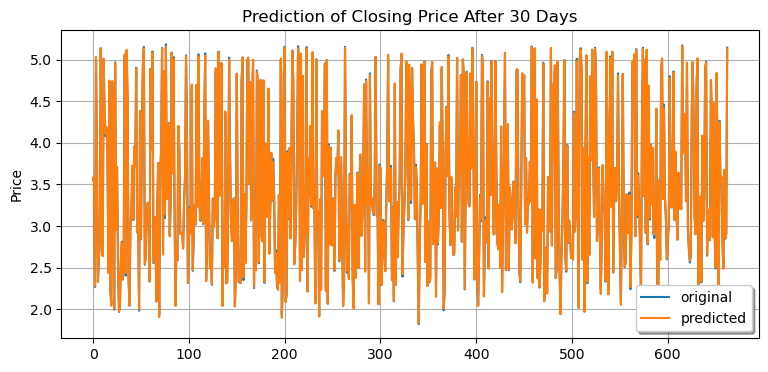

In [246]:
# visualizing in a plot
def plottingTheDifferenceBetweenPredictionAndActualValues(targetOutputVariable_Test, predictedOutputValues):
    x_ax = range(len(targetOutputVariable_Test))
    plt.figure(figsize=(9, 4))
    plt.plot(x_ax, targetOutputVariable_Test, label="original")
    plt.plot(x_ax, predictedOutputValues, label="predicted")
    plt.title("Prediction of Closing Price After 30 Days")
    
    plt.ylabel('Price')
    plt.legend(loc='best',fancybox=True, shadow=True)
    plt.grid(True)
    plt.show()

plottingTheDifferenceBetweenPredictionAndActualValues(targetOutputVariable_TestModel1_30Days, predicted_outputForModel1)

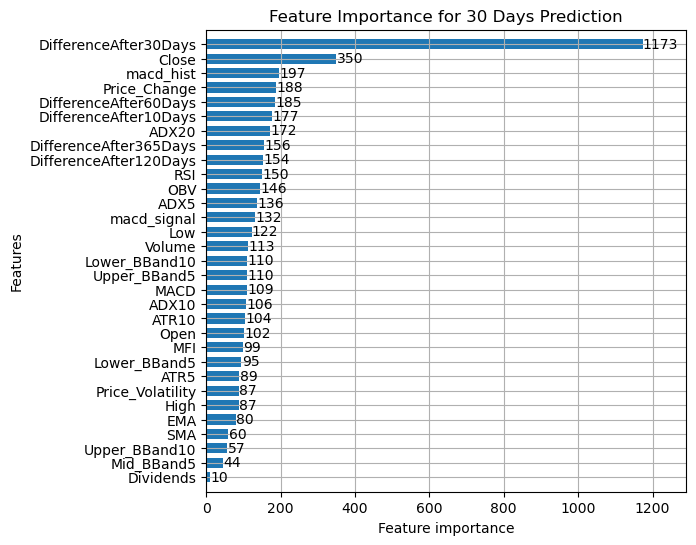

In [247]:
# plotting feature importance
def featureImportancePlot(model,title):
    fig, ax = plt.subplots(figsize=(8,6))
    lgb.plot_importance(model, ax=ax, height=.70)
    ax.set_title(title)
    # adjust the spacing between the y-axis and the left edge of the plot
    plt.subplots_adjust(left=0.3)
    plt.show()

featureImportancePlot(best_modelForModel1,'Feature Importance for 30 Days Prediction')

#### Loading the model and testing on recent data

In [271]:
def splittingTheDatasetOfTheUpdatedInfo(database,nameOfPredictedColumn,predictionDays):
    database = database.iloc[:-predictionDays]
    print(database)
    inputFeatureDatabase = database[['Open','High','Low','Close','Volume','Dividends','Stock Splits','Price Change','Price Volatility','SMA','EMA','ADX5','ADX10','ADX20',
                                     'ATR5','ATR10','RSI', 'Upper_BBand5','Mid_BBand5','Lower_BBand5','Upper_BBand10','Mid_BBand10','Lower_BBand10','MACD','macd_signal','macd_hist',
                                     'OBV','MFI', 'DifferenceAfter10Days','DifferenceAfter30Days','DifferenceAfter60Days','DifferenceAfter120Days','DifferenceAfter365Days']]

    targetOutputVariable = database[[nameOfPredictedColumn]]

    return inputFeatureDatabase, targetOutputVariable

def gettingRecentPredictions(filename,file_path1,predictionDays,predictDays,windowValue):

    #to load the model
    loadedModel1 = pickle.load(open(filename, 'rb'))

    #to predict the output

    #Reading all CSV files in a list
    df = pd.read_csv(file_path1)
    #print(appleDb.to_string()) - to view the original dataframe

    # Convert Date column to datetime object
    df['Date'] = pd.to_datetime(df['Date'], utc= True) #set the utc parameter to True to ensure that the timezone information is preserved

    # Filter rows based on condition - starting from the year 2008
    df = df[pd.to_datetime(df['Date']).dt.year >= 2008]
    df = changeValuesIntoLogs(df)
    df = obtainingExtraFeatures(df,windowValue)
    df = obtainRecentRecords(df)
    lastestInput, targetOutput = splittingTheDatasetOfTheUpdatedInfo(df,predictionDays,predictDays)

    # Create the LGBM Dataset
    lgb_dataset = lgb.Dataset(lastestInput, label=targetOutput)
    predictions = loadedModel1.predict(lastestInput)
    # Set NumPy print options to display the entire array
    np.set_printoptions(threshold=np.inf)

    # Print the predictions
    print(predictions)
    return predictions,df

def determineWorthOfInvestment(df,predictions,threshold):

    # Get the current close price
    current_close_price = df['Close'].iloc[-1]

    # Set the investment threshold (you can adjust this based on your strategy)
    print("Current close price:", current_close_price)
    print("Threshold:", threshold)
    print("Predicted close price:", predictions[-1])
    print ("Threshold",(current_close_price * (1 + threshold)))
    # Compare the predicted close price with the current close price
    if predictions[-1] > (current_close_price * (1 + threshold)):
        print("Invest in the stock.")
    else:
        print("Do not invest in the stock.")

predictions30Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter30Days',30,10)
predictions60Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter60Days',60,10)
predictions120Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter120Days',120,10)
predictions365Days, latestDataset = gettingRecentPredictions(filename,'./UpdatedDatasets/AAPL.csv','ClosePriceAfter365Days',365,10)

                           Date      Open      High       Low     Close  \
7331  2010-01-04 05:00:00+00:00  1.868518  1.873519  1.863586  1.871232   
7332  2010-01-05 05:00:00+00:00  1.873985  1.878588  1.867675  1.872960   
7333  2010-01-06 05:00:00+00:00  1.872959  1.876916  1.855882  1.856925   
7334  2010-01-07 05:00:00+00:00  1.860616  1.861796  1.847783  1.855075   
7335  2010-01-08 05:00:00+00:00  1.853744  1.861795  1.847830  1.861701   
...                         ...       ...       ...       ...       ...   
10663 2023-03-30 04:00:00+00:00  5.083309  5.089111  5.081698  5.088434   
10664 2023-03-31 04:00:00+00:00  5.088927  5.104563  5.085658  5.103957   
10665 2023-04-03 04:00:00+00:00  5.100129  5.112351  5.099825  5.111629   
10666 2023-04-04 04:00:00+00:00  5.114214  5.115653  5.105230  5.108374   
10667 2023-04-05 04:00:00+00:00  5.102986  5.104866  5.084979  5.097020   

          Volume  Dividends  Stock Splits  Price Change  Price Volatility  \
7331   493729600      

#### Stating whether to invest or not 

In [272]:
determineWorthOfInvestment(latestDataset,predictions30Days,0.01)
determineWorthOfInvestment(latestDataset,predictions60Days,0.01)
determineWorthOfInvestment(latestDataset,predictions120Days,0.05)
determineWorthOfInvestment(latestDataset,predictions365Days,0.05)

Current close price: 5.16507166483431
Threshold: 0.01
Predicted close price: 5.070848233722192
Threshold 5.216722381482652
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.01
Predicted close price: 4.983556429679211
Threshold 5.216722381482652
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.05
Predicted close price: 5.0811860777540545
Threshold 5.423325248076026
Do not invest in the stock.
Current close price: 5.16507166483431
Threshold: 0.05
Predicted close price: 4.959560778209311
Threshold 5.423325248076026
Do not invest in the stock.


In [250]:
#if you have different models trained to predict stock prices for different time horizons (e.g., 10 days, 30 days, 60 days, 120 days, and 365 days), and you want to determine whether the user should invest based on the predictions from all these models, you can consider the following approach:

# Obtain the predictions for each time horizon using the respective models.
# python
# Copy code
# predictions_10_days = model_10_days.predict(input_10_days)
# predictions_30_days = model_30_days.predict(input_30_days)
# predictions_60_days = model_60_days.predict(input_60_days)
# predictions_120_days = model_120_days.predict(input_120_days)
# predictions_365_days = model_365_days.predict(input_365_days)
# Here, model_10_days, model_30_days, model_60_days, model_120_days, and model_365_days represent the trained models for their respective time horizons, and input_10_days, input_30_days, input_60_days, input_120_days, and input_365_days represent the input data for each model.

# Determine a rule or criterion to make an investment decision based on the predictions. This could involve setting a threshold or considering a combination of predictions from multiple models. For example, you could decide to invest if the majority of the models predict positive price movement.
# python
# Copy code
# investment_count = 0

# # Check predictions for each time horizon and increment investment_count if positive
# if predictions_10_days > current_price:
#     investment_count += 1
# if predictions_30_days > current_price:
#     investment_count += 1
# if predictions_60_days > current_price:
#     investment_count += 1
# if predictions_120_days > current_price:
#     investment_count += 1
# if predictions_365_days > current_price:
#     investment_count += 1

# # Determine whether to invest based on the investment_count
# if investment_count >= 3:
#     print("Invest in the stock.")
# else:
#     print("Do not invest in the stock.")




# Apologies for overlooking the model saving step. To ensure that you save the models trained for each dataframe, you can modify the previous example by adding the saving step within the loop. Here's an updated version:

# python
# Copy code
# import os
# import joblib

# # Create a directory to save the models
# models_dir = "saved_models"
# os.makedirs(models_dir, exist_ok=True)

# # Iterate over the list of dataframes
# for idx, dataframe in enumerate(dataframes):
#     # Train the model and make predictions
#     predictions = train_and_predict_model(dataframe)

#     # Save the model
#     model_filename = os.path.join(models_dir, f"model_{idx}.joblib")
#     joblib.dump(model, model_filename)

#     # Process the predictions as needed
# In this updated code, we introduce a directory called "saved_models" (you can adjust the name to your preference) where the models will be saved. The os.makedirs() function is used to create the directory if it doesn't already exist.

# Inside the loop, after training the model and generating predictions, the joblib.dump() function is used to save the trained model to a file. The model is saved with a unique filename, such as "model_0.joblib", "model_1.joblib", etc., based on the idx variable.

# Make sure to replace model in the joblib.dump() function with the actual trained model object that you want to save.

# By incorporating this modification, you can save the models for each dataframe within the loop, enabling you to use them for future predictions.




In [251]:
# # Assuming you have a list of dataframes 'dataframes' and a list of models 'models'

# # Define a dictionary to store investment scores
# investment_scores = {}

# # Iterate over dataframes and models
# for dataframe in dataframes:
#     for model in models:
#         # Make predictions for each stock
#         predictions = model.predict(dataframe)
        
#         # Calculate investment scores and update the dictionary
#         for i, stock in enumerate(dataframe['Stock']):
#             investment_scores.setdefault(stock, 0)
#             investment_scores[stock] += predictions[i]  # Adjust this based on your investment score criterion

# # Sort the investment scores in descending order
# sorted_scores = sorted(investment_scores.items(), key=lambda x: x[1], reverse=True)

# # Print the top 5 stocks to invest in
# print("Top 5 stocks to invest in:")
# for stock, score in sorted_scores[:5]:
#     print(stock)

# # Print the worst 5 stocks to avoid
# print("\nWorst 5 stocks to avoid:")
# for stock, score in sorted_scores[-5:]:
#     print(stock)

In [252]:
# To distinguish between the models when saving them for each dataframe, you can include information about the dataframe and the prediction horizon in the filename or the saved model object. Here's an example of how you can modify the code to save the models with distinctive names:

# python
# Copy code
# import os
# import joblib

# # Create a directory to save the models
# models_dir = "saved_models"
# os.makedirs(models_dir, exist_ok=True)

# # Iterate over the list of dataframes
# for idx, dataframe in enumerate(dataframes):
#     # Iterate over the prediction horizons
#     for prediction_horizon in [30, 60, 120, 365]:
#         # Train the model and make predictions
#         predictions = train_and_predict_model(dataframe, prediction_horizon)

#         # Save the model with a distinctive name
#         model_filename = os.path.join(models_dir, f"model_{idx}_horizon_{prediction_horizon}.joblib")
#         joblib.dump(model, model_filename)

#         # Process the predictions as needed
# In this modified code, we include an additional loop to iterate over the prediction horizons for each dataframe. Within this loop, you train the model and make predictions using the corresponding prediction horizon. The train_and_predict_model() function should be updated accordingly to handle the prediction horizon parameter.

# The models are saved with distinctive names by incorporating the idx variable (representing the dataframe index) and the prediction_horizon value in the filename. For example, the saved models could have filenames like "model_0_horizon_30.joblib", "model_0_horizon_60.joblib", and so on.

# By including the dataframe index and prediction horizon in the filenames, you can easily identify which model corresponds to which dataframe and prediction horizon when you need to load and use them in the future.